In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Latex
from scipy import stats 
from scipy import signal
from scipy import interpolate
from scipy.io import wavfile 
import seaborn as sns
import matplotlib as mpl
from matplotlib.font_manager import fontManager  
import os 
import lasio
from mpl_toolkits.mplot3d import Axes3D
import cv2
from scipy import io

In [2]:
"""
读取仿真数据
"""
data=io.loadmat('data.mat')['data']
label=io.loadmat('label.mat')['label']
slowness=io.loadmat('slowness.mat')['slowness']

sim=io.loadmat('sim_data.mat')['sim']
length=io.loadmat('sim_data_lens.mat')['length']
waves=io.loadmat('waves.mat')['wave']
dataS =io.loadmat('dataS.mat')['dataS']

In [3]:
#仿真有些地方找到了延时，是不是因为是设计用来仿真的波形比较特殊，许多地方为0？
#仿真波形，大部分为0,稀释了有用部分数据
#一些文章中的数据长度都是2w左右，虽然其tap数可能很小5，或9形式

n_samples =1000

s1 =sim[60,0,0:n_samples]
s2 =sim[30,2,0:n_samples]
s3 =sim[20,1,0:n_samples]

#s2 =np.zeros((n_samples,),dtype=float)
#s3 =np.zeros((n_samples,),dtype=float)
#s2[0:(n_samples//30)] =np.random.laplace(loc=0,scale=3.0,size=(n_samples//30,))
#s3[0:(n_samples//10)] =np.random.uniform(low=-4,high=4,size=(n_samples//10))

n_samples =8000
s1 =dataS[:,0]
s2 =dataS[:,1]
s3 =dataS[:,2]







time = np.linspace(0, 8, n_samples)

d1 =2
d2 =7
d3 =12

d1 =2
d2 =7
d3 =12


delay =np.zeros((3,3),dtype=int)
delay[0][0]=0;delay[0][1]=d2;delay[0][2]=d3;
delay[1][1]=0;delay[1][0]=d1;delay[1][2]=2*d3
delay[2][2]=0;delay[2][0]=2*d1;delay[2][1]=2*d2

s1 =(s1-np.mean(s1))/np.std(s1)

s2 =(s2-np.mean(s2))/np.std(s2)
s3 =(s3-np.mean(s3))/np.std(s3)

x1 =np.zeros((100+n_samples,),dtype=float)
x2 =np.zeros((100+n_samples,),dtype=float)
x3 =np.zeros((100+n_samples,),dtype=float)

x11 =np.zeros((100+n_samples,),dtype=float)
x22 =np.zeros((100+n_samples,),dtype=float)
x33 =np.zeros((100+n_samples,),dtype=float)

ss1 =np.zeros((2*n_samples,),dtype=float)
ss2 =np.zeros((2*n_samples,),dtype=float)
ss3 =np.zeros((2*n_samples,),dtype=float)


#标准的bss问题
x1[50:(n_samples+50)] =1.0*s1
x1[(30+d2):(30+d2+n_samples)] =0.6*s2 +x1[(30+d2):(30+d2+n_samples)]
x1[(70+d3):(70+d3+n_samples)] =0.7*s3 +x1[(70+d3):(70+d3+n_samples)]
x2[30:(n_samples+30)] =1.0*s2
x2[(50+d1):(50+d1+n_samples)]=0.6*s1 +x2[(50+d1):(50+d1+n_samples)]
x2[(70+2*d3):(70+2*d3+n_samples)] =0.7*s3 +x2[(70+2*d3):(70+2*d3+n_samples)]
x3[70:(n_samples+70)] =1.0*s3
x3[(50+2*d1):(50+2*d1+n_samples)]=0.6*s1 +x3[(50+2*d1):(50+2*d1+n_samples)]
x3[(30+2*d2):(30+2*d2+n_samples)] =0.7*s2 +x3[(30+2*d2):(30+2*d2+n_samples)]


"""
#阵列声波问题
x1[50:(n_samples+50)] =1.0*s1
x1[(30):(30+n_samples)] =1.0*s2 +x1[(30):(30+n_samples)]
x1[(70):(70+n_samples)] =1.0*s3 +x1[(70):(70+n_samples)]
x2[30+d2:(n_samples+30+d2)] =1.0*s2
x2[(50+d1):(50+d1+n_samples)]=1.0*s1 +x2[(50+d1):(50+d1+n_samples)]
x2[(70+d3):(70+d3+n_samples)] =1.0*s3 +x2[(70+d3):(70+d3+n_samples)]
x3[70+2*d3:(n_samples+70+2*d3)] =1.0*s3
x3[(50+2*d1):(50+2*d1+n_samples)]=1.0*s1 +x3[(50+2*d1):(50+2*d1+n_samples)]
x3[(30+2*d2):(30+2*d2+n_samples)] =1.0*s2 +x3[(30+2*d2):(30+2*d2+n_samples)]


delay[0][0]=0;delay[0][1]=0;delay[0][2]=0;
delay[1][1]=d2;delay[1][0]=d1;delay[1][2]=d3
delay[2][2]=2*d3;delay[2][0]=2*d1;delay[2][1]=2*d2
"""

x11[(50):(50+n_samples)]=s1
x22[(50+d1):(50+d1+n_samples)]=s2
x33[(50+2*d1):(50+2*d1+n_samples)]=s3 



X_sim =np.c_[x1,x2,x3].copy()
 
[N,p] =X_sim.shape

X=X_sim

"""
X_sim2 =np.c_[data[26,:,0],data[26,:,1],data[26,:,2]]
X_sim  =np.zeros((X_sim2.shape[0]//6,X_sim2.shape[1]),dtype=float)
for i in range(X_sim.shape[0]):
    X_sim[i,:]=X_sim2[i*6,:]
X_real =np.c_[waves[26,:,0],waves[26,:,1],waves[26,:,2]]  
#X =(X-np.mean(X,axis=0)[np.newaxis,:])/np.std(X,axis=0)[np.newaxis,:]
"""
X_real =np.zeros((750,3),dtype=float)
X_real[50:(50+660),:] =np.c_[waves[26,:,0],waves[26,:,1],waves[26,:,2]] 
#S =np.c_[s1,s2,s3]
#io.savemat('./dataS.mat', {'dataS':S})
S = np.c_[s1, s2, s3]
S += 0.2 * np.random.normal(size=S.shape)
S/= S.std(axis=0)

A= np.array([[1, 1, 1], [0.5, 2, 1.0], [1.5, 1.0, 2.0]])
X_ins= np.dot(S, A.T)

In [4]:
"""
辅助函数
"""
def sigmoid(x):
    return  np.exp(x)/(1.0+np.exp(x))
def tanh(x):
    a =np.exp(x)
    b =np.exp(-1.0*x)
    return ((a-b)/(a+b))
def cosh(x):
    a =np.exp(x)
    b =np.exp(-1.0*x)
    return (a+b)/2
def sign(x):
    if(x>0):
        return 1.0
    else:
        return -1.0

def removewave(X,ref,M=50,tol=1e-3):
    [N,p] =X.shape
    #print('N ',N,' p ',p )
    y =np.zeros((N+2*M,p),dtype=float)
    y[M:N+M,:] =X.copy()
    Xc =np.zeros((N+2*M,2*M+1),dtype=float)
    #print('Xc,shape ',Xc.shape)
    #print('ref.shape ',ref.shape)
    for i in range(2*M+1):
        Xc[i:N+i,i] =ref
    corrs =np.zeros((p,2*M+1),dtype=float)
    for i in range(p):
        corrs[i,:] =np.sum(np.multiply(Xc,y[:,i][:,np.newaxis]),axis=0)/np.sum(Xc*Xc,axis=0)
        max_val =np.max(abs(corrs[i,:]))
        #print('corrs max ',max_val)
        index   =np.argmax(abs(corrs[i,:]))
        while(max_val>tol):
            #print('max_val ',max_val)
            y[:,i] =y[:,i] -(corrs[i,index]*Xc[:,index])
            corrs[i,:] =np.sum(np.multiply(Xc,y[:,i][:,np.newaxis]),axis=0)/np.sum(Xc*Xc,axis=0)
            max_val =np.max(abs(corrs[i,:]))
            index   =np.argmax(abs(corrs[i,:]))
            break
    #plt.subplots(figsize=(12,6))
    #plt.plot(np.linspace(0,N,N),ref,'-b')
    #plt.subplots(figsize=(12,6))
    #for i in range(p):
    #    plt.subplot(p,2,i+1)
    #    plt.plot(np.linspace(0,N,N),X[:,i],'-b')
    #    plt.subplot(p,2,p+i+1)
    #    plt.plot(np.linspace(0,N,N),y[M:N+M,i],'-g')
    return y[M:N+M,:]


def whiten(X):  
    [N,p] =X.shape
    w,v =np.linalg.eig(X.T@X/N)
    B =np.diag(1.0/np.sqrt(w))@v.T
    X1 =(B@X.T).T
    #print(np.linalg.det(X1.T@X1/N))
    return X1

def g(x,choice,order,eps=1e-14):
    if(order==0):
        if(choice=="sup"):
            a2=1.000
            return (-1.0/a2)*np.exp(-1.0*a2*x*x/2)
        elif(choice=='sub'):
            t =x*x
            return (1.0/4)*t*t
        else:
            a1=1.5
            return (1.0/a1)*np.log(a1*x+eps)
    elif(order==1):
        if(choice=='sup'):
            a2 =1.000
            return x*np.exp(-1.0*a2*(x*x)/2)
        elif(choice=='sub'):
            return x*x*x
        else:
            a1=1.5
            return tanh(a1*x)
    elif(order==2):
        if(choice=='sup'):
            a2=1.005
            t =np.exp(-1.0*a2*(x*x)/2)
            return t-a2*x*x*t
        elif(choice=='sub'):
            return 3*x*x
        else:
            a1 =1.5
            return a1*(1-np.square(tanh(a1*x)))
    else:
        print('err')
        

        
#直接用正交化为什么不行，会不会本质什么作用都没有。-->瞬时的正交化和卷积的正交化
#这样特征选择，避免权重向量的wiggly,用尽量少的方式来表示
#但是现在是可逆矩阵，有必要这样吗。
def step_wise_regression(A,b,tol,p):
    r =b
    #corr = np.sum(np.multiply(A,r),axis=0)/(np.sqrt(np.sum(np.square(A),axis=0))*np.linalg.norm(r))
    corr = np.sum(np.multiply(A,r),axis=0)/(np.sum(np.square(A),axis=0))
    k =0
    x =np.zeros((b.shape),dtype=float)
    while(np.max(np.abs(corr))>tol and k<p):
        print('k ',k,' corr ',np.max(np.abs(corr)))
        index =np.argmax(np.abs(corr))
        print('index ',index)
        print('rss ',np.sum(np.square(A@x-b)))
        c =np.sum(np.multiply(A[:,index],r))/np.sum(np.square(A[:,index]))
        x[index,0] =x[index,0] +c
        print('before r ',np.linalg.norm(r))
        r = r -c*(A[:,index][:,np.newaxis])
        print('after r ',np.linalg.norm(r))
        #corr = np.sum(np.multiply(A,r),axis=0)/(np.sqrt(np.sum(np.square(A),axis=0))*np.linalg.norm(r))
        corr = np.sum(np.multiply(A,r),axis=0)/(np.sum(np.square(A),axis=0))
        k = k+1
    return x
        

In [13]:
#M选择的太大，会使得效果不好，那么该怎么约束。
#这里是不是一种新的白化方法，可以替代现在卷积下的酉正交化？
def TimeDelayDecorrelation3(X,M=25,R=25,lda1=0.0,lda2=0.0,lda3=0.0,lda4=0.0,K=1.0,alpha=1.0):
    [N,p]=X.shape
    X1=np.zeros((N+M,p),dtype=float)
    X1[M:N+M,:]=X.copy()
    X1 =(X1-np.mean(X1,axis=0))/np.std(X1,axis=0)
    XX =np.zeros((N+2*R,p*M),dtype=float)
    W =np.zeros((p*M,p),dtype=float)
    for i in range(N):
        for j in range(p):
            XX[R+i,j*M:(j+1)*M]=np.flip(X1[i+1:i+1+M,j],axis=0)
    print('before rank(XX) ',np.linalg.matrix_rank(XX))   #计算出来白化前后矩阵是满列秩的，这和我之前想的不一样啊
    #XX[R:R+N,:]=whiten(XX[R:R+N,:])    #需要白化。
    #XX =whiten(XX)这里白化不影响。
    print('after  rank(XX) ',np.linalg.matrix_rank(XX))
    for i in range(p):
        for j in range(p):
            W[j*M,i]=1.0
        
    W_last =np.zeros((p*M,p),dtype=float)
    
    Rs =np.zeros((2*R+1,p*M,p*M),dtype=float)
    for i in range(N):
        for l in range(2*R+1):
            Rs[l,:,:] =Rs[l,:,:] +XX[R+i,:][:,np.newaxis]@XX[R+i+l-R,:][np.newaxis,:]
    Rs =Rs/N
    
    for l in range(2*R+1):
        print('Rs[',l,'] ',np.linalg.norm(Rs[l,:,:]-Rs[l,:,:].T))
    
    maxiters =500
    k =-1
    tol=1e-14
    eta =0.01
    alpha=0.05
    t0 =maxiters/20
    H =np.zeros((maxiters,),dtype=float)
    E =np.zeros((maxiters,p),dtype=float)
    B=np.zeros((p*M,p*M),dtype=float)
    G=np.zeros((p*M,p*M),dtype=float)
    mask =np.zeros((p,),dtype=bool)
    order =np.arange(p)
    Ws =np.zeros((maxiters,p*M,p),dtype=float)
    
    
    F  =np.zeros((p*M-2,p*M),dtype=float)     #使得权向量光滑曲率小
    Z  =np.zeros((p*M-1,p*M),dtype=float)
    for i in range(p*M-1):
        Z[i,i]=1.0;Z[i,i+1]=-1.0;
    for i in range(p*M-2):
        F[i,i]=1.0;F[i,i+1]=-2.0;F[i,i+2]=1.0;
    D  =np.zeros((N+2*R-1,N+2*R),dtype=float) #使输出信号光滑  lda=10,5,似乎得到结果不错 Q=50,R=50,不白化 
                                              #d1 =5  d2 =10  d3 =15
    for i in range(N-1+2*R):
        D[i,i]=-1.0;D[i,i+1]=1.0;
    D = D@XX

    while(np.linalg.norm(W-W_last)>tol):
        if(k==(maxiters-1)):
            break
        else:
            k =k +1
        print('k ',k,' ',np.linalg.norm(W-W_last))

        W_last =W.copy()

        for i in range(p):

            Q =np.zeros((p*M,p*M),dtype=float)
            for j in range(p):
                if(j!=i):
                    Q =Q +W[:,j][:,np.newaxis]@W[:,j][np.newaxis,:]
            
            G =np.zeros((p*M,p*M),dtype=float)+lda1*D.T@D+lda2*F.T@F+lda3*Z.T@Z
            for l in range(2*R+1):
                G =G +Rs[l,:,:]@Q@Rs[2*R-l,:,:]
            
            G =G+lda1*D.T@D+lda2*F.T@F+lda3*Z.T@Z
            print('norm(G-G.T) ',np.linalg.norm(G-G.T))  #是对称矩阵
            
            ww =np.zeros((p*M,1),dtype=float)
            ww[0,0]=1.0
            
            Gn =np.zeros((p*M,p*M),dtype=float)
            index12=0
            index21=0
            index22=0
            
            for m in range(p):
                for n in range(p):
                    if(m==i and n==i):
                        Gn[0:M,0:M] =G[m*M:(m+1)*M,n*M:(n+1)*M]
                    elif(m==i and n!=i):
                        c =index12%(p-1)
                        Gn[0:M,(c+1)*M:(c+2)*M]=G[m*M:(m+1)*M,n*M:(n+1)*M]
                        index12 =index12+1
                    elif(m!=i and n==i):
                        r =index21%(p-1)
                        Gn[(r+1)*M:(r+2)*M,0:M]=G[m*M:(m+1)*M,n*M:(n+1)*M]
                        index21 =index21+1
                    else:
                        r =index22//(p-1)
                        c =index22%(p-1)
                        Gn[(r+1)*M:(r+2)*M,(c+1)*M:(c+2)*M]=G[m*M:(m+1)*M,n*M:(n+1)*M]
                        index22 =index22+1
            
            G11=Gn[0,0]
            G12=Gn[0,1:p*M]
            G21=Gn[1:p*M,0]
            G22=Gn[1:p*M,1:p*M]
            
            
            """
            ww_last =np.random.normal(loc=0,scale=1.0,size=(p*M,1))
            ww_last[0,0]=1.0
            tol =1e-5
            eps =1e-16
            eta =0.0005  #学习率设置问题，太大太小，影响收敛
            b=0
            b0 =40
            mu =0.5*np.eye(p*M-1)
            while(np.linalg.norm(ww-ww_last)>tol):
                b =b +1
                print('norm(w-w_last) ',np.linalg.norm(ww-ww_last))
                ww_last[1:p*M,0]=ww[1:p*M,0].copy()
                dww =2*G21+(2*G22@(ww_last[1:p*M]))[:,0]+2*alpha*(np.linalg.norm(ww_last[1:p*M,0],ord=1)-1.0)*\
                (ww_last[1:p*M,0]/(eps+abs(ww_last[1:p*M,0])))
                ww[1:p*M,0] =ww_last[1:p*M,0]-eta*(1.0/(1+b/b0))*dww
                dww
            print('ww ',ww)
            """
            
                
                
            
            ww[1:p*M,0] =(-1.0*np.linalg.inv(G22)@(G21[:,np.newaxis]))[:,0]
            index0 =0
            for j in range(p):
                if(j==i):
                    W[i*M:(i+1)*M,i]=ww[0:M,0]*1.0
                else:
                    W[j*M:(j+1)*M,i]=ww[(index0+1)*M:(index0+2)*M,0]*1.0
                    index0 =index0+1
                
                    
                        
            
            
          
            
        
            E[k,i] =(W[:,i][np.newaxis,:]@G@W[:,i][:,np.newaxis])[0][0]
            

            
        H[k] =np.sum(E[k,:])

        Ws[k,:,:]=W.copy()
        print('H ',H[k])
        print('E ',E[k,:])
        
    E[0,:]=0
    H[0]=0
    plt.subplots(figsize=(12,6))
    plt.plot(np.linspace(0,maxiters,maxiters),H,'-b',label='H')
    plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,maxiters,maxiters),E[:,i],'-b',label=('E'+str(i)))
        plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        print('w',i,' ',np.linalg.norm(W[:,i],ord=1))
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,W.shape[0],W.shape[0]),W[:,i],'-b',label=('w'+str(i)))
        plt.legend()
    
    y =XX[R:N+R]@W
    kurts =np.zeros((p,),dtype=float)
    z =np.power(y,2)
    kurts = np.mean(np.power(z,2),axis=0)-3*np.square(np.mean(z,axis=0))
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,y.shape[0],y.shape[0]),y[:,i],'-b',label=('y'+str(i)))
        plt.legend()
        
    Xy =np.zeros((N+4*R,4*R+1),dtype=float)
    yy =np.zeros((N,p*p),dtype=float)
    for i in range(p):
        Xy =0*Xy
        for j in range(4*R+1):
            Xy[j:N+j,j]=y[:,i]
        beta =np.linalg.pinv(Xy[2*R:N+2*R,:])@y
        yy[:,i*p:(i+1)*p] =Xy[2*R:N+2*R,:]@beta
    
    plt.subplots(figsize=(12,6))
    for i in range(p*p):
        plt.subplot(p,p,i+1)
        plt.plot(np.linspace(0,N,N),yy[:,i],'-b',label=('s'+str(int(i/3))+str(int(i%3))))
        plt.legend()
    
    dist =np.zeros((maxiters,),dtype=float)
    for i in range(maxiters):
        dist[i]=np.linalg.norm(Ws[i]-W)
    
    plt.subplots(figsize=(12,6))
    plt.plot(np.linspace(0,maxiters,maxiters),dist,'-b',label='dist')
    plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,y.shape[0],y.shape[0]),y[:,i],'-b',label='y'+str(i))
        plt.legend()
    plt.suptitle('speech music decovolution : demixing ')
    plt.savefig("./pics/speech_music_de_demix2.png")
    
        
    
    return [kurts,W]

before rank(XX)  153
after  rank(XX)  153
Rs[ 0 ]  3.1168144708842216
Rs[ 1 ]  2.983910438953155
Rs[ 2 ]  3.110111329053403
Rs[ 3 ]  3.0375044923130736
Rs[ 4 ]  2.9456761155612594
Rs[ 5 ]  2.8005214090673234
Rs[ 6 ]  2.947669259352162
Rs[ 7 ]  2.913730826410642
Rs[ 8 ]  2.8334245628885304
Rs[ 9 ]  3.094990450625794
Rs[ 10 ]  2.891534357599247
Rs[ 11 ]  2.9058858400363574
Rs[ 12 ]  2.88193415724765
Rs[ 13 ]  2.9668332241000246
Rs[ 14 ]  2.9918833542221352
Rs[ 15 ]  3.196794605046052
Rs[ 16 ]  3.023117426673699
Rs[ 17 ]  2.9728426472238776
Rs[ 18 ]  2.989470428821005
Rs[ 19 ]  3.0249941249100702
Rs[ 20 ]  3.02026154223659
Rs[ 21 ]  3.0317944747000403
Rs[ 22 ]  3.058559826251294
Rs[ 23 ]  3.100993720822677
Rs[ 24 ]  3.055432688231093
Rs[ 25 ]  2.899820869188386
Rs[ 26 ]  2.987688736930873
Rs[ 27 ]  3.1060562641108773
Rs[ 28 ]  3.1146744816330614
Rs[ 29 ]  3.147158849454322
Rs[ 30 ]  3.0806852103564193
Rs[ 31 ]  3.1152225368018382
Rs[ 32 ]  3.140582808665382
Rs[ 33 ]  3.0689626108277817
Rs

k  0   3.0
norm(G-G.T)  1.5143981986942325e-14
norm(G-G.T)  3.92530614853682e-13
norm(G-G.T)  3.840372566760614e-13
H  16.75429745259059
E  [10.18251146  5.76180284  0.80998315]
k  1   8.379863393023433
norm(G-G.T)  2.1427838815197384e-14
norm(G-G.T)  2.5716596681134262e-14
norm(G-G.T)  3.5795318590463896e-14
H  0.18368408845314388
E  [0.1281215  0.05326128 0.00230131]
k  2   7.578688069184824
norm(G-G.T)  3.571797560292118e-14
norm(G-G.T)  2.6698851081606554e-14
norm(G-G.T)  4.9521255671723695e-14
H  0.005555158149936788
E  [0.004489   0.00095944 0.00010672]
k  3   1.2706711430408424
norm(G-G.T)  5.42877352391272e-14
norm(G-G.T)  3.207687304036153e-14
norm(G-G.T)  5.883120525266224e-14
H  0.00024905838781264053
E  [1.67536631e-04 7.14507110e-05 1.00710455e-05]
k  4   0.9748354038848291
norm(G-G.T)  7.134923124962641e-14
norm(G-G.T)  4.690435437540433e-14
norm(G-G.T)  6.78633188649711e-14
H  1.6367742760997108e-05
E  [1.11145182e-05 4.82103226e-06 4.32192268e-07]
k  5   0.9813323235114

norm(G-G.T)  2.5619632711678877e-13
H  2.7621951877531588e-09
E  [5.96644753e-10 1.21546381e-09 9.50086626e-10]
k  40   0.31092568188899156
norm(G-G.T)  2.7678122748519635e-13
norm(G-G.T)  1.2376106228884105e-13
norm(G-G.T)  2.4129974983708136e-13
H  2.1849093943860495e-09
E  [4.82017612e-10 1.05336156e-09 6.49530226e-10]
k  41   0.23086959064954726
norm(G-G.T)  2.805947238036187e-13
norm(G-G.T)  1.1996102911451987e-13
norm(G-G.T)  2.816793978039081e-13
H  2.098448855558546e-09
E  [5.46389692e-10 7.65893123e-10 7.86166041e-10]
k  42   0.5460887764827549
norm(G-G.T)  3.1735458629084913e-13
norm(G-G.T)  1.2381193848245576e-13
norm(G-G.T)  2.9531674009513315e-13
H  2.3870063949804915e-09
E  [4.24322285e-10 1.00172629e-09 9.60957821e-10]
k  43   0.3277910083947616
norm(G-G.T)  3.0487643002690216e-13
norm(G-G.T)  1.1240139996590898e-13
norm(G-G.T)  2.766596914101741e-13
H  3.2316526191033327e-09
E  [4.85419544e-10 1.03715740e-09 1.70907567e-09]
k  44   0.3600724823820002
norm(G-G.T)  2.9403

norm(G-G.T)  2.482396412095911e-13
norm(G-G.T)  1.4567056672331864e-13
norm(G-G.T)  2.1684694641184907e-13
H  3.1967695784612837e-09
E  [6.39519786e-10 1.01411629e-09 1.54313350e-09]
k  80   0.3215731662361169
norm(G-G.T)  2.5692393556393443e-13
norm(G-G.T)  1.358773655440161e-13
norm(G-G.T)  1.7826286329691054e-13
H  2.477899907296185e-09
E  [4.68112543e-10 1.27648397e-09 7.33303391e-10]
k  81   0.7982486221953785
norm(G-G.T)  2.3001258544325264e-13
norm(G-G.T)  1.3730866356638581e-13
norm(G-G.T)  1.9112961884243968e-13
H  2.761438478373448e-09
E  [3.62425836e-10 1.04738796e-09 1.35162468e-09]
k  82   0.4959146328729859
norm(G-G.T)  2.32395675721647e-13
norm(G-G.T)  1.395851243849478e-13
norm(G-G.T)  1.8964259317751154e-13
H  2.6903621812819674e-09
E  [4.68697897e-10 1.25038968e-09 9.71274608e-10]
k  83   0.2881487043978299
norm(G-G.T)  2.36926234438248e-13
norm(G-G.T)  1.4108505146327478e-13
norm(G-G.T)  1.8486829475036087e-13
H  3.0915561564307647e-09
E  [3.24652288e-10 1.04497302e-

norm(G-G.T)  2.3878305027025644e-13
norm(G-G.T)  1.376078815110853e-13
norm(G-G.T)  2.1142979988880875e-13
H  1.09364635013844e-08
E  [7.44610027e-10 1.12174247e-09 9.07011100e-09]
k  119   0.5028992936607226
norm(G-G.T)  2.6317333025521033e-13
norm(G-G.T)  1.3878375950210868e-13
norm(G-G.T)  1.482803309227968e-13
H  5.91551222477636e-09
E  [7.86235769e-10 4.89240208e-09 2.36874374e-10]
k  120   1.4320489138835961
norm(G-G.T)  2.044117049890889e-13
norm(G-G.T)  1.3807110741800797e-13
norm(G-G.T)  1.8520236316100862e-13
H  3.132910539341538e-09
E  [4.52567488e-10 2.20403136e-09 4.76311692e-10]
k  121   0.7391748221274733
norm(G-G.T)  2.2199399143897872e-13
norm(G-G.T)  1.2843352575589107e-13
norm(G-G.T)  2.1129993865277527e-13
H  9.904770345813576e-09
E  [8.71850647e-10 5.82271627e-09 3.21020342e-09]
k  122   1.076006821346115
norm(G-G.T)  2.4330743777381237e-13
norm(G-G.T)  1.2619801068427272e-13
norm(G-G.T)  2.4650076232855904e-13
H  7.205127526527349e-09
E  [3.78344417e-09 1.89453046

norm(G-G.T)  1.9050065200040052e-13
norm(G-G.T)  1.3668271682063872e-13
norm(G-G.T)  1.5398226245511925e-13
H  1.8012202006281843e-09
E  [3.81096648e-10 6.48351097e-10 7.71772455e-10]
k  158   0.5691294835216878
norm(G-G.T)  2.073962761774699e-13
norm(G-G.T)  1.404328521708957e-13
norm(G-G.T)  1.5176996956923846e-13
H  2.1288217138312984e-09
E  [3.40280603e-10 8.91977585e-10 8.96563526e-10]
k  159   0.4151710360707041
norm(G-G.T)  2.085626035924543e-13
norm(G-G.T)  1.3732150396772506e-13
norm(G-G.T)  1.4227209633246616e-13
H  2.440150284859792e-09
E  [4.63614051e-10 1.44235866e-09 5.34177572e-10]
k  160   0.2575848752607532
norm(G-G.T)  2.0063025722550718e-13
norm(G-G.T)  1.3464735305535875e-13
norm(G-G.T)  1.6473569063969015e-13
H  2.382056913510596e-09
E  [5.84997415e-10 8.39704994e-10 9.57354504e-10]
k  161   0.6205601140731191
norm(G-G.T)  2.176602424791138e-13
norm(G-G.T)  1.366550242842381e-13
norm(G-G.T)  1.7183582067046237e-13
H  3.606765818979751e-09
E  [6.22999707e-10 2.41276

norm(G-G.T)  1.8386369018538503e-13
norm(G-G.T)  1.486440201566566e-13
H  2.2428402498786064e-09
E  [3.68857841e-10 1.30795818e-09 5.66024228e-10]
k  197   0.6732223684923019
norm(G-G.T)  2.4300850055778785e-13
norm(G-G.T)  2.0428624644172544e-13
norm(G-G.T)  1.5382819457033383e-13
H  2.3916881781214747e-09
E  [7.53598675e-10 5.93628146e-10 1.04446136e-09]
k  198   0.39261606606017346
norm(G-G.T)  2.428669094977694e-13
norm(G-G.T)  1.8591909290287795e-13
norm(G-G.T)  1.5223072572271765e-13
H  3.3887876628786412e-09
E  [3.47584932e-10 1.13650030e-09 1.90470243e-09]
k  199   0.3630961940351613
norm(G-G.T)  2.3324067558782114e-13
norm(G-G.T)  1.8598676709647525e-13
norm(G-G.T)  1.415421395121921e-13
H  3.1050469607084825e-09
E  [7.21704213e-10 1.45686884e-09 9.26473909e-10]
k  200   0.3792974906898539
norm(G-G.T)  2.208914945789671e-13
norm(G-G.T)  1.6874086617987046e-13
norm(G-G.T)  1.567344439058921e-13
H  3.227129305914013e-09
E  [6.22632016e-10 9.71913642e-10 1.63258365e-09]
k  201   

norm(G-G.T)  1.4685273731505462e-13
norm(G-G.T)  1.3773949886481415e-13
H  4.718593566182905e-09
E  [7.93465402e-10 2.04692005e-09 1.87820811e-09]
k  236   0.444894744454739
norm(G-G.T)  2.0751058373843317e-13
norm(G-G.T)  1.5152280390730742e-13
norm(G-G.T)  1.3467176455805208e-13
H  3.004320242586581e-09
E  [5.28040719e-10 1.73200113e-09 7.44278395e-10]
k  237   0.2607659470597694
norm(G-G.T)  2.0483881308688423e-13
norm(G-G.T)  1.5205790981470005e-13
norm(G-G.T)  1.379231033925892e-13
H  2.1705143867196938e-09
E  [3.51315034e-10 1.07827471e-09 7.40924640e-10]
k  238   0.34362362615673847
norm(G-G.T)  2.1257016693978421e-13
norm(G-G.T)  1.602175989993232e-13
norm(G-G.T)  1.5958842348024056e-13
H  3.791469484591934e-09
E  [4.51975770e-10 9.24972335e-10 2.41452138e-09]
k  239   0.5911155595989048
norm(G-G.T)  2.2582118346866533e-13
norm(G-G.T)  1.486146560272388e-13
norm(G-G.T)  1.6824133292338303e-13
H  5.2268104789063205e-09
E  [1.18361836e-09 1.62493605e-09 2.41825608e-09]
k  240   0

norm(G-G.T)  1.7397281660477622e-13
H  4.659915379178001e-09
E  [6.19835624e-10 9.45479195e-10 3.09460056e-09]
k  275   0.7364844184677007
norm(G-G.T)  2.4513412879025995e-13
norm(G-G.T)  1.6541418863744599e-13
norm(G-G.T)  1.3060252357045958e-13
H  3.757877024437273e-09
E  [6.65652425e-10 2.18212729e-09 9.10097312e-10]
k  276   1.0729094184419925
norm(G-G.T)  2.2950893293417425e-13
norm(G-G.T)  1.879900251553659e-13
norm(G-G.T)  1.457449431905849e-13
H  2.1569271727678554e-09
E  [4.31995760e-10 1.23848218e-09 4.86449231e-10]
k  277   0.44007446462991
norm(G-G.T)  2.6268956542618455e-13
norm(G-G.T)  2.0090095378465834e-13
norm(G-G.T)  1.5420676891701312e-13
H  3.177192151080144e-09
E  [3.33177627e-10 2.08549697e-09 7.58517549e-10]
k  278   0.5810920274216964
norm(G-G.T)  2.471473381055825e-13
norm(G-G.T)  1.667562841689252e-13
norm(G-G.T)  1.785731699138226e-13
H  2.7759552025842224e-09
E  [5.95217519e-10 1.45678960e-09 7.23948079e-10]
k  279   1.2694760553224436
norm(G-G.T)  2.2393400

norm(G-G.T)  2.4062868266511347e-13
norm(G-G.T)  1.5417567206208146e-13
norm(G-G.T)  1.4497104258800598e-13
H  4.261968444338806e-09
E  [8.71801871e-10 3.07280803e-09 3.17358545e-10]
k  315   0.9279292130226632
norm(G-G.T)  2.0487491552639294e-13
norm(G-G.T)  1.5671410472124832e-13
norm(G-G.T)  1.8287759934216809e-13
H  8.967185186338824e-09
E  [5.05979247e-10 1.77374218e-09 6.68746376e-09]
k  316   1.0137502849431737
norm(G-G.T)  2.4158066215471823e-13
norm(G-G.T)  1.655946950606057e-13
norm(G-G.T)  1.360528583552378e-13
H  6.671757407177442e-09
E  [2.54526767e-09 3.75423424e-09 3.72255498e-10]
k  317   1.0343106123497952
norm(G-G.T)  2.0914975129021087e-13
norm(G-G.T)  1.5505265831793366e-13
norm(G-G.T)  1.6657918506409206e-13
H  7.715527362720298e-09
E  [6.55402491e-10 9.12578164e-10 6.14754671e-09]
k  318   0.8486605750178466
norm(G-G.T)  2.4186250741556703e-13
norm(G-G.T)  1.6064592212662196e-13
norm(G-G.T)  1.420964673757606e-13
H  5.908449785003606e-09
E  [1.59133666e-09 3.92733

norm(G-G.T)  1.4193411875471278e-13
norm(G-G.T)  1.6396377066831832e-13
H  2.4579233498268574e-09
E  [3.52234448e-10 1.67589222e-09 4.29796677e-10]
k  354   0.7957541549076452
norm(G-G.T)  2.074164996434717e-13
norm(G-G.T)  1.2798982478373737e-13
norm(G-G.T)  1.796087477894741e-13
H  2.8960146472543126e-09
E  [6.98093462e-10 1.69161245e-09 5.06308734e-10]
k  355   0.534500930380821
norm(G-G.T)  2.304196858246386e-13
norm(G-G.T)  1.4521715791629823e-13
norm(G-G.T)  1.888413421128707e-13
H  4.2314760561936426e-09
E  [6.91929065e-10 1.29798072e-09 2.24156627e-09]
k  356   0.4614030329009789
norm(G-G.T)  2.5704464730667215e-13
norm(G-G.T)  1.5280159196250559e-13
norm(G-G.T)  1.910823587085263e-13
H  5.8981902731866166e-09
E  [1.28124408e-09 1.59426031e-09 3.02268589e-09]
k  357   0.2703356214438779
norm(G-G.T)  2.380010187747842e-13
norm(G-G.T)  1.5723196603784502e-13
norm(G-G.T)  1.5599422623812612e-13
H  3.500025411813384e-09
E  [5.03658122e-10 2.59204782e-09 4.04319465e-10]
k  358   0.6

norm(G-G.T)  1.305035111208185e-13
norm(G-G.T)  1.451120851851443e-13
H  2.7738336545925788e-09
E  [5.78017881e-10 9.92190051e-10 1.20362572e-09]
k  393   0.3985108602041339
norm(G-G.T)  2.0635780071531174e-13
norm(G-G.T)  1.4434362722948418e-13
norm(G-G.T)  1.3566492593997514e-13
H  1.7615998534730925e-09
E  [3.43828109e-10 1.07206976e-09 3.45701988e-10]
k  394   0.45704130064192805
norm(G-G.T)  1.973754364481292e-13
norm(G-G.T)  1.2876978692089122e-13
norm(G-G.T)  1.4012315080022324e-13
H  2.7398223841893195e-09
E  [3.55246654e-10 5.29526868e-10 1.85504886e-09]
k  395   0.39619055589792
norm(G-G.T)  1.9605625263747778e-13
norm(G-G.T)  1.3781220629399078e-13
norm(G-G.T)  1.416611928023592e-13
H  2.7286303568444895e-09
E  [5.23047804e-10 1.64235744e-09 5.63225114e-10]
k  396   0.21261471155745837
norm(G-G.T)  1.9997830142267717e-13
norm(G-G.T)  1.38397385453086e-13
norm(G-G.T)  1.4033408981785952e-13
H  4.51112525876648e-09
E  [3.55367266e-10 6.92178404e-10 3.46357959e-09]
k  397   0.2

norm(G-G.T)  2.0412021194455843e-13
norm(G-G.T)  1.5057415258602373e-13
norm(G-G.T)  1.3185581870549453e-13
H  2.0678661237116263e-09
E  [3.07394333e-10 9.44656945e-10 8.15814845e-10]
k  432   0.21503894889592925
norm(G-G.T)  2.0782865259368054e-13
norm(G-G.T)  1.5509793930479845e-13
norm(G-G.T)  1.4019435945848e-13
H  1.5888896066535163e-09
E  [3.17584389e-10 7.25248140e-10 5.46057077e-10]
k  433   0.4076247887015068
norm(G-G.T)  2.108376076736469e-13
norm(G-G.T)  1.5120467048550297e-13
norm(G-G.T)  1.3609029212650946e-13
H  1.6511179605100085e-09
E  [3.17741163e-10 5.75829729e-10 7.57547068e-10]
k  434   0.11313434167936762
norm(G-G.T)  2.0507613277027863e-13
norm(G-G.T)  1.5186553316049473e-13
norm(G-G.T)  1.3458615965400146e-13
H  2.882571067057531e-09
E  [3.34029017e-10 1.09333757e-09 1.45520448e-09]
k  435   0.3383435232112281
norm(G-G.T)  2.0039066902494125e-13
norm(G-G.T)  1.4808852076186848e-13
norm(G-G.T)  1.3344247202503826e-13
H  2.5583672703988828e-09
E  [6.71438071e-10 1.

norm(G-G.T)  1.7712168200599766e-13
norm(G-G.T)  1.2751484828909343e-13
H  1.3662211934231831e-09
E  [2.47605859e-10 6.60634384e-10 4.57980950e-10]
k  471   0.11060505747303061
norm(G-G.T)  2.1923357621803762e-13
norm(G-G.T)  1.658500608773657e-13
norm(G-G.T)  1.2874542621352206e-13
H  2.0089716194080502e-09
E  [3.12126208e-10 1.26514854e-09 4.31696871e-10]
k  472   0.1589315965830217
norm(G-G.T)  2.090206887058611e-13
norm(G-G.T)  1.7286383616205162e-13
norm(G-G.T)  1.2664899574815347e-13
H  1.4641101091897328e-09
E  [5.10620966e-10 5.69678828e-10 3.83810315e-10]
k  473   0.06641089610795423
norm(G-G.T)  2.202589587121761e-13
norm(G-G.T)  1.7527585536644581e-13
norm(G-G.T)  1.293748319465984e-13
H  1.3708651009737375e-09
E  [2.13995062e-10 5.04326435e-10 6.52543603e-10]
k  474   0.0689963613088919
norm(G-G.T)  2.1804966115942348e-13
norm(G-G.T)  1.691721658812269e-13
norm(G-G.T)  1.3084168027821948e-13
H  1.5240275915149105e-09
E  [2.90536247e-10 7.11145733e-10 5.22345611e-10]
k  475 

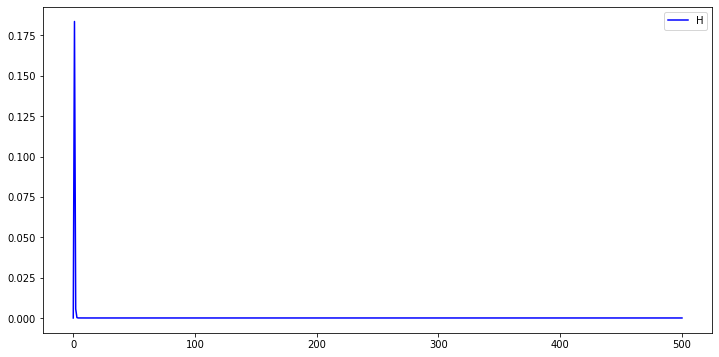

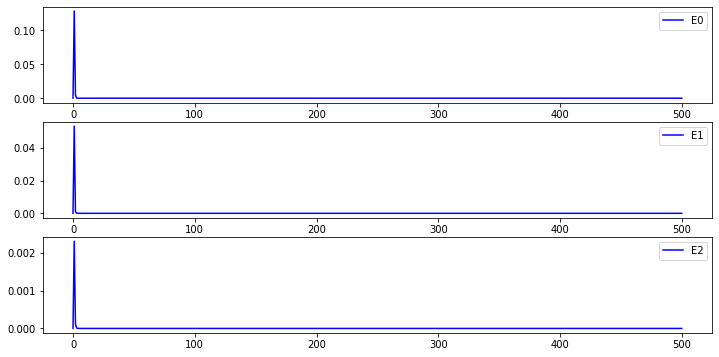

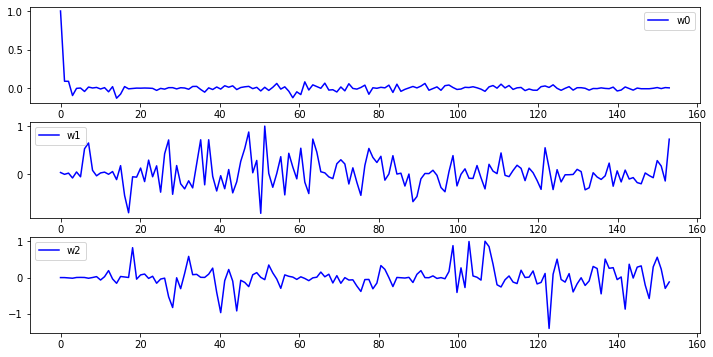

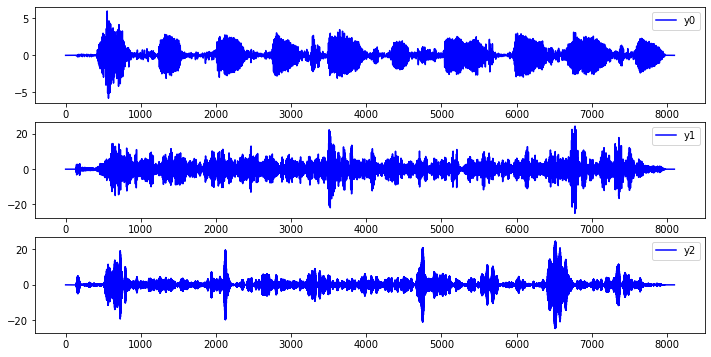

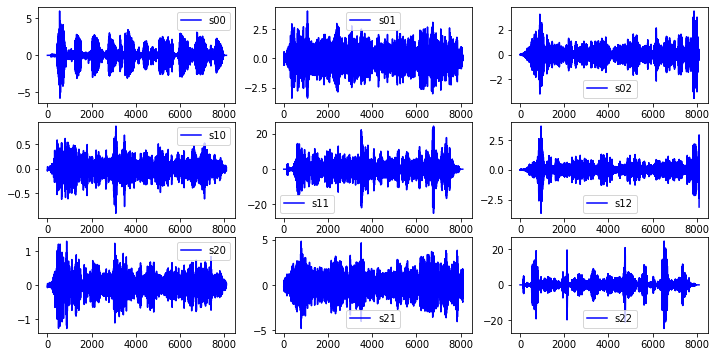

...

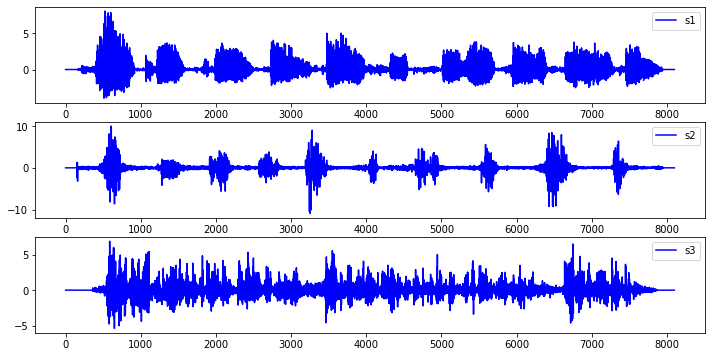

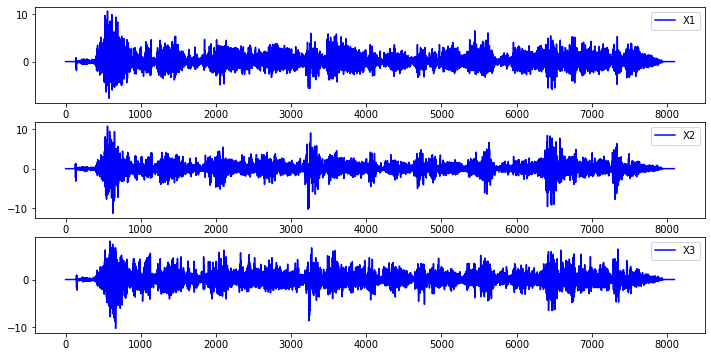

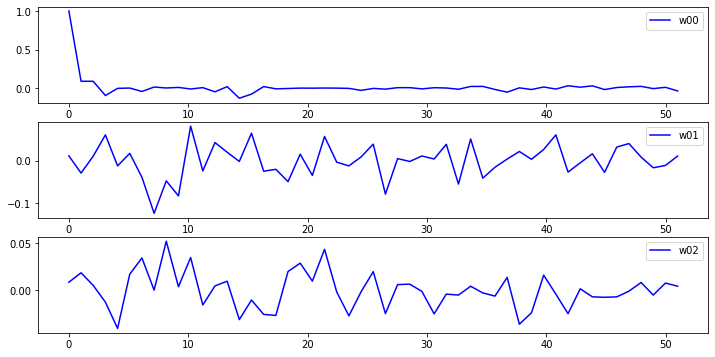

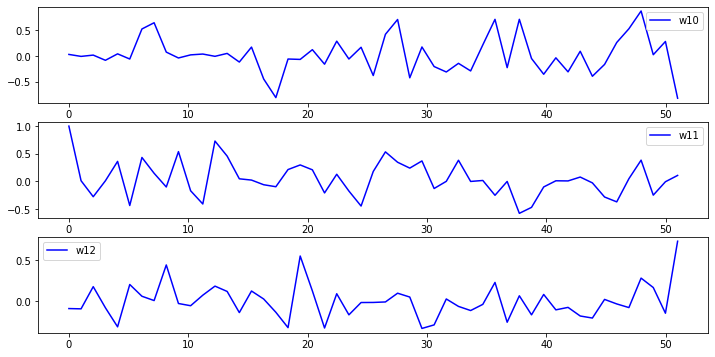

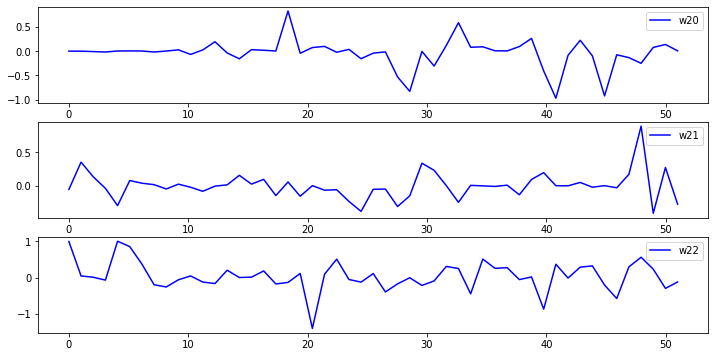

In [14]:
#d1=2,d2=7,d3=5  M=28 这儿可以写一篇短文 试水。

X =X_sim
R=150
M=51
lda1=0.00
lda2=0.0
lda3=0.0
lda4=0.000
K=1.0
alpha=1.0
[kurt,W]=TimeDelayDecorrelation3(X=X,R=R,M=M,lda1=lda1,lda2=lda2,lda3=lda3,lda4=lda4,K=K,alpha=alpha)
print('W ',W)
print('shape(X) ',X.shape)
plt.subplots(figsize=(12,6))
plt.subplot(3,1,1)
plt.plot(np.linspace(0,x11.shape[0],x11.shape[0]),x11,'-b',label='s1')
plt.legend()
plt.subplot(3,1,2)
plt.plot(np.linspace(0,x22.shape[0],x22.shape[0]),x22,'-b',label='s2')
plt.legend()
plt.subplot(3,1,3)
plt.plot(np.linspace(0,x33.shape[0],x33.shape[0]),x33,'-b',label='s3')
plt.legend()
plt.subplots(figsize=(12,6))
plt.subplot(3,1,1)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,0],'-b',label='X1')
plt.legend()
plt.subplot(3,1,2)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,1],'-b',label='X2')
plt.legend()
plt.subplot(3,1,3)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,2],'-b',label='X3')
plt.legend()
for i in range(X.shape[1]):
    plt.subplots(figsize=(12,6))
    for j in range(X.shape[1]):
        plt.subplot(X.shape[1],1,j+1)
        plt.plot(np.linspace(0,M,M),W[j*M:(j+1)*M,i],'-b',label='w'+str(i)+str(j))
        plt.legend()
        

max_index shape  (3, 153)
w 0 0  max index :  0
w 0 1  max index :  23
w 0 2  max index :  16
w 1 0  max index :  12
w 1 1  max index :  0
w 1 2  max index :  3
w 2 0  max index :  29
w 2 1  max index :  17
w 2 2  max index :  10


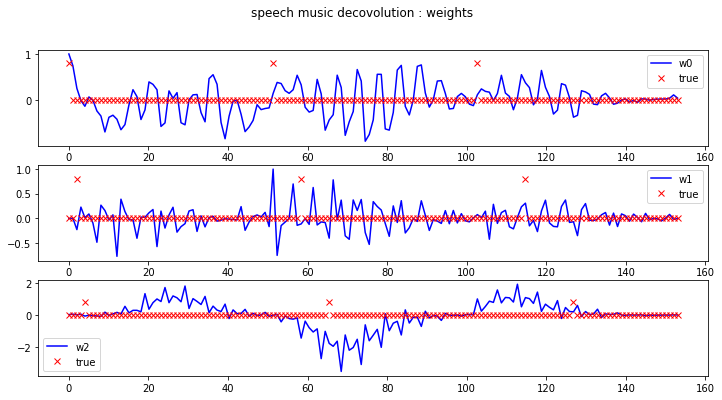

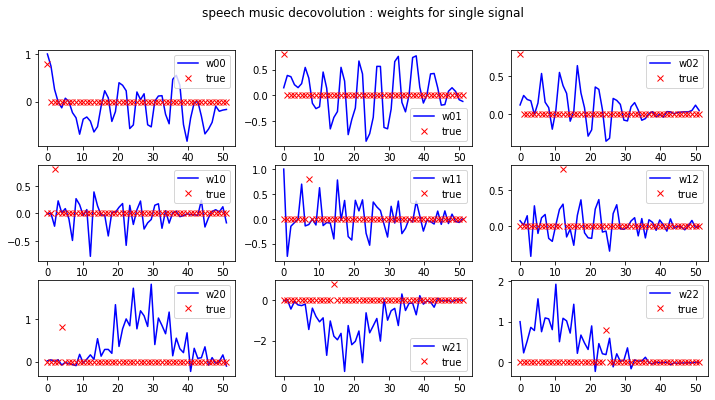

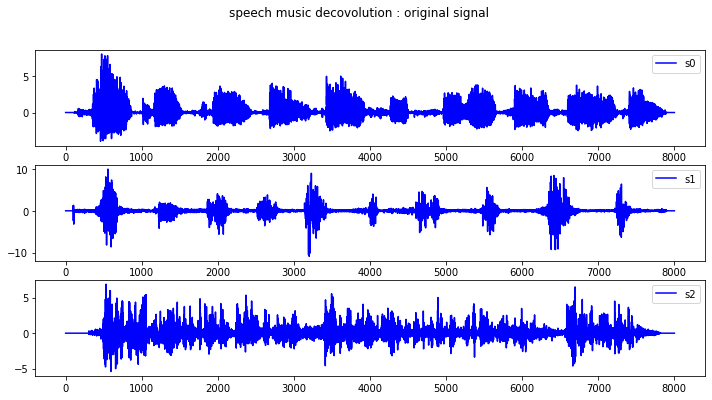

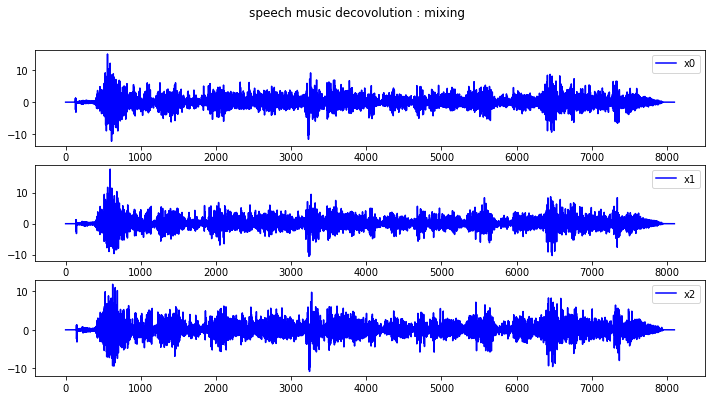

In [7]:
max_index =np.zeros((X.shape[1],X.shape[1]*M))
print('max_index shape ',max_index.shape)
for i in range(X.shape[1]):
    for j in range(X.shape[1]):
        max_index[i,j*M+delay[i][j]]=0.8
        print('w',i,j,' max index : ',np.argmax(abs(W[j*M:(j+1)*M,i])))

offset =np.arange(0,X.shape[1])*M
plt.subplots(figsize=(12,6))

for i in range(X.shape[1]):
    plt.subplot(X.shape[1],1,i+1)
    plt.plot(np.linspace(0,W.shape[0],W.shape[0]),W[:,i],'-b',label='w'+str(i))
    plt.plot(np.linspace(0,W.shape[0],W.shape[0]),max_index[i,:],'rx',label='true')
    plt.legend()
plt.suptitle('speech music decovolution : weights')
plt.savefig("./pics/speech_music_de_weights2.png")

plt.subplots(figsize=(12,6))
for i in range(X.shape[1]):
    for j in range(X.shape[1]):
        plt.subplot(X.shape[1],X.shape[1],i*X.shape[1]+j+1)
        plt.plot(np.linspace(0,M,M),W[j*M:(j+1)*M,i],'-b',label='w'+str(i)+str(j))
        plt.plot(np.linspace(0,M,M),max_index[i,j*M:(j+1)*M],'rx',label='true')
        plt.legend()
plt.suptitle('speech music decovolution : weights for single signal')
plt.savefig("./pics/speech_music_de_single_weights2.png")

S =np.c_[s1,s2,s3]
plt.subplots(figsize=(12,6))
for i in range(X.shape[1]):
    plt.subplot(X.shape[1],1,i+1)
    plt.plot(np.linspace(0,S.shape[0],S.shape[0]),S[:,i],'-b',label='s'+str(i))
    plt.legend()
plt.suptitle('speech music decovolution : original signal')
plt.savefig("./pics/speech_music_de_ori_signal2.png")

plt.subplots(figsize=(12,6))
for i in range(X.shape[1]):
    plt.subplot(X.shape[1],1,i+1)
    plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,i],'-b',label='x'+str(i))
    plt.legend()
plt.suptitle('speech music decovolution : mixing ')
plt.savefig("./pics/speech_music_de_mix2.png")

In [8]:
#为了处理阵列数据加入非因果滤波器
#计算速度太慢
def TimeDelayDecorrelation10(X,M=25,R=25,lda1=0.0,lda2=0.0,lda3=0.0,lda4=0.0,K=1.0,alpha=1.0):
    [N,p]=X.shape
    L=(M-1)//2
    X1=np.zeros((N+2*R+1,p),dtype=float)
    X1[R:N+R,:]=X.copy()
    X1 =(X1-np.mean(X1,axis=0))/np.std(X1,axis=0)
    XX =np.zeros((N+2*R+1,p*M),dtype=float)
    W =np.zeros((p*M,p),dtype=float)
    for i in range(N):
        for j in range(p):
            XX[R+i,j*M:(j*M+L+1)]=np.flip(X1[i+R-L:i+1+R,j],axis=0)
            #print('left  ',XX[R+i,(j*M+L+1):(j+1)*M].shape)
            #print('right ',X1[i+1+R:i+1+R+L,j].shape)
            XX[R+i,(j*M+L+1):(j+1)*M]=X1[i+1+R:i+1+R+L,j]
            
    print('before rank(XX) ',np.linalg.matrix_rank(XX))   #计算出来白化前后矩阵是满列秩的，这和我之前想的不一样啊
    #XX[R:R+N,:]=whiten(XX[R:R+N,:])    #需要白化。
    print('after  rank(XX) ',np.linalg.matrix_rank(XX))
    for i in range(p):
        for j in range(p):
            W[j*M,i]=1.0
        
    W_last =np.zeros((p*M,p),dtype=float)
    
    Rs =np.zeros((2*R+1,p*M,p*M),dtype=float)
    for i in range(N):
        for l in range(2*R+1):
            Rs[l,:,:] =Rs[l,:,:] +XX[R+i,:][:,np.newaxis]@XX[R+i+l-R,:][np.newaxis,:]
    Rs =Rs/N
    
    maxiters =500
    k =-1
    tol=1e-14
    eta =0.01
    alpha=0.05
    t0 =maxiters/20
    H =np.zeros((maxiters,),dtype=float)
    E =np.zeros((maxiters,p),dtype=float)
    B=np.zeros((p*M,p*M),dtype=float)
    G=np.zeros((p*M,p*M),dtype=float)
    mask =np.zeros((p,),dtype=bool)
    order =np.arange(p)
    Ws =np.zeros((maxiters,p*M,p),dtype=float)
    
    


    while(np.linalg.norm(W-W_last)>tol):
        if(k==(maxiters-1)):
            break
        else:
            k =k +1
        print('k ',k,' ',np.linalg.norm(W-W_last))

        W_last =W.copy()

        for i in range(p):

            Q =np.zeros((p*M,p*M),dtype=float)
            for j in range(p):
                if(j!=i):
                    Q =Q +W[:,j][:,np.newaxis]@W[:,j][np.newaxis,:]
            
            G =np.zeros((p*M,p*M),dtype=float)
            for l in range(2*R+1):
                G =G +Rs[l,:,:]@Q@Rs[2*R-l,:,:]
            
            G =G
            print('norm(G-G.T) ',np.linalg.norm(G-G.T))  #是对称矩阵
            
            ww =np.zeros((p*M,1),dtype=float)
            ww[0,0]=1.0
            
            Gn =np.zeros((p*M,p*M),dtype=float)
            index12=0
            index21=0
            index22=0
            
            for m in range(p):
                for n in range(p):
                    if(m==i and n==i):
                        Gn[0:M,0:M] =G[m*M:(m+1)*M,n*M:(n+1)*M]
                    elif(m==i and n!=i):
                        c =index12%(p-1)
                        Gn[0:M,(c+1)*M:(c+2)*M]=G[m*M:(m+1)*M,n*M:(n+1)*M]
                        index12 =index12+1
                    elif(m!=i and n==i):
                        r =index21%(p-1)
                        Gn[(r+1)*M:(r+2)*M,0:M]=G[m*M:(m+1)*M,n*M:(n+1)*M]
                        index21 =index21+1
                    else:
                        r =index22//(p-1)
                        c =index22%(p-1)
                        Gn[(r+1)*M:(r+2)*M,(c+1)*M:(c+2)*M]=G[m*M:(m+1)*M,n*M:(n+1)*M]
                        index22 =index22+1
            
            G11=Gn[0,0]
            G12=Gn[0,1:p*M]
            G21=Gn[1:p*M,0]
            G22=Gn[1:p*M,1:p*M]
            
            
            """
            ww_last =np.random.normal(loc=0,scale=1.0,size=(p*M,1))
            ww_last[0,0]=1.0
            tol =1e-5
            eps =1e-16
            eta =0.0005  #学习率设置问题，太大太小，影响收敛
            b=0
            b0 =40
            mu =0.5*np.eye(p*M-1)
            while(np.linalg.norm(ww-ww_last)>tol):
                b =b +1
                print('norm(w-w_last) ',np.linalg.norm(ww-ww_last))
                ww_last[1:p*M,0]=ww[1:p*M,0].copy()
                dww =2*G21+(2*G22@(ww_last[1:p*M]))[:,0]+2*alpha*(np.linalg.norm(ww_last[1:p*M,0],ord=1)-1.0)*\
                (ww_last[1:p*M,0]/(eps+abs(ww_last[1:p*M,0])))
                ww[1:p*M,0] =ww_last[1:p*M,0]-eta*(1.0/(1+b/b0))*dww
                dww
            print('ww ',ww)
            """
            
                
                
            
            ww[1:p*M,0] =(-1.0*np.linalg.inv(G22)@(G21[:,np.newaxis]))[:,0]
            index0 =0
            for j in range(p):
                if(j==i):
                    W[j*M:(j+1)*M,i]=ww[0:M,0]*1.0
                else:
                    W[j*M:(j+1)*M,i]=ww[(index0+1)*M:(index0+2)*M,0]*1.0
                    index0 =index0+1
                
                    
                        
            
            
          
            
        
            E[k,i] =(W[:,i][np.newaxis,:]@G@W[:,i][:,np.newaxis])[0][0]
            

            
        H[k] =np.sum(E[k,:])
        

        Ws[k,:,:]=W.copy()
        print('H ',H[k])
        print('E ',E[k,:])
        
    E[0,:]=0
    H[0]=0
    plt.subplots(figsize=(12,6))
    plt.plot(np.linspace(0,maxiters,maxiters),H,'-b',label='H')
    plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,maxiters,maxiters),E[:,i],'-b',label=('E'+str(i)))
        plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,W.shape[0],W.shape[0]),W[:,i],'-b',label=('w'+str(i)))
        plt.legend()
    
    y =XX[R:N+R]@W
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,y.shape[0],y.shape[0]),y[:,i],'-b',label=('y'+str(i)))
        plt.legend()
        
    Xy =np.zeros((N+4*R,4*R+1),dtype=float)
    yy =np.zeros((N,p*p),dtype=float)
    for i in range(p):
        Xy =0*Xy
        for j in range(4*R+1):
            Xy[j:N+j,j]=y[:,i]
        beta =np.linalg.pinv(Xy[2*R:N+2*R,:])@y
        yy[:,i*p:(i+1)*p] =Xy[2*R:N+2*R,:]@beta
    
    plt.subplots(figsize=(12,6))
    for i in range(p*p):
        plt.subplot(p,p,i+1)
        plt.plot(np.linspace(0,N,N),yy[:,i],'-b',label=('s'+str(int(i/3))+str(int(i%3))))
        plt.legend()
    
    dist =np.zeros((maxiters,),dtype=float)
    for i in range(maxiters):
        dist[i]=np.linalg.norm(Ws[i]-W)
    
    plt.subplots(figsize=(12,6))
    plt.plot(np.linspace(0,maxiters,maxiters),dist,'-b',label='dist')
    plt.legend()
    
    W1 =np.zeros((p*M,p),dtype=float)
    for m in range(p):
        for n in range(p):
            W1[n*M:(n*M+L),m]   =np.flip(W[(n*M+L+1):(n*M+L+1+L),m],axis=0)
            W1[n*M+L:(n+1)*M,m]   =W[n*M:n*M+L+1,m]
        
    
    return W1

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)

left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)
right  (15,)
left   (15,)

k  0   3.0
norm(G-G.T)  2.6605311859892044e-14
norm(G-G.T)  5.172300536470855e-14
norm(G-G.T)  6.181868791240411e-14
H  0.001156615014389234
E  [4.23815645 3.21625327 2.84908105]
k  1   6.035189974212315
norm(G-G.T)  5.24220274224574e-14
norm(G-G.T)  5.852612294759405e-14
norm(G-G.T)  4.8812246620144164e-14
H  0.00013738920137598319
E  [2.13339801 1.55604117 1.24234199]
k  2   2.918229743357264
norm(G-G.T)  3.8286282333993446e-14
norm(G-G.T)  5.052230608793865e-14
norm(G-G.T)  5.741189469185283e-14
H  3.3144006568228024e-05
E  [0.27370256 0.69513683 0.73462653]
k  3   1.0477616334044417
norm(G-G.T)  5.318712408482102e-14
norm(G-G.T)  5.274366233660268e-14
norm(G-G.T)  5.425770597668802e-14
H  1.2828003518547409e-05
E  [0.88348559 0.33437999 0.40550763]
k  4   1.0280044775162183
norm(G-G.T)  7.021622998482694e-14
norm(G-G.T)  6.71904770587791e-14
norm(G-G.T)  6.476962427885277e-14
H  5.2666853502749345e-06
E  [0.98953388 0.18105735 0.46426353]
k  5   1.107925844826699
norm(G-G.T)  5.810

norm(G-G.T)  9.684909849227128e-14
H  5.3748698327309975e-09
E  [0.00256787 0.00185352 0.01420522]
k  43   0.01455396474473153
norm(G-G.T)  5.237736175948296e-14
norm(G-G.T)  1.23220193661073e-13
norm(G-G.T)  8.962357550769476e-14
H  5.26705344800157e-09
E  [0.00253375 0.00175871 0.01370431]
k  44   0.014047102580585811
norm(G-G.T)  6.710641801089623e-14
norm(G-G.T)  1.2350712213561142e-13
norm(G-G.T)  1.1370890794325227e-13
H  5.163943692106582e-09
E  [0.00250349 0.00167728 0.01320758]
k  45   0.013546992785791214
norm(G-G.T)  6.486488190793321e-14
norm(G-G.T)  1.3169544577076044e-13
norm(G-G.T)  9.615250391020737e-14
H  5.065049099981422e-09
E  [0.00247789 0.00158318 0.01258501]
k  46   0.01292396272692639
norm(G-G.T)  5.4376021515813844e-14
norm(G-G.T)  1.3971198336531636e-13
norm(G-G.T)  1.0495697666570994e-13
H  4.97035593531701e-09
E  [0.0024655  0.00151037 0.01195938]
k  47   0.012303931409847117
norm(G-G.T)  5.323402483939488e-14
norm(G-G.T)  1.1658917997257198e-13
norm(G-G.T) 

norm(G-G.T)  1.1707500448688902e-13
H  3.0011984533387734e-09
E  [0.00248835 0.00074559 0.00274948]
k  86   0.0037825163720651583
norm(G-G.T)  6.681018357498748e-14
norm(G-G.T)  1.3715272128973262e-13
norm(G-G.T)  1.1742076581008631e-13
H  2.9739067767672113e-09
E  [0.00248008 0.00074404 0.00280549]
k  87   0.003817747145589993
norm(G-G.T)  6.326898005636247e-14
norm(G-G.T)  9.896564885111519e-14
norm(G-G.T)  1.0391110346555194e-13
H  2.947394867885307e-09
E  [0.00245895 0.00073937 0.00282662]
k  88   0.003818753984452965
norm(G-G.T)  6.1750731639781e-14
norm(G-G.T)  1.0698966782233664e-13
norm(G-G.T)  9.439770709674928e-14
H  2.9210832173204877e-09
E  [0.00244463 0.00073736 0.00281424]
k  89   0.003799981519412212
norm(G-G.T)  6.667054740872617e-14
norm(G-G.T)  1.2616133970202649e-13
norm(G-G.T)  1.1149805913834195e-13
H  2.8957205110499333e-09
E  [0.0024167  0.00072771 0.00288323]
k  90   0.0038318439865108094
norm(G-G.T)  5.3980081985391885e-14
norm(G-G.T)  1.0854806590133184e-13
no

norm(G-G.T)  1.0548459297631404e-13
norm(G-G.T)  9.234234976730008e-14
H  2.168181356113282e-09
E  [0.00172104 0.0006327  0.00495603]
k  131   0.005284366974733732
norm(G-G.T)  5.3423885116156956e-14
norm(G-G.T)  1.1531644802437774e-13
norm(G-G.T)  9.228318699480962e-14
H  2.1555553626251817e-09
E  [0.00170492 0.00062737 0.00511785]
k  132   0.005430723174945214
norm(G-G.T)  6.474333383183467e-14
norm(G-G.T)  1.1453647995401626e-13
norm(G-G.T)  1.2158643151612673e-13
H  2.1436821207493873e-09
E  [0.00169063 0.00062711 0.00511244]
k  133   0.0054211228317470545
norm(G-G.T)  7.349558142640325e-14
norm(G-G.T)  1.1871395574918154e-13
norm(G-G.T)  1.1316733858930968e-13
H  2.1313016042108716e-09
E  [0.00167244 0.00062449 0.00518546]
k  134   0.005484159704493472
norm(G-G.T)  5.5152305276154807e-14
norm(G-G.T)  1.4886330751204247e-13
norm(G-G.T)  1.031838703489086e-13
H  2.1195795632246664e-09
E  [0.00165787 0.00062682 0.00521822]
k  135   0.005511009854682471
norm(G-G.T)  6.012637437042836e

norm(G-G.T)  1.0641374502536063e-13
H  1.744298295785352e-09
E  [0.00132102 0.00060207 0.00610112]
k  176   0.006271463868421265
norm(G-G.T)  5.134693611996595e-14
norm(G-G.T)  1.4618250199287517e-13
norm(G-G.T)  1.4157819403683296e-13
H  1.737551375854129e-09
E  [0.00131838 0.0006011  0.0061762 ]
k  177   0.006343884354907359
norm(G-G.T)  6.274974478426998e-14
norm(G-G.T)  1.427559575683605e-13
norm(G-G.T)  8.640567221069789e-14
H  1.7310187798138008e-09
E  [0.00130875 0.00060892 0.0061615 ]
k  178   0.006328325333952785
norm(G-G.T)  5.301675982791122e-14
norm(G-G.T)  1.0498476527054433e-13
norm(G-G.T)  1.0334372989740498e-13
H  1.724224115611003e-09
E  [0.00132156 0.00061165 0.00612203]
k  179   0.006292840278010376
norm(G-G.T)  5.98471489098922e-14
norm(G-G.T)  1.0756479191870995e-13
norm(G-G.T)  1.1390562139320277e-13
H  1.7177229385184531e-09
E  [0.00130179 0.00060432 0.00615811]
k  180   0.006323145117749818
norm(G-G.T)  6.28633937516214e-14
norm(G-G.T)  1.386818685499214e-13
nor

norm(G-G.T)  5.3237301125017233e-14
norm(G-G.T)  1.2044655082157736e-13
norm(G-G.T)  9.326917614133912e-14
H  1.5228306958927555e-09
E  [0.00097493 0.00058675 0.00548807]
k  219   0.005604788142305726
norm(G-G.T)  6.256684065134678e-14
norm(G-G.T)  1.8540880726085192e-13
norm(G-G.T)  9.3150013990583e-14
H  1.5188309634081677e-09
E  [0.00096191 0.0005922  0.0054207 ]
k  220   0.00553714024351619
norm(G-G.T)  6.614427507905688e-14
norm(G-G.T)  1.0071498709757133e-13
norm(G-G.T)  1.003143631482272e-13
H  1.5150291694124914e-09
E  [0.00094177 0.00057236 0.00539763]
k  221   0.005508984783564204
norm(G-G.T)  4.940384971388978e-14
norm(G-G.T)  1.2498011534782233e-13
norm(G-G.T)  1.0631322648052873e-13
H  1.5114866258793576e-09
E  [0.00095518 0.00055856 0.00543003]
k  222   0.005541620555863981
norm(G-G.T)  4.6048751476151477e-14
norm(G-G.T)  1.2114023974433996e-13
norm(G-G.T)  1.349198816532503e-13
H  1.5077094014027242e-09
E  [0.0009382  0.00056948 0.00538143]
k  223   0.005492200715296284


norm(G-G.T)  1.2397108339690439e-13
H  1.3832376246671338e-09
E  [0.00073854 0.00053164 0.00485755]
k  263   0.004942046894612402
norm(G-G.T)  5.5062290741422615e-14
norm(G-G.T)  1.2737971203178765e-13
norm(G-G.T)  9.958435139309436e-14
H  1.3806406128641633e-09
E  [0.00073912 0.00051408 0.00490438]
k  264   0.004986333431676992
norm(G-G.T)  7.150291493292018e-14
norm(G-G.T)  1.546859845985114e-13
norm(G-G.T)  9.364064137864779e-14
H  1.3780400219181632e-09
E  [0.00072322 0.00051455 0.00487231]
k  265   0.004952500672653864
norm(G-G.T)  6.487523969253826e-14
norm(G-G.T)  9.074892108223413e-14
norm(G-G.T)  1.0776561020560633e-13
H  1.3754866241860821e-09
E  [0.00074131 0.00051633 0.00496609]
k  266   0.005047587257116723
norm(G-G.T)  5.494527826781509e-14
norm(G-G.T)  1.0331787662924445e-13
norm(G-G.T)  1.0058271684173326e-13
H  1.3727887278791305e-09
E  [0.00071177 0.00052015 0.00486368]
k  267   0.004942930945469619
norm(G-G.T)  7.353015850838228e-14
norm(G-G.T)  1.4492913484310736e-1

norm(G-G.T)  9.631723121588515e-14
H  1.2768420509309284e-09
E  [0.00057343 0.00045707 0.00422106]
k  307   0.004284281945854795
norm(G-G.T)  5.76743640978164e-14
norm(G-G.T)  1.3689019690127124e-13
norm(G-G.T)  9.452523324984988e-14
H  1.2746833806899784e-09
E  [0.00060049 0.00045087 0.0043209 ]
k  308   0.004385665178301728
norm(G-G.T)  5.1328329254411496e-14
norm(G-G.T)  1.415133677368044e-13
norm(G-G.T)  1.1460087467374e-13
H  1.2726535115991836e-09
E  [0.00058493 0.00043566 0.0042976 ]
k  309   0.004359049431818053
norm(G-G.T)  6.436814904409264e-14
norm(G-G.T)  1.2184320477608983e-13
norm(G-G.T)  8.709351403359463e-14
H  1.270266307300714e-09
E  [0.00057976 0.00042749 0.00429881]
k  310   0.0043587409754743235
norm(G-G.T)  5.382543970532055e-14
norm(G-G.T)  1.1438203469364258e-13
norm(G-G.T)  1.0366584519067771e-13
H  1.2681972548827322e-09
E  [0.00057766 0.00045045 0.00423918]
k  311   0.004302005543360375
norm(G-G.T)  5.663141309135612e-14
norm(G-G.T)  1.0986124809315787e-13
no

norm(G-G.T)  5.6516785802530956e-14
norm(G-G.T)  1.3235679940984546e-13
norm(G-G.T)  1.1041118862272244e-13
H  1.186003919428833e-09
E  [0.00044362 0.0003568  0.00305952]
k  353   0.003112038145505108
norm(G-G.T)  6.447750615114742e-14
norm(G-G.T)  1.3753702144977702e-13
norm(G-G.T)  9.975597318217787e-14
H  1.1844773004326932e-09
E  [0.00043174 0.00036246 0.00300749]
k  354   0.0030598599562198037
norm(G-G.T)  7.117289634984779e-14
norm(G-G.T)  1.385560090708649e-13
norm(G-G.T)  1.0832331044387418e-13
H  1.1828178201352414e-09
E  [0.00043543 0.00036836 0.0030918 ]
k  355   0.0031439666694890833
norm(G-G.T)  5.3833976019983027e-14
norm(G-G.T)  1.108420033309764e-13
norm(G-G.T)  1.275802383323425e-13
H  1.1809905468599093e-09
E  [0.00041617 0.00036388 0.00294253]
k  356   0.0029940113740229966
norm(G-G.T)  6.337657549261861e-14
norm(G-G.T)  1.23690575302214e-13
norm(G-G.T)  8.502000251254609e-14
H  1.1791338094893556e-09
E  [0.00041604 0.00036951 0.00285002]
k  357   0.00290382919504822

norm(G-G.T)  5.3694568960443555e-14
norm(G-G.T)  1.3770703692825218e-13
norm(G-G.T)  1.5239755785990106e-13
H  1.1258155952335032e-09
E  [0.00030215 0.00031139 0.00177321]
k  395   0.001825523194828098
norm(G-G.T)  5.746038627736877e-14
norm(G-G.T)  1.4984794951433254e-13
norm(G-G.T)  1.227330309529195e-13
H  1.1245544821437344e-09
E  [0.00029388 0.00028856 0.00163691]
k  396   0.0016879335318748356
norm(G-G.T)  5.730775186519778e-14
norm(G-G.T)  1.5037178949707478e-13
norm(G-G.T)  1.0900627952400689e-13
H  1.1235061256287218e-09
E  [0.00030734 0.00029422 0.00173936]
k  397   0.0017906418631315221
norm(G-G.T)  5.304417384067645e-14
norm(G-G.T)  1.147271383237457e-13
norm(G-G.T)  1.0502039096856254e-13
H  1.1221930705177793e-09
E  [0.00029581 0.00029189 0.00181903]
k  398   0.0018659014279288396
norm(G-G.T)  6.581329477900866e-14
norm(G-G.T)  1.3391775053553158e-13
norm(G-G.T)  1.161831527528861e-13
H  1.1208635850380076e-09
E  [0.00027712 0.0003004  0.00166556]
k  399   0.0017149734557

norm(G-G.T)  1.3594479618643883e-13
norm(G-G.T)  1.0616114924234379e-13
H  1.0792635529396782e-09
E  [0.00021451 0.00022691 0.00080895]
k  440   0.0008671271527208273
norm(G-G.T)  5.690162445875969e-14
norm(G-G.T)  1.3627460609382525e-13
norm(G-G.T)  1.2260980442841618e-13
H  1.0786522201750432e-09
E  [0.00020059 0.00021807 0.00094826]
k  441   0.0009934723836007933
norm(G-G.T)  5.95084000107866e-14
norm(G-G.T)  1.3118843086850454e-13
norm(G-G.T)  1.4757160952279158e-13
H  1.0776660005491654e-09
E  [0.00018253 0.00022246 0.0008147 ]
k  442   0.0008640287239587083
norm(G-G.T)  5.959289286712528e-14
norm(G-G.T)  1.1866430801550055e-13
norm(G-G.T)  9.662797932785955e-14
H  1.0769294482142136e-09
E  [0.00019274 0.00022147 0.00100005]
k  443   0.001042253405209145
norm(G-G.T)  5.6537207655156494e-14
norm(G-G.T)  1.274652529635334e-13
norm(G-G.T)  1.1817121338963387e-13
H  1.0760457744390466e-09
E  [0.0001818  0.00024177 0.00087131]
k  444   0.0009223259036449175
norm(G-G.T)  6.8338236872562

norm(G-G.T)  1.1498803921201116e-13
H  1.0470195491933174e-09
E  [0.00014196 0.00019308 0.00048093]
k  482   0.0005373311250885963
norm(G-G.T)  5.230434513935452e-14
norm(G-G.T)  1.1862770036637786e-13
norm(G-G.T)  1.1193606251049037e-13
H  1.046406454675438e-09
E  [0.00014349 0.00018838 0.00044712]
k  483   0.000505953600544258
norm(G-G.T)  4.973006821331277e-14
norm(G-G.T)  1.3323804543992497e-13
norm(G-G.T)  9.764859554559574e-14
H  1.0457387741902801e-09
E  [0.00014754 0.00020963 0.00051437]
k  484   0.0005747097594391885
norm(G-G.T)  6.26501173017036e-14
norm(G-G.T)  1.4429211996206468e-13
norm(G-G.T)  1.2110575329555453e-13
H  1.0449213107422937e-09
E  [0.0001343  0.00020508 0.00055894]
k  485   0.0006103365512473962
norm(G-G.T)  5.88795096257492e-14
norm(G-G.T)  1.3911928036503542e-13
norm(G-G.T)  9.311842209410674e-14
H  1.0443449456196982e-09
E  [0.00014033 0.00020479 0.00054257]
k  486   0.0005966730082837081
norm(G-G.T)  5.4852853757061555e-14
norm(G-G.T)  1.1318012662714488

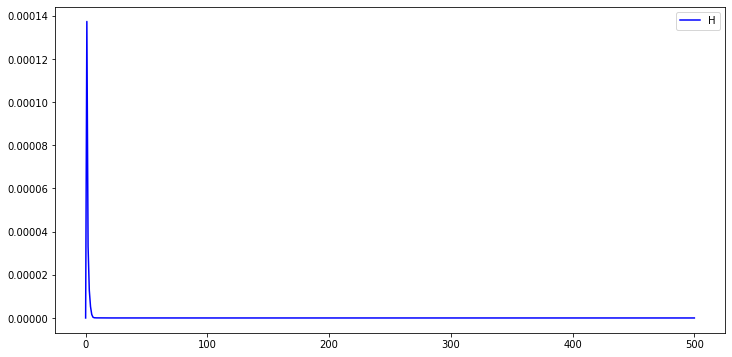

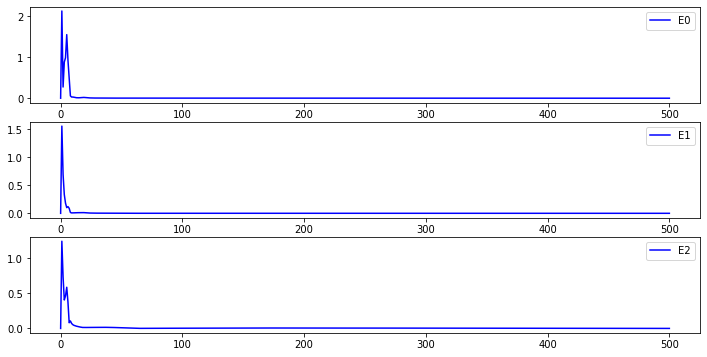

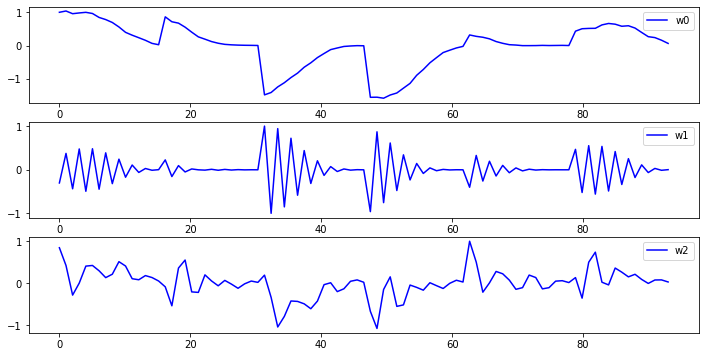

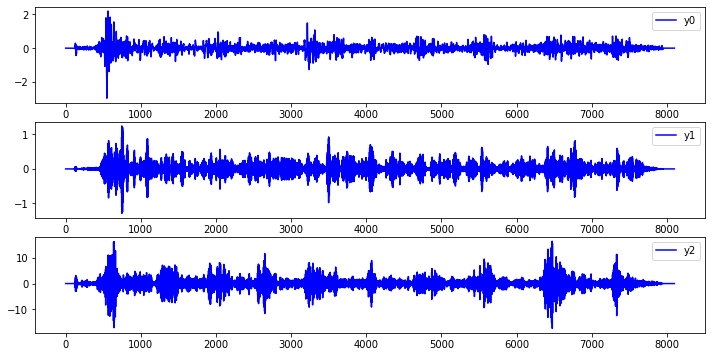

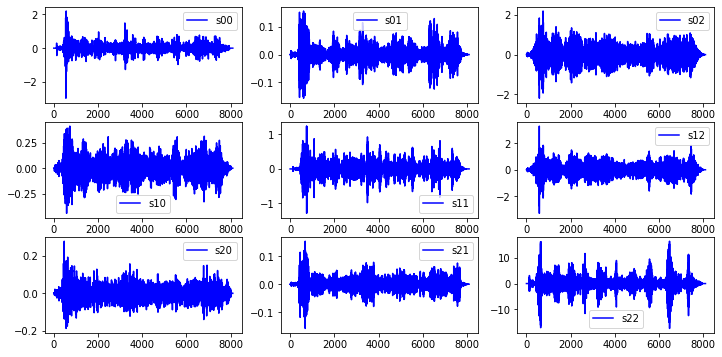

...

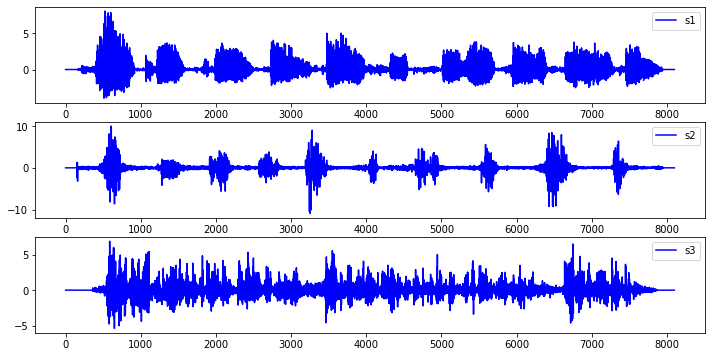

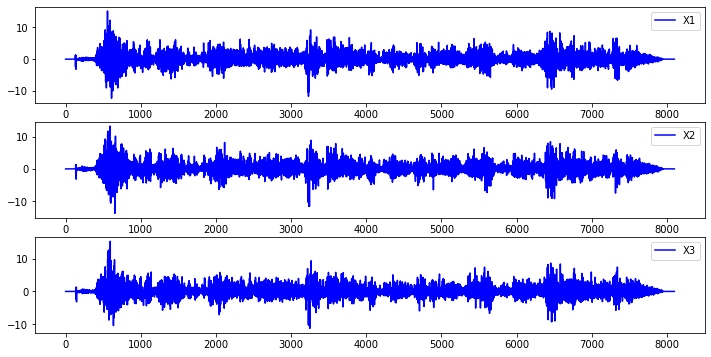

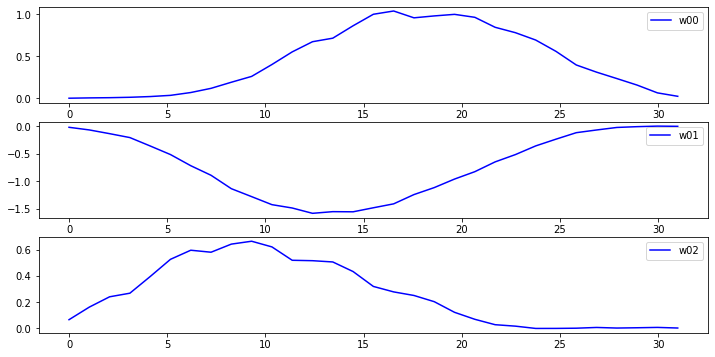

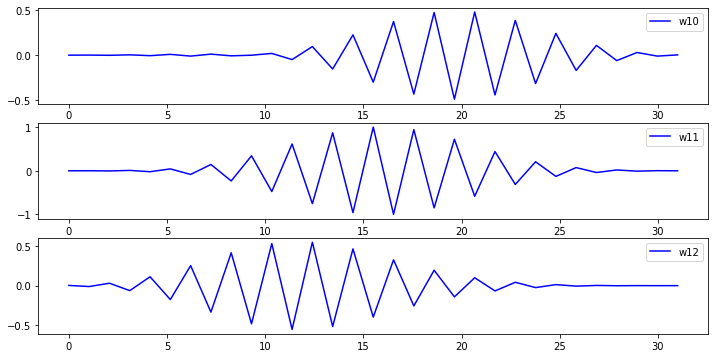

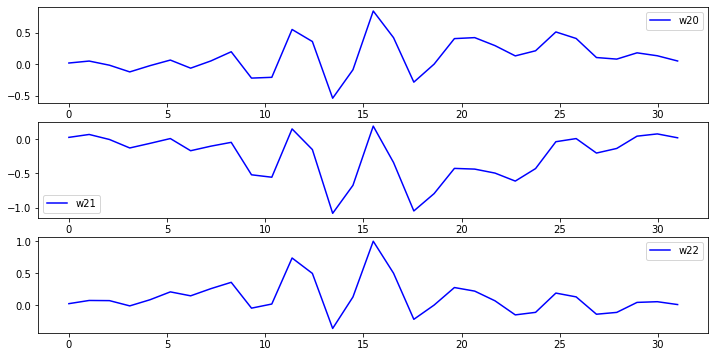

In [141]:
X =X_sim
R=50
L =15
M=L+L+1
lda1=0.00
lda2=0.0
lda3=0.0
lda4=0.000
K=1.0
alpha=1.0
W=TimeDelayDecorrelation10(X=X,R=R,M=M,lda1=lda1,lda2=lda2,lda3=lda3,lda4=lda4,K=K,alpha=alpha)
print('W ',W)
print('shape(X) ',X.shape)
plt.subplots(figsize=(12,6))
plt.subplot(3,1,1)
plt.plot(np.linspace(0,x11.shape[0],x11.shape[0]),x11,'-b',label='s1')
plt.legend()
plt.subplot(3,1,2)
plt.plot(np.linspace(0,x22.shape[0],x22.shape[0]),x22,'-b',label='s2')
plt.legend()
plt.subplot(3,1,3)
plt.plot(np.linspace(0,x33.shape[0],x33.shape[0]),x33,'-b',label='s3')
plt.legend()
plt.subplots(figsize=(12,6))
plt.subplot(3,1,1)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,0],'-b',label='X1')
plt.legend()
plt.subplot(3,1,2)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,1],'-b',label='X2')
plt.legend()
plt.subplot(3,1,3)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,2],'-b',label='X3')
plt.legend()
for i in range(X.shape[1]):
    plt.subplots(figsize=(12,6))
    for j in range(X.shape[1]):
        plt.subplot(X.shape[1],1,j+1)
        plt.plot(np.linspace(0,M,M),W[j*M:(j+1)*M,i],'-b',label='w'+str(i)+str(j))
        plt.legend()
        

In [50]:
#M选择的太大，会使得效果不好，那么该怎么约束。
#不行如果FastICA加入kurst限制，不行。简直是胡来。
def TimeDelayDecorrelation11(X,M=25,R=25,lda1=0.0,lda2=0.0,lda3=0.0,lda4=0.0,K=1.0,alpha=1.0):
    [N,p]=X.shape
    X1=np.zeros((N+M,p),dtype=float)
    X1[M:N+M,:]=X.copy()
    X1 =(X1-np.mean(X1,axis=0))/np.std(X1,axis=0)
    XX =np.zeros((N+2*R,p*M),dtype=float)
    W =np.zeros((p*M,p),dtype=float)
    for i in range(N):
        for j in range(p):
            XX[R+i,j*M:(j+1)*M]=np.flip(X1[i+1:i+1+M,j],axis=0)
    print('before rank(XX) ',np.linalg.matrix_rank(XX))   #计算出来白化前后矩阵是满列秩的，这和我之前想的不一样啊
    #XX[R:R+N,:]=whiten(XX[R:R+N,:])    #需要白化。
    print('after  rank(XX) ',np.linalg.matrix_rank(XX))
    
    for i in range(p):
        for j in range(p):
            W[j*M,i]=1.0
        W[:,i] =W[:,i]/np.linalg.norm(W[:,i])
        
        
    W_last =np.zeros((p*M,p),dtype=float)
    
    Rs =np.zeros((2*R+1,p*M,p*M),dtype=float)
    for i in range(N):
        for l in range(2*R+1):
            Rs[l,:,:] =Rs[l,:,:] +XX[R+i,:][:,np.newaxis]@XX[R+i+l-R,:][np.newaxis,:]
    Rs =Rs/N
    
    maxiters =500
    k =-1
    tol=1e-14
    eta =0.01
    alpha=0.05
    t0 =maxiters/20
    H =np.zeros((maxiters,),dtype=float)
    E =np.zeros((maxiters,p),dtype=float)
    B=np.zeros((p*M,p*M),dtype=float)
    G=np.zeros((p*M,p*M),dtype=float)
    mask =np.zeros((p,),dtype=bool)
    order =np.arange(p)
    Ws =np.zeros((maxiters,p*M,p),dtype=float)
    
    
    F  =np.zeros((p*M-2,p*M),dtype=float)     #使得权向量光滑曲率小
    Z  =np.zeros((p*M-1,p*M),dtype=float)
    for i in range(p*M-1):
        Z[i,i]=1.0;Z[i,i+1]=-1.0;
    for i in range(p*M-2):
        F[i,i]=1.0;F[i,i+1]=-2.0;F[i,i+2]=1.0;
    D  =np.zeros((N+2*R-1,N+2*R),dtype=float) #使输出信号光滑  lda=10,5,似乎得到结果不错 Q=50,R=50,不白化 
                                              #d1 =5  d2 =10  d3 =15
    for i in range(N-1+2*R):
        D[i,i]=-1.0;D[i,i+1]=1.0;
    D = D@XX

    while(np.linalg.norm(W-W_last)>tol):
        if(k==(maxiters-1)):
            break
        else:
            k =k +1
        print('k ',k,' ',np.linalg.norm(W-W_last))

        W_last =W.copy()

        for i in range(p):

            Q =np.zeros((p*M,p*M),dtype=float)
            for j in range(p):
                if(j!=i):
                    Q =Q +W[:,j][:,np.newaxis]@W[:,j][np.newaxis,:]
            
            G =np.zeros((p*M,p*M),dtype=float)+lda1*D.T@D+lda2*F.T@F+lda3*Z.T@Z
            for l in range(2*R+1):
                G =G +Rs[l,:,:]@Q@Rs[2*R-l,:,:]
            z =XX[R:N+R,:]@(W[:,i][:,np.newaxis])
            z2 =3*np.mean(np.square(z))*(np.mean(np.multiply(XX[R:N+R,:],z),axis=0)[:,np.newaxis])
            print('kurt[',i,'] ',np.mean(np.power(z,4))-3*np.square(np.mean(np.square(z))))
            z =np.power(z,3)
            
            zx =np.mean(np.multiply(XX[R:N+R,:],z),axis=0)[:,np.newaxis]
            W[:,i] =(np.linalg.inv(G)@(zx-z2))[:,0]
            W[:,i] =W[:,i]/np.linalg.norm(W[:,i])
            
            
            
          
            
        
            E[k,i] =(W[:,i][np.newaxis,:]@G@W[:,i][:,np.newaxis])[0][0]
            

            
        H[k] =np.sum(E[k,:])

        Ws[k,:,:]=W.copy()
        print('H ',H[k])
        print('E ',E[k,:])
        
    E[0,:]=0
    H[0]=0
    plt.subplots(figsize=(12,6))
    plt.plot(np.linspace(0,maxiters,maxiters),H,'-b',label='H')
    plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,maxiters,maxiters),E[:,i],'-b',label=('E'+str(i)))
        plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        print('w',i,' ',np.linalg.norm(W[:,i],ord=1))
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,W.shape[0],W.shape[0]),W[:,i],'-b',label=('w'+str(i)))
        plt.legend()
    
    y =XX[R:N+R]@W
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,y.shape[0],y.shape[0]),y[:,i],'-b',label=('y'+str(i)))
        plt.legend()
        
    Xy =np.zeros((N+4*R,4*R+1),dtype=float)
    yy =np.zeros((N,p*p),dtype=float)
    for i in range(p):
        Xy =0*Xy
        for j in range(4*R+1):
            Xy[j:N+j,j]=y[:,i]
        beta =np.linalg.pinv(Xy[2*R:N+2*R,:])@y
        yy[:,i*p:(i+1)*p] =Xy[2*R:N+2*R,:]@beta
    
    plt.subplots(figsize=(12,6))
    for i in range(p*p):
        plt.subplot(p,p,i+1)
        plt.plot(np.linspace(0,N,N),yy[:,i],'-b',label=('s'+str(int(i/3))+str(int(i%3))))
        plt.legend()
    
    dist =np.zeros((maxiters,),dtype=float)
    for i in range(maxiters):
        dist[i]=np.linalg.norm(Ws[i]-W)
    
    plt.subplots(figsize=(12,6))
    plt.plot(np.linspace(0,maxiters,maxiters),dist,'-b',label='dist')
    plt.legend()
    
    for m in range(20):
        W =Ws[maxiters-1-m,:,:]
        y =XX[R:N+R]@W
        plt.subplots(figsize=(12,6))
        for i in range(p):
            plt.subplot(p,1,i+1)
            plt.plot(np.linspace(0,y.shape[0],y.shape[0]),y[:,i],'-b',label=('y'+str(i)))
            plt.legend()
            
    
        
    
    return W

In [32]:

X =X_sim
R=150
M=50
lda1=0.00
lda2=0.0
lda3=0.0
lda4=0.000
K=1.0
alpha=1.0
W=TimeDelayDecorrelation11(X=X,R=R,M=M,lda1=lda1,lda2=lda2,lda3=lda3,lda4=lda4,K=K,alpha=alpha)
print('W ',W)
print('shape(X) ',X.shape)
plt.subplots(figsize=(12,6))
plt.subplot(3,1,1)
plt.plot(np.linspace(0,x11.shape[0],x11.shape[0]),x11,'-b',label='s1')
plt.legend()
plt.subplot(3,1,2)
plt.plot(np.linspace(0,x22.shape[0],x22.shape[0]),x22,'-b',label='s2')
plt.legend()
plt.subplot(3,1,3)
plt.plot(np.linspace(0,x33.shape[0],x33.shape[0]),x33,'-b',label='s3')
plt.legend()
plt.subplots(figsize=(12,6))
plt.subplot(3,1,1)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,0],'-b',label='X1')
plt.legend()
plt.subplot(3,1,2)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,1],'-b',label='X2')
plt.legend()
plt.subplot(3,1,3)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,2],'-b',label='X3')
plt.legend()
for i in range(X.shape[1]):
    plt.subplots(figsize=(12,6))
    for j in range(X.shape[1]):
        plt.subplot(X.shape[1],1,j+1)
        plt.plot(np.linspace(0,M,M),W[j*M:(j+1)*M,i],'-b',label='w'+str(i)+str(j))
        plt.legend()
 
        

NameError: name 'TimeDelayDecorrelation11' is not defined

In [31]:
A =np.random.normal(loc=0,scale=3.0,size=(50,50))
x =np.random.normal(loc=0,scale=3.0,size=(50,1))
b =A@x
x_sol =step_wise_regression(A,b,tol=1e-5,p=60)
print('x_sol ',x_sol)
print('rss ',np.sum(np.square(A@x_sol-b)))
print('x ',x)

k  0  corr  8.465472551026654
index  28
rss  130313.47025360867
before r  360.98957083773024
after r  570.1047621516236
k  1  corr  26.525867692592925
index  28
rss  325019.4398279593
before r  570.1047621516236
after r  653.3156108966593
k  2  corr  32.156493164855185
index  28
rss  426821.28744127514
before r  653.3156108966593
after r  680.1135557153685
k  3  corr  33.91193333991102
index  28
rss  462554.4486678016
before r  680.1135557153685
after r  688.5369516662115
k  4  corr  34.45922071027166
index  28
rss  474083.1338097988
before r  688.5369516662115
after r  691.1693943757779
k  5  corr  34.62984655671883
index  28
rss  477715.1317217796
before r  691.1693943757779
after r  691.9907045432374
k  6  corr  34.68304197297085
index  28
rss  478851.13517424616
before r  691.9907045432374
after r  692.24681978638
k  7  corr  34.69962651962161
index  28
rss  479205.65950435697
before r  692.24681978638
after r  692.3266735844282
k  8  corr  34.70479702503336
index  28
rss  479316.2

i =  0  L =  2
before rank(XX)  6
after  rank(XX)  6
k  0   3.0
norm(G-G.T)  5.755518659813419e-16
norm(G-G.T)  5.419671490444401e-16
norm(G-G.T)  4.392928185477211e-16
H  2.8264439303828643
E  [0.87906025 1.52703796 0.42034572]
k  1   2.9036460067155403
norm(G-G.T)  1.7312505526216118e-16
norm(G-G.T)  2.342840229615247e-16
norm(G-G.T)  8.378014005496794e-17
H  1.8218066103942985
E  [0.88592471 0.45948412 0.47639778]
k  2   0.7599085994885322
norm(G-G.T)  1.1058777123560701e-16
norm(G-G.T)  2.1109190769671555e-16
norm(G-G.T)  1.233484761181068e-16
H  1.546511856688635
E  [0.71337776 0.35267521 0.48045888]
k  3   0.2696630152166277
norm(G-G.T)  1.4631443892548462e-16
norm(G-G.T)  1.769768682025696e-16
norm(G-G.T)  1.2757001226805672e-16
H  1.4818096970838026
E  [0.67456112 0.32467072 0.48257786]
k  4   0.12968037178667524
norm(G-G.T)  2.1308167081879448e-16
norm(G-G.T)  2.506180167332922e-16
norm(G-G.T)  2.3714374201337736e-16
H  1.4635458980719487
E  [0.66610607 0.3106549  0.48678493]


k  72   1.5311169603887017e-10
norm(G-G.T)  1.7880278822442372e-16
norm(G-G.T)  2.7239025516254847e-16
norm(G-G.T)  3.7128756281431326e-16
H  1.442027618047377
E  [0.6538631  0.27719313 0.51097139]
k  73   1.1609825847650051e-10
norm(G-G.T)  1.7452732100361644e-16
norm(G-G.T)  1.1156308648295148e-16
norm(G-G.T)  2.1411013803062297e-16
H  1.4420276180493077
E  [0.6538631  0.27719313 0.51097139]
k  74   8.805771756834557e-11
norm(G-G.T)  7.367981426918448e-17
norm(G-G.T)  2.0455030687293702e-16
norm(G-G.T)  1.4449319812147865e-16
H  1.4420276180507958
E  [0.6538631  0.27719313 0.51097139]
k  75   6.680608471037192e-11
norm(G-G.T)  1.7713302101260614e-16
norm(G-G.T)  2.0336997210924696e-16
norm(G-G.T)  2.0427059492585983e-16
H  1.442027618051943
E  [0.6538631  0.27719313 0.51097139]
k  76   5.0693329670372744e-11
norm(G-G.T)  1.8969659275975482e-16
norm(G-G.T)  1.2167820859741844e-16
norm(G-G.T)  2.1889158480331926e-16
H  1.4420276180528253
E  [0.6538631  0.27719313 0.51097139]
k  77   3.

norm(G-G.T)  1.0480831159338294e-15
H  1.0022300250771912
E  [0.27696646 0.38378981 0.34147375]
k  71   0.0001728150421502082
norm(G-G.T)  5.349702699552034e-16
norm(G-G.T)  9.46593316385744e-16
norm(G-G.T)  9.102522376790369e-16
H  1.0022305351544603
E  [0.27697816 0.3837955  0.34145687]
k  72   0.0001663830746141404
norm(G-G.T)  6.490184534832529e-16
norm(G-G.T)  8.777083671441752e-16
norm(G-G.T)  1.1984014183609605e-15
H  1.0022310292508907
E  [0.27698943 0.38380097 0.34144063]
k  73   0.00016018317652870685
norm(G-G.T)  5.714380299480039e-16
norm(G-G.T)  7.478569755307851e-16
norm(G-G.T)  8.384871651960813e-16
H  1.0022315077229829
E  [0.27700028 0.38380623 0.34142499]
k  74   0.00015420751244652001
norm(G-G.T)  4.683881881410024e-16
norm(G-G.T)  1.0177727745369665e-15
norm(G-G.T)  5.82391910427074e-16
H  1.0022319709313816
E  [0.27701073 0.3838113  0.34140994]
k  75   0.00014844847178060745
norm(G-G.T)  3.7856738103898383e-16
norm(G-G.T)  9.75451530843288e-16
norm(G-G.T)  1.197436

H  1.002242904105058
E  [0.27724275 0.38392361 0.34107654]
k  128   1.909291343578732e-05
norm(G-G.T)  4.913403286205398e-16
norm(G-G.T)  6.299697922641171e-16
norm(G-G.T)  7.884733261488303e-16
H  1.002242968685565
E  [0.27724405 0.38392423 0.34107468]
k  129   1.8362290766427908e-05
norm(G-G.T)  5.019319783099651e-16
norm(G-G.T)  8.405661629061465e-16
norm(G-G.T)  1.1744987537955745e-15
H  1.0022430308323376
E  [0.2772453  0.38392484 0.3410729 ]
k  130   1.7659535494543844e-05
norm(G-G.T)  8.700083575854249e-16
norm(G-G.T)  8.308293243456746e-16
norm(G-G.T)  1.2106729468258163e-15
H  1.0022430906353799
E  [0.2772465  0.38392542 0.34107118]
k  131   1.6983591546905647e-05
norm(G-G.T)  3.776441610588926e-16
norm(G-G.T)  9.58836134632791e-16
norm(G-G.T)  9.544952384335827e-16
H  1.002243148181504
E  [0.27724765 0.38392597 0.34106953]
k  132   1.6333442356180045e-05
norm(G-G.T)  4.3399994073855777e-16
norm(G-G.T)  8.693439965294844e-16
norm(G-G.T)  1.0374516612453838e-15
H  1.00224320355

H  1.0022444181378267
E  [0.27727295 0.38393818 0.34103329]
k  185   2.0559561669263338e-06
norm(G-G.T)  5.588502613461813e-16
norm(G-G.T)  8.836266596130349e-16
norm(G-G.T)  4.795624145866113e-16
H  1.0022444251899718
E  [0.27727309 0.38393825 0.34103309]
k  186   1.9770437238103134e-06
norm(G-G.T)  7.256371316267314e-16
norm(G-G.T)  7.293599418422014e-16
norm(G-G.T)  7.878777158927081e-16
H  1.0022444319718766
E  [0.27727322 0.38393831 0.3410329 ]
k  187   1.9011590686198992e-06
norm(G-G.T)  3.5371347728388273e-16
norm(G-G.T)  1.0022439007644135e-15
norm(G-G.T)  9.723987763881741e-16
H  1.0022444384938742
E  [0.27727335 0.38393838 0.34103271]
k  188   1.828186105929342e-06
norm(G-G.T)  5.238060659273302e-16
norm(G-G.T)  9.717548692223602e-16
norm(G-G.T)  9.328619648004588e-16
H  1.0022444447659105
E  [0.27727348 0.38393844 0.34103253]
k  189   1.7580131891532194e-06
norm(G-G.T)  3.440180156366751e-16
norm(G-G.T)  8.682910519259589e-16
norm(G-G.T)  1.1922889608129917e-15
H  1.00224445

k  247   1.8151940781240422e-07
norm(G-G.T)  5.765757387590478e-16
norm(G-G.T)  8.95090418262362e-16
norm(G-G.T)  6.896436759417344e-16
H  1.0022445863715943
E  [0.27727628 0.38393979 0.34102852]
k  248   1.745499563781551e-07
norm(G-G.T)  4.2241852391612443e-16
norm(G-G.T)  7.154972070822025e-16
norm(G-G.T)  8.2798480531284e-16
H  1.0022445869712366
E  [0.27727629 0.38393979 0.3410285 ]
k  249   1.6784808912364382e-07
norm(G-G.T)  4.963128447734629e-16
norm(G-G.T)  9.591248291732225e-16
norm(G-G.T)  1.2518118465850507e-15
H  1.00224458754786
E  [0.2772763  0.3839398  0.34102849]
k  250   1.614035338249015e-07
norm(G-G.T)  5.51478387920188e-16
norm(G-G.T)  1.0198049666328888e-15
norm(G-G.T)  9.407256823569424e-16
H  1.0022445881023463
E  [0.27727631 0.38393981 0.34102847]
k  251   1.5520641046168997e-07
norm(G-G.T)  6.903589203182112e-16
norm(G-G.T)  8.682910519259589e-16
norm(G-G.T)  7.269795395086181e-16
H  1.0022445886355456
E  [0.27727632 0.38393981 0.34102846]
k  252   1.492472210

norm(G-G.T)  7.845707643995317e-16
H  1.002244600104475
E  [0.27727655 0.38393992 0.34102813]
k  302   2.107281645498454e-08
norm(G-G.T)  4.271789580851222e-16
norm(G-G.T)  9.586729210015212e-16
norm(G-G.T)  8.90452333426234e-16
H  1.0022446001768774
E  [0.27727655 0.38393992 0.34102813]
k  303   2.0263702320732622e-08
norm(G-G.T)  4.9067842542006e-16
norm(G-G.T)  1.011318494326511e-15
norm(G-G.T)  8.454779553504795e-16
H  1.002244600246501
E  [0.27727655 0.38393992 0.34102813]
k  304   1.948565270653402e-08
norm(G-G.T)  4.907765414829123e-16
norm(G-G.T)  1.0011744301350974e-15
norm(G-G.T)  1.0924847187311477e-15
H  1.0022446003134493
E  [0.27727655 0.38393992 0.34102813]
k  305   1.8737478596055594e-08
norm(G-G.T)  7.365203615386135e-16
norm(G-G.T)  9.112963250336172e-16
norm(G-G.T)  9.812219184891275e-16
H  1.0022446003778278
E  [0.27727655 0.38393992 0.34102812]
k  306   1.8018030528578764e-08
norm(G-G.T)  5.387370811621903e-16
norm(G-G.T)  7.414557995088692e-16
norm(G-G.T)  1.42584

norm(G-G.T)  9.842473073505356e-16
H  1.0022446018170688
E  [0.27727658 0.38393994 0.34102808]
k  363   1.934138299884973e-09
norm(G-G.T)  7.518380401906076e-16
norm(G-G.T)  1.1488951916994417e-15
norm(G-G.T)  1.1794180668694143e-15
H  1.0022446018237146
E  [0.27727658 0.38393994 0.34102808]
k  364   1.8598751337562917e-09
norm(G-G.T)  4.3874445630857173e-16
norm(G-G.T)  1.3080597221525954e-15
norm(G-G.T)  1.2023723685923087e-15
H  1.002244601830105
E  [0.27727658 0.38393994 0.34102808]
k  365   1.7884624635604005e-09
norm(G-G.T)  3.8399741062557666e-16
norm(G-G.T)  1.0082191352318121e-15
norm(G-G.T)  7.849235562839714e-16
H  1.00224460183625
E  [0.27727658 0.38393994 0.34102808]
k  366   1.719791517189198e-09
norm(G-G.T)  3.304910013465739e-16
norm(G-G.T)  1.0224454869641665e-15
norm(G-G.T)  7.640349246885061e-16
H  1.0022446018421591
E  [0.27727658 0.38393994 0.34102808]
k  367   1.6537584980291578e-09
norm(G-G.T)  4.138978962899481e-16
norm(G-G.T)  1.069760521310679e-15
norm(G-G.T) 

norm(G-G.T)  6.777420539824541e-16
norm(G-G.T)  1.1177974438803857e-15
H  1.0022446019748692
E  [0.27727659 0.38393994 0.34102808]
k  425   1.7070535682960483e-10
norm(G-G.T)  6.330005726140889e-16
norm(G-G.T)  9.219071994827285e-16
norm(G-G.T)  1.1485179550338439e-15
H  1.0022446019754552
E  [0.27727659 0.38393994 0.34102808]
k  426   1.6415059961717787e-10
norm(G-G.T)  4.638171781942258e-16
norm(G-G.T)  8.276212809741666e-16
norm(G-G.T)  1.5353939391658403e-15
H  1.0022446019760187
E  [0.27727659 0.38393994 0.34102808]
k  427   1.5784812116251524e-10
norm(G-G.T)  5.615790491047631e-16
norm(G-G.T)  6.399789659029822e-16
norm(G-G.T)  1.0123653589024406e-15
H  1.0022446019765614
E  [0.27727659 0.38393994 0.34102808]
k  428   1.5178706179118187e-10
norm(G-G.T)  3.829615715252485e-16
norm(G-G.T)  1.0279403990446415e-15
norm(G-G.T)  1.153318479905288e-15
H  1.0022446019770817
E  [0.27727659 0.38393994 0.34102808]
k  429   1.4595910926995145e-10
norm(G-G.T)  5.606351459942525e-16
norm(G-G.T

H  1.002244601988628
E  [0.27727659 0.38393994 0.34102808]
k  484   1.6943873053191056e-11
norm(G-G.T)  3.6743392481035993e-16
norm(G-G.T)  1.1805095966397748e-15
norm(G-G.T)  6.975745656012266e-16
H  1.0022446019886861
E  [0.27727659 0.38393994 0.34102808]
k  485   1.6293516874828594e-11
norm(G-G.T)  4.565982002591757e-16
norm(G-G.T)  6.292624226552987e-16
norm(G-G.T)  9.815040286124634e-16
H  1.0022446019887412
E  [0.27727659 0.38393994 0.34102808]
k  486   1.5667772512517058e-11
norm(G-G.T)  4.0605871172018e-16
norm(G-G.T)  7.767843018345061e-16
norm(G-G.T)  1.2883565975963873e-15
H  1.002244601988795
E  [0.27727659 0.38393994 0.34102808]
k  487   1.5066982833870363e-11
norm(G-G.T)  8.513233887291137e-16
norm(G-G.T)  1.038193957493645e-15
norm(G-G.T)  7.31847742043446e-16
H  1.0022446019888467
E  [0.27727659 0.38393994 0.34102808]
k  488   1.4487773352753724e-11
norm(G-G.T)  4.915362769149178e-16
norm(G-G.T)  8.752913411414752e-16
norm(G-G.T)  8.841169278177319e-16
H  1.002244601988

norm(G-G.T)  3.791773795644568e-15
norm(G-G.T)  7.844592184854285e-15
H  1.1176942396750411
E  [0.30800224 0.47289534 0.33679666]
k  65   0.028829971401151455
norm(G-G.T)  1.1257272775440778e-15
norm(G-G.T)  4.6564062659857655e-15
norm(G-G.T)  5.277750710605767e-15
H  1.1171113043368217
E  [0.30860614 0.47327428 0.33523089]
k  66   0.0243166767206345
norm(G-G.T)  1.47738160472305e-15
norm(G-G.T)  2.5951277668027263e-15
norm(G-G.T)  5.448463501947145e-15
H  1.1167280020736445
E  [0.30927624 0.47348956 0.3339622 ]
k  67   0.020436474173017215
norm(G-G.T)  1.3980450651039066e-15
norm(G-G.T)  4.662854096814137e-15
norm(G-G.T)  5.613981143397945e-15
H  1.116478816249713
E  [0.3099502  0.47358502 0.33294359]
k  68   0.017193487443364113
norm(G-G.T)  9.667251447613774e-16
norm(G-G.T)  4.506289407234565e-15
norm(G-G.T)  5.717320148864776e-15
H  1.1163169237030535
E  [0.31059065 0.47359719 0.33212908]
k  69   0.01452278997011134
norm(G-G.T)  1.4923623513374356e-15
norm(G-G.T)  4.737145820640441

k  118   3.007815680141671e-05
norm(G-G.T)  1.5995617934667115e-15
norm(G-G.T)  5.107299313461966e-15
norm(G-G.T)  4.2302561350071535e-15
H  1.1160867427617234
E  [0.31570006 0.47199727 0.32838942]
k  119   2.6667808971712007e-05
norm(G-G.T)  1.4979334703879038e-15
norm(G-G.T)  3.1471230717121658e-15
norm(G-G.T)  4.707168875681673e-15
H  1.1160868528253955
E  [0.31570141 0.47199658 0.32838886]
k  120   2.3644269945173107e-05
norm(G-G.T)  1.3850352057283259e-15
norm(G-G.T)  6.705686180814332e-15
norm(G-G.T)  3.241882124094142e-15
H  1.1160869504968463
E  [0.31570261 0.47199597 0.32838837]
k  121   2.0963638379862568e-05
norm(G-G.T)  2.1956528733597463e-15
norm(G-G.T)  4.705665015605661e-15
norm(G-G.T)  4.601831330351158e-15
H  1.1160870371630136
E  [0.31570367 0.47199543 0.32838794]
k  122   1.8587001722673114e-05
norm(G-G.T)  1.3615092990768423e-15
norm(G-G.T)  6.3441377647245694e-15
norm(G-G.T)  4.815262410602773e-15
H  1.1160871140574007
E  [0.31570461 0.47199495 0.32838755]
k  123  

norm(G-G.T)  5.841848142929612e-15
norm(G-G.T)  3.528180211178627e-15
H  1.1160877153815114
E  [0.31571196 0.4719912  0.32838456]
k  171   5.119423967813525e-08
norm(G-G.T)  1.3475396276419871e-15
norm(G-G.T)  4.334371065335425e-15
norm(G-G.T)  5.032262677241609e-15
H  1.1160877155944542
E  [0.31571196 0.4719912  0.32838455]
k  172   4.539194100027254e-08
norm(G-G.T)  2.0191585126664376e-15
norm(G-G.T)  4.511497848638874e-15
norm(G-G.T)  4.23917013359757e-15
H  1.1160877157832552
E  [0.31571197 0.4719912  0.32838455]
k  173   4.0247274626361394e-08
norm(G-G.T)  1.245797192838567e-15
norm(G-G.T)  4.206091687440048e-15
norm(G-G.T)  4.3415190286610764e-15
H  1.1160877159506652
E  [0.31571197 0.47199119 0.32838455]
k  174   3.5685698924973394e-08
norm(G-G.T)  1.0629425204942983e-15
norm(G-G.T)  6.123148283020859e-15
norm(G-G.T)  7.538341013484797e-15
H  1.1160877160990998
E  [0.31571197 0.47199119 0.32838455]
k  175   3.1641118052269844e-08
norm(G-G.T)  1.2048925230405816e-15
norm(G-G.T)  

E  [0.31571199 0.47199119 0.32838455]
k  225   7.729375187502183e-11
norm(G-G.T)  1.2940618558031535e-15
norm(G-G.T)  3.2729226007777524e-15
norm(G-G.T)  4.897040493198859e-15
H  1.1160877172578094
E  [0.31571199 0.47199119 0.32838455]
k  226   6.853454095672152e-11
norm(G-G.T)  1.221757751519231e-15
norm(G-G.T)  4.728447633302989e-15
norm(G-G.T)  4.814132380686913e-15
H  1.1160877172580972
E  [0.31571199 0.47199119 0.32838455]
k  227   6.076203058723828e-11
norm(G-G.T)  1.3410927181093857e-15
norm(G-G.T)  4.9249920716283115e-15
norm(G-G.T)  4.0865902694383026e-15
H  1.116087717258342
E  [0.31571199 0.47199119 0.32838455]
k  228   5.387780137397622e-11
norm(G-G.T)  1.5266197384099925e-15
norm(G-G.T)  4.853179663671863e-15
norm(G-G.T)  3.3319554120550594e-15
H  1.1160877172585666
E  [0.31571199 0.47199119 0.32838455]
k  229   4.777465746765405e-11
norm(G-G.T)  1.5827980514452614e-15
norm(G-G.T)  5.7340040055007245e-15
norm(G-G.T)  3.6141980099064835e-15
H  1.1160877172587638
E  [0.31571

k  280   1.0720344871483658e-13
norm(G-G.T)  1.0938831173611693e-15
norm(G-G.T)  4.098355344218847e-15
norm(G-G.T)  4.164920421761282e-15
H  1.1160877172603183
E  [0.31571199 0.47199119 0.32838455]
k  281   9.115200639288198e-14
norm(G-G.T)  1.191874962812805e-15
norm(G-G.T)  5.460023332840154e-15
norm(G-G.T)  3.878040968031546e-15
H  1.1160877172603185
E  [0.31571199 0.47199119 0.32838455]
k  282   7.979297404424866e-14
norm(G-G.T)  2.228433096394251e-15
norm(G-G.T)  4.119669872202043e-15
norm(G-G.T)  3.8058552160779216e-15
H  1.116087717260313
E  [0.31571199 0.47199119 0.32838455]
k  283   7.58559475346334e-14
norm(G-G.T)  8.8470216988485605e-16
norm(G-G.T)  4.65769861370011e-15
norm(G-G.T)  3.943746461854614e-15
H  1.1160877172603225
E  [0.31571199 0.47199119 0.32838455]
k  284   6.351004132656297e-14
norm(G-G.T)  1.240335776947728e-15
norm(G-G.T)  6.011060902131588e-15
norm(G-G.T)  5.0591722420686064e-15
H  1.1160877172603174
E  [0.31571199 0.47199119 0.32838455]
k  285   6.0616876

/root/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:211: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


a shape  (3,)
b shape  (12, 3)
i =  3  L =  5
before rank(XX)  15
after  rank(XX)  15
k  0   3.0
norm(G-G.T)  2.990003119328965e-15
norm(G-G.T)  2.435305871810999e-15
norm(G-G.T)  1.4560969671824873e-15
H  2.529177480306006
E  [0.83046633 1.18639593 0.51231523]
k  1   3.063601271758649
norm(G-G.T)  1.3609906221642229e-15
norm(G-G.T)  1.162488020738572e-15
norm(G-G.T)  8.71163725301227e-16
H  1.3001535880018977
E  [0.43895003 0.4393518  0.42185176]
k  2   0.8432741674098773
norm(G-G.T)  1.2858823614505064e-15
norm(G-G.T)  9.667796666496911e-16
norm(G-G.T)  8.273139783935605e-16
H  0.982982512820805
E  [0.31254545 0.30842291 0.36201415]
k  3   0.4449630199204103
norm(G-G.T)  8.004626972047292e-16
norm(G-G.T)  9.898083464538915e-16
norm(G-G.T)  1.3746389283977858e-15
H  0.7347358498430074
E  [0.24002019 0.20416326 0.2905524 ]
k  4   0.5092253497072395
norm(G-G.T)  9.548923997540164e-16
norm(G-G.T)  1.592895603996999e-15
norm(G-G.T)  1.7877922455733333e-15
H  0.5980341546455853
E  [0.19024

norm(G-G.T)  2.060384536027128e-15
H  0.5826747291029676
E  [0.19337595 0.15108617 0.2382126 ]
k  54   7.681081854099522e-08
norm(G-G.T)  9.60398597555345e-16
norm(G-G.T)  1.913021714546028e-15
norm(G-G.T)  2.2808533212645264e-15
H  0.5826747286881596
E  [0.19337595 0.15108618 0.2382126 ]
k  55   5.918255558100269e-08
norm(G-G.T)  9.274542957350984e-16
norm(G-G.T)  2.6197977491240758e-15
norm(G-G.T)  2.4136210219248243e-15
H  0.5826747283685461
E  [0.19337595 0.15108618 0.2382126 ]
k  56   4.560055646729664e-08
norm(G-G.T)  8.985775510694898e-16
norm(G-G.T)  1.6595420514327883e-15
norm(G-G.T)  2.2583598026107986e-15
H  0.5826747281222813
E  [0.19337594 0.15108618 0.2382126 ]
k  57   3.513590877015854e-08
norm(G-G.T)  1.0037627797327409e-15
norm(G-G.T)  2.464958434750994e-15
norm(G-G.T)  1.9594348620166624e-15
H  0.5826747279325315
E  [0.19337594 0.15108618 0.2382126 ]
k  58   2.7072999995304063e-08
norm(G-G.T)  1.1175672423342178e-15
norm(G-G.T)  2.2310027674286673e-15
norm(G-G.T)  2.1

norm(G-G.T)  2.097176653861069e-15
norm(G-G.T)  1.990779423664098e-15
H  0.5826747272953707
E  [0.19337594 0.15108619 0.2382126 ]
k  103   2.1871357916486093e-13
norm(G-G.T)  8.137138323649319e-16
norm(G-G.T)  2.191724085575245e-15
norm(G-G.T)  1.817490656320051e-15
H  0.5826747272953688
E  [0.19337594 0.15108619 0.2382126 ]
k  104   1.6924486283015873e-13
norm(G-G.T)  1.2087151857319112e-15
norm(G-G.T)  1.6667217379587239e-15
norm(G-G.T)  1.6811967654054634e-15
H  0.5826747272953691
E  [0.19337594 0.15108619 0.2382126 ]
k  105   1.305944714572695e-13
norm(G-G.T)  1.1506964914882198e-15
norm(G-G.T)  2.0280571957500065e-15
norm(G-G.T)  2.5929561191535504e-15
H  0.5826747272953672
E  [0.19337594 0.15108619 0.2382126 ]
k  106   9.985161309492567e-14
norm(G-G.T)  7.318127902817377e-16
norm(G-G.T)  2.1185569236858457e-15
norm(G-G.T)  2.0640818514327555e-15
H  0.5826747272953664
E  [0.19337594 0.15108619 0.2382126 ]
k  107   7.711561187544662e-14
norm(G-G.T)  8.142757626907536e-16
norm(G-G.T

/root/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:160: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/root/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:164: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/root/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this war

a shape  (3,)
b shape  (15, 3)
i =  4  L =  6
before rank(XX)  18
after  rank(XX)  18
k  0   3.0
norm(G-G.T)  3.225477490343052e-15
norm(G-G.T)  4.0918052679397365e-15
norm(G-G.T)  1.5982405708475003e-15
H  2.2683266625204124
E  [0.75926122 0.9784321  0.53063335]
k  1   3.0080595284545595
norm(G-G.T)  1.2722657878684772e-15
norm(G-G.T)  1.5371118372392532e-15
norm(G-G.T)  1.3383388806526495e-15
H  1.1418180327428207
E  [0.36146576 0.39485462 0.38549765]
k  2   0.8500945955443818
norm(G-G.T)  1.2418810428793216e-15
norm(G-G.T)  1.3617979036940691e-15
norm(G-G.T)  1.363347290929224e-15
H  0.8810155159835344
E  [0.28197392 0.25657703 0.34246457]
k  3   0.42417641663439165
norm(G-G.T)  9.701201610485467e-16
norm(G-G.T)  1.770942824661446e-15
norm(G-G.T)  1.3657696445131332e-15
H  0.7501197604730566
E  [0.22883148 0.20532937 0.31595891]
k  4   0.3353299828375766
norm(G-G.T)  1.3108289616363983e-15
norm(G-G.T)  2.054135284471153e-15
norm(G-G.T)  2.9151982852105707e-15
H  0.6980025967794417
E

norm(G-G.T)  1.0469149452625296e-14
norm(G-G.T)  7.480988503789824e-15
H  0.5770334879961527
E  [0.13260953 0.21009796 0.234326  ]
k  48   0.03931965646882584
norm(G-G.T)  2.2509572897029508e-15
norm(G-G.T)  8.086720445159818e-15
norm(G-G.T)  9.718239858487686e-15
H  0.575885631156017
E  [0.13221361 0.21040422 0.23326779]
k  49   0.03579309447086204
norm(G-G.T)  2.047648735905216e-15
norm(G-G.T)  7.404428951478499e-15
norm(G-G.T)  8.279568923019339e-15
H  0.574947020404895
E  [0.1319165  0.21072436 0.23230616]
k  50   0.032460573728128134
norm(G-G.T)  1.9562774371297525e-15
norm(G-G.T)  9.761210232014513e-15
norm(G-G.T)  8.898996845959022e-15
H  0.5741848348492093
E  [0.13169985 0.21105059 0.2314344 ]
k  51   0.02933825480481702
norm(G-G.T)  2.4468801927253543e-15
norm(G-G.T)  9.622878730490788e-15
norm(G-G.T)  8.31095281610314e-15
H  0.5735698160400883
E  [0.1315483  0.21137574 0.23064577]
k  52   0.02643721353415822
norm(G-G.T)  2.367982690776666e-15
norm(G-G.T)  1.0977290680534065e-

norm(G-G.T)  2.112544181776797e-15
norm(G-G.T)  9.478356360773753e-15
norm(G-G.T)  1.0467271430410298e-14
H  0.5711777164281762
E  [0.13266027 0.21513845 0.223379  ]
k  125   1.9379174330967947e-05
norm(G-G.T)  1.6865788933929317e-15
norm(G-G.T)  1.1769493213647579e-14
norm(G-G.T)  9.72067588954628e-15
H  0.5711777192591714
E  [0.13266062 0.21513867 0.22337843]
k  126   1.76219847688547e-05
norm(G-G.T)  1.8701123656446653e-15
norm(G-G.T)  1.1521807147781935e-14
norm(G-G.T)  8.834905619626533e-15
H  0.5711777218510437
E  [0.13266094 0.21513886 0.22337792]
k  127   1.6024089687488204e-05
norm(G-G.T)  1.966770096780834e-15
norm(G-G.T)  9.317650496613581e-15
norm(G-G.T)  8.516950281205098e-15
H  0.5711777242224471
E  [0.13266124 0.21513904 0.22337745]
k  128   1.4571053776774192e-05
norm(G-G.T)  2.00643206436163e-15
norm(G-G.T)  8.823326797188659e-15
norm(G-G.T)  1.1677859523908396e-14
H  0.5711777263908474
E  [0.1326615  0.2151392  0.22337703]
k  129   1.324974903756012e-05
norm(G-G.T)  2

norm(G-G.T)  1.0498801006646916e-14
norm(G-G.T)  9.662209814333604e-15
H  0.5711777487470061
E  [0.13266418 0.2151408  0.22337277]
k  204   1.0596287833752508e-08
norm(G-G.T)  1.8473069514265443e-15
norm(G-G.T)  8.099992903914312e-15
norm(G-G.T)  1.0859588430399103e-14
H  0.5711777487486673
E  [0.13266418 0.2151408  0.22337277]
k  205   9.635116340496522e-09
norm(G-G.T)  1.5376506413679628e-15
norm(G-G.T)  9.357951923327554e-15
norm(G-G.T)  1.0478682126297281e-14
H  0.5711777487501716
E  [0.13266418 0.2151408  0.22337277]
k  206   8.761123553617159e-09
norm(G-G.T)  2.1372859702659092e-15
norm(G-G.T)  9.059655426115876e-15
norm(G-G.T)  1.075070938424996e-14
H  0.5711777487515568
E  [0.13266418 0.2151408  0.22337277]
k  207   7.96645355194625e-09
norm(G-G.T)  2.131170670388221e-15
norm(G-G.T)  9.277049436046114e-15
norm(G-G.T)  8.015026210156776e-15
H  0.5711777487528071
E  [0.13266418 0.2151408  0.22337277]
k  208   7.243841191503595e-09
norm(G-G.T)  2.530273141089884e-15
norm(G-G.T)  8

k  279   8.471868436535064e-12
norm(G-G.T)  2.3128835655268683e-15
norm(G-G.T)  8.018551689262087e-15
norm(G-G.T)  1.0275900967458275e-14
H  0.5711777487653247
E  [0.13266418 0.2151408  0.22337277]
k  280   7.695115455673239e-12
norm(G-G.T)  2.271232546312903e-15
norm(G-G.T)  9.022440718418821e-15
norm(G-G.T)  9.449601658246576e-15
H  0.5711777487653317
E  [0.13266418 0.2151408  0.22337277]
k  281   6.9804064315621184e-12
norm(G-G.T)  1.5686704356311708e-15
norm(G-G.T)  8.564315570320395e-15
norm(G-G.T)  1.2088406570698925e-14
H  0.5711777487653307
E  [0.13266418 0.2151408  0.22337277]
k  282   6.369078569940394e-12
norm(G-G.T)  1.81016216852278e-15
norm(G-G.T)  8.569868267790648e-15
norm(G-G.T)  1.0813825920109077e-14
H  0.5711777487653328
E  [0.13266418 0.2151408  0.22337277]
k  283   5.806036001822389e-12
norm(G-G.T)  2.2245200396297845e-15
norm(G-G.T)  1.399616010266558e-14
norm(G-G.T)  8.792364437950524e-15
H  0.5711777487653402
E  [0.13266418 0.2151408  0.22337277]
k  284   5.242

norm(G-G.T)  1.6560484325582594e-15
norm(G-G.T)  1.039541723797297e-14
norm(G-G.T)  8.986959276415941e-15
H  0.5711777487653492
E  [0.13266418 0.2151408  0.22337277]
k  356   3.158931506911046e-14
norm(G-G.T)  1.727963383517389e-15
norm(G-G.T)  1.042128540843193e-14
norm(G-G.T)  8.946416847421546e-15
H  0.5711777487653574
E  [0.13266418 0.2151408  0.22337277]
k  357   3.714718624421166e-14
norm(G-G.T)  1.856294939909621e-15
norm(G-G.T)  9.055126273239923e-15
norm(G-G.T)  9.091894755965496e-15
H  0.5711777487653451
E  [0.13266418 0.2151408  0.22337277]
k  358   3.464118230136942e-14
norm(G-G.T)  2.074892835999575e-15
norm(G-G.T)  9.208265161774995e-15
norm(G-G.T)  1.2137968131784696e-14
H  0.5711777487653505
E  [0.13266418 0.2151408  0.22337277]
k  359   4.340455183237747e-14
norm(G-G.T)  1.5794874136089513e-15
norm(G-G.T)  8.545066832245501e-15
norm(G-G.T)  1.2239032639595378e-14
H  0.5711777487653483
E  [0.13266418 0.2151408  0.22337277]
k  360   3.5957447968225324e-14
norm(G-G.T)  1.

k  431   4.3319985901905785e-14
norm(G-G.T)  1.6153048150756955e-15
norm(G-G.T)  9.950693216395803e-15
norm(G-G.T)  1.0676867729759923e-14
H  0.5711777487653447
E  [0.13266418 0.2151408  0.22337277]
k  432   4.218488264982978e-14
norm(G-G.T)  1.6295305038787788e-15
norm(G-G.T)  9.595584607894083e-15
norm(G-G.T)  1.0831221091573685e-14
H  0.5711777487653509
E  [0.13266418 0.2151408  0.22337277]
k  433   4.780480339407496e-14
norm(G-G.T)  1.6558404124105882e-15
norm(G-G.T)  1.1378381212787736e-14
norm(G-G.T)  1.0667686775817307e-14
H  0.5711777487653602
E  [0.13266418 0.2151408  0.22337277]
k  434   2.6979022718535232e-14
norm(G-G.T)  2.026559616474349e-15
norm(G-G.T)  1.0949389893418968e-14
norm(G-G.T)  9.480003346046015e-15
H  0.5711777487653468
E  [0.13266418 0.2151408  0.22337277]
k  435   2.850197950563039e-14
norm(G-G.T)  2.628843078229463e-15
norm(G-G.T)  1.0674896858963273e-14
norm(G-G.T)  9.259261689376991e-15
H  0.5711777487653491
E  [0.13266418 0.2151408  0.22337277]
k  436   

w 0   6.427362973399051
w 1   3.8103147729014952
w 2   5.079078312752078
a shape  (3,)
b shape  (18, 3)
i =  5  L =  7
before rank(XX)  21
after  rank(XX)  21
k  0   3.0
norm(G-G.T)  3.841925140307566e-15
norm(G-G.T)  4.899452453594639e-15
norm(G-G.T)  1.761704493194153e-15
H  1.4817645698148036
E  [0.38280232 0.76477457 0.33418768]
k  1   3.1021688091754513
norm(G-G.T)  1.7169039459945704e-15
norm(G-G.T)  2.464519912266623e-15
norm(G-G.T)  1.4121765968321234e-15
H  0.6604003824125756
E  [0.22321244 0.25823132 0.17895662]
k  2   0.8410683259593594
norm(G-G.T)  1.2021060503671032e-15
norm(G-G.T)  1.6826645096014326e-15
norm(G-G.T)  1.1370513618406891e-15
H  0.48024844321272886
E  [0.15441812 0.18346706 0.14236327]
k  3   0.4177548684123947
norm(G-G.T)  1.1042649318238849e-15
norm(G-G.T)  1.5075535496288226e-15
norm(G-G.T)  1.6577764491334668e-15
H  0.39250847260854616
E  [0.12553141 0.14621865 0.12075841]
k  4   0.3010305892458117
norm(G-G.T)  1.0482249507842589e-15
norm(G-G.T)  2.98306

norm(G-G.T)  2.812589723026334e-15
H  0.30264530843176185
E  [0.09904854 0.11042505 0.09317172]
k  70   0.00039552967531107506
norm(G-G.T)  2.0920358765270883e-15
norm(G-G.T)  3.2298892751551625e-15
norm(G-G.T)  3.3402829141883436e-15
H  0.302645736450849
E  [0.09905164 0.11042518 0.09316892]
k  71   0.00036657570845278223
norm(G-G.T)  1.6794896246364237e-15
norm(G-G.T)  3.0110002690482233e-15
norm(G-G.T)  2.521884644239849e-15
H  0.30264613639979654
E  [0.0990545  0.11042529 0.09316634]
k  72   0.00033978110779019473
norm(G-G.T)  2.2666888944626437e-15
norm(G-G.T)  3.941511625810539e-15
norm(G-G.T)  3.126354821155977e-15
H  0.30264650970831136
E  [0.09905716 0.11042539 0.09316397]
k  73   0.00031498637992742064
norm(G-G.T)  1.3320857874009623e-15
norm(G-G.T)  3.7088501508954166e-15
norm(G-G.T)  2.4928887757081166e-15
H  0.3026468578032606
E  [0.09905961 0.11042546 0.09316178]
k  74   0.0002920432285028748
norm(G-G.T)  1.7892064410519255e-15
norm(G-G.T)  2.7858427624144987e-15
norm(G-G

norm(G-G.T)  1.7720877456167983e-15
norm(G-G.T)  3.559524072349775e-15
norm(G-G.T)  2.782453195193452e-15
H  0.3026512229898078
E  [0.09909026 0.11042432 0.09313664]
k  134   5.25592058611612e-06
norm(G-G.T)  2.079815529455114e-15
norm(G-G.T)  3.563404091081937e-15
norm(G-G.T)  2.6038147367327014e-15
H  0.3026512255684634
E  [0.09909028 0.11042431 0.09313663]
k  135   4.9576999018009e-06
norm(G-G.T)  2.3512623348981027e-15
norm(G-G.T)  3.3842743367340146e-15
norm(G-G.T)  3.3767255800183394e-15
H  0.3026512279348472
E  [0.09909031 0.1104243  0.09313662]
k  136   4.677179357097726e-06
norm(G-G.T)  1.9976559162675257e-15
norm(G-G.T)  4.326999879172694e-15
norm(G-G.T)  2.7987063232541723e-15
H  0.3026512301059974
E  [0.09909033 0.11042429 0.09313661]
k  137   4.4132362994326534e-06
norm(G-G.T)  2.027378606945132e-15
norm(G-G.T)  3.3176476498673383e-15
norm(G-G.T)  2.5352329288259733e-15
H  0.3026512320975898
E  [0.09909035 0.11042428 0.0931366 ]
k  138   4.164825347743063e-06
norm(G-G.T)  

norm(G-G.T)  3.509310862959701e-15
norm(G-G.T)  2.849089895581763e-15
H  0.30265125314952485
E  [0.09909063 0.11042411 0.09313651]
k  200   1.3047520391085527e-07
norm(G-G.T)  1.8741658120023745e-15
norm(G-G.T)  3.2836001437690736e-15
norm(G-G.T)  2.4649975006162803e-15
H  0.30265125314951147
E  [0.09909063 0.11042411 0.09313651]
k  201   1.2346712938729435e-07
norm(G-G.T)  1.841246970664323e-15
norm(G-G.T)  4.196292861327688e-15
norm(G-G.T)  2.9645079230338743e-15
H  0.3026512531491212
E  [0.09909063 0.11042411 0.09313651]
k  202   1.1683565192171063e-07
norm(G-G.T)  1.8427920210229563e-15
norm(G-G.T)  3.081681449432024e-15
norm(G-G.T)  3.030954607830199e-15
H  0.3026512531484046
E  [0.09909063 0.11042411 0.09313651]
k  203   1.1056048641723985e-07
norm(G-G.T)  1.5321360179746278e-15
norm(G-G.T)  3.099022193721531e-15
norm(G-G.T)  2.9974576027123574e-15
H  0.3026512531474045
E  [0.09909063 0.11042411 0.09313651]
k  204   1.0462247044773024e-07
norm(G-G.T)  2.363953005610665e-15
norm(G

E  [0.09909064 0.1104241  0.09313651]
k  261   4.491864455748353e-09
norm(G-G.T)  2.8571985755316353e-15
norm(G-G.T)  3.494310125678692e-15
norm(G-G.T)  2.815276096608784e-15
H  0.3026512530665593
E  [0.09909064 0.1104241  0.09313651]
k  262   4.2503383119795004e-09
norm(G-G.T)  3.005476133156421e-15
norm(G-G.T)  2.7895043922366834e-15
norm(G-G.T)  3.021647296402045e-15
H  0.30265125306614954
E  [0.09909064 0.1104241  0.09313651]
k  263   4.021799593206899e-09
norm(G-G.T)  1.8318757935850704e-15
norm(G-G.T)  3.7384349435873365e-15
norm(G-G.T)  3.086708283572987e-15
H  0.30265125306575186
E  [0.09909064 0.1104241  0.09313651]
k  264   3.805540888456253e-09
norm(G-G.T)  1.9204430938514867e-15
norm(G-G.T)  3.3007553219526276e-15
norm(G-G.T)  3.0497524123978487e-15
H  0.3026512530653776
E  [0.09909064 0.1104241  0.09313651]
k  265   3.6009092781391607e-09
norm(G-G.T)  2.3301156106733063e-15
norm(G-G.T)  3.0619790754949194e-15
norm(G-G.T)  2.636432715961239e-15
H  0.30265125306502105
E  [0.

H  0.30265125305876217
E  [0.09909064 0.1104241  0.09313651]
k  314   2.397357471233238e-10
norm(G-G.T)  1.9102212210998096e-15
norm(G-G.T)  4.16377578243347e-15
norm(G-G.T)  4.017457779422899e-15
H  0.3026512530587329
E  [0.09909064 0.1104241  0.09313651]
k  315   2.2684271191131657e-10
norm(G-G.T)  1.559604199893682e-15
norm(G-G.T)  2.930185708290984e-15
norm(G-G.T)  3.197768759576594e-15
H  0.3026512530587101
E  [0.09909064 0.1104241  0.09313651]
k  316   2.1463069173207863e-10
norm(G-G.T)  2.2364222307429328e-15
norm(G-G.T)  3.2661190071653026e-15
norm(G-G.T)  3.1584698709876916e-15
H  0.30265125305868124
E  [0.09909064 0.1104241  0.09313651]
k  317   2.030867951363584e-10
norm(G-G.T)  1.5783653020390211e-15
norm(G-G.T)  4.331181759902832e-15
norm(G-G.T)  2.6403015591407846e-15
H  0.3026512530586592
E  [0.09909064 0.1104241  0.09313651]
k  318   1.9215842932605695e-10
norm(G-G.T)  1.9865496255300502e-15
norm(G-G.T)  2.9696033953808535e-15
norm(G-G.T)  3.3115612173618897e-15
H  0.30

norm(G-G.T)  4.153088862454786e-15
norm(G-G.T)  2.836845231170799e-15
H  0.3026512530582508
E  [0.09909064 0.1104241  0.09313651]
k  376   7.766439411683484e-12
norm(G-G.T)  2.1610978700541513e-15
norm(G-G.T)  3.0342569940841765e-15
norm(G-G.T)  2.9554475256345577e-15
H  0.30265125305825274
E  [0.09909064 0.1104241  0.09313651]
k  377   7.344669687101285e-12
norm(G-G.T)  2.864673259986263e-15
norm(G-G.T)  2.903543651912381e-15
norm(G-G.T)  2.6205695371805697e-15
H  0.30265125305824964
E  [0.09909064 0.1104241  0.09313651]
k  378   6.954133003588332e-12
norm(G-G.T)  1.602997132226304e-15
norm(G-G.T)  3.742515439788244e-15
norm(G-G.T)  2.5392370043611145e-15
H  0.30265125305824747
E  [0.09909064 0.1104241  0.09313651]
k  379   6.581210407905786e-12
norm(G-G.T)  1.803901817302166e-15
norm(G-G.T)  2.7836469319492342e-15
norm(G-G.T)  3.0294292153793685e-15
H  0.3026512530582483
E  [0.09909064 0.1104241  0.09313651]
k  380   6.2247539686644686e-12
norm(G-G.T)  2.057881117209198e-15
norm(G-G.

norm(G-G.T)  2.4205503665106515e-15
H  0.3026512530582348
E  [0.09909064 0.1104241  0.09313651]
k  437   2.6472099431516815e-13
norm(G-G.T)  1.6023624878353825e-15
norm(G-G.T)  3.477583672075769e-15
norm(G-G.T)  2.8710758364199627e-15
H  0.3026512530582351
E  [0.09909064 0.1104241  0.09313651]
k  438   2.539843645596917e-13
norm(G-G.T)  2.2486539995191838e-15
norm(G-G.T)  3.2968290731620564e-15
norm(G-G.T)  3.27174550216001e-15
H  0.3026512530582319
E  [0.09909064 0.1104241  0.09313651]
k  439   2.3638602236412016e-13
norm(G-G.T)  1.7955787433029643e-15
norm(G-G.T)  3.2589318763700218e-15
norm(G-G.T)  2.809181010032408e-15
H  0.30265125305823426
E  [0.09909064 0.1104241  0.09313651]
k  440   2.256097095685554e-13
norm(G-G.T)  2.3032134011527427e-15
norm(G-G.T)  3.886660239241206e-15
norm(G-G.T)  3.27718603910053e-15
H  0.3026512530582347
E  [0.09909064 0.1104241  0.09313651]
k  441   2.12485301267534e-13
norm(G-G.T)  1.9199623674213625e-15
norm(G-G.T)  2.8861127853004627e-15
norm(G-G.T

k  497   1.2349602058209707e-14
norm(G-G.T)  2.339531071229429e-15
norm(G-G.T)  4.5711039963711654e-15
norm(G-G.T)  2.573235267479007e-15
H  0.30265125305823326
E  [0.09909064 0.1104241  0.09313651]
w 0   3.8530489719989154
w 1   4.013542253428964
w 2   5.020335632432595
a shape  (3,)
b shape  (21, 3)
i =  6  L =  8
before rank(XX)  24
after  rank(XX)  24
k  0   3.0
norm(G-G.T)  5.183685817853453e-15
norm(G-G.T)  4.844338226648347e-15
norm(G-G.T)  2.837891225298388e-15
H  1.4632093035789162
E  [0.3685287  0.78537808 0.30930253]
k  1   3.0850242764464104
norm(G-G.T)  2.4531513427580007e-15
norm(G-G.T)  3.3691295033819316e-15
norm(G-G.T)  2.25998066584043e-15
H  0.567559568577896
E  [0.17678315 0.23733038 0.15344604]
k  2   1.0126645972898622
norm(G-G.T)  1.769281066321092e-15
norm(G-G.T)  1.6055922188214636e-15
norm(G-G.T)  1.7988570134761372e-15
H  0.45140350280434793
E  [0.14330672 0.17650171 0.13159508]
k  3   0.3260478171121896
norm(G-G.T)  1.6978236723723096e-15
norm(G-G.T)  2.2792

norm(G-G.T)  3.699315998759788e-15
norm(G-G.T)  6.215268501456458e-15
norm(G-G.T)  5.552436201800185e-15
H  0.20020146252242366
E  [0.06403058 0.06545601 0.07071486]
k  66   0.00142136950655044
norm(G-G.T)  4.063962988256016e-15
norm(G-G.T)  5.441996064634559e-15
norm(G-G.T)  5.042991968469855e-15
H  0.200199736321433
E  [0.06403504 0.06544881 0.07071588]
k  67   0.0013190939997010519
norm(G-G.T)  2.962633468767471e-15
norm(G-G.T)  5.503410842686555e-15
norm(G-G.T)  5.013784957834561e-15
H  0.2001982563743869
E  [0.06403919 0.0654422  0.07071686]
k  68   0.0012243036945345767
norm(G-G.T)  4.380940417991169e-15
norm(G-G.T)  4.833261040257371e-15
norm(G-G.T)  5.908040319928808e-15
H  0.20019698852622214
E  [0.06404305 0.06543614 0.07071779]
k  69   0.0011364493016026694
norm(G-G.T)  3.7992941118167115e-15
norm(G-G.T)  7.203132126039493e-15
norm(G-G.T)  4.78179539018045e-15
H  0.20019590328955303
E  [0.06404664 0.06543058 0.07071868]
k  70   0.0010550204638532712
norm(G-G.T)  3.5114884410

norm(G-G.T)  3.7067227426178435e-15
norm(G-G.T)  6.188379888598357e-15
norm(G-G.T)  4.56864334344906e-15
H  0.20019002494997953
E  [0.06409141 0.0653663  0.07073232]
k  127   1.8154288082871177e-05
norm(G-G.T)  3.599893285043074e-15
norm(G-G.T)  6.883810299770728e-15
norm(G-G.T)  4.772791651763003e-15
H  0.20019002671782105
E  [0.06409145 0.06536624 0.07073234]
k  128   1.6938201431572017e-05
norm(G-G.T)  3.106641499569465e-15
norm(G-G.T)  7.263337532623265e-15
norm(G-G.T)  5.468426790298174e-15
H  0.2001900283647739
E  [0.06409149 0.06536618 0.07073236]
k  129   1.5804116881927663e-05
norm(G-G.T)  3.590604445810409e-15
norm(G-G.T)  6.129377406643474e-15
norm(G-G.T)  6.1531030500567546e-15
H  0.20019002989766324
E  [0.06409152 0.06536613 0.07073238]
k  130   1.4746457054496727e-05
norm(G-G.T)  2.972870317818678e-15
norm(G-G.T)  6.942638703491554e-15
norm(G-G.T)  6.111913584517678e-15
H  0.2001900313231637
E  [0.06409155 0.06536608 0.07073239]
k  131   1.3760028543837941e-05
norm(G-G.T)

norm(G-G.T)  4.482718298069736e-15
norm(G-G.T)  5.487372792624891e-15
H  0.20019004822769235
E  [0.06409194 0.06536547 0.07073264]
k  188   2.791501832975245e-07
norm(G-G.T)  3.4715957656039604e-15
norm(G-G.T)  5.009595473434618e-15
norm(G-G.T)  5.678994794428767e-15
H  0.20019004823167738
E  [0.06409194 0.06536547 0.07073264]
k  189   2.609719965691326e-07
norm(G-G.T)  2.922102529866297e-15
norm(G-G.T)  5.058041374617413e-15
norm(G-G.T)  5.78323209956099e-15
H  0.20019004823485528
E  [0.06409194 0.06536547 0.07073264]
k  190   2.4399017048326643e-07
norm(G-G.T)  2.8933177390595558e-15
norm(G-G.T)  7.198132168791182e-15
norm(G-G.T)  5.215537114000788e-15
H  0.20019004823732311
E  [0.06409194 0.06536547 0.07073264]
k  191   2.2812538836568174e-07
norm(G-G.T)  3.1891480203842054e-15
norm(G-G.T)  5.5601310739909085e-15
norm(G-G.T)  5.9764225133895e-15
H  0.20019004823914344
E  [0.06409194 0.06536547 0.07073264]
k  192   2.133037121574478e-07
norm(G-G.T)  3.9027279625160085e-15
norm(G-G.T)

H  0.20019004815723404
E  [0.06409194 0.06536546 0.07073265]
k  247   6.000604129924442e-09
norm(G-G.T)  3.391214039282446e-15
norm(G-G.T)  7.466282487512717e-15
norm(G-G.T)  6.085450781157238e-15
H  0.2001900481564243
E  [0.06409194 0.06536546 0.07073265]
k  248   5.639967932041349e-09
norm(G-G.T)  4.262329535048067e-15
norm(G-G.T)  6.831669329658295e-15
norm(G-G.T)  5.176853165359883e-15
H  0.20019004815564584
E  [0.06409194 0.06536546 0.07073265]
k  249   5.301657697699212e-09
norm(G-G.T)  3.1598894861954132e-15
norm(G-G.T)  6.559394341329743e-15
norm(G-G.T)  5.008527464618307e-15
H  0.2001900481548996
E  [0.06409194 0.06536546 0.07073265]
k  250   4.984251901848566e-09
norm(G-G.T)  3.310816620033527e-15
norm(G-G.T)  6.704926381583341e-15
norm(G-G.T)  5.21903673570769e-15
H  0.20019004815419084
E  [0.06409194 0.06536546 0.07073265]
k  251   4.6863847499789466e-09
norm(G-G.T)  3.853222858915764e-15
norm(G-G.T)  7.1023885064699746e-15
norm(G-G.T)  5.064109947097947e-15
H  0.2001900481

E  [0.06409194 0.06536546 0.07073265]
k  307   1.7664692480705948e-10
norm(G-G.T)  3.4403668033678197e-15
norm(G-G.T)  6.737097950935846e-15
norm(G-G.T)  5.299820406147569e-15
H  0.20019004814011276
E  [0.06409194 0.06536546 0.07073265]
k  308   1.6699483449081033e-10
norm(G-G.T)  3.331761373154894e-15
norm(G-G.T)  4.284415812673535e-15
norm(G-G.T)  5.301474022742204e-15
H  0.20019004814007263
E  [0.06409194 0.06536546 0.07073265]
k  309   1.5788710502779147e-10
norm(G-G.T)  3.1048276478010854e-15
norm(G-G.T)  7.185125064013515e-15
norm(G-G.T)  6.458132155264307e-15
H  0.2001900481400284
E  [0.06409194 0.06536546 0.07073265]
k  310   1.4928931880050635e-10
norm(G-G.T)  4.377148195216721e-15
norm(G-G.T)  5.121932708296572e-15
norm(G-G.T)  6.070684074724655e-15
H  0.20019004813999255
E  [0.06409194 0.06536546 0.07073265]
k  311   1.4114522714267277e-10
norm(G-G.T)  2.9612120082051512e-15
norm(G-G.T)  5.513492257714735e-15
norm(G-G.T)  5.504514721357624e-15
H  0.20019004813995617
E  [0.06

norm(G-G.T)  4.410649316829903e-15
H  0.20019004813928185
E  [0.06409194 0.06536546 0.07073265]
k  367   6.460497675179417e-12
norm(G-G.T)  3.2012958361958545e-15
norm(G-G.T)  4.522405969416804e-15
norm(G-G.T)  5.814896497307361e-15
H  0.2001900481392841
E  [0.06409194 0.06536546 0.07073265]
k  368   6.1159512003608885e-12
norm(G-G.T)  3.5841001932118e-15
norm(G-G.T)  6.474551354623491e-15
norm(G-G.T)  4.709836054365382e-15
H  0.2001900481392861
E  [0.06409194 0.06536546 0.07073265]
k  369   5.785219424835449e-12
norm(G-G.T)  2.8962304221209007e-15
norm(G-G.T)  5.6915037389786164e-15
norm(G-G.T)  5.415528445652478e-15
H  0.20019004813927938
E  [0.06409194 0.06536546 0.07073265]
k  370   5.48142044840475e-12
norm(G-G.T)  3.2342234349254488e-15
norm(G-G.T)  6.623670935137342e-15
norm(G-G.T)  6.5564917664025385e-15
H  0.2001900481392772
E  [0.06409194 0.06536546 0.07073265]
k  371   5.183335504456891e-12
norm(G-G.T)  3.875610930653076e-15
norm(G-G.T)  6.7143314171345765e-15
norm(G-G.T)  5

norm(G-G.T)  6.0591415272041356e-15
norm(G-G.T)  6.963711282174021e-15
H  0.20019004813924535
E  [0.06409194 0.06536546 0.07073265]
k  427   2.421076322763621e-13
norm(G-G.T)  3.7735845993923066e-15
norm(G-G.T)  5.115092723807151e-15
norm(G-G.T)  5.330675403974674e-15
H  0.2001900481392493
E  [0.06409194 0.06536546 0.07073265]
k  428   2.334887037990486e-13
norm(G-G.T)  3.3350225967195683e-15
norm(G-G.T)  5.669844365650134e-15
norm(G-G.T)  5.073753054810613e-15
H  0.20019004813924862
E  [0.06409194 0.06536546 0.07073265]
k  429   2.268447454512395e-13
norm(G-G.T)  3.0405373119051705e-15
norm(G-G.T)  5.350126253416335e-15
norm(G-G.T)  5.37708147925249e-15
H  0.200190048139249
E  [0.06409194 0.06536546 0.07073265]
k  430   2.1519029607112482e-13
norm(G-G.T)  2.981130571063796e-15
norm(G-G.T)  5.631896315703673e-15
norm(G-G.T)  4.717010908534611e-15
H  0.20019004813925212
E  [0.06409194 0.06536546 0.07073265]
k  431   1.930718015361434e-13
norm(G-G.T)  3.0175730364221384e-15
norm(G-G.T)  

norm(G-G.T)  3.3329960522420266e-15
norm(G-G.T)  7.419046249572696e-15
norm(G-G.T)  4.561363761087995e-15
H  0.20019004813924357
E  [0.06409194 0.06536546 0.07073265]
k  487   3.0832853063101284e-14
norm(G-G.T)  3.624334673257879e-15
norm(G-G.T)  7.204471482381295e-15
norm(G-G.T)  5.5573901911887054e-15
H  0.20019004813924252
E  [0.06409194 0.06536546 0.07073265]
k  488   2.6109810278642924e-14
norm(G-G.T)  4.4540013744453234e-15
norm(G-G.T)  6.289272558411134e-15
norm(G-G.T)  5.8619258455973635e-15
H  0.20019004813924796
E  [0.06409194 0.06536546 0.07073265]
k  489   1.9358936985673107e-14
norm(G-G.T)  4.972070405731734e-15
norm(G-G.T)  5.762450074246751e-15
norm(G-G.T)  4.2176438663842794e-15
H  0.20019004813924524
E  [0.06409194 0.06536546 0.07073265]
k  490   2.3549383291633116e-14
norm(G-G.T)  3.939333075341161e-15
norm(G-G.T)  5.072685613988924e-15
norm(G-G.T)  5.9180099963765584e-15
H  0.20019004813924848
E  [0.06409194 0.06536546 0.07073265]
k  491   2.4588929804695565e-14
norm

norm(G-G.T)  9.78444077265366e-15
H  0.16679106606195712
E  [0.04988518 0.06746321 0.04944268]
k  28   0.037643121370365344
norm(G-G.T)  2.838791345668867e-15
norm(G-G.T)  9.96912121173304e-15
norm(G-G.T)  1.1599278041992797e-14
H  0.1665154894205582
E  [0.04973545 0.06724289 0.04953716]
k  29   0.0398852233330381
norm(G-G.T)  4.453724596261183e-15
norm(G-G.T)  1.1044783706325845e-14
norm(G-G.T)  1.106306048170457e-14
H  0.16621546834503542
E  [0.04958464 0.06699729 0.04963354]
k  30   0.04246311808207461
norm(G-G.T)  4.256870639403825e-15
norm(G-G.T)  1.2681458409907429e-14
norm(G-G.T)  1.1214334551748584e-14
H  0.16588517888091103
E  [0.04943217 0.06672187 0.04973114]
k  31   0.045374562507357705
norm(G-G.T)  3.72434502658465e-15
norm(G-G.T)  1.1910942358410383e-14
norm(G-G.T)  1.0760862080720748e-14
H  0.16551817197158147
E  [0.04927769 0.0664115  0.04982898]
k  32   0.04860375949064294
norm(G-G.T)  4.1678199952264756e-15
norm(G-G.T)  1.021525851942901e-14
norm(G-G.T)  1.09632239971

norm(G-G.T)  7.856034490285183e-15
norm(G-G.T)  1.0407234332585836e-14
norm(G-G.T)  8.792539416104412e-15
H  0.13866456537508398
E  [0.04711753 0.04842048 0.04312655]
k  79   0.06548263632597176
norm(G-G.T)  6.965989720979479e-15
norm(G-G.T)  8.84188206854699e-15
norm(G-G.T)  1.1353383610710974e-14
H  0.13813241663476877
E  [0.0471039  0.04825349 0.04277503]
k  80   0.06151530635216329
norm(G-G.T)  8.54686237772995e-15
norm(G-G.T)  9.472665582794826e-15
norm(G-G.T)  9.548865223404964e-15
H  0.1376116035312007
E  [0.0470718  0.04808306 0.04245675]
k  81   0.05898478562117596
norm(G-G.T)  5.876024462862437e-15
norm(G-G.T)  7.445320493974574e-15
norm(G-G.T)  1.0188169724761512e-14
H  0.1370995521851056
E  [0.04702698 0.047908   0.04216457]
k  82   0.05737258463696322
norm(G-G.T)  7.558911516872678e-15
norm(G-G.T)  8.690727774918196e-15
norm(G-G.T)  9.97348633967641e-15
H  0.13659707403296767
E  [0.04697438 0.04772765 0.04189504]
k  83   0.056230653363292436
norm(G-G.T)  6.1027745702133675

norm(G-G.T)  9.393409570776786e-15
H  0.12995648979941565
E  [0.04673506 0.04296035 0.04026108]
k  122   0.02462488240635537
norm(G-G.T)  7.816545624321314e-15
norm(G-G.T)  7.196272728518282e-15
norm(G-G.T)  1.049671213005377e-14
H  0.12989950481437665
E  [0.0467267  0.04289611 0.04027669]
k  123   0.023946455638241146
norm(G-G.T)  1.0645538810409459e-14
norm(G-G.T)  7.485839936974637e-15
norm(G-G.T)  7.901925732518166e-15
H  0.12984472460077118
E  [0.04671588 0.0428355  0.04029334]
k  124   0.023205797348553374
norm(G-G.T)  1.0640697046674748e-14
norm(G-G.T)  7.903431783016625e-15
norm(G-G.T)  9.513596797826737e-15
H  0.12979223546161472
E  [0.04670274 0.04277855 0.04031095]
k  125   0.022417526983059766
norm(G-G.T)  9.245478617919207e-15
norm(G-G.T)  8.32993140721614e-15
norm(G-G.T)  9.111125731492766e-15
H  0.12974208278546692
E  [0.04668745 0.04272523 0.0403294 ]
k  126   0.02159672712044319
norm(G-G.T)  8.013952198924898e-15
norm(G-G.T)  6.6857563542277784e-15
norm(G-G.T)  1.11379

H  0.12816107642273417
E  [0.04414752 0.0419113  0.04210225]
k  183   0.021269091489900332
norm(G-G.T)  8.67720682087289e-15
norm(G-G.T)  5.8246433869537435e-15
norm(G-G.T)  9.745022548219386e-15
H  0.1281000689486538
E  [0.04401875 0.04189702 0.04218429]
k  184   0.0222781256198605
norm(G-G.T)  8.468790046593072e-15
norm(G-G.T)  6.517305770368375e-15
norm(G-G.T)  8.672389650873133e-15
H  0.12803254760968646
E  [0.04388094 0.04188187 0.04226975]
k  185   0.023305550427786256
norm(G-G.T)  8.990408218935649e-15
norm(G-G.T)  6.467538735845376e-15
norm(G-G.T)  8.42351839654344e-15
H  0.1279577645569337
E  [0.04373358 0.04186595 0.04235824]
k  186   0.02433237558264076
norm(G-G.T)  8.933293005282474e-15
norm(G-G.T)  6.927278692601747e-15
norm(G-G.T)  7.237204445572775e-15
H  0.12787500352192638
E  [0.04357628 0.04184948 0.04244925]
k  187   0.025334999137113283
norm(G-G.T)  8.891690165378981e-15
norm(G-G.T)  5.744113964118292e-15
norm(G-G.T)  8.095090492770147e-15
H  0.12778363732565032
E  

norm(G-G.T)  8.091998144041852e-15
H  0.12401230461123464
E  [0.03717348 0.04294059 0.04389823]
k  226   0.009465928660185833
norm(G-G.T)  8.913276226467726e-15
norm(G-G.T)  7.954004252857572e-15
norm(G-G.T)  8.242714521801852e-15
H  0.12397717844149825
E  [0.03710156 0.04297753 0.04389809]
k  227   0.009071970064677559
norm(G-G.T)  7.591982202742425e-15
norm(G-G.T)  7.222805394622726e-15
norm(G-G.T)  6.723331671210104e-15
H  0.12394408861675979
E  [0.03703304 0.04301356 0.04389749]
k  228   0.008694285888590109
norm(G-G.T)  7.037712036811644e-15
norm(G-G.T)  6.4613245118320125e-15
norm(G-G.T)  7.559204792603692e-15
H  0.12391292396634551
E  [0.03696777 0.04304869 0.04389647]
k  229   0.008332296756148974
norm(G-G.T)  8.284360949214439e-15
norm(G-G.T)  5.89711984377264e-15
norm(G-G.T)  7.978545272971006e-15
H  0.12388357851688919
E  [0.03690559 0.04308291 0.04389508]
k  230   0.007985433815131813
norm(G-G.T)  7.037289583816972e-15
norm(G-G.T)  7.139131337364063e-15
norm(G-G.T)  8.97052

H  0.12345656775000147
E  [0.03582602 0.04387181 0.04375875]
k  271   0.0015039865074538662
norm(G-G.T)  8.586582798893125e-15
norm(G-G.T)  7.188190085446998e-15
norm(G-G.T)  8.958350518704715e-15
H  0.12345434183976682
E  [0.03581801 0.04388071 0.04375563]
k  272   0.00144745588707787
norm(G-G.T)  9.318767768951935e-15
norm(G-G.T)  7.839872743416862e-15
norm(G-G.T)  7.410364102584932e-15
H  0.12345224745359035
E  [0.0358104  0.0438893  0.04375255]
k  273   0.0013932229661258032
norm(G-G.T)  9.219987698073376e-15
norm(G-G.T)  6.800059499109702e-15
norm(G-G.T)  9.700644920263408e-15
H  0.1234502766922893
E  [0.03580317 0.04389761 0.0437495 ]
k  274   0.0013411895777589635
norm(G-G.T)  8.917135129143691e-15
norm(G-G.T)  8.024851477260287e-15
norm(G-G.T)  7.04050976614603e-15
H  0.12344842213681885
E  [0.03579629 0.04390563 0.0437465 ]
k  275   0.0012912619965931402
norm(G-G.T)  7.823963252890492e-15
norm(G-G.T)  7.724339617376637e-15
norm(G-G.T)  8.500818123704845e-15
H  0.12344667681908

norm(G-G.T)  7.504066201971592e-15
norm(G-G.T)  8.950826579918489e-15
norm(G-G.T)  7.985873426528882e-15
H  0.1234208749035337
E  [0.03568788 0.04407897 0.04365402]
k  317   0.00029898363618388515
norm(G-G.T)  7.938916205512661e-15
norm(G-G.T)  6.07020420022791e-15
norm(G-G.T)  8.287689948638385e-15
H  0.12342073240043747
E  [0.03568745 0.04408075 0.04365254]
k  318   0.0002897396659910295
norm(G-G.T)  1.0001810233502682e-14
norm(G-G.T)  8.896563944600437e-15
norm(G-G.T)  1.0317349217837334e-14
H  0.12342059814228895
E  [0.03568706 0.04408246 0.04365108]
k  319   0.0002808272407349717
norm(G-G.T)  8.883884111697544e-15
norm(G-G.T)  6.873253483200523e-15
norm(G-G.T)  8.27118766637223e-15
H  0.12342047166172168
E  [0.0356867  0.04408411 0.04364965]
k  320   0.0002722330535358165
norm(G-G.T)  7.938594923938152e-15
norm(G-G.T)  6.359042501405233e-15
norm(G-G.T)  7.465328715748558e-15
H  0.12342035251835612
E  [0.03568639 0.04408571 0.04364825]
k  321   0.00026394435227847024
norm(G-G.T)  9

norm(G-G.T)  8.614509787908873e-15
norm(G-G.T)  8.340539332807826e-15
norm(G-G.T)  9.185970605266023e-15
H  0.12341863500796094
E  [0.03568866 0.04412016 0.04360981]
k  362   8.335769488281186e-05
norm(G-G.T)  8.976148711910978e-15
norm(G-G.T)  7.768558731835243e-15
norm(G-G.T)  8.705763261198288e-15
H  0.12341862770756384
E  [0.03568886 0.04412054 0.04360923]
k  363   8.121734441909348e-05
norm(G-G.T)  7.870719050849755e-15
norm(G-G.T)  8.334536896258308e-15
norm(G-G.T)  8.901807154312849e-15
H  0.12341862099310813
E  [0.03568905 0.04412091 0.04360867]
k  364   7.913713159260805e-05
norm(G-G.T)  7.449800632301305e-15
norm(G-G.T)  8.42724265765681e-15
norm(G-G.T)  7.82231387405108e-15
H  0.12341861482950592
E  [0.03568924 0.04412126 0.04360811]
k  365   7.711508083495042e-05
norm(G-G.T)  9.440139591903493e-15
norm(G-G.T)  8.161088636315264e-15
norm(G-G.T)  7.626281669579877e-15
H  0.12341860918362707
E  [0.03568943 0.04412161 0.04360757]
k  366   7.514929423925996e-05
norm(G-G.T)  1.00

norm(G-G.T)  9.315809849029258e-15
norm(G-G.T)  7.751577089189968e-15
norm(G-G.T)  8.626186926439556e-15
H  0.12341858471586711
E  [0.03569596 0.04412926 0.04359336]
k  407   2.6924669494623082e-05
norm(G-G.T)  9.259849403828254e-15
norm(G-G.T)  7.66844036208739e-15
norm(G-G.T)  8.276241744629645e-15
H  0.12341858595787304
E  [0.03569608 0.04412935 0.04359316]
k  408   2.6269982729653942e-05
norm(G-G.T)  8.567156177019568e-15
norm(G-G.T)  7.982556319035774e-15
norm(G-G.T)  6.4773209889200225e-15
H  0.12341858721053559
E  [0.0356962  0.04412943 0.04359296]
k  409   2.563141350275786e-05
norm(G-G.T)  8.031868489038987e-15
norm(G-G.T)  6.957767533266434e-15
norm(G-G.T)  8.623543294383697e-15
H  0.12341858847157441
E  [0.03569631 0.04412952 0.04359276]
k  410   2.5008546488958685e-05
norm(G-G.T)  6.826905423144349e-15
norm(G-G.T)  6.844106964716174e-15
norm(G-G.T)  8.393761411181172e-15
H  0.12341858973888649
E  [0.03569642 0.0441296  0.04359257]
k  411   2.4400978358102357e-05
norm(G-G.T)

norm(G-G.T)  7.864225265381941e-15
H  0.12341863262597672
E  [0.0356994  0.04413142 0.04358781]
k  450   9.363533217186764e-06
norm(G-G.T)  8.840756402831761e-15
norm(G-G.T)  6.872888601416627e-15
norm(G-G.T)  7.157593884625374e-15
H  0.12341863343995041
E  [0.03569945 0.04413145 0.04358774]
k  451   9.136126430555599e-06
norm(G-G.T)  7.012714339327719e-15
norm(G-G.T)  9.13041304379422e-15
norm(G-G.T)  8.580830896550537e-15
H  0.1234186342388092
E  [0.0356995  0.04413147 0.04358767]
k  452   8.914214101941218e-06
norm(G-G.T)  9.3441658460839e-15
norm(G-G.T)  7.969221783096214e-15
norm(G-G.T)  9.328824406094151e-15
H  0.1234186350226899
E  [0.03569955 0.04413149 0.0435876 ]
k  453   8.697663537938645e-06
norm(G-G.T)  1.1134699440812513e-14
norm(G-G.T)  8.39314223784308e-15
norm(G-G.T)  1.0133323448515725e-14
H  0.12341863579175784
E  [0.03569959 0.04413151 0.04358753]
k  454   8.486345438283783e-06
norm(G-G.T)  6.738602358964094e-15
norm(G-G.T)  8.072040776418577e-15
norm(G-G.T)  7.8331

norm(G-G.T)  1.015552791326162e-14
norm(G-G.T)  7.919042290367103e-15
norm(G-G.T)  8.334862294976653e-15
H  0.12341865678737886
E  [0.03570081 0.04413205 0.04358581]
k  495   3.085885764251689e-06
norm(G-G.T)  7.938383764089413e-15
norm(G-G.T)  7.0390461961282594e-15
norm(G-G.T)  9.326022528834557e-15
H  0.12341865709834415
E  [0.03570082 0.04413205 0.04358578]
k  496   3.0104415216459238e-06
norm(G-G.T)  7.351546482605263e-15
norm(G-G.T)  6.569024842563552e-15
norm(G-G.T)  7.19178052665357e-15
H  0.12341865740220304
E  [0.03570084 0.04413206 0.04358576]
k  497   2.936831366710079e-06
norm(G-G.T)  7.456987779480248e-15
norm(G-G.T)  8.171567953005038e-15
norm(G-G.T)  9.501693927107145e-15
H  0.12341865769909584
E  [0.03570086 0.04413207 0.04358574]
k  498   2.865011045743162e-06
norm(G-G.T)  1.0827858628925938e-14
norm(G-G.T)  8.236740901498277e-15
norm(G-G.T)  8.280376354017331e-15
H  0.12341865798917055
E  [0.03570087 0.04413207 0.04358571]
k  499   2.7949373653065387e-06
norm(G-G.T) 

norm(G-G.T)  8.957561177837378e-15
norm(G-G.T)  9.623694034874575e-15
H  0.15254001274608933
E  [0.052522   0.04944856 0.05056945]
k  44   0.05399603185344912
norm(G-G.T)  1.0285072645694867e-14
norm(G-G.T)  9.0265268845326e-15
norm(G-G.T)  1.0271379075610449e-14
H  0.1517025954100295
E  [0.0520106  0.04922759 0.05046441]
k  45   0.059518738987616025
norm(G-G.T)  1.0438061651230624e-14
norm(G-G.T)  8.622630406731549e-15
norm(G-G.T)  1.1280425744551892e-14
H  0.1507396931685215
E  [0.05143806 0.04894795 0.05035369]
k  46   0.0657340189714141
norm(G-G.T)  8.68434590750429e-15
norm(G-G.T)  8.469319125292561e-15
norm(G-G.T)  9.894280428045949e-15
H  0.14962088725226802
E  [0.05080182 0.04859796 0.0502211 ]
k  47   0.07230007537883296
norm(G-G.T)  1.0902281706594684e-14
norm(G-G.T)  9.065170943844726e-15
norm(G-G.T)  1.1738150703230334e-14
H  0.1483211431909794
E  [0.05010559 0.04816774 0.05004781]
k  48   0.07867084545501499
norm(G-G.T)  9.5420665698175e-15
norm(G-G.T)  9.666198314785384e-

norm(G-G.T)  9.790542015856101e-15
norm(G-G.T)  2.002534726327824e-14
H  0.12904457965707067
E  [0.04397472 0.04144451 0.04362535]
k  104   0.0022502295973406395
norm(G-G.T)  1.4531716174758984e-14
norm(G-G.T)  8.151846402181113e-15
norm(G-G.T)  1.3784829228216867e-14
H  0.12903836780911118
E  [0.04397317 0.04144248 0.04362272]
k  105   0.0021585208516199145
norm(G-G.T)  1.525747042892429e-14
norm(G-G.T)  1.0576135437512512e-14
norm(G-G.T)  1.3633129882567494e-14
H  0.1290325847025517
E  [0.04397173 0.04144047 0.04362038]
k  106   0.002070940783526163
norm(G-G.T)  1.4685588287351326e-14
norm(G-G.T)  9.34552451867452e-15
norm(G-G.T)  1.5947044108561226e-14
H  0.1290271971904279
E  [0.04397038 0.04143849 0.04361833]
k  107   0.0019872888324024697
norm(G-G.T)  1.70000560965592e-14
norm(G-G.T)  8.681935900251886e-15
norm(G-G.T)  1.7444036328502966e-14
H  0.1290221748659907
E  [0.04396912 0.04143652 0.04361653]
k  108   0.0019073759425547044
norm(G-G.T)  1.2141463324344204e-14
norm(G-G.T)  

norm(G-G.T)  8.452491359392499e-15
norm(G-G.T)  1.6344455226485348e-14
H  0.12894476675464878
E  [0.04395414 0.04134409 0.04364653]
k  163   0.00032009179857754117
norm(G-G.T)  1.3900049061073507e-14
norm(G-G.T)  9.178821731692571e-15
norm(G-G.T)  1.5564469565929948e-14
H  0.12894447666667552
E  [0.04395439 0.04134273 0.04364736]
k  164   0.0003142880600331883
norm(G-G.T)  1.435928949085766e-14
norm(G-G.T)  8.702988560712293e-15
norm(G-G.T)  1.8447276192720383e-14
H  0.12894419632623452
E  [0.04395464 0.04134137 0.04364818]
k  165   0.0003087892413735876
norm(G-G.T)  1.377213044103343e-14
norm(G-G.T)  1.2675093469985623e-14
norm(G-G.T)  1.4434601417172198e-14
H  0.1289439252860458
E  [0.04395491 0.04134003 0.04364899]
k  166   0.00030358043460059305
norm(G-G.T)  1.4483085270789407e-14
norm(G-G.T)  9.633773977785066e-15
norm(G-G.T)  1.758070892714597e-14
H  0.1289436631240104
E  [0.04395518 0.0413387  0.04364978]
k  167   0.0002986471892538337
norm(G-G.T)  1.559235968102984e-14
norm(G-G

norm(G-G.T)  1.082027896485422e-14
norm(G-G.T)  1.7850941464630808e-14
H  0.12893680014284864
E  [0.04397617 0.04128672 0.04367391]
k  216   0.00020481261672466457
norm(G-G.T)  1.4534648168558846e-14
norm(G-G.T)  1.0171457575001325e-14
norm(G-G.T)  1.3744606339563772e-14
H  0.1289367272974811
E  [0.04397666 0.0412859  0.04367417]
k  217   0.00020383495049482525
norm(G-G.T)  1.2329180721337845e-14
norm(G-G.T)  1.0235054327802915e-14
norm(G-G.T)  1.6380832030862602e-14
H  0.12893665594646214
E  [0.04397716 0.04128507 0.04367442]
k  218   0.00020285951852893664
norm(G-G.T)  1.4616317806375677e-14
norm(G-G.T)  1.0514478251161953e-14
norm(G-G.T)  1.5783808786473635e-14
H  0.12893658605177688
E  [0.04397766 0.04128426 0.04367467]
k  219   0.00020188581869293846
norm(G-G.T)  1.4719281362848554e-14
norm(G-G.T)  1.17964339235323e-14
norm(G-G.T)  1.8084850909420114e-14
H  0.12893651757666258
E  [0.04397815 0.04128345 0.04367491]
k  220   0.00020091339851887967
norm(G-G.T)  1.425165257448735e-14


norm(G-G.T)  1.749420866221916e-14
H  0.1289342478024611
E  [0.0440033  0.04124921 0.04368174]
k  274   0.00014782693827393822
norm(G-G.T)  1.635653609510359e-14
norm(G-G.T)  8.139077051892003e-15
norm(G-G.T)  1.5498207102402016e-14
H  0.12893422367729443
E  [0.04400371 0.04124872 0.04368179]
k  275   0.0001468637477249732
norm(G-G.T)  1.514476926507035e-14
norm(G-G.T)  1.1301809582735781e-14
norm(G-G.T)  1.4595231401179633e-14
H  0.12893419998959346
E  [0.04400413 0.04124823 0.04368184]
k  276   0.00014590311751330035
norm(G-G.T)  1.550447864502036e-14
norm(G-G.T)  9.926564903450962e-15
norm(G-G.T)  1.6282405450095293e-14
H  0.12893417673149205
E  [0.04400453 0.04124775 0.0436819 ]
k  277   0.00014494513070779477
norm(G-G.T)  1.3455918294977564e-14
norm(G-G.T)  9.480866724386065e-15
norm(G-G.T)  1.5514486193546378e-14
H  0.1289341538950505
E  [0.04400494 0.04124727 0.04368195]
k  278   0.0001439898734910956
norm(G-G.T)  1.4389870122473032e-14
norm(G-G.T)  8.989089996641904e-15
norm(G-

norm(G-G.T)  9.198561918112063e-15
norm(G-G.T)  1.456939461896885e-14
H  0.12893338778471325
E  [0.0440232  0.04122686 0.04368332]
k  331   9.873113301590641e-05
norm(G-G.T)  1.6090673556980536e-14
norm(G-G.T)  1.0148478087133812e-14
norm(G-G.T)  2.0604764747094228e-14
H  0.1289333793881955
E  [0.04402349 0.04122656 0.04368333]
k  332   9.799408340670408e-05
norm(G-G.T)  1.6024961889201325e-14
norm(G-G.T)  9.721260347109229e-15
norm(G-G.T)  1.7663991283428047e-14
H  0.1289333711498234
E  [0.04402377 0.04122626 0.04368335]
k  333   9.726158010187757e-05
norm(G-G.T)  1.4673196026680785e-14
norm(G-G.T)  8.401308597981258e-15
norm(G-G.T)  1.7421081574969482e-14
H  0.1289333630667746
E  [0.04402405 0.04122596 0.04368336]
k  334   9.653361837739117e-05
norm(G-G.T)  1.4321297412151303e-14
norm(G-G.T)  1.2137124177021403e-14
norm(G-G.T)  1.4602759205331135e-14
H  0.1289333551363982
E  [0.04402433 0.04122566 0.04368337]
k  335   9.581019612282765e-05
norm(G-G.T)  1.4645379611650313e-14
norm(G-G

norm(G-G.T)  8.618575513047978e-15
norm(G-G.T)  1.610218659722791e-14
H  0.1289330885764732
E  [0.04403707 0.04121237 0.04368365]
k  391   6.218149288601336e-05
norm(G-G.T)  1.6521535254735947e-14
norm(G-G.T)  1.145254926987327e-14
norm(G-G.T)  1.4653895209404707e-14
H  0.12893308606647785
E  [0.04403725 0.04121218 0.04368366]
k  392   6.169461005454365e-05
norm(G-G.T)  1.2269632082138915e-14
norm(G-G.T)  8.186320173129633e-15
norm(G-G.T)  1.48867029248421e-14
H  0.12893308361055325
E  [0.04403743 0.041212   0.04368366]
k  393   6.121133095671938e-05
norm(G-G.T)  1.4441658279919455e-14
norm(G-G.T)  9.444127755463859e-15
norm(G-G.T)  1.6633813940007427e-14
H  0.12893308120764158
E  [0.04403761 0.04121181 0.04368366]
k  394   6.0731632276233084e-05
norm(G-G.T)  1.745427664708587e-14
norm(G-G.T)  1.2482253368896727e-14
norm(G-G.T)  1.7420817630819074e-14
H  0.1289330788568476
E  [0.04403778 0.04121163 0.04368366]
k  395   6.025549314881851e-05
norm(G-G.T)  1.3341106165825781e-14
norm(G-G.

norm(G-G.T)  9.590093931647746e-15
norm(G-G.T)  1.8128589059172307e-14
H  0.12893300746714367
E  [0.04404569 0.04120359 0.04368373]
k  450   3.893642509924096e-05
norm(G-G.T)  1.583768585681087e-14
norm(G-G.T)  9.269532836315176e-15
norm(G-G.T)  1.436232766161866e-14
H  0.12893300690473894
E  [0.0440458  0.04120347 0.04368373]
k  451   3.862660569136008e-05
norm(G-G.T)  1.5814550137562974e-14
norm(G-G.T)  1.2102152090575271e-14
norm(G-G.T)  1.5586003407908248e-14
H  0.12893300635983307
E  [0.04404592 0.04120336 0.04368373]
k  452   3.831920309705577e-05
norm(G-G.T)  1.4275411024746225e-14
norm(G-G.T)  1.1637878279022215e-14
norm(G-G.T)  1.7047330161094492e-14
H  0.12893300583209516
E  [0.04404603 0.04120325 0.04368373]
k  453   3.801420041835253e-05
norm(G-G.T)  1.2336734594255438e-14
norm(G-G.T)  1.2229106104412107e-14
norm(G-G.T)  1.4059842060091982e-14
H  0.1289330053211724
E  [0.04404614 0.04120313 0.04368373]
k  454   3.771157900214242e-05
norm(G-G.T)  1.5409218747087438e-14
norm(

w 0   10.004072800425643
w 1   13.565902727275093
w 2   9.074042061151502
a shape  (3,)
b shape  (30, 3)
i =  9  L =  11
before rank(XX)  33
after  rank(XX)  33
k  0   3.0
norm(G-G.T)  7.893315973573304e-15
norm(G-G.T)  1.1205581676954748e-14
norm(G-G.T)  5.577657851713692e-15
H  0.960485818189972
E  [0.15166879 0.65903636 0.14978067]
k  1   3.382011549068784
norm(G-G.T)  4.470860589003499e-15
norm(G-G.T)  4.982949302345955e-15
norm(G-G.T)  5.144240681479473e-15
H  0.3157635092799976
E  [0.12446547 0.10908727 0.08221076]
k  2   0.83118524756646
norm(G-G.T)  4.196912371652885e-15
norm(G-G.T)  4.202420677873178e-15
norm(G-G.T)  4.666025607356247e-15
H  0.20221739680028877
E  [0.06203984 0.07899925 0.06117831]
k  3   0.4220354050189486
norm(G-G.T)  3.2802148538513318e-15
norm(G-G.T)  4.5351851486893284e-15
norm(G-G.T)  3.977469627416115e-15
H  0.1484993595902679
E  [0.04515737 0.06134715 0.04199484]
k  4   0.563856043296297
norm(G-G.T)  4.069314001048593e-15
norm(G-G.T)  4.79363658655787e

norm(G-G.T)  7.98260494344091e-15
norm(G-G.T)  9.225305765311448e-15
H  0.031584056768196436
E  [0.01004203 0.01099316 0.01054886]
k  54   0.00036465153528818234
norm(G-G.T)  8.500718987326236e-15
norm(G-G.T)  8.4123258384712e-15
norm(G-G.T)  8.663508459491868e-15
H  0.03158400922724362
E  [0.01004247 0.01099244 0.0105491 ]
k  55   0.0003216074720505235
norm(G-G.T)  8.297298563064798e-15
norm(G-G.T)  1.0430406206920788e-14
norm(G-G.T)  1.0745562227696377e-14
H  0.031583971698440017
E  [0.01004286 0.01099181 0.01054931]
k  56   0.00028379701188361987
norm(G-G.T)  6.773697109868401e-15
norm(G-G.T)  8.392565643137896e-15
norm(G-G.T)  9.496504387187778e-15
H  0.031583942076543976
E  [0.0100432  0.01099124 0.0105495 ]
k  57   0.000250557201650989
norm(G-G.T)  6.150927557831895e-15
norm(G-G.T)  8.717399632962382e-15
norm(G-G.T)  7.399327507925884e-15
H  0.03158391870252305
E  [0.0100435  0.01099075 0.01054967]
k  58   0.0002213137617779013
norm(G-G.T)  6.7401189777403866e-15
norm(G-G.T)  1.0

E  [0.01004584 0.01098693 0.01055107]
k  99   1.652966123483742e-06
norm(G-G.T)  6.3208035600738e-15
norm(G-G.T)  8.878580309939262e-15
norm(G-G.T)  8.770514857653333e-15
H  0.031583835656565674
E  [0.01004584 0.01098693 0.01055107]
k  100   1.4699956261865388e-06
norm(G-G.T)  7.508181767028189e-15
norm(G-G.T)  8.052415405123399e-15
norm(G-G.T)  8.220507344389863e-15
H  0.03158383567900232
E  [0.01004584 0.01098693 0.01055107]
k  101   1.3073316920285663e-06
norm(G-G.T)  8.081574587518432e-15
norm(G-G.T)  8.261106267947556e-15
norm(G-G.T)  9.55520711939738e-15
H  0.03158383569938281
E  [0.01004584 0.01098692 0.01055107]
k  102   1.1627124784860316e-06
norm(G-G.T)  6.198355075495059e-15
norm(G-G.T)  7.851053930722147e-15
norm(G-G.T)  8.795775413657665e-15
H  0.031583835717900854
E  [0.01004585 0.01098692 0.01055107]
k  103   1.0341293143841513e-06
norm(G-G.T)  6.908263691956344e-15
norm(G-G.T)  8.080284039879023e-15
norm(G-G.T)  1.0876826308640705e-14
H  0.031583835734675714
E  [0.01004

norm(G-G.T)  7.989606593168844e-15
norm(G-G.T)  9.936854638051848e-15
H  0.03158383588542081
E  [0.01004586 0.0109869  0.01055108]
k  148   5.400744274525259e-09
norm(G-G.T)  7.261452557905398e-15
norm(G-G.T)  9.430914518586655e-15
norm(G-G.T)  9.224653348572846e-15
H  0.03158383588554116
E  [0.01004586 0.0109869  0.01055108]
k  149   4.806406769921465e-09
norm(G-G.T)  6.917375772413797e-15
norm(G-G.T)  1.0373303642253297e-14
norm(G-G.T)  9.372008259850585e-15
H  0.031583835885650204
E  [0.01004586 0.0109869  0.01055108]
k  150   4.277566598778372e-09
norm(G-G.T)  7.121217698600792e-15
norm(G-G.T)  9.535568400453165e-15
norm(G-G.T)  6.82420372111363e-15
H  0.03158383588574204
E  [0.01004586 0.0109869  0.01055108]
k  151   3.806863187547546e-09
norm(G-G.T)  8.382995664013311e-15
norm(G-G.T)  7.385823808724712e-15
norm(G-G.T)  9.996791022061687e-15
H  0.03158383588583581
E  [0.01004586 0.0109869  0.01055108]
k  152   3.3878978117100766e-09
norm(G-G.T)  7.980619809741975e-15
norm(G-G.T)  

norm(G-G.T)  9.00675912865143e-15
H  0.0315838358865463
E  [0.01004586 0.0109869  0.01055108]
k  198   1.5888709891678002e-11
norm(G-G.T)  6.907831479546241e-15
norm(G-G.T)  7.9348202098534e-15
norm(G-G.T)  8.625131648957351e-15
H  0.031583835886546764
E  [0.01004586 0.0109869  0.01055108]
k  199   1.413553839572278e-11
norm(G-G.T)  7.490642030067215e-15
norm(G-G.T)  9.712619378253357e-15
norm(G-G.T)  8.777571883142965e-15
H  0.03158383588655036
E  [0.01004586 0.0109869  0.01055108]
k  200   1.265675532504144e-11
norm(G-G.T)  5.8327060528110514e-15
norm(G-G.T)  8.648681836273284e-15
norm(G-G.T)  9.300836030410556e-15
H  0.03158383588654676
E  [0.01004586 0.0109869  0.01055108]
k  201   1.1206082745161622e-11
norm(G-G.T)  7.967712050643673e-15
norm(G-G.T)  8.757839905073917e-15
norm(G-G.T)  9.514744308827412e-15
H  0.03158383588654926
E  [0.01004586 0.0109869  0.01055108]
k  202   9.946620787250067e-12
norm(G-G.T)  6.219660411676655e-15
norm(G-G.T)  7.584017108119099e-15
norm(G-G.T)  9.

norm(G-G.T)  7.236061700977954e-15
norm(G-G.T)  8.881982908707794e-15
norm(G-G.T)  8.26360796236439e-15
H  0.03158383588655038
E  [0.01004586 0.0109869  0.01055108]
k  247   3.397206101151363e-13
norm(G-G.T)  6.5223718075259216e-15
norm(G-G.T)  1.0819183559429198e-14
norm(G-G.T)  9.22092063764917e-15
H  0.03158383588655458
E  [0.01004586 0.0109869  0.01055108]
k  248   4.710013646289286e-13
norm(G-G.T)  7.723878510204394e-15
norm(G-G.T)  1.1885076049071402e-14
norm(G-G.T)  9.083947683013364e-15
H  0.03158383588655114
E  [0.01004586 0.0109869  0.01055108]
k  249   2.874051789669698e-13
norm(G-G.T)  6.725324628203961e-15
norm(G-G.T)  8.08725991443292e-15
norm(G-G.T)  9.395810676748878e-15
H  0.031583835886549845
E  [0.01004586 0.0109869  0.01055108]
k  250   4.653018873564118e-13
norm(G-G.T)  8.000087833385088e-15
norm(G-G.T)  9.248598861611865e-15
norm(G-G.T)  8.63046669729902e-15
H  0.031583835886556985
E  [0.01004586 0.0109869  0.01055108]
k  251   1.5111657154666385e-13
norm(G-G.T)  

norm(G-G.T)  8.732168421850192e-15
norm(G-G.T)  1.0080639171360217e-14
H  0.03158383588655126
E  [0.01004586 0.0109869  0.01055108]
k  292   3.525973147267705e-13
norm(G-G.T)  7.483658291209593e-15
norm(G-G.T)  8.967924522145448e-15
norm(G-G.T)  1.0080218847396454e-14
H  0.03158383588654981
E  [0.01004586 0.0109869  0.01055108]
k  293   3.296923004478176e-13
norm(G-G.T)  8.591249202976188e-15
norm(G-G.T)  8.492934463443987e-15
norm(G-G.T)  8.355655731926663e-15
H  0.031583835886556194
E  [0.01004586 0.0109869  0.01055108]
k  294   3.433136582041256e-13
norm(G-G.T)  6.3653098103404386e-15
norm(G-G.T)  9.367154759355515e-15
norm(G-G.T)  8.618352047475286e-15
H  0.03158383588655788
E  [0.01004586 0.0109869  0.01055108]
k  295   3.0996757493029217e-13
norm(G-G.T)  8.067291310672427e-15
norm(G-G.T)  7.903365222127444e-15
norm(G-G.T)  8.371205382110058e-15
H  0.031583835886559164
E  [0.01004586 0.0109869  0.01055108]
k  296   4.016869785868803e-13
norm(G-G.T)  5.4653086876078825e-15
norm(G-G

norm(G-G.T)  9.338003419659861e-15
H  0.03158383588655557
E  [0.01004586 0.0109869  0.01055108]
k  340   3.3515973995249394e-13
norm(G-G.T)  7.722813538805099e-15
norm(G-G.T)  1.077748807936233e-14
norm(G-G.T)  9.542601419504745e-15
H  0.031583835886549214
E  [0.01004586 0.0109869  0.01055108]
k  341   3.872526557185863e-13
norm(G-G.T)  6.737338480661217e-15
norm(G-G.T)  7.889577865967238e-15
norm(G-G.T)  8.291882405620297e-15
H  0.03158383588655357
E  [0.01004586 0.0109869  0.01055108]
k  342   3.9501208993701423e-13
norm(G-G.T)  6.596704316566668e-15
norm(G-G.T)  8.61997291438568e-15
norm(G-G.T)  9.052504496060236e-15
H  0.03158383588655406
E  [0.01004586 0.0109869  0.01055108]
k  343   3.664704462394155e-13
norm(G-G.T)  7.408244826827327e-15
norm(G-G.T)  9.671672155356353e-15
norm(G-G.T)  8.089631422092485e-15
H  0.03158383588655638
E  [0.01004586 0.0109869  0.01055108]
k  344   1.5069674627889878e-13
norm(G-G.T)  7.843565884025188e-15
norm(G-G.T)  1.0980493829684046e-14
norm(G-G.T)

norm(G-G.T)  8.243154798764915e-15
H  0.03158383588654893
E  [0.01004586 0.0109869  0.01055108]
k  387   4.0466280995186176e-13
norm(G-G.T)  5.97116468236732e-15
norm(G-G.T)  8.758802470527298e-15
norm(G-G.T)  1.0941977857786534e-14
H  0.03158383588654716
E  [0.01004586 0.0109869  0.01055108]
k  388   1.7912119483897844e-13
norm(G-G.T)  7.733956654383397e-15
norm(G-G.T)  1.0615004777354963e-14
norm(G-G.T)  1.0462071118182168e-14
H  0.0315838358865523
E  [0.01004586 0.0109869  0.01055108]
k  389   3.244854281052792e-13
norm(G-G.T)  6.595470848014549e-15
norm(G-G.T)  8.680112354880904e-15
norm(G-G.T)  8.11241277420891e-15
H  0.031583835886553197
E  [0.01004586 0.0109869  0.01055108]
k  390   3.8813383667479876e-13
norm(G-G.T)  6.325892510530723e-15
norm(G-G.T)  9.015514368875669e-15
norm(G-G.T)  1.0724764833397931e-14
H  0.031583835886550594
E  [0.01004586 0.0109869  0.01055108]
k  391   4.3668019584708307e-13
norm(G-G.T)  6.4460146010664334e-15
norm(G-G.T)  1.1614491874734503e-14
norm(G

norm(G-G.T)  7.982937336771703e-15
H  0.03158383588655218
E  [0.01004586 0.0109869  0.01055108]
k  434   2.1228719690749957e-13
norm(G-G.T)  5.944639744271697e-15
norm(G-G.T)  9.829929471735176e-15
norm(G-G.T)  1.0016922445698526e-14
H  0.031583835886560045
E  [0.01004586 0.0109869  0.01055108]
k  435   5.440327606878978e-13
norm(G-G.T)  8.410384895736842e-15
norm(G-G.T)  9.506053955821431e-15
norm(G-G.T)  8.15379971738382e-15
H  0.0315838358865554
E  [0.01004586 0.0109869  0.01055108]
k  436   4.1846667882639956e-13
norm(G-G.T)  7.710610953945666e-15
norm(G-G.T)  9.233094178336996e-15
norm(G-G.T)  7.685419402279331e-15
H  0.03158383588654399
E  [0.01004586 0.0109869  0.01055108]
k  437   2.4850860271956994e-13
norm(G-G.T)  7.391780503461224e-15
norm(G-G.T)  1.006522804827081e-14
norm(G-G.T)  8.738643640001099e-15
H  0.03158383588655246
E  [0.01004586 0.0109869  0.01055108]
k  438   3.2907576922359526e-13
norm(G-G.T)  7.281549980828078e-15
norm(G-G.T)  1.0553605831626389e-14
norm(G-G.T

norm(G-G.T)  1.3018881833700866e-14
norm(G-G.T)  7.776955529322627e-15
H  0.03158383588655123
E  [0.01004586 0.0109869  0.01055108]
k  477   2.439596907573451e-13
norm(G-G.T)  6.933007367287978e-15
norm(G-G.T)  1.0140966508534828e-14
norm(G-G.T)  8.599375442388601e-15
H  0.03158383588655031
E  [0.01004586 0.0109869  0.01055108]
k  478   2.8867119768748685e-13
norm(G-G.T)  7.373528160242504e-15
norm(G-G.T)  1.1259910689188613e-14
norm(G-G.T)  9.386248734504861e-15
H  0.03158383588655432
E  [0.01004586 0.0109869  0.01055108]
k  479   2.816167932615164e-13
norm(G-G.T)  7.5534967910714e-15
norm(G-G.T)  8.446046789203432e-15
norm(G-G.T)  9.557736339541204e-15
H  0.03158383588655665
E  [0.01004586 0.0109869  0.01055108]
k  480   3.6862399358663186e-13
norm(G-G.T)  8.940971197014901e-15
norm(G-G.T)  1.2270222273859966e-14
norm(G-G.T)  9.906733454551603e-15
H  0.0315838358865453
E  [0.01004586 0.0109869  0.01055108]
k  481   3.5525943603477543e-13
norm(G-G.T)  5.651539768918016e-15
norm(G-G.T)

norm(G-G.T)  7.178842495712114e-15
H  0.08479028496287686
E  [0.02770012 0.03036332 0.02672685]
k  19   0.08591874137725192
norm(G-G.T)  8.577891444490134e-15
norm(G-G.T)  4.502307428182566e-15
norm(G-G.T)  1.1695224638640434e-14
H  0.08394749764286634
E  [0.02761978 0.03015881 0.02616891]
k  20   0.08393025565895397
norm(G-G.T)  9.067859112742666e-15
norm(G-G.T)  5.17804992439403e-15
norm(G-G.T)  6.9580861060604446e-15
H  0.08318044749420886
E  [0.02757123 0.02998024 0.02562898]
k  21   0.08384608896093648
norm(G-G.T)  7.246626008358569e-15
norm(G-G.T)  5.612276340823173e-15
norm(G-G.T)  8.169099918607508e-15
H  0.0824575997801726
E  [0.02754534 0.02981758 0.02509467]
k  22   0.08575889853563395
norm(G-G.T)  8.101161418769684e-15
norm(G-G.T)  7.950420888413691e-15
norm(G-G.T)  9.272193714983563e-15
H  0.08175361526303646
E  [0.02753388 0.0296641  0.02455563]
k  23   0.08981495349995249
norm(G-G.T)  7.833319535433346e-15
norm(G-G.T)  5.5629587813827606e-15
norm(G-G.T)  9.41605854398867

norm(G-G.T)  1.2164463054766389e-14
norm(G-G.T)  7.920352215167589e-15
norm(G-G.T)  1.7098621176208245e-14
H  0.05463444139920147
E  [0.0197954  0.01910199 0.01573706]
k  65   0.011103231240422746
norm(G-G.T)  1.193740705284077e-14
norm(G-G.T)  7.443160155434785e-15
norm(G-G.T)  1.1977035907209968e-14
H  0.05460717375991929
E  [0.01978427 0.01908801 0.0157349 ]
k  66   0.009478269050286073
norm(G-G.T)  1.1291663830070337e-14
norm(G-G.T)  5.874828306598183e-15
norm(G-G.T)  1.3126466964735764e-14
H  0.0545869163995248
E  [0.01977549 0.01907874 0.01573269]
k  67   0.008109937749611888
norm(G-G.T)  1.0915015549120135e-14
norm(G-G.T)  5.923382390408777e-15
norm(G-G.T)  1.503131831525584e-14
H  0.0545716989008934
E  [0.01976842 0.01907288 0.0157304 ]
k  68   0.006960752795326342
norm(G-G.T)  1.305470253525618e-14
norm(G-G.T)  5.602336138706007e-15
norm(G-G.T)  1.055092865980184e-14
H  0.054560134819761796
E  [0.01976259 0.01906949 0.01572806]
k  69   0.0059955949708172555
norm(G-G.T)  1.4278

norm(G-G.T)  6.214546262424941e-15
norm(G-G.T)  1.3235520416551121e-14
H  0.05451454874951717
E  [0.01970781 0.01911456 0.01569219]
k  111   0.00011338717636028638
norm(G-G.T)  1.0012048909225386e-14
norm(G-G.T)  6.4270632753461744e-15
norm(G-G.T)  1.0757635564834799e-14
H  0.05451453784312785
E  [0.01970765 0.01911481 0.01569208]
k  112   0.00010565812078640349
norm(G-G.T)  1.4595443560319002e-14
norm(G-G.T)  8.30840503806245e-15
norm(G-G.T)  1.0438767379291769e-14
H  0.05451452825688694
E  [0.0197075  0.01911505 0.01569198]
k  113   9.84932801870281e-05
norm(G-G.T)  1.2564848149039867e-14
norm(G-G.T)  7.977584117431862e-15
norm(G-G.T)  1.1123259031868191e-14
H  0.054514519833885555
E  [0.01970737 0.01911526 0.01569189]
k  114   9.184780212756332e-05
norm(G-G.T)  1.3602761547742592e-14
norm(G-G.T)  7.56568636820719e-15
norm(G-G.T)  1.4590004178486728e-14
H  0.05451451243643417
E  [0.01970725 0.01911546 0.0156918 ]
k  115   8.5680753707858e-05
norm(G-G.T)  1.1753787089228778e-14
norm(G

norm(G-G.T)  1.024217996134069e-14
H  0.05451446663456688
E  [0.0197059  0.01911784 0.01569072]
k  157   5.509519415954043e-06
norm(G-G.T)  1.1282719218646682e-14
norm(G-G.T)  6.606562871013995e-15
norm(G-G.T)  1.1501238100808034e-14
H  0.05451446677347845
E  [0.0197059  0.01911785 0.01569072]
k  158   5.170203832610261e-06
norm(G-G.T)  1.0937807824870952e-14
norm(G-G.T)  5.338614582141542e-15
norm(G-G.T)  1.1094268263128545e-14
H  0.05451446690995182
E  [0.0197059  0.01911786 0.01569071]
k  159   4.851850880091884e-06
norm(G-G.T)  1.3173213069566055e-14
norm(G-G.T)  5.228859153221574e-15
norm(G-G.T)  1.2450581100490302e-14
H  0.05451446704358626
E  [0.0197059  0.01911786 0.01569071]
k  160   4.553151031255665e-06
norm(G-G.T)  1.4065237724767977e-14
norm(G-G.T)  7.300152747609397e-15
norm(G-G.T)  1.3384431174193693e-14
H  0.0545144671740982
E  [0.01970589 0.01911787 0.01569071]
k  161   4.2728786862399595e-06
norm(G-G.T)  1.4246047417869288e-14
norm(G-G.T)  6.5361841189041165e-15
norm(

norm(G-G.T)  1.3246385719532442e-14
H  0.054514469757969565
E  [0.01970587 0.01911794 0.01569067]
k  203   2.942493526671548e-07
norm(G-G.T)  1.4543350206817702e-14
norm(G-G.T)  6.202810667990052e-15
norm(G-G.T)  1.1424681781959355e-14
H  0.05451446977504493
E  [0.01970587 0.01911794 0.01569067]
k  204   2.7599753939992465e-07
norm(G-G.T)  1.2913632182908463e-14
norm(G-G.T)  7.156824969247315e-15
norm(G-G.T)  1.0105738474910267e-14
H  0.05451446979116957
E  [0.01970587 0.01911794 0.01569066]
k  205   2.588734745031119e-07
norm(G-G.T)  1.2908279230399456e-14
norm(G-G.T)  6.433168269923701e-15
norm(G-G.T)  1.1194242500758727e-14
H  0.05451446980638981
E  [0.01970587 0.01911794 0.01569066]
k  206   2.428076106520932e-07
norm(G-G.T)  1.3480643114562774e-14
norm(G-G.T)  5.646377198153545e-15
norm(G-G.T)  1.4395843761065916e-14
H  0.054514469820757125
E  [0.01970587 0.01911794 0.01569066]
k  207   2.2773521093477348e-07
norm(G-G.T)  1.3107867344876417e-14
norm(G-G.T)  7.204869927508836e-15
n

norm(G-G.T)  1.3145525284608474e-14
norm(G-G.T)  5.485413422941167e-15
norm(G-G.T)  1.684086347263776e-14
H  0.05451447003113862
E  [0.01970587 0.01911794 0.01569066]
k  245   1.9725884996402288e-08
norm(G-G.T)  1.561185103889428e-14
norm(G-G.T)  6.439236205833391e-15
norm(G-G.T)  1.1313921302128577e-14
H  0.054514470032506784
E  [0.01970587 0.01911794 0.01569066]
k  246   1.849137570838137e-08
norm(G-G.T)  1.1251727462759487e-14
norm(G-G.T)  7.725748737546075e-15
norm(G-G.T)  1.5539314779901083e-14
H  0.05451447003378733
E  [0.01970587 0.01911794 0.01569066]
k  247   1.73341858679589e-08
norm(G-G.T)  1.3023886935658173e-14
norm(G-G.T)  6.41551182329529e-15
norm(G-G.T)  1.3760362851876849e-14
H  0.05451447003498694
E  [0.01970587 0.01911794 0.01569066]
k  248   1.624900494209431e-08
norm(G-G.T)  1.1717153120886502e-14
norm(G-G.T)  6.418678603793165e-15
norm(G-G.T)  1.2022082755732978e-14
H  0.054514470036112615
E  [0.01970587 0.01911794 0.01569066]
k  249   1.5231861826193008e-08
norm(

norm(G-G.T)  1.7389280242762947e-14
norm(G-G.T)  5.2821418545013736e-15
norm(G-G.T)  1.283225879572115e-14
H  0.054514470052008886
E  [0.01970587 0.01911794 0.01569066]
k  288   1.2161945924188443e-09
norm(G-G.T)  1.48950170311923e-14
norm(G-G.T)  7.023742633094216e-15
norm(G-G.T)  1.2095460415517098e-14
H  0.05451447005208743
E  [0.01970587 0.01911794 0.01569066]
k  289   1.1396896361528124e-09
norm(G-G.T)  1.0360135245546341e-14
norm(G-G.T)  7.096542586321541e-15
norm(G-G.T)  1.5798074027241518e-14
H  0.05451447005218167
E  [0.01970587 0.01911794 0.01569066]
k  290   1.0678495273818062e-09
norm(G-G.T)  1.1981954618298611e-14
norm(G-G.T)  5.160654258755991e-15
norm(G-G.T)  1.153973939298403e-14
H  0.054514470052264535
E  [0.01970587 0.01911794 0.01569066]
k  291   1.0008735168895048e-09
norm(G-G.T)  9.998680384655602e-15
norm(G-G.T)  7.987613380376032e-15
norm(G-G.T)  1.1883744664701106e-14
H  0.054514470052335506
E  [0.01970587 0.01911794 0.01569066]
k  292   9.375873878822024e-10
no

norm(G-G.T)  1.3471071300041091e-14
H  0.05451447005335686
E  [0.01970587 0.01911794 0.01569066]
k  331   7.408235632136898e-11
norm(G-G.T)  1.6540187826233994e-14
norm(G-G.T)  6.198129574975585e-15
norm(G-G.T)  1.4514096171965155e-14
H  0.05451447005335938
E  [0.01970587 0.01911794 0.01569066]
k  332   6.972742346586752e-11
norm(G-G.T)  1.3104026130158274e-14
norm(G-G.T)  6.202815452640715e-15
norm(G-G.T)  1.1600156976469864e-14
H  0.0545144700533743
E  [0.01970587 0.01911794 0.01569066]
k  333   6.504422175690247e-11
norm(G-G.T)  1.4311041928471044e-14
norm(G-G.T)  6.529349621842998e-15
norm(G-G.T)  1.3236717200443875e-14
H  0.054514470053371004
E  [0.01970587 0.01911794 0.01569066]
k  334   6.098044840034404e-11
norm(G-G.T)  1.244445965155331e-14
norm(G-G.T)  7.35069293665188e-15
norm(G-G.T)  1.2133206109575215e-14
H  0.05451447005338869
E  [0.01970587 0.01911794 0.01569066]
k  335   5.715754757837392e-11
norm(G-G.T)  1.2858418144300091e-14
norm(G-G.T)  7.603858380176094e-15
norm(G-

norm(G-G.T)  1.3429352153785694e-14
norm(G-G.T)  6.2588585317692505e-15
norm(G-G.T)  1.2338892856571836e-14
H  0.05451447005344923
E  [0.01970587 0.01911794 0.01569066]
k  376   4.223198186591759e-12
norm(G-G.T)  1.3544472467550878e-14
norm(G-G.T)  4.947801817333399e-15
norm(G-G.T)  1.2083735588613615e-14
H  0.05451447005345078
E  [0.01970587 0.01911794 0.01569066]
k  377   3.654834648334788e-12
norm(G-G.T)  1.1957266005596527e-14
norm(G-G.T)  5.96854242339893e-15
norm(G-G.T)  1.1474076363753568e-14
H  0.05451447005344341
E  [0.01970587 0.01911794 0.01569066]
k  378   3.4627656147613196e-12
norm(G-G.T)  1.181460635909988e-14
norm(G-G.T)  6.023916966121098e-15
norm(G-G.T)  1.2939590671930596e-14
H  0.05451447005344503
E  [0.01970587 0.01911794 0.01569066]
k  379   3.323872648721482e-12
norm(G-G.T)  1.3895517079848121e-14
norm(G-G.T)  6.592061189082818e-15
norm(G-G.T)  1.402007162166009e-14
H  0.054514470053454396
E  [0.01970587 0.01911794 0.01569066]
k  380   2.9528174679688995e-12
norm

norm(G-G.T)  1.3621341390249437e-14
norm(G-G.T)  5.31604575515647e-15
norm(G-G.T)  1.2955576456666645e-14
H  0.054514470053451114
E  [0.01970587 0.01911794 0.01569066]
k  421   4.296267582526648e-13
norm(G-G.T)  1.2423911114133827e-14
norm(G-G.T)  8.30706979529312e-15
norm(G-G.T)  1.519047575569207e-14
H  0.054514470053452224
E  [0.01970587 0.01911794 0.01569066]
k  422   4.465920220641204e-13
norm(G-G.T)  1.7279820577780345e-14
norm(G-G.T)  4.861492271486989e-15
norm(G-G.T)  1.3507403153155028e-14
H  0.05451447005344926
E  [0.01970587 0.01911794 0.01569066]
k  423   5.802026789726297e-13
norm(G-G.T)  1.2928680017309502e-14
norm(G-G.T)  8.275849916651228e-15
norm(G-G.T)  1.47138463970708e-14
H  0.05451447005345196
E  [0.01970587 0.01911794 0.01569066]
k  424   2.7209738407275977e-13
norm(G-G.T)  1.3842805152183899e-14
norm(G-G.T)  6.6454171262429114e-15
norm(G-G.T)  1.1515169174315007e-14
H  0.05451447005344995
E  [0.01970587 0.01911794 0.01569066]
k  425   3.6608768351162265e-13
norm(

norm(G-G.T)  1.2031191644678867e-14
H  0.05451447005345404
E  [0.01970587 0.01911794 0.01569066]
k  465   4.062534889986897e-13
norm(G-G.T)  1.4698652994889866e-14
norm(G-G.T)  7.16904079540337e-15
norm(G-G.T)  1.3292922378307936e-14
H  0.05451447005345922
E  [0.01970587 0.01911794 0.01569066]
k  466   6.201812762851717e-13
norm(G-G.T)  1.3048643043198408e-14
norm(G-G.T)  7.448059096326631e-15
norm(G-G.T)  1.3196699939632496e-14
H  0.054514470053446853
E  [0.01970587 0.01911794 0.01569066]
k  467   6.817954040600299e-13
norm(G-G.T)  1.7144872215005927e-14
norm(G-G.T)  6.207999211513891e-15
norm(G-G.T)  1.3402333018499282e-14
H  0.05451447005345114
E  [0.01970587 0.01911794 0.01569066]
k  468   6.565385373097352e-13
norm(G-G.T)  1.3398857274673647e-14
norm(G-G.T)  7.631055516912593e-15
norm(G-G.T)  1.2717593692094805e-14
H  0.054514470053445056
E  [0.01970587 0.01911794 0.01569066]
k  469   4.091265121962104e-13
norm(G-G.T)  1.468342938474731e-14
norm(G-G.T)  5.695067022545653e-15
norm(

norm(G-G.T)  4.956639710057951e-15
norm(G-G.T)  4.731855635069237e-15
H  0.04710027209692199
E  [0.01676131 0.01529884 0.01504012]
k  15   0.15348951655088855
norm(G-G.T)  4.384535712556605e-15
norm(G-G.T)  5.204828993905732e-15
norm(G-G.T)  5.8983691822964796e-15
H  0.043229351094177096
E  [0.01558623 0.01447022 0.0131729 ]
k  16   0.24483046281626858
norm(G-G.T)  4.19437407037843e-15
norm(G-G.T)  8.566485833483943e-15
norm(G-G.T)  7.991377228839848e-15
H  0.03704335663647307
E  [0.01371602 0.01309355 0.01023378]
k  17   0.3830009329941643
norm(G-G.T)  4.369994336086456e-15
norm(G-G.T)  8.139860842945449e-15
norm(G-G.T)  9.079602745404353e-15
H  0.03147171478749225
E  [0.01149337 0.01135308 0.00862526]
k  18   0.3251853136880119
norm(G-G.T)  3.7755507370805625e-15
norm(G-G.T)  9.699968118663794e-15
norm(G-G.T)  8.886938675572492e-15
H  0.02805374302188387
E  [0.00963892 0.01012518 0.00828964]
k  19   0.19761207251833068
norm(G-G.T)  3.5428098117700273e-15
norm(G-G.T)  1.37558352062691

norm(G-G.T)  1.9181854010270673e-14
norm(G-G.T)  2.348520793100754e-14
H  0.02229907344383263
E  [0.00705429 0.00800102 0.00724377]
k  65   0.011956955155187762
norm(G-G.T)  5.385325051076056e-15
norm(G-G.T)  2.241733151489825e-14
norm(G-G.T)  1.9570252582870382e-14
H  0.022283459469554213
E  [0.00704551 0.00798412 0.00725383]
k  66   0.011230944148914528
norm(G-G.T)  7.645899530434075e-15
norm(G-G.T)  2.0844566640484096e-14
norm(G-G.T)  2.0199816772884553e-14
H  0.022269871843914053
E  [0.00703781 0.00796871 0.00726335]
k  67   0.010521842974745845
norm(G-G.T)  4.98832818918976e-15
norm(G-G.T)  2.3262682949431952e-14
norm(G-G.T)  2.204096532644141e-14
H  0.02225812267708248
E  [0.00703108 0.00795472 0.00727232]
k  68   0.009833102489007229
norm(G-G.T)  5.566986735467912e-15
norm(G-G.T)  2.25898331344139e-14
norm(G-G.T)  2.121052175534706e-14
H  0.022248020920856496
E  [0.00702521 0.00794207 0.00728075]
k  69   0.009167660769492356
norm(G-G.T)  5.617826917586698e-15
norm(G-G.T)  2.3998

norm(G-G.T)  2.000990287848094e-14
norm(G-G.T)  2.2063790191350994e-14
H  0.022192011341963237
E  [0.00698096 0.00783375 0.0073773 ]
k  115   0.0001296490427220009
norm(G-G.T)  6.700870006912979e-15
norm(G-G.T)  1.8732690152006663e-14
norm(G-G.T)  2.371584792877944e-14
H  0.022192000308962727
E  [0.00698092 0.00783367 0.00737741]
k  116   0.00011757418675994979
norm(G-G.T)  6.963919973393532e-15
norm(G-G.T)  2.5143426513682545e-14
norm(G-G.T)  2.1668891001206605e-14
H  0.02219199038272599
E  [0.00698087 0.0078336  0.00737752]
k  117   0.00010662814638254578
norm(G-G.T)  6.771165945100042e-15
norm(G-G.T)  2.1240832634433622e-14
norm(G-G.T)  2.4622246366064333e-14
H  0.022191981445527448
E  [0.00698084 0.00783353 0.00737762]
k  118   9.670529205740993e-05
norm(G-G.T)  7.913293044917816e-15
norm(G-G.T)  2.3099309961998994e-14
norm(G-G.T)  2.4835000747734133e-14
H  0.02219197339325238
E  [0.0069808  0.00783347 0.0073777 ]
k  119   8.770982353420312e-05
norm(G-G.T)  6.261145494726793e-15
no

norm(G-G.T)  2.110548278266868e-14
norm(G-G.T)  2.4009243756074626e-14
H  0.02219189796548646
E  [0.00698045 0.00783289 0.00737856]
k  165   1.0424460460301143e-06
norm(G-G.T)  6.554384244959644e-15
norm(G-G.T)  1.9381104544825726e-14
norm(G-G.T)  2.0177347279036e-14
H  0.022191897884091143
E  [0.00698045 0.00783289 0.00737856]
k  166   9.47763841542798e-07
norm(G-G.T)  7.047634317147309e-15
norm(G-G.T)  2.2689465823205196e-14
norm(G-G.T)  2.297006230361372e-14
H  0.022191897810094875
E  [0.00698045 0.00783289 0.00737856]
k  167   8.617106335162718e-07
norm(G-G.T)  7.096701053789444e-15
norm(G-G.T)  2.086776331171222e-14
norm(G-G.T)  2.1109312227992264e-14
H  0.02219189774282302
E  [0.00698045 0.00783289 0.00737856]
k  168   7.835019689750637e-07
norm(G-G.T)  6.235867039402876e-15
norm(G-G.T)  1.9736536850014613e-14
norm(G-G.T)  2.1921906440676893e-14
H  0.02219189768165471
E  [0.00698045 0.00783289 0.00737856]
k  169   7.124153528229893e-07
norm(G-G.T)  6.592107842699935e-15
norm(G-G.

norm(G-G.T)  2.3295246512067944e-14
norm(G-G.T)  2.377686378272157e-14
H  0.022191897077592046
E  [0.00698044 0.00783289 0.00737857]
k  212   1.2221643893332535e-08
norm(G-G.T)  7.546631719605154e-15
norm(G-G.T)  2.5768656677634297e-14
norm(G-G.T)  2.249218206005863e-14
H  0.02219189707662489
E  [0.00698044 0.00783289 0.00737857]
k  213   1.1123831102353332e-08
norm(G-G.T)  6.76109203590225e-15
norm(G-G.T)  2.302608976726245e-14
norm(G-G.T)  2.4401079926726257e-14
H  0.02219189707577024
E  [0.00698044 0.00783289 0.00737857]
k  214   1.0125078091560594e-08
norm(G-G.T)  6.626997425226042e-15
norm(G-G.T)  1.891146874065455e-14
norm(G-G.T)  2.095828611528315e-14
H  0.02219189707497172
E  [0.00698044 0.00783289 0.00737857]
k  215   9.214371037620091e-09
norm(G-G.T)  4.873210309164395e-15
norm(G-G.T)  2.2857790822059192e-14
norm(G-G.T)  2.2917335689897294e-14
H  0.022191897074264923
E  [0.00698044 0.00783289 0.00737857]
k  216   8.388797888681066e-09
norm(G-G.T)  6.004933552825292e-15
norm(G

norm(G-G.T)  5.579114908587225e-15
norm(G-G.T)  2.0143435709218373e-14
norm(G-G.T)  2.083076622645957e-14
H  0.022191897067126792
E  [0.00698044 0.00783289 0.00737857]
k  257   1.780418846019165e-10
norm(G-G.T)  5.226589985562019e-15
norm(G-G.T)  1.9311658549152512e-14
norm(G-G.T)  2.0463998393711906e-14
H  0.022191897067099578
E  [0.00698044 0.00783289 0.00737857]
k  258   1.6377178872033562e-10
norm(G-G.T)  6.803560593032455e-15
norm(G-G.T)  2.2668813092384143e-14
norm(G-G.T)  1.7923077829238472e-14
H  0.022191897067101868
E  [0.00698044 0.00783289 0.00737857]
k  259   1.4729450779187552e-10
norm(G-G.T)  5.528853692740677e-15
norm(G-G.T)  2.514318139968191e-14
norm(G-G.T)  2.1895241046442995e-14
H  0.02219189706707847
E  [0.00698044 0.00783289 0.00737857]
k  260   1.3379963365129074e-10
norm(G-G.T)  6.801033110520267e-15
norm(G-G.T)  1.97655559075601e-14
norm(G-G.T)  2.4523108176759402e-14
H  0.022191897067071423
E  [0.00698044 0.00783289 0.00737857]
k  261   1.2165897566401537e-10
n

norm(G-G.T)  4.940789844851128e-15
norm(G-G.T)  1.90527016166718e-14
norm(G-G.T)  2.3271855496462844e-14
H  0.02219189706697445
E  [0.00698044 0.00783289 0.00737857]
k  304   2.3022276038443108e-12
norm(G-G.T)  5.830689081992458e-15
norm(G-G.T)  2.0213072976325586e-14
norm(G-G.T)  2.0498427465803505e-14
H  0.022191897066962493
E  [0.00698044 0.00783289 0.00737857]
k  305   2.1312860331681614e-12
norm(G-G.T)  5.414950653328677e-15
norm(G-G.T)  2.188449254852588e-14
norm(G-G.T)  2.0033195076350654e-14
H  0.02219189706695747
E  [0.00698044 0.00783289 0.00737857]
k  306   1.7563316974934045e-12
norm(G-G.T)  5.076340962142313e-15
norm(G-G.T)  2.4804479479840187e-14
norm(G-G.T)  2.2740037834913165e-14
H  0.022191897066951766
E  [0.00698044 0.00783289 0.00737857]
k  307   3.2719371083438284e-12
norm(G-G.T)  6.396377705449034e-15
norm(G-G.T)  2.089550633720528e-14
norm(G-G.T)  2.3009318204057018e-14
H  0.02219189706697516
E  [0.00698044 0.00783289 0.00737857]
k  308   1.8434854692568003e-12
no

norm(G-G.T)  2.0755678089052138e-14
norm(G-G.T)  2.3204872545534526e-14
H  0.022191897066973384
E  [0.00698044 0.00783289 0.00737857]
k  352   1.956405542669337e-12
norm(G-G.T)  7.292772128731168e-15
norm(G-G.T)  2.0366919591680757e-14
norm(G-G.T)  1.9459276732771637e-14
H  0.022191897066957903
E  [0.00698044 0.00783289 0.00737857]
k  353   2.693047296826396e-12
norm(G-G.T)  6.4074025847655035e-15
norm(G-G.T)  2.2317968230490976e-14
norm(G-G.T)  2.276155296752631e-14
H  0.022191897066955103
E  [0.00698044 0.00783289 0.00737857]
k  354   2.36482233758536e-12
norm(G-G.T)  5.443632336061839e-15
norm(G-G.T)  2.2296142172073678e-14
norm(G-G.T)  1.956437198252695e-14
H  0.022191897066968787
E  [0.00698044 0.00783289 0.00737857]
k  355   2.3925542867023895e-12
norm(G-G.T)  5.892510301668268e-15
norm(G-G.T)  2.3895600220792273e-14
norm(G-G.T)  2.0654181999641523e-14
H  0.02219189706696101
E  [0.00698044 0.00783289 0.00737857]
k  356   1.6994503277571054e-12
norm(G-G.T)  5.811606501130679e-15
n

norm(G-G.T)  2.830633297732701e-14
norm(G-G.T)  2.096950485065632e-14
H  0.02219189706696232
E  [0.00698044 0.00783289 0.00737857]
k  400   2.784151407895245e-12
norm(G-G.T)  4.979817961285936e-15
norm(G-G.T)  2.2312858979337207e-14
norm(G-G.T)  2.0970644048065082e-14
H  0.022191897066970074
E  [0.00698044 0.00783289 0.00737857]
k  401   2.014967409635251e-12
norm(G-G.T)  6.184216080007961e-15
norm(G-G.T)  2.2529459064241263e-14
norm(G-G.T)  1.9370846067294495e-14
H  0.022191897066964058
E  [0.00698044 0.00783289 0.00737857]
k  402   1.1795597863547068e-12
norm(G-G.T)  5.828179611737427e-15
norm(G-G.T)  2.1851518889178565e-14
norm(G-G.T)  2.3430389836908413e-14
H  0.022191897066965935
E  [0.00698044 0.00783289 0.00737857]
k  403   1.240341740498241e-12
norm(G-G.T)  5.357388388851357e-15
norm(G-G.T)  2.2542995815412482e-14
norm(G-G.T)  2.1625871926394033e-14
H  0.022191897066975746
E  [0.00698044 0.00783289 0.00737857]
k  404   2.8880874910889317e-12
norm(G-G.T)  5.2756423356697455e-15


norm(G-G.T)  2.0994389797996062e-14
H  0.02219189706697456
E  [0.00698044 0.00783289 0.00737857]
k  447   2.0449190385269754e-12
norm(G-G.T)  5.465634689765381e-15
norm(G-G.T)  1.9982935030605063e-14
norm(G-G.T)  2.273594072284799e-14
H  0.02219189706696663
E  [0.00698044 0.00783289 0.00737857]
k  448   2.17123039181242e-12
norm(G-G.T)  6.198753932193334e-15
norm(G-G.T)  2.765346932936738e-14
norm(G-G.T)  2.08079742169508e-14
H  0.022191897066963114
E  [0.00698044 0.00783289 0.00737857]
k  449   1.7270482774269449e-12
norm(G-G.T)  6.2552186210175755e-15
norm(G-G.T)  2.0799873550849454e-14
norm(G-G.T)  2.393899493944182e-14
H  0.022191897066955294
E  [0.00698044 0.00783289 0.00737857]
k  450   1.1293209300532248e-12
norm(G-G.T)  6.110061289379066e-15
norm(G-G.T)  1.8888642971734858e-14
norm(G-G.T)  2.185647634969018e-14
H  0.022191897066970456
E  [0.00698044 0.00783289 0.00737857]
k  451   2.159618344771511e-12
norm(G-G.T)  5.655970058515674e-15
norm(G-G.T)  2.127431828329433e-14
norm(G

norm(G-G.T)  2.3514460759322312e-14
norm(G-G.T)  2.32547588044146e-14
H  0.02219189706696515
E  [0.00698044 0.00783289 0.00737857]
k  496   2.5398940016359123e-12
norm(G-G.T)  5.771553530146103e-15
norm(G-G.T)  1.9475476476625104e-14
norm(G-G.T)  2.115861658663611e-14
H  0.022191897066959017
E  [0.00698044 0.00783289 0.00737857]
k  497   2.2446410313862602e-12
norm(G-G.T)  6.3775126241432695e-15
norm(G-G.T)  2.2410285579125732e-14
norm(G-G.T)  2.1741598743290326e-14
H  0.0221918970669566
E  [0.00698044 0.00783289 0.00737857]
k  498   2.353944079749236e-12
norm(G-G.T)  5.726807486307705e-15
norm(G-G.T)  1.7707274152789978e-14
norm(G-G.T)  1.8555928959895024e-14
H  0.02219189706695892
E  [0.00698044 0.00783289 0.00737857]
k  499   1.7212829876192766e-12
norm(G-G.T)  6.119736004684234e-15
norm(G-G.T)  1.975463975949299e-14
norm(G-G.T)  2.115718590588496e-14
H  0.02219189706695987
E  [0.00698044 0.00783289 0.00737857]
w 0   5.322040304616031
w 1   9.058116190407759
w 2   6.4453192844053975

norm(G-G.T)  5.105339339495874e-15
norm(G-G.T)  2.3157699472843034e-14
norm(G-G.T)  2.0706751539742966e-14
H  0.020420548912526766
E  [0.00666799 0.00756901 0.00618355]
k  48   0.0033427694615787837
norm(G-G.T)  5.562374959117572e-15
norm(G-G.T)  1.8698484486825632e-14
norm(G-G.T)  1.8540417507439504e-14
H  0.0204183796524234
E  [0.00666691 0.0075677  0.00618377]
k  49   0.003125573700566184
norm(G-G.T)  4.895275877732713e-15
norm(G-G.T)  1.9956509785728034e-14
norm(G-G.T)  1.6927795134625064e-14
H  0.020416472573390094
E  [0.00666591 0.00756649 0.00618407]
k  50   0.00292457990294182
norm(G-G.T)  5.248601552509067e-15
norm(G-G.T)  2.1447284826512106e-14
norm(G-G.T)  1.947621786714028e-14
H  0.020414794869414176
E  [0.00666497 0.00756537 0.00618445]
k  51   0.0027384196686223166
norm(G-G.T)  4.761106447229485e-15
norm(G-G.T)  1.973013443500275e-14
norm(G-G.T)  2.2217419093521688e-14
H  0.020413317916637287
E  [0.00666409 0.00756434 0.00618488]
k  52   0.0025658652912169413
norm(G-G.T) 

norm(G-G.T)  1.9534350903738073e-14
H  0.0204018617065346
E  [0.00665064 0.00754856 0.00620266]
k  92   0.0002904459343877323
norm(G-G.T)  5.439051319887014e-15
norm(G-G.T)  2.2157086699469697e-14
norm(G-G.T)  1.8547589147489675e-14
H  0.02040184471769857
E  [0.00665055 0.00754843 0.00620287]
k  93   0.0002767385519930296
norm(G-G.T)  4.83968835082682e-15
norm(G-G.T)  2.106068496986907e-14
norm(G-G.T)  2.1042294914681634e-14
H  0.020401829221689004
E  [0.00665045 0.00754831 0.00620307]
k  94   0.0002637071274264315
norm(G-G.T)  4.879276097481306e-15
norm(G-G.T)  2.0263433159250264e-14
norm(G-G.T)  2.167650979820298e-14
H  0.020401815078240657
E  [0.00665037 0.00754819 0.00620326]
k  95   0.0002513150627606909
norm(G-G.T)  4.332972386918326e-15
norm(G-G.T)  2.04549741946108e-14
norm(G-G.T)  1.7953289137877762e-14
H  0.020401802161075573
E  [0.00665028 0.00754807 0.00620345]
k  96   0.00023952807927381817
norm(G-G.T)  6.062631901067311e-15
norm(G-G.T)  1.9524977238599575e-14
norm(G-G.T) 

norm(G-G.T)  5.374286052222799e-15
norm(G-G.T)  2.1513525525012467e-14
norm(G-G.T)  2.1916625333988077e-14
H  0.020401657171053827
E  [0.00664875 0.00754587 0.00620704]
k  145   2.3727821804557817e-05
norm(G-G.T)  4.845664834078896e-15
norm(G-G.T)  2.3015247314083837e-14
norm(G-G.T)  2.380072927054177e-14
H  0.0204016568719616
E  [0.00664875 0.00754585 0.00620706]
k  146   2.263874605575517e-05
norm(G-G.T)  4.753649933190923e-15
norm(G-G.T)  1.8111953982259897e-14
norm(G-G.T)  1.7355005036051238e-14
H  0.020401656590534726
E  [0.00664874 0.00754584 0.00620707]
k  147   2.1599632350342968e-05
norm(G-G.T)  4.502399465663283e-15
norm(G-G.T)  2.045934250167959e-14
norm(G-G.T)  2.0229586769620908e-14
H  0.020401656325605776
E  [0.00664873 0.00754583 0.00620709]
k  148   2.0608188906551714e-05
norm(G-G.T)  5.119064230334824e-15
norm(G-G.T)  2.143535629366368e-14
norm(G-G.T)  2.1016380537471792e-14
H  0.020401656076085226
E  [0.00664873 0.00754582 0.00620711]
k  149   1.9662233330896233e-05
n

norm(G-G.T)  2.100078415623217e-14
H  0.02040165223107277
E  [0.00664861 0.00754564 0.0062074 ]
k  188   3.1423809900847703e-06
norm(G-G.T)  5.0495652420411356e-15
norm(G-G.T)  1.8605305795402255e-14
norm(G-G.T)  1.9703692784872978e-14
H  0.02040165220170966
E  [0.00664861 0.00754564 0.0062074 ]
k  189   2.9979726625727794e-06
norm(G-G.T)  5.6991205084099145e-15
norm(G-G.T)  2.0286458888540456e-14
norm(G-G.T)  2.0401247392303655e-14
H  0.020401652173781117
E  [0.00664861 0.00754564 0.0062074 ]
k  190   2.8601981393408417e-06
norm(G-G.T)  5.237278921957574e-15
norm(G-G.T)  1.8993576617343138e-14
norm(G-G.T)  1.813236045979917e-14
H  0.0204016521471923
E  [0.00664861 0.00754564 0.0062074 ]
k  191   2.7287530577578784e-06
norm(G-G.T)  6.812690521046043e-15
norm(G-G.T)  1.712953063079195e-14
norm(G-G.T)  1.7475220764604042e-14
H  0.020401652121885046
E  [0.00664861 0.00754564 0.00620741]
k  192   2.6033450414811604e-06
norm(G-G.T)  7.490686847110403e-15
norm(G-G.T)  1.9037937581318183e-14


norm(G-G.T)  1.975731102672691e-14
H  0.02040165168924341
E  [0.00664859 0.00754561 0.00620744]
k  231   4.1538689925835023e-07
norm(G-G.T)  5.165178657860596e-15
norm(G-G.T)  1.7504418554876955e-14
norm(G-G.T)  1.8079269185149084e-14
H  0.020401651685544378
E  [0.00664859 0.00754561 0.00620744]
k  232   3.962887046625014e-07
norm(G-G.T)  5.685714975054324e-15
norm(G-G.T)  2.1923180254186333e-14
norm(G-G.T)  2.192889677299851e-14
H  0.0204016516820117
E  [0.00664859 0.00754561 0.00620745]
k  233   3.7806820267532384e-07
norm(G-G.T)  5.310385566428894e-15
norm(G-G.T)  2.1541152124457424e-14
norm(G-G.T)  2.2422246222318185e-14
H  0.020401651678645674
E  [0.00664859 0.00754561 0.00620745]
k  234   3.6068451994952976e-07
norm(G-G.T)  4.0363459673101004e-15
norm(G-G.T)  1.8759976927425735e-14
norm(G-G.T)  2.1904999060331223e-14
H  0.020401651675440197
E  [0.00664859 0.00754561 0.00620745]
k  235   3.4410016071577483e-07
norm(G-G.T)  5.406624933151346e-15
norm(G-G.T)  1.877692897071221e-14
n

norm(G-G.T)  2.0566317008552323e-14
H  0.02040165161958694
E  [0.00664859 0.00754561 0.00620745]
k  274   5.4877832819375835e-08
norm(G-G.T)  3.9411628908649006e-15
norm(G-G.T)  2.0204267056553697e-14
norm(G-G.T)  1.9302005546917514e-14
H  0.020401651619098793
E  [0.00664859 0.00754561 0.00620745]
k  275   5.235482834909607e-08
norm(G-G.T)  4.862422283184562e-15
norm(G-G.T)  2.0903284001869146e-14
norm(G-G.T)  2.0521634474668985e-14
H  0.020401651618650925
E  [0.00664859 0.00754561 0.00620745]
k  276   4.9946415087738564e-08
norm(G-G.T)  4.949744854310787e-15
norm(G-G.T)  1.8229180839864547e-14
norm(G-G.T)  1.9005024413586124e-14
H  0.02040165161820558
E  [0.00664859 0.00754561 0.00620745]
k  277   4.7650190332596e-08
norm(G-G.T)  4.9815471833200895e-15
norm(G-G.T)  2.3420015893284686e-14
norm(G-G.T)  2.1999619402244372e-14
H  0.020401651617769
E  [0.00664859 0.00754561 0.00620745]
k  278   4.545918405528582e-08
norm(G-G.T)  5.307724499761295e-15
norm(G-G.T)  1.9749101407042775e-14
nor

norm(G-G.T)  1.874358496871123e-14
norm(G-G.T)  1.872202475330415e-14
H  0.02040165161036191
E  [0.00664859 0.00754561 0.00620745]
k  318   6.9155249851900786e-09
norm(G-G.T)  4.382159924082054e-15
norm(G-G.T)  1.8557918347683314e-14
norm(G-G.T)  1.8636194330568667e-14
H  0.02040165161029446
E  [0.00664859 0.00754561 0.00620745]
k  319   6.597814451959399e-09
norm(G-G.T)  6.082039215994618e-15
norm(G-G.T)  2.0560081976726408e-14
norm(G-G.T)  1.713571138274702e-14
H  0.020401651610240216
E  [0.00664859 0.00754561 0.00620745]
k  320   6.294087754636255e-09
norm(G-G.T)  5.650744731126862e-15
norm(G-G.T)  1.9086676100372007e-14
norm(G-G.T)  2.0547407810215412e-14
H  0.020401651610191564
E  [0.00664859 0.00754561 0.00620745]
k  321   6.0045581145095995e-09
norm(G-G.T)  4.7403153260907396e-15
norm(G-G.T)  1.8987410556409382e-14
norm(G-G.T)  2.1658924728777122e-14
H  0.02040165161012058
E  [0.00664859 0.00754561 0.00620745]
k  322   5.729764086471207e-09
norm(G-G.T)  4.366633541106392e-15
nor

norm(G-G.T)  5.6241128618151674e-15
norm(G-G.T)  2.0067914586102464e-14
norm(G-G.T)  1.7340783467980826e-14
H  0.020401651609153863
E  [0.00664859 0.00754561 0.00620745]
k  369   6.263241329967327e-10
norm(G-G.T)  4.501065704283288e-15
norm(G-G.T)  1.8846792054863638e-14
norm(G-G.T)  2.0804645648006153e-14
H  0.02040165160914563
E  [0.00664859 0.00754561 0.00620745]
k  370   5.975677780976288e-10
norm(G-G.T)  5.30084111512679e-15
norm(G-G.T)  1.9075331072068285e-14
norm(G-G.T)  1.988201266956702e-14
H  0.020401651609137234
E  [0.00664859 0.00754561 0.00620745]
k  371   5.705831190837848e-10
norm(G-G.T)  4.794005034072454e-15
norm(G-G.T)  2.0118408377019055e-14
norm(G-G.T)  1.946118775208604e-14
H  0.02040165160913837
E  [0.00664859 0.00754561 0.00620745]
k  372   5.435322517285808e-10
norm(G-G.T)  4.205418212351393e-15
norm(G-G.T)  2.0486886541797074e-14
norm(G-G.T)  2.0668728583544797e-14
H  0.020401651609125077
E  [0.00664859 0.00754561 0.00620745]
k  373   5.19318553686758e-10
norm(

norm(G-G.T)  1.7330510175796993e-14
H  0.020401651609032352
E  [0.00664859 0.00754561 0.00620745]
k  419   5.992097534617295e-11
norm(G-G.T)  5.266791492825241e-15
norm(G-G.T)  1.7922882225921025e-14
norm(G-G.T)  2.4613097347419732e-14
H  0.02040165160904008
E  [0.00664859 0.00754561 0.00620745]
k  420   5.8056251660681736e-11
norm(G-G.T)  6.306541448813973e-15
norm(G-G.T)  2.0098870023143105e-14
norm(G-G.T)  2.0039432922764854e-14
H  0.020401651609043534
E  [0.00664859 0.00754561 0.00620745]
k  421   5.3730513548535405e-11
norm(G-G.T)  4.977980611576599e-15
norm(G-G.T)  1.9405772733231624e-14
norm(G-G.T)  2.052052089775999e-14
H  0.02040165160903923
E  [0.00664859 0.00754561 0.00620745]
k  422   5.221046327938743e-11
norm(G-G.T)  4.96630176850399e-15
norm(G-G.T)  2.2674181894004847e-14
norm(G-G.T)  2.2550349358566598e-14
H  0.020401651609029965
E  [0.00664859 0.00754561 0.00620745]
k  423   4.81604127236391e-11
norm(G-G.T)  5.658664189577821e-15
norm(G-G.T)  2.097396126632575e-14
norm

norm(G-G.T)  1.895989833802493e-14
H  0.020401651609030173
E  [0.00664859 0.00754561 0.00620745]
k  470   5.323429109376109e-12
norm(G-G.T)  5.207094133600796e-15
norm(G-G.T)  1.8836815793390526e-14
norm(G-G.T)  2.1212984767185782e-14
H  0.020401651609025663
E  [0.00664859 0.00754561 0.00620745]
k  471   6.595947816681644e-12
norm(G-G.T)  4.640671680898092e-15
norm(G-G.T)  2.0300466712763656e-14
norm(G-G.T)  2.194607832580089e-14
H  0.020401651609034614
E  [0.00664859 0.00754561 0.00620745]
k  472   4.54097246687657e-12
norm(G-G.T)  4.585388775727807e-15
norm(G-G.T)  1.8275818891730214e-14
norm(G-G.T)  1.926918090767361e-14
H  0.020401651609020396
E  [0.00664859 0.00754561 0.00620745]
k  473   5.433033179385232e-12
norm(G-G.T)  5.3501381355030165e-15
norm(G-G.T)  1.98215234062094e-14
norm(G-G.T)  2.271296248930363e-14
H  0.020401651609027356
E  [0.00664859 0.00754561 0.00620745]
k  474   4.866294540775485e-12
norm(G-G.T)  5.443117408680321e-15
norm(G-G.T)  2.1728592016760313e-14
norm(G

norm(G-G.T)  8.009310729671865e-15
H  0.03838412342249224
E  [0.01295926 0.01385425 0.01157061]
k  12   0.2598784254894063
norm(G-G.T)  5.426553517027403e-15
norm(G-G.T)  1.2847802465318735e-14
norm(G-G.T)  8.551677854785263e-15
H  0.035503292656907465
E  [0.01165855 0.01320069 0.01064406]
k  13   0.23536512258755538
norm(G-G.T)  5.721643378128521e-15
norm(G-G.T)  8.01943374044579e-15
norm(G-G.T)  7.794372188461446e-15
H  0.033894861078435666
E  [0.01089091 0.01283627 0.01016769]
k  14   0.23756867288566388
norm(G-G.T)  5.4458084918563486e-15
norm(G-G.T)  6.553383247759792e-15
norm(G-G.T)  8.944640735116159e-15
H  0.032740316678685266
E  [0.01042522 0.01251674 0.00979835]
k  15   0.22149144374630525
norm(G-G.T)  5.706518915823278e-15
norm(G-G.T)  1.086028506531401e-14
norm(G-G.T)  5.337499085553763e-15
H  0.03179467959769308
E  [0.01009615 0.01219681 0.00950171]
k  16   0.19555753641704232
norm(G-G.T)  5.193535347191666e-15
norm(G-G.T)  8.157248525163383e-15
norm(G-G.T)  8.817628842218

norm(G-G.T)  1.3497488193413764e-14
norm(G-G.T)  1.634940225637708e-14
H  0.020768437741216922
E  [0.00688427 0.00759499 0.00628917]
k  62   0.04963339049338754
norm(G-G.T)  4.794689950182937e-15
norm(G-G.T)  1.3747530212028286e-14
norm(G-G.T)  1.4610156137537328e-14
H  0.020730984188184524
E  [0.00686055 0.00758801 0.00628243]
k  63   0.04603282743665874
norm(G-G.T)  5.889720244795614e-15
norm(G-G.T)  1.626400946168661e-14
norm(G-G.T)  1.619954790611701e-14
H  0.02069851516527805
E  [0.0068402  0.00758238 0.00627594]
k  64   0.04221381052508676
norm(G-G.T)  5.133543920767799e-15
norm(G-G.T)  1.594204494251759e-14
norm(G-G.T)  1.438458987351589e-14
H  0.020670811723062694
E  [0.006823   0.00757794 0.00626987]
k  65   0.03841039405814896
norm(G-G.T)  5.557770936379947e-15
norm(G-G.T)  1.4816382783292104e-14
norm(G-G.T)  1.48795881630169e-14
H  0.020647445369443903
E  [0.00680859 0.0075745  0.00626435]
k  66   0.03477540620308398
norm(G-G.T)  5.325509697958353e-15
norm(G-G.T)  1.71684333

norm(G-G.T)  5.375894451402635e-15
norm(G-G.T)  2.017309147059244e-14
norm(G-G.T)  1.989236494143658e-14
H  0.02052711089395254
E  [0.00672275 0.00756098 0.00624339]
k  113   0.0007727207775495235
norm(G-G.T)  5.527033758889973e-15
norm(G-G.T)  2.2407432204285778e-14
norm(G-G.T)  2.054869141857237e-14
H  0.020527076276692653
E  [0.00672259 0.00756088 0.0062436 ]
k  114   0.0007302770940946215
norm(G-G.T)  5.8000043758722455e-15
norm(G-G.T)  2.0185422457271464e-14
norm(G-G.T)  2.0045014770596685e-14
H  0.020527045107216216
E  [0.00672244 0.0075608  0.00624381]
k  115   0.0006904802080799206
norm(G-G.T)  5.31226794140889e-15
norm(G-G.T)  2.2531271272543962e-14
norm(G-G.T)  2.104626455169428e-14
H  0.020527017042528323
E  [0.0067223  0.00756071 0.00624401]
k  116   0.0006531321682140139
norm(G-G.T)  4.895648878847514e-15
norm(G-G.T)  1.893870131859601e-14
norm(G-G.T)  1.8663024763608557e-14
H  0.020526991774471086
E  [0.00672217 0.00756063 0.0062442 ]
k  117   0.0006180531349331473
norm(G

norm(G-G.T)  2.1832147360645937e-14
H  0.020526773173396472
E  [0.00671989 0.00755898 0.00624791]
k  158   7.660640337037801e-05
norm(G-G.T)  5.678196486054434e-15
norm(G-G.T)  2.1347881214967773e-14
norm(G-G.T)  1.8707947381753528e-14
H  0.020526773072319524
E  [0.00671987 0.00755896 0.00624794]
k  159   7.296151500209943e-05
norm(G-G.T)  6.06428350977626e-15
norm(G-G.T)  2.4504511019257636e-14
norm(G-G.T)  2.0967156589937617e-14
H  0.020526772997572485
E  [0.00671985 0.00755895 0.00624797]
k  160   6.949383619281198e-05
norm(G-G.T)  5.8366797607204076e-15
norm(G-G.T)  2.3990805973878434e-14
norm(G-G.T)  1.9445623233338784e-14
H  0.020526772945956735
E  [0.00671984 0.00755894 0.006248  ]
k  161   6.619446498164524e-05
norm(G-G.T)  5.793910683690678e-15
norm(G-G.T)  2.2876488239245143e-14
norm(G-G.T)  2.063217752923187e-14
H  0.020526772914582457
E  [0.00671982 0.00755892 0.00624803]
k  162   6.305496741622328e-05
norm(G-G.T)  6.384829621427065e-15
norm(G-G.T)  2.052291630421466e-14
no

norm(G-G.T)  2.1559383438918808e-14
norm(G-G.T)  1.9209815878605113e-14
H  0.020526775366320804
E  [0.00671957 0.00755867 0.00624854]
k  207   7.338125539457461e-06
norm(G-G.T)  5.819378902575235e-15
norm(G-G.T)  1.8717714858691535e-14
norm(G-G.T)  1.975599416430991e-14
H  0.02052677539950394
E  [0.00671956 0.00755867 0.00624854]
k  208   6.999324907681459e-06
norm(G-G.T)  5.885250377690719e-15
norm(G-G.T)  1.8861909925105935e-14
norm(G-G.T)  2.2270686097739174e-14
H  0.020526775431357724
E  [0.00671956 0.00755867 0.00624854]
k  209   6.676266236837189e-06
norm(G-G.T)  5.784649145721377e-15
norm(G-G.T)  2.0722543987841942e-14
norm(G-G.T)  2.0007230619817235e-14
H  0.020526775461938384
E  [0.00671956 0.00755867 0.00624855]
k  210   6.368211494949944e-06
norm(G-G.T)  6.2600242755189036e-15
norm(G-G.T)  1.9380349306509152e-14
norm(G-G.T)  2.13290804983997e-14
H  0.020526775491276995
E  [0.00671956 0.00755867 0.00624855]
k  211   6.074460334713401e-06
norm(G-G.T)  5.337408011753408e-15
nor

norm(G-G.T)  2.1834386864000436e-14
H  0.020526776051354167
E  [0.00671953 0.00755864 0.0062486 ]
k  255   7.682391028186008e-07
norm(G-G.T)  5.309782979069046e-15
norm(G-G.T)  1.821459517606235e-14
norm(G-G.T)  2.4897108887759318e-14
H  0.020526776055258395
E  [0.00671953 0.00755864 0.0062486 ]
k  256   7.330913580928998e-07
norm(G-G.T)  5.034511465785456e-15
norm(G-G.T)  2.3944553466797047e-14
norm(G-G.T)  1.7166133004763764e-14
H  0.020526776058977302
E  [0.00671953 0.00755864 0.0062486 ]
k  257   6.995539439165966e-07
norm(G-G.T)  5.512817095559877e-15
norm(G-G.T)  2.130731744979495e-14
norm(G-G.T)  1.7803840600694507e-14
H  0.020526776062530575
E  [0.00671953 0.00755864 0.0062486 ]
k  258   6.675537224607595e-07
norm(G-G.T)  4.834659515541278e-15
norm(G-G.T)  2.042972517808309e-14
norm(G-G.T)  1.8879722338208904e-14
H  0.020526776065916658
E  [0.00671953 0.00755864 0.0062486 ]
k  259   6.370206938189293e-07
norm(G-G.T)  5.992129379490742e-15
norm(G-G.T)  1.8871627992418172e-14
nor

norm(G-G.T)  2.4749099260765873e-14
H  0.020526776128332754
E  [0.00671953 0.00755864 0.00624861]
k  304   7.775426223549947e-08
norm(G-G.T)  6.360208288965712e-15
norm(G-G.T)  1.9467326234918413e-14
norm(G-G.T)  1.9708010418994528e-14
H  0.020526776128726016
E  [0.00671953 0.00755864 0.00624861]
k  305   7.420732956842421e-08
norm(G-G.T)  6.2582769458698345e-15
norm(G-G.T)  2.0411805835671058e-14
norm(G-G.T)  2.121520701441628e-14
H  0.020526776129101167
E  [0.00671953 0.00755864 0.00624861]
k  306   7.08232213917341e-08
norm(G-G.T)  6.50758157101406e-15
norm(G-G.T)  2.6043339242248307e-14
norm(G-G.T)  1.831197932786504e-14
H  0.02052677612945901
E  [0.00671953 0.00755864 0.00624861]
k  307   6.759223358584402e-08
norm(G-G.T)  5.220381972482122e-15
norm(G-G.T)  1.9916980237008125e-14
norm(G-G.T)  2.2067707482165682e-14
H  0.020526776129809354
E  [0.00671953 0.00755864 0.00624861]
k  308   6.450994050411478e-08
norm(G-G.T)  5.355429966475696e-15
norm(G-G.T)  1.949741769791286e-14
norm(

norm(G-G.T)  1.86824096936506e-14
norm(G-G.T)  2.0475598421728535e-14
H  0.020526776136104936
E  [0.00671953 0.00755864 0.00624861]
k  352   8.281296465571557e-09
norm(G-G.T)  5.763673994846588e-15
norm(G-G.T)  2.3541800823313403e-14
norm(G-G.T)  2.0619189249123418e-14
H  0.020526776136157707
E  [0.00671953 0.00755864 0.00624861]
k  353   7.903834957516822e-09
norm(G-G.T)  5.042521169929833e-15
norm(G-G.T)  1.8217344092510904e-14
norm(G-G.T)  2.3793676906011432e-14
H  0.02052677613619768
E  [0.00671953 0.00755864 0.00624861]
k  354   7.544428307700172e-09
norm(G-G.T)  5.528562867449964e-15
norm(G-G.T)  2.6421208741508686e-14
norm(G-G.T)  1.9077490208318456e-14
H  0.020526776136235353
E  [0.00671953 0.00755864 0.00624861]
k  355   7.199954844146614e-09
norm(G-G.T)  6.164206484740489e-15
norm(G-G.T)  1.7933452826973706e-14
norm(G-G.T)  1.8829640682302573e-14
H  0.0205267761362716
E  [0.00671953 0.00755864 0.00624861]
k  356   6.872698128312359e-09
norm(G-G.T)  4.481379014877559e-15
norm(

norm(G-G.T)  6.862502713635072e-15
norm(G-G.T)  2.3106479192446012e-14
norm(G-G.T)  2.1170544574461508e-14
H  0.020526776136949528
E  [0.00671953 0.00755864 0.00624861]
k  402   8.049816719123514e-10
norm(G-G.T)  6.12962660100845e-15
norm(G-G.T)  2.305086768954829e-14
norm(G-G.T)  2.006193337635368e-14
H  0.020526776136952467
E  [0.00671953 0.00755864 0.00624861]
k  403   7.681301339712677e-10
norm(G-G.T)  5.432737746115973e-15
norm(G-G.T)  2.2665924286938497e-14
norm(G-G.T)  1.9641149267111938e-14
H  0.02052677613696713
E  [0.00671953 0.00755864 0.00624861]
k  404   7.325995659599639e-10
norm(G-G.T)  5.987762961579488e-15
norm(G-G.T)  1.9372198809929404e-14
norm(G-G.T)  1.957440154493307e-14
H  0.02052677613695721
E  [0.00671953 0.00755864 0.00624861]
k  405   6.994100658734795e-10
norm(G-G.T)  5.93852517470945e-15
norm(G-G.T)  2.1189559706110945e-14
norm(G-G.T)  2.0396543897196165e-14
H  0.020526776136963333
E  [0.00671953 0.00755864 0.00624861]
k  406   6.68139075047694e-10
norm(G-G

norm(G-G.T)  4.848913525237588e-15
norm(G-G.T)  2.2678224645970922e-14
norm(G-G.T)  2.1422186122573305e-14
H  0.020526776137029655
E  [0.00671953 0.00755864 0.00624861]
k  451   8.16774528311986e-11
norm(G-G.T)  5.869994584924052e-15
norm(G-G.T)  2.1571136247951548e-14
norm(G-G.T)  2.1106417798006497e-14
H  0.02052677613702839
E  [0.00671953 0.00755864 0.00624861]
k  452   7.755672009107518e-11
norm(G-G.T)  6.168213590564737e-15
norm(G-G.T)  2.2155730680651273e-14
norm(G-G.T)  2.0272362776166372e-14
H  0.020526776137034776
E  [0.00671953 0.00755864 0.00624861]
k  453   7.504021651368415e-11
norm(G-G.T)  5.053935765319729e-15
norm(G-G.T)  2.2866989840485513e-14
norm(G-G.T)  2.0055149790877402e-14
H  0.020526776137026307
E  [0.00671953 0.00755864 0.00624861]
k  454   7.16113995985724e-11
norm(G-G.T)  5.114353714982465e-15
norm(G-G.T)  1.8095996741605144e-14
norm(G-G.T)  2.17258130651655e-14
H  0.020526776137032167
E  [0.00671953 0.00755864 0.00624861]
k  455   6.771357674561418e-11
norm(

norm(G-G.T)  4.7972299693368505e-15
norm(G-G.T)  2.0575813066584375e-14
norm(G-G.T)  2.1646772161299284e-14
H  0.020526776137040917
E  [0.00671953 0.00755864 0.00624861]
w 0   6.322477750905415
w 1   7.623786210329585
w 2   6.462615954126203
a shape  (3,)
b shape  (45, 3)
i =  14  L =  16
before rank(XX)  48
after  rank(XX)  48
k  0   3.0
norm(G-G.T)  9.505459036073078e-15
norm(G-G.T)  1.4334495011232227e-14
norm(G-G.T)  1.1145833745180588e-14
H  0.6202194848695961
E  [0.06651238 0.44141301 0.1122941 ]
k  1   3.877969419693614
norm(G-G.T)  1.0220033239707818e-14
norm(G-G.T)  9.10190752330306e-15
norm(G-G.T)  7.914576097481214e-15
H  0.12180029555960806
E  [0.04648399 0.0478048  0.0275115 ]
k  2   1.58802534405888
norm(G-G.T)  7.744119456048863e-15
norm(G-G.T)  1.0954081461541731e-14
norm(G-G.T)  8.530404045030149e-15
H  0.06352803611850283
E  [0.01949513 0.0239093  0.0201236 ]
k  3   0.45572596848949126
norm(G-G.T)  6.800075578264961e-15
norm(G-G.T)  9.075117974460606e-15
norm(G-G.T)  

norm(G-G.T)  1.8296266843804435e-14
H  0.01986880735161952
E  [0.00640304 0.00710356 0.00636221]
k  42   0.027979553143429158
norm(G-G.T)  5.563031386131256e-15
norm(G-G.T)  1.3412725552971552e-14
norm(G-G.T)  1.3672662388297484e-14
H  0.019827497718914594
E  [0.00638768 0.00709232 0.0063475 ]
k  43   0.025997894197092246
norm(G-G.T)  7.777892254173709e-15
norm(G-G.T)  1.2739690371434083e-14
norm(G-G.T)  1.4033634802952082e-14
H  0.01979005544345072
E  [0.00637388 0.00708245 0.00633372]
k  44   0.02410986157755933
norm(G-G.T)  1.1006926157869291e-14
norm(G-G.T)  1.3379430513514404e-14
norm(G-G.T)  1.535749576840197e-14
H  0.01975612781269531
E  [0.0063616  0.00707377 0.00632075]
k  45   0.022322856358975556
norm(G-G.T)  6.228398991957078e-15
norm(G-G.T)  1.5001729158591426e-14
norm(G-G.T)  1.447939723169386e-14
H  0.019725385174944
E  [0.00635079 0.00706611 0.00630848]
k  46   0.020647738316770727
norm(G-G.T)  8.445417018225708e-15
norm(G-G.T)  1.752307740815115e-14
norm(G-G.T)  1.2850

norm(G-G.T)  8.060325741040573e-15
norm(G-G.T)  1.6492542842918458e-14
norm(G-G.T)  1.7112571331808298e-14
H  0.019353772905837632
E  [0.00628682 0.00702454 0.00604242]
k  91   0.016769775414655064
norm(G-G.T)  8.456305054770586e-15
norm(G-G.T)  1.6750860188427364e-14
norm(G-G.T)  1.5174138352989907e-14
H  0.0193488725144067
E  [0.00628204 0.00702775 0.00603909]
k  92   0.018354276194216538
norm(G-G.T)  9.487798897162481e-15
norm(G-G.T)  1.6253000570969953e-14
norm(G-G.T)  1.694612851814737e-14
H  0.019343327756774907
E  [0.00627649 0.00703122 0.00603562]
k  93   0.020213244106684652
norm(G-G.T)  7.016456067141336e-15
norm(G-G.T)  1.6772663714843286e-14
norm(G-G.T)  1.633791363289073e-14
H  0.01933695726494716
E  [0.00627003 0.00703495 0.00603198]
k  94   0.022397944312962874
norm(G-G.T)  6.509021291001666e-15
norm(G-G.T)  1.4742234922301366e-14
norm(G-G.T)  2.0099423205029898e-14
H  0.01932952831504681
E  [0.00626248 0.00703892 0.00602813]
k  95   0.02496803474519455
norm(G-G.T)  8.14

norm(G-G.T)  7.023102448563539e-15
norm(G-G.T)  4.4248063652552426e-14
norm(G-G.T)  3.9865239630102614e-14
H  0.0186369895612416
E  [0.00604185 0.00675507 0.00584007]
k  140   0.004904354303319869
norm(G-G.T)  1.0106285778479501e-14
norm(G-G.T)  3.6092324302443754e-14
norm(G-G.T)  4.000255906097523e-14
H  0.01863481336456848
E  [0.00604446 0.00675185 0.00583851]
k  141   0.004747464405038734
norm(G-G.T)  8.825108214034104e-15
norm(G-G.T)  3.6722210440282425e-14
norm(G-G.T)  4.14132906824398e-14
H  0.01863275545434211
E  [0.006047   0.00674872 0.00583703]
k  142   0.004596453871361848
norm(G-G.T)  9.047384448978844e-15
norm(G-G.T)  3.9366761362981916e-14
norm(G-G.T)  3.671264305898821e-14
H  0.018630810374022568
E  [0.0060495  0.0067457  0.00583561]
k  143   0.0044508044048253495
norm(G-G.T)  8.532737586898882e-15
norm(G-G.T)  4.020847076728842e-14
norm(G-G.T)  3.823996667212281e-14
H  0.018628972888901467
E  [0.00605193 0.00674278 0.00583427]
k  144   0.004310083542437577
norm(G-G.T)  

norm(G-G.T)  4.222935808019404e-14
H  0.018602326512117295
E  [0.00611399 0.00667918 0.00580916]
k  189   0.0009130809276326974
norm(G-G.T)  6.913964601246317e-15
norm(G-G.T)  3.965649197027949e-14
norm(G-G.T)  3.987878373619632e-14
H  0.018602247131948666
E  [0.00611461 0.00667866 0.00580898]
k  190   0.0008803906411915784
norm(G-G.T)  7.382637069303735e-15
norm(G-G.T)  3.398660884039281e-14
norm(G-G.T)  4.0116102364588335e-14
H  0.0186021736867262
E  [0.0061152  0.00667816 0.00580881]
k  191   0.0008488374519630051
norm(G-G.T)  7.261332179546453e-15
norm(G-G.T)  4.1737667745495906e-14
norm(G-G.T)  4.137886723940798e-14
H  0.018602105758889508
E  [0.00611578 0.00667768 0.00580865]
k  192   0.0008183846980404909
norm(G-G.T)  8.529712940397146e-15
norm(G-G.T)  4.155364710785322e-14
norm(G-G.T)  4.383715296409536e-14
H  0.01860204295869891
E  [0.00611633 0.00667721 0.0058085 ]
k  193   0.0007889966612551623
norm(G-G.T)  7.969886697662034e-15
norm(G-G.T)  4.021076983494035e-14
norm(G-G.T)

norm(G-G.T)  4.148297577830513e-14
H  0.01860134680766237
E  [0.0061284  0.00666755 0.0058054 ]
k  237   0.00015511502947301788
norm(G-G.T)  8.614600875172746e-15
norm(G-G.T)  4.245365679595545e-14
norm(G-G.T)  3.9268200530808166e-14
H  0.01860134626584813
E  [0.00612851 0.00666747 0.00580537]
k  238   0.000149458442811616
norm(G-G.T)  7.188793397717025e-15
norm(G-G.T)  3.631108262521806e-14
norm(G-G.T)  3.913695113379315e-14
H  0.018601345838605718
E  [0.00612861 0.00666739 0.00580535]
k  239   0.00014400767654566956
norm(G-G.T)  7.455986916383228e-15
norm(G-G.T)  4.4051587486278977e-14
norm(G-G.T)  3.184649636845763e-14
H  0.01860134551491918
E  [0.00612871 0.00666731 0.00580532]
k  240   0.00013875527374668792
norm(G-G.T)  8.431918685215431e-15
norm(G-G.T)  3.7661605906953404e-14
norm(G-G.T)  4.063660356400896e-14
H  0.018601345284776367
E  [0.00612881 0.00666724 0.0058053 ]
k  241   0.00013369405154114812
norm(G-G.T)  8.236074173423707e-15
norm(G-G.T)  3.888396659834058e-14
norm(G-

norm(G-G.T)  3.905595128573622e-14
norm(G-G.T)  3.890521419423287e-14
H  0.018601358734834268
E  [0.00613083 0.00666569 0.00580483]
k  283   2.803001908433503e-05
norm(G-G.T)  7.740092510885239e-15
norm(G-G.T)  3.9528227524569335e-14
norm(G-G.T)  4.5665956799491234e-14
H  0.01860135903464998
E  [0.00613085 0.00666568 0.00580483]
k  284   2.7005840834258187e-05
norm(G-G.T)  7.134718547035202e-15
norm(G-G.T)  4.309045739650229e-14
norm(G-G.T)  5.6258788780106324e-14
H  0.018601359326529718
E  [0.00613087 0.00666566 0.00580483]
k  285   2.6019063400431924e-05
norm(G-G.T)  1.0691572099110623e-14
norm(G-G.T)  3.8534096326279713e-14
norm(G-G.T)  4.3751195808330727e-14
H  0.018601359610553644
E  [0.00613089 0.00666565 0.00580482]
k  286   2.506832096960686e-05
norm(G-G.T)  8.342977726393892e-15
norm(G-G.T)  3.860176965119955e-14
norm(G-G.T)  4.402649824870359e-14
H  0.0186013598868291
E  [0.0061309  0.00666564 0.00580482]
k  287   2.4152297646929227e-05
norm(G-G.T)  1.024463705114484e-14
norm

norm(G-G.T)  3.9429347400452415e-14
H  0.018601366291962882
E  [0.00613127 0.00666536 0.00580473]
k  330   4.869927408264121e-06
norm(G-G.T)  1.2709029493214307e-14
norm(G-G.T)  4.6337881536879816e-14
norm(G-G.T)  3.612266873645268e-14
H  0.01860136635626515
E  [0.00613128 0.00666536 0.00580473]
k  331   4.691854039241013e-06
norm(G-G.T)  8.305831842357478e-15
norm(G-G.T)  3.960081646507129e-14
norm(G-G.T)  3.905573924324413e-14
H  0.018601366418308382
E  [0.00613128 0.00666535 0.00580473]
k  332   4.520292361483397e-06
norm(G-G.T)  7.433938656320343e-15
norm(G-G.T)  3.896961891346016e-14
norm(G-G.T)  3.943028033059668e-14
H  0.01860136647816139
E  [0.00613128 0.00666535 0.00580473]
k  333   4.355000282706327e-06
norm(G-G.T)  8.88881164840748e-15
norm(G-G.T)  4.175383336339834e-14
norm(G-G.T)  4.5154009568006035e-14
H  0.018601366535921888
E  [0.00613129 0.00666535 0.00580473]
k  334   4.195754792498062e-06
norm(G-G.T)  7.527627197862616e-15
norm(G-G.T)  4.6918384935403517e-14
norm(G-G

k  378   8.143741231340829e-07
norm(G-G.T)  8.466899949857393e-15
norm(G-G.T)  4.3062916447313385e-14
norm(G-G.T)  4.764631200662858e-14
H  0.018601367789832807
E  [0.00613135 0.0066653  0.00580472]
k  379   7.84585794914586e-07
norm(G-G.T)  8.73582731783887e-15
norm(G-G.T)  4.545926089085568e-14
norm(G-G.T)  4.5298366415407713e-14
H  0.018601367800476148
E  [0.00613135 0.0066653  0.00580472]
k  380   7.558872134335262e-07
norm(G-G.T)  8.019246050046251e-15
norm(G-G.T)  3.998367688400384e-14
norm(G-G.T)  3.9342923877848016e-14
H  0.018601367810821702
E  [0.00613135 0.0066653  0.00580472]
k  381   7.282373261491064e-07
norm(G-G.T)  8.399971416229032e-15
norm(G-G.T)  3.969548046379468e-14
norm(G-G.T)  4.673540328596237e-14
H  0.018601367820724697
E  [0.00613135 0.0066653  0.00580472]
k  382   7.015982227907336e-07
norm(G-G.T)  7.77293528026976e-15
norm(G-G.T)  4.343796355350361e-14
norm(G-G.T)  3.9373751802286655e-14
H  0.018601367830265912
E  [0.00613135 0.0066653  0.00580472]
k  383   

norm(G-G.T)  4.2460188920596644e-14
norm(G-G.T)  3.645358594481472e-14
H  0.01860136803162518
E  [0.00613136 0.00666529 0.00580471]
k  426   1.3612034984288031e-07
norm(G-G.T)  7.798619910958717e-15
norm(G-G.T)  4.0848362586059296e-14
norm(G-G.T)  4.141037935975977e-14
H  0.01860136803347903
E  [0.00613136 0.00666529 0.00580471]
k  427   1.3114071317275948e-07
norm(G-G.T)  9.281304998894766e-15
norm(G-G.T)  4.1716325447249547e-14
norm(G-G.T)  3.4041045203796756e-14
H  0.01860136803525271
E  [0.00613136 0.00666529 0.00580471]
k  428   1.2634259023678364e-07
norm(G-G.T)  6.653353808087928e-15
norm(G-G.T)  3.781641920712819e-14
norm(G-G.T)  4.1589708771538906e-14
H  0.018601368036957548
E  [0.00613136 0.00666529 0.00580471]
k  429   1.2172110902767998e-07
norm(G-G.T)  8.816067381988862e-15
norm(G-G.T)  3.6299539345611747e-14
norm(G-G.T)  4.2737863730392904e-14
H  0.018601368038654052
E  [0.00613136 0.00666529 0.00580471]
k  430   1.1726669148686681e-07
norm(G-G.T)  7.273368927452026e-15
n

norm(G-G.T)  7.661137042119735e-15
norm(G-G.T)  3.733016579122551e-14
norm(G-G.T)  4.335384039801244e-14
H  0.018601368074288922
E  [0.00613136 0.00666529 0.00580471]
k  475   2.1914160872187442e-08
norm(G-G.T)  9.54673805313306e-15
norm(G-G.T)  4.9076629908299424e-14
norm(G-G.T)  4.2525681425604896e-14
H  0.01860136807458975
E  [0.00613136 0.00666529 0.00580471]
k  476   2.111095846448261e-08
norm(G-G.T)  7.608901273457561e-15
norm(G-G.T)  3.993933782709411e-14
norm(G-G.T)  4.203821769002999e-14
H  0.01860136807486139
E  [0.00613136 0.00666529 0.00580471]
k  477   2.0339440649538463e-08
norm(G-G.T)  8.032838355270593e-15
norm(G-G.T)  4.154585990809053e-14
norm(G-G.T)  4.0816105142262605e-14
H  0.018601368075149612
E  [0.00613136 0.00666529 0.00580471]
k  478   1.959611189355522e-08
norm(G-G.T)  8.01362234658632e-15
norm(G-G.T)  4.048928726887552e-14
norm(G-G.T)  4.075308739178747e-14
H  0.018601368075417776
E  [0.00613136 0.00666529 0.00580471]
k  479   1.887987143969213e-08
norm(G-G.

norm(G-G.T)  4.8548622576636564e-15
norm(G-G.T)  8.716645593118054e-15
norm(G-G.T)  9.32112210633448e-15
H  0.018789816979747815
E  [0.00595791 0.00646041 0.0063715 ]
k  18   0.1394310172721853
norm(G-G.T)  8.42957698275935e-15
norm(G-G.T)  8.666939936489783e-15
norm(G-G.T)  1.0006309305204598e-14
H  0.018236324586149783
E  [0.00580941 0.00626148 0.00616543]
k  19   0.11978877411513053
norm(G-G.T)  5.212639738650986e-15
norm(G-G.T)  1.0221191324841886e-14
norm(G-G.T)  8.304772276393803e-15
H  0.017770296996371476
E  [0.00569054 0.00609391 0.00598585]
k  20   0.10414204254179878
norm(G-G.T)  5.0918494341505445e-15
norm(G-G.T)  8.418715106588088e-15
norm(G-G.T)  8.419035718637948e-15
H  0.017372833019454338
E  [0.00559274 0.00595197 0.00582812]
k  21   0.09020757740599192
norm(G-G.T)  4.85313341822319e-15
norm(G-G.T)  9.138944644644073e-15
norm(G-G.T)  8.6720652638769e-15
H  0.01703252418395957
E  [0.00550998 0.00583265 0.00568989]
k  22   0.07716937263612053
norm(G-G.T)  5.2767311784210

norm(G-G.T)  1.699129827874949e-14
H  0.014266684248254538
E  [0.00418936 0.00520248 0.00487484]
k  66   0.008421869255637135
norm(G-G.T)  4.521039498712426e-15
norm(G-G.T)  1.728596436990947e-14
norm(G-G.T)  1.7667176587491735e-14
H  0.014264510839127312
E  [0.00418732 0.00520269 0.0048745 ]
k  67   0.007147473960414498
norm(G-G.T)  4.129583778171137e-15
norm(G-G.T)  1.807983367570255e-14
norm(G-G.T)  2.111852915381179e-14
H  0.014262703348642491
E  [0.00418552 0.00520287 0.00487431]
k  68   0.006117669368404163
norm(G-G.T)  6.113577850547062e-15
norm(G-G.T)  1.8484754928901257e-14
norm(G-G.T)  1.8140454689476402e-14
H  0.014261179229045417
E  [0.00418393 0.00520301 0.00487424]
k  69   0.005281381225237379
norm(G-G.T)  5.473001525015142e-15
norm(G-G.T)  1.9174603489703967e-14
norm(G-G.T)  1.7464808792163984e-14
H  0.01425987866233704
E  [0.0041825  0.00520312 0.00487425]
k  70   0.00459883784347242
norm(G-G.T)  5.323958918092084e-15
norm(G-G.T)  2.2794637179351324e-14
norm(G-G.T)  1.6

norm(G-G.T)  2.3260095471982414e-14
H  0.014249873186064615
E  [0.0041649  0.0052035  0.00488147]
k  109   0.0003223828998306009
norm(G-G.T)  4.369357931053573e-15
norm(G-G.T)  2.3021079113775074e-14
norm(G-G.T)  1.8348907657175616e-14
H  0.014249854456523603
E  [0.00416479 0.0052035  0.00488156]
k  110   0.000305458523493016
norm(G-G.T)  5.104476630973384e-15
norm(G-G.T)  1.7555527738139305e-14
norm(G-G.T)  1.7585214876913062e-14
H  0.014249837374512565
E  [0.00416469 0.00520351 0.00488164]
k  111   0.0002894352600592107
norm(G-G.T)  5.757849641727601e-15
norm(G-G.T)  2.5080576103233827e-14
norm(G-G.T)  1.84179332246063e-14
H  0.014249821785670296
E  [0.00416459 0.00520351 0.00488172]
k  112   0.00027426335115288727
norm(G-G.T)  4.665109126785503e-15
norm(G-G.T)  1.9881915725695783e-14
norm(G-G.T)  2.0924496456776366e-14
H  0.014249807550698011
E  [0.00416449 0.00520352 0.00488179]
k  113   0.0002598960445206422
norm(G-G.T)  5.480163956363389e-15
norm(G-G.T)  2.088518079358288e-14
nor

norm(G-G.T)  1.784652638191485e-14
H  0.014249650380208805
E  [0.00416299 0.00520363 0.00488303]
k  154   2.8960742477359417e-05
norm(G-G.T)  5.0778539822418665e-15
norm(G-G.T)  2.0514233999593753e-14
norm(G-G.T)  1.7895243591011393e-14
H  0.014249649803543887
E  [0.00416298 0.00520363 0.00488304]
k  155   2.7454215799487815e-05
norm(G-G.T)  4.440944876280555e-15
norm(G-G.T)  2.037067334408889e-14
norm(G-G.T)  2.0025780795690346e-14
H  0.014249649262315277
E  [0.00416297 0.00520363 0.00488304]
k  156   2.6026093893564962e-05
norm(G-G.T)  4.930431971888024e-15
norm(G-G.T)  1.805462325492761e-14
norm(G-G.T)  2.228459847564207e-14
H  0.014249648754108071
E  [0.00416296 0.00520364 0.00488305]
k  157   2.4672290928222787e-05
norm(G-G.T)  4.852470780895314e-15
norm(G-G.T)  2.0568754291774956e-14
norm(G-G.T)  1.8919512649564458e-14
H  0.014249648276732686
E  [0.00416295 0.00520364 0.00488306]
k  158   2.3388937876009406e-05
norm(G-G.T)  4.828340475526456e-15
norm(G-G.T)  1.7686324516232164e-1

norm(G-G.T)  1.9896357649917346e-14
H  0.014249641143436166
E  [0.00416282 0.00520365 0.00488317]
k  199   2.618644755527508e-06
norm(G-G.T)  5.390608782407497e-15
norm(G-G.T)  1.8998118750073677e-14
norm(G-G.T)  2.1032451884023424e-14
H  0.014249641100359464
E  [0.00416282 0.00520365 0.00488317]
k  200   2.482479074412372e-06
norm(G-G.T)  4.389094359713059e-15
norm(G-G.T)  1.90378869998806e-14
norm(G-G.T)  1.9933924924422932e-14
H  0.014249641059564524
E  [0.00416282 0.00520365 0.00488317]
k  201   2.3533944251395976e-06
norm(G-G.T)  5.485174045451798e-15
norm(G-G.T)  2.3908508482674307e-14
norm(G-G.T)  2.0404203490125235e-14
H  0.014249641020929942
E  [0.00416282 0.00520365 0.00488317]
k  202   2.2310219505847764e-06
norm(G-G.T)  5.283504534581512e-15
norm(G-G.T)  2.0293824641102304e-14
norm(G-G.T)  1.9265529807927916e-14
H  0.01424964098434662
E  [0.00416282 0.00520365 0.00488317]
k  203   2.115012088251915e-06
norm(G-G.T)  4.3787590040387244e-15
norm(G-G.T)  1.8609342446096554e-14


norm(G-G.T)  1.8854919895587368e-14
H  0.014249640393025452
E  [0.0041628  0.00520365 0.00488319]
k  245   2.2455197853780238e-07
norm(G-G.T)  4.352157119467837e-15
norm(G-G.T)  1.7511249796728204e-14
norm(G-G.T)  2.0675914481640938e-14
H  0.014249640389404374
E  [0.0041628  0.00520365 0.00488319]
k  246   2.1287595687262568e-07
norm(G-G.T)  4.89459464152984e-15
norm(G-G.T)  2.152545547575095e-14
norm(G-G.T)  1.7796606514406202e-14
H  0.014249640385973417
E  [0.0041628  0.00520365 0.00488319]
k  247   2.018070323293926e-07
norm(G-G.T)  5.336280110056547e-15
norm(G-G.T)  1.907199895482076e-14
norm(G-G.T)  2.0718807653411105e-14
H  0.014249640382715971
E  [0.0041628  0.00520365 0.00488319]
k  248   1.913140332481971e-07
norm(G-G.T)  4.752397324426937e-15
norm(G-G.T)  1.8871270799143614e-14
norm(G-G.T)  2.046394207283732e-14
H  0.014249640379622843
E  [0.0041628  0.00520365 0.00488319]
k  249   1.8136610244477317e-07
norm(G-G.T)  4.875515355793064e-15
norm(G-G.T)  1.7993834993870792e-14
n

norm(G-G.T)  2.0437095838090702e-14
norm(G-G.T)  1.7948959398675092e-14
H  0.014249640329695057
E  [0.0041628  0.00520365 0.00488319]
k  290   2.0311882823362273e-08
norm(G-G.T)  3.7594905025625466e-15
norm(G-G.T)  1.9060190495157347e-14
norm(G-G.T)  1.9920629039363313e-14
H  0.014249640329371663
E  [0.0041628  0.00520365 0.00488319]
k  291   1.925607077128943e-08
norm(G-G.T)  4.528370903514059e-15
norm(G-G.T)  2.219060440228916e-14
norm(G-G.T)  1.7746558095980275e-14
H  0.014249640329065937
E  [0.0041628  0.00520365 0.00488319]
k  292   1.825530110071178e-08
norm(G-G.T)  5.260843642570974e-15
norm(G-G.T)  1.933440328393079e-14
norm(G-G.T)  1.9573619336554e-14
H  0.014249640328768593
E  [0.0041628  0.00520365 0.00488319]
k  293   1.7305904794545494e-08
norm(G-G.T)  4.288925087917922e-15
norm(G-G.T)  2.2191220605097533e-14
norm(G-G.T)  2.096450103423065e-14
H  0.01424964032848888
E  [0.0041628  0.00520365 0.00488319]
k  294   1.640528194992719e-08
norm(G-G.T)  4.42793743057454e-15
norm(

norm(G-G.T)  4.6630590955593385e-15
norm(G-G.T)  1.831270727850881e-14
norm(G-G.T)  1.8352080337996817e-14
H  0.014249640323910098
E  [0.0041628  0.00520365 0.00488319]
k  337   1.6502568638407424e-09
norm(G-G.T)  6.252065829393146e-15
norm(G-G.T)  1.8769060283288093e-14
norm(G-G.T)  2.204655813774689e-14
H  0.01424964032389471
E  [0.0041628  0.00520365 0.00488319]
k  338   1.5656014322905343e-09
norm(G-G.T)  5.665091502558288e-15
norm(G-G.T)  1.9025450003610753e-14
norm(G-G.T)  2.1316919737902425e-14
H  0.014249640323866622
E  [0.0041628  0.00520365 0.00488319]
k  339   1.4849384122268579e-09
norm(G-G.T)  4.817138978866529e-15
norm(G-G.T)  1.923206045949436e-14
norm(G-G.T)  2.0327363413656904e-14
H  0.014249640323842544
E  [0.0041628  0.00520365 0.00488319]
k  340   1.4067798774823576e-09
norm(G-G.T)  6.2966722558792685e-15
norm(G-G.T)  1.8675975902328384e-14
norm(G-G.T)  1.9305137829017377e-14
H  0.01424964032382018
E  [0.0041628  0.00520365 0.00488319]
k  341   1.3335694028144415e-0

norm(G-G.T)  1.993676326118048e-14
H  0.014249640323450018
E  [0.0041628  0.00520365 0.00488319]
k  382   1.4950815399840335e-10
norm(G-G.T)  6.62958590854391e-15
norm(G-G.T)  1.730795500704265e-14
norm(G-G.T)  1.7964329128466762e-14
H  0.014249640323447417
E  [0.0041628  0.00520365 0.00488319]
k  383   1.4213224924333612e-10
norm(G-G.T)  5.31436133902393e-15
norm(G-G.T)  2.1051794475029442e-14
norm(G-G.T)  2.1136736039672922e-14
H  0.014249640323445015
E  [0.0041628  0.00520365 0.00488319]
k  384   1.3442471759172692e-10
norm(G-G.T)  5.460091878938634e-15
norm(G-G.T)  2.23233351366297e-14
norm(G-G.T)  1.969763940129301e-14
H  0.01424964032344242
E  [0.0041628  0.00520365 0.00488319]
k  385   1.2653985140144803e-10
norm(G-G.T)  5.069426955572923e-15
norm(G-G.T)  2.3743082078865254e-14
norm(G-G.T)  2.034277180827614e-14
H  0.01424964032344623
E  [0.0041628  0.00520365 0.00488319]
k  386   1.211117023679258e-10
norm(G-G.T)  4.413211951456613e-15
norm(G-G.T)  2.3254294756002796e-14
norm(G

norm(G-G.T)  4.513990937947353e-15
norm(G-G.T)  1.992234624699609e-14
norm(G-G.T)  2.0073792824587932e-14
H  0.014249640323410275
E  [0.0041628  0.00520365 0.00488319]
k  428   1.3706527405422824e-11
norm(G-G.T)  4.519103031195698e-15
norm(G-G.T)  2.29721365276217e-14
norm(G-G.T)  2.128313392271162e-14
H  0.014249640323414997
E  [0.0041628  0.00520365 0.00488319]
k  429   1.1612733154882662e-11
norm(G-G.T)  4.5262685964861236e-15
norm(G-G.T)  1.8351641538105778e-14
norm(G-G.T)  1.8902763776987824e-14
H  0.014249640323411025
E  [0.0041628  0.00520365 0.00488319]
k  430   1.2071142639708512e-11
norm(G-G.T)  4.415526759927331e-15
norm(G-G.T)  2.123854759946695e-14
norm(G-G.T)  2.0933758565675274e-14
H  0.014249640323405484
E  [0.0041628  0.00520365 0.00488319]
k  431   1.1141347945226346e-11
norm(G-G.T)  4.668116951800292e-15
norm(G-G.T)  1.939364117682463e-14
norm(G-G.T)  1.897503023833968e-14
H  0.014249640323408868
E  [0.0041628  0.00520365 0.00488319]
k  432   1.0190462356502289e-11
n

norm(G-G.T)  2.2596055335387394e-14
H  0.014249640323406178
E  [0.0041628  0.00520365 0.00488319]
k  470   1.996598712417851e-12
norm(G-G.T)  6.577084583095143e-15
norm(G-G.T)  2.1262600681697055e-14
norm(G-G.T)  1.94676791385925e-14
H  0.014249640323403196
E  [0.0041628  0.00520365 0.00488319]
k  471   2.2207139937075398e-12
norm(G-G.T)  5.1120018552532945e-15
norm(G-G.T)  2.0634725843560868e-14
norm(G-G.T)  2.013117467346784e-14
H  0.014249640323408044
E  [0.0041628  0.00520365 0.00488319]
k  472   1.987384794128532e-12
norm(G-G.T)  4.394860269578981e-15
norm(G-G.T)  1.7276290769706156e-14
norm(G-G.T)  2.158536698771413e-14
H  0.01424964032340265
E  [0.0041628  0.00520365 0.00488319]
k  473   2.0424915486752676e-12
norm(G-G.T)  4.525485604045966e-15
norm(G-G.T)  1.987392247350395e-14
norm(G-G.T)  1.9378328153940983e-14
H  0.014249640323406514
E  [0.0041628  0.00520365 0.00488319]
k  474   2.159794088360459e-12
norm(G-G.T)  4.4749792790497635e-15
norm(G-G.T)  1.9609751224582962e-14
no

norm(G-G.T)  7.923866566820989e-15
norm(G-G.T)  8.975408396171372e-15
H  0.02255729498516757
E  [0.0070615  0.00761196 0.00788384]
k  15   0.08077501791354194
norm(G-G.T)  6.2105287901000416e-15
norm(G-G.T)  8.996123288419744e-15
norm(G-G.T)  8.237176022837621e-15
H  0.02183382766260654
E  [0.00680185 0.00744413 0.00758785]
k  16   0.08306691877566695
norm(G-G.T)  6.904273912789626e-15
norm(G-G.T)  1.0766361496412101e-14
norm(G-G.T)  9.108375888171345e-15
H  0.021149085352804055
E  [0.00653364 0.00732845 0.007287  ]
k  17   0.08164675718176555
norm(G-G.T)  8.47876241421225e-15
norm(G-G.T)  1.1220351550612307e-14
norm(G-G.T)  1.0457244603088275e-14
H  0.020544910507800447
E  [0.00628971 0.00725335 0.00700185]
k  18   0.07922584077781565
norm(G-G.T)  6.349134772204381e-15
norm(G-G.T)  7.744621289506043e-15
norm(G-G.T)  1.3103060446707891e-14
H  0.01997025524023841
E  [0.00608768 0.00717806 0.00670451]
k  19   0.09431123738962564
norm(G-G.T)  6.927580010807623e-15
norm(G-G.T)  9.226912190

H  0.01585222284753288
E  [0.00483221 0.00574815 0.00527186]
k  57   0.06916556495560243
norm(G-G.T)  4.481644184365594e-15
norm(G-G.T)  1.6937824565329988e-14
norm(G-G.T)  1.73430617274612e-14
H  0.015787507102146173
E  [0.00478972 0.00573243 0.00526535]
k  58   0.06327122483949398
norm(G-G.T)  5.5842242631003826e-15
norm(G-G.T)  1.6253664325125513e-14
norm(G-G.T)  1.6289363617588926e-14
H  0.015738090529498667
E  [0.00475797 0.00572339 0.00525672]
k  59   0.05274097358298468
norm(G-G.T)  5.306383394392073e-15
norm(G-G.T)  1.602970986273361e-14
norm(G-G.T)  1.6348937084965665e-14
H  0.015704709968265246
E  [0.00473756 0.00571937 0.00524778]
k  60   0.040618071399418865
norm(G-G.T)  6.154396467339073e-15
norm(G-G.T)  1.747909041642785e-14
norm(G-G.T)  1.4520195485854866e-14
H  0.015683963852777746
E  [0.00472593 0.00571824 0.00523979]
k  61   0.02965245870920315
norm(G-G.T)  4.980731025174587e-15
norm(G-G.T)  1.806833919877237e-14
norm(G-G.T)  1.3546603682153414e-14
H  0.01567160498230

norm(G-G.T)  4.955034602331448e-15
norm(G-G.T)  1.725526799442862e-14
norm(G-G.T)  1.9591522883989533e-14
H  0.01565224760676449
E  [0.00471368 0.00572612 0.00521245]
k  100   0.00010465385521707031
norm(G-G.T)  8.453115579457815e-15
norm(G-G.T)  1.9871528262516685e-14
norm(G-G.T)  1.8781469021182093e-14
H  0.015652246971178348
E  [0.00471369 0.00572613 0.00521244]
k  101   9.984102392465166e-05
norm(G-G.T)  5.113794867688603e-15
norm(G-G.T)  1.8588868910513043e-14
norm(G-G.T)  2.000605932322973e-14
H  0.01565224642752944
E  [0.00471369 0.00572613 0.00521242]
k  102   9.524581426697249e-05
norm(G-G.T)  6.927351300492707e-15
norm(G-G.T)  2.0244827953428397e-14
norm(G-G.T)  2.0667904198566675e-14
H  0.01565224596416962
E  [0.00471369 0.00572614 0.00521241]
k  103   9.085938101787107e-05
norm(G-G.T)  5.2986887800080325e-15
norm(G-G.T)  1.5268546868013597e-14
norm(G-G.T)  1.8684695688530082e-14
H  0.01565224557099362
E  [0.0047137  0.00572615 0.0052124 ]
k  104   8.66730461002877e-05
norm(

norm(G-G.T)  1.679297105423149e-14
H  0.015652245415211548
E  [0.00471376 0.00572628 0.00521221]
k  142   1.4462942190017576e-05
norm(G-G.T)  4.304305052615952e-15
norm(G-G.T)  1.9618020846024214e-14
norm(G-G.T)  2.0246207616967805e-14
H  0.01565224546769147
E  [0.00471376 0.00572628 0.00521221]
k  143   1.3798177283677472e-05
norm(G-G.T)  4.390502837525063e-15
norm(G-G.T)  1.740885458613862e-14
norm(G-G.T)  2.1930827138769317e-14
H  0.015652245518633975
E  [0.00471376 0.00572628 0.00521221]
k  144   1.3163981142413014e-05
norm(G-G.T)  6.235834007705536e-15
norm(G-G.T)  1.9163363436016184e-14
norm(G-G.T)  1.8805244377735416e-14
H  0.0156522455680401
E  [0.00471376 0.00572628 0.0052122 ]
k  145   1.255894473580639e-05
norm(G-G.T)  4.241087375496873e-15
norm(G-G.T)  1.7261915422058532e-14
norm(G-G.T)  1.8013292229174472e-14
H  0.015652245615904732
E  [0.00471376 0.00572628 0.0052122 ]
k  146   1.1981727979182325e-05
norm(G-G.T)  6.261873448288981e-15
norm(G-G.T)  1.7121762538051465e-14
n

norm(G-G.T)  1.6320052769364776e-14
H  0.015652246600217454
E  [0.00471377 0.0057263  0.00521218]
k  189   1.584953604547574e-06
norm(G-G.T)  5.115214942826238e-15
norm(G-G.T)  1.9822089983169877e-14
norm(G-G.T)  1.654944106913923e-14
H  0.015652246607935225
E  [0.00471377 0.0057263  0.00521218]
k  190   1.5121249363687917e-06
norm(G-G.T)  4.855051536113172e-15
norm(G-G.T)  2.0616745302522576e-14
norm(G-G.T)  1.6204504838268403e-14
H  0.015652246615296305
E  [0.00471377 0.0057263  0.00521218]
k  191   1.4426421866853914e-06
norm(G-G.T)  4.742281901632107e-15
norm(G-G.T)  1.6402181715834294e-14
norm(G-G.T)  1.702571661110964e-14
H  0.015652246622331025
E  [0.00471377 0.0057263  0.00521218]
k  192   1.3763528248318571e-06
norm(G-G.T)  5.59526721491356e-15
norm(G-G.T)  1.7349597465713568e-14
norm(G-G.T)  2.0414671481528314e-14
H  0.01565224662905358
E  [0.00471377 0.0057263  0.00521217]
k  193   1.3131094540127235e-06
norm(G-G.T)  5.299133001535548e-15
norm(G-G.T)  1.5673199629373185e-14


norm(G-G.T)  1.7895819698161395e-14
norm(G-G.T)  1.5116087530213843e-14
H  0.015652246752518372
E  [0.00471378 0.0057263  0.00521217]
k  237   1.6574351062195062e-07
norm(G-G.T)  5.4479116270034995e-15
norm(G-G.T)  1.5606038459699686e-14
norm(G-G.T)  1.8526888467199255e-14
H  0.015652246753342904
E  [0.00471378 0.0057263  0.00521217]
k  238   1.5812821418999611e-07
norm(G-G.T)  5.275916208453432e-15
norm(G-G.T)  1.6369811811739193e-14
norm(G-G.T)  2.231147156067049e-14
H  0.01565224675413611
E  [0.00471378 0.0057263  0.00521217]
k  239   1.5086269581597339e-07
norm(G-G.T)  4.022988856411868e-15
norm(G-G.T)  1.634093824439186e-14
norm(G-G.T)  1.594503107959992e-14
H  0.01565224675489262
E  [0.00471378 0.0057263  0.00521217]
k  240   1.4393008287224808e-07
norm(G-G.T)  4.282988883701794e-15
norm(G-G.T)  1.9895463608477013e-14
norm(G-G.T)  1.8139849855405157e-14
H  0.01565224675561416
E  [0.00471378 0.0057263  0.00521217]
k  241   1.3731627682539595e-07
norm(G-G.T)  5.748604408373503e-15


norm(G-G.T)  1.7445833787009016e-14
norm(G-G.T)  1.907167644060596e-14
H  0.01565224676860074
E  [0.00471378 0.0057263  0.00521217]
k  284   1.8167304842930086e-08
norm(G-G.T)  5.525522302206965e-15
norm(G-G.T)  1.796352203085893e-14
norm(G-G.T)  1.9289376860853135e-14
H  0.01565224676869135
E  [0.00471378 0.0057263  0.00521217]
k  285   1.7333478102777192e-08
norm(G-G.T)  5.1217216535322695e-15
norm(G-G.T)  1.6959867734803536e-14
norm(G-G.T)  1.571682790178893e-14
H  0.01565224676878134
E  [0.00471378 0.0057263  0.00521217]
k  286   1.6535682536415614e-08
norm(G-G.T)  5.497460737090163e-15
norm(G-G.T)  1.91120608035291e-14
norm(G-G.T)  1.9892005493597166e-14
H  0.015652246768862982
E  [0.00471378 0.0057263  0.00521217]
k  287   1.5777096634156224e-08
norm(G-G.T)  6.223606059531109e-15
norm(G-G.T)  1.502236656633906e-14
norm(G-G.T)  1.8937386257659834e-14
H  0.01565224676893702
E  [0.00471378 0.0057263  0.00521217]
k  288   1.505230131351317e-08
norm(G-G.T)  4.9989692096496955e-15
norm

norm(G-G.T)  1.592789428576948e-14
norm(G-G.T)  1.6400398132321574e-14
H  0.01565224677035684
E  [0.00471378 0.0057263  0.00521217]
k  330   2.0872794562619517e-09
norm(G-G.T)  5.355068671242981e-15
norm(G-G.T)  1.580086702399285e-14
norm(G-G.T)  2.1048587956602712e-14
H  0.015652246770366966
E  [0.00471378 0.0057263  0.00521217]
k  331   1.9918012958039176e-09
norm(G-G.T)  4.889336653646111e-15
norm(G-G.T)  1.7236520605410036e-14
norm(G-G.T)  1.8028201169463707e-14
H  0.015652246770377583
E  [0.00471378 0.0057263  0.00521217]
k  332   1.8998407368417404e-09
norm(G-G.T)  5.5867360265725205e-15
norm(G-G.T)  1.5787459221152104e-14
norm(G-G.T)  1.5647169981810205e-14
H  0.015652246770387134
E  [0.00471378 0.0057263  0.00521217]
k  333   1.8128340854380456e-09
norm(G-G.T)  5.983572492123414e-15
norm(G-G.T)  1.8932170242259135e-14
norm(G-G.T)  1.7769330163515568e-14
H  0.01565224677039893
E  [0.00471378 0.0057263  0.00521217]
k  334   1.7298727577815815e-09
norm(G-G.T)  4.7837497234635574e-

norm(G-G.T)  1.8936010875718755e-14
norm(G-G.T)  1.9608861303714757e-14
H  0.015652246770559656
E  [0.00471378 0.0057263  0.00521217]
k  376   2.3970945171254234e-10
norm(G-G.T)  4.4560467717175964e-15
norm(G-G.T)  1.6899459928898186e-14
norm(G-G.T)  1.936348976882903e-14
H  0.015652246770560253
E  [0.00471378 0.0057263  0.00521217]
k  377   2.286809928532141e-10
norm(G-G.T)  5.4476212916474466e-15
norm(G-G.T)  1.8041216890906258e-14
norm(G-G.T)  1.754994937885636e-14
H  0.015652246770558566
E  [0.00471378 0.0057263  0.00521217]
k  378   2.1803596095831112e-10
norm(G-G.T)  4.913140920770311e-15
norm(G-G.T)  1.8094903987158432e-14
norm(G-G.T)  2.2585610811648768e-14
H  0.01565224677056057
E  [0.00471378 0.0057263  0.00521217]
k  379   2.0801431756819033e-10
norm(G-G.T)  5.1143454121504135e-15
norm(G-G.T)  2.027360156843748e-14
norm(G-G.T)  1.6412163524532938e-14
H  0.01565224677056078
E  [0.00471378 0.0057263  0.00521217]
k  380   1.989852275347112e-10
norm(G-G.T)  4.417240193782332e-15

norm(G-G.T)  5.93724850747373e-15
norm(G-G.T)  1.817973517620564e-14
norm(G-G.T)  1.806058559078906e-14
H  0.015652246770581295
E  [0.00471378 0.0057263  0.00521217]
k  418   3.3261498655477384e-11
norm(G-G.T)  5.8845945694169636e-15
norm(G-G.T)  1.4716195727211463e-14
norm(G-G.T)  2.183316378599094e-14
H  0.015652246770581486
E  [0.00471378 0.0057263  0.00521217]
k  419   3.179297629718708e-11
norm(G-G.T)  4.4017262915552106e-15
norm(G-G.T)  1.9894483610624084e-14
norm(G-G.T)  1.76588693012418e-14
H  0.015652246770579446
E  [0.00471378 0.0057263  0.00521217]
k  420   3.061673802663447e-11
norm(G-G.T)  4.741363431632997e-15
norm(G-G.T)  1.792653755640944e-14
norm(G-G.T)  1.7657786817405627e-14
H  0.01565224677057873
E  [0.00471378 0.0057263  0.00521217]
k  421   2.893638004602426e-11
norm(G-G.T)  4.734922431440861e-15
norm(G-G.T)  1.8183540610768656e-14
norm(G-G.T)  1.8152539513098272e-14
H  0.015652246770580764
E  [0.00471378 0.0057263  0.00521217]
k  422   2.7546711219875172e-11
norm

norm(G-G.T)  1.908120203902787e-14
H  0.01565224677058331
E  [0.00471378 0.0057263  0.00521217]
k  465   4.5020303714754325e-12
norm(G-G.T)  4.629800847544405e-15
norm(G-G.T)  1.5847232843896045e-14
norm(G-G.T)  1.7686344933795792e-14
H  0.015652246770584848
E  [0.00471378 0.0057263  0.00521217]
k  466   4.492152549357738e-12
norm(G-G.T)  5.601081433687032e-15
norm(G-G.T)  1.6073834463626582e-14
norm(G-G.T)  1.910696539348309e-14
H  0.015652246770581683
E  [0.00471378 0.0057263  0.00521217]
k  467   4.134034944572356e-12
norm(G-G.T)  5.0383088268814505e-15
norm(G-G.T)  2.107757697254099e-14
norm(G-G.T)  1.4836805634418623e-14
H  0.015652246770580486
E  [0.00471378 0.0057263  0.00521217]
k  468   3.4412050933139286e-12
norm(G-G.T)  5.396274654489408e-15
norm(G-G.T)  1.6680912606647218e-14
norm(G-G.T)  2.0555911483581016e-14
H  0.015652246770585493
E  [0.00471378 0.0057263  0.00521217]
k  469   3.771419912946477e-12
norm(G-G.T)  5.527962682443239e-15
norm(G-G.T)  1.8088640537593653e-14
n

norm(G-G.T)  5.985027472663734e-15
norm(G-G.T)  7.799542539667649e-15
norm(G-G.T)  1.5547786166068582e-14
H  0.02793531595235693
E  [0.00872005 0.0095202  0.00969507]
k  8   0.16128301756947863
norm(G-G.T)  8.795195923601355e-15
norm(G-G.T)  1.4261643581094028e-14
norm(G-G.T)  1.0429931018264283e-14
H  0.026800503820777595
E  [0.00841077 0.00906979 0.00931994]
k  9   0.13606301725592185
norm(G-G.T)  6.6817012508216486e-15
norm(G-G.T)  1.2763261907319405e-14
norm(G-G.T)  1.0048748901616147e-14
H  0.025912212747996842
E  [0.00817173 0.00871693 0.00902355]
k  10   0.11056472774078378
norm(G-G.T)  5.736354764896851e-15
norm(G-G.T)  9.461716130952048e-15
norm(G-G.T)  8.572889392007304e-15
H  0.025190987958023443
E  [0.00797943 0.00843913 0.00877243]
k  11   0.09076408285497108
norm(G-G.T)  8.888377078154453e-15
norm(G-G.T)  8.275126268901305e-15
norm(G-G.T)  9.915401741740587e-15
H  0.02458008471027173
E  [0.00781753 0.00821351 0.00854904]
k  12   0.07753723466275249
norm(G-G.T)  8.26446112

norm(G-G.T)  8.73430333005862e-15
norm(G-G.T)  7.240985976913826e-15
H  0.01607532106930856
E  [0.00475658 0.00564279 0.00567595]
k  51   0.02322065300419603
norm(G-G.T)  5.734820628859828e-15
norm(G-G.T)  1.0231357884340143e-14
norm(G-G.T)  7.978000503832542e-15
H  0.01605946307309139
E  [0.00473953 0.00564089 0.00567905]
k  52   0.024645761403412587
norm(G-G.T)  8.015614403877019e-15
norm(G-G.T)  9.696594041011066e-15
norm(G-G.T)  9.541629752420364e-15
H  0.016042751605244453
E  [0.00472163 0.00563852 0.0056826 ]
k  53   0.02613016002386144
norm(G-G.T)  6.723234743589505e-15
norm(G-G.T)  1.1073774888922095e-14
norm(G-G.T)  1.0165686342534859e-14
H  0.016025215939347928
E  [0.00470295 0.00563568 0.00568658]
k  54   0.027480766133834142
norm(G-G.T)  7.083339646444974e-15
norm(G-G.T)  1.1516558586068004e-14
norm(G-G.T)  1.5174403969373538e-14
H  0.016007106196222434
E  [0.00468377 0.0056324  0.00569093]
k  55   0.028467825757243524
norm(G-G.T)  7.83418258802362e-15
norm(G-G.T)  9.214862

norm(G-G.T)  1.2427574608723667e-14
norm(G-G.T)  1.1639513432032417e-14
H  0.015890415921936477
E  [0.00459565 0.00558163 0.00571314]
k  93   0.00021926831069854345
norm(G-G.T)  6.532691508371736e-15
norm(G-G.T)  1.2250970096827292e-14
norm(G-G.T)  1.3479058592560296e-14
H  0.01589041684388935
E  [0.0045958  0.00558153 0.00571309]
k  94   0.00019494368035917833
norm(G-G.T)  8.671246198352231e-15
norm(G-G.T)  1.3201404794579285e-14
norm(G-G.T)  1.2020715780034307e-14
H  0.015890417800751597
E  [0.00459593 0.00558145 0.00571304]
k  95   0.00017335916061097444
norm(G-G.T)  9.996046761649461e-15
norm(G-G.T)  1.2034163712599723e-14
norm(G-G.T)  1.4350683555159184e-14
H  0.015890418760299067
E  [0.00459604 0.00558137 0.005713  ]
k  96   0.0001542057832780812
norm(G-G.T)  8.090722565018497e-15
norm(G-G.T)  1.13160397356725e-14
norm(G-G.T)  1.6341806621726453e-14
H  0.015890419700307617
E  [0.00459615 0.00558131 0.00571296]
k  97   0.0001372096063503053
norm(G-G.T)  7.786703904903896e-15
norm(

norm(G-G.T)  6.960441154149886e-15
norm(G-G.T)  1.2512016876330725e-14
norm(G-G.T)  1.2601567149947757e-14
H  0.015890431746434383
E  [0.00459702 0.00558078 0.00571264]
k  136   3.7356328066529045e-06
norm(G-G.T)  6.2190986961292124e-15
norm(G-G.T)  1.2641408277004857e-14
norm(G-G.T)  1.2108754005143056e-14
H  0.015890431800838076
E  [0.00459702 0.00558078 0.00571264]
k  137   3.527043198006456e-06
norm(G-G.T)  7.547933028984291e-15
norm(G-G.T)  1.0993082276442071e-14
norm(G-G.T)  1.6469835773930545e-14
H  0.015890431852239286
E  [0.00459702 0.00558077 0.00571263]
k  138   3.3336749770064647e-06
norm(G-G.T)  7.488247847752212e-15
norm(G-G.T)  1.0969338130449913e-14
norm(G-G.T)  1.2693139168969052e-14
H  0.01589043190083583
E  [0.00459702 0.00558077 0.00571263]
k  139   3.153989696628334e-06
norm(G-G.T)  6.252487131923837e-15
norm(G-G.T)  1.344041516508947e-14
norm(G-G.T)  1.183464368036987e-14
H  0.015890431946806515
E  [0.00459703 0.00558077 0.00571263]
k  140   2.9866437969588735e-06

norm(G-G.T)  1.0971002085028544e-14
H  0.015890432691709932
E  [0.00459704 0.00558077 0.00571262]
k  177   5.001373982081563e-07
norm(G-G.T)  6.537996390764235e-15
norm(G-G.T)  1.327425199669322e-14
norm(G-G.T)  1.6295055545938164e-14
H  0.01589043269879876
E  [0.00459705 0.00558077 0.00571262]
k  178   4.774411858634451e-07
norm(G-G.T)  8.165499897492936e-15
norm(G-G.T)  1.1584378365379604e-14
norm(G-G.T)  1.425386171991751e-14
H  0.01589043270557179
E  [0.00459705 0.00558077 0.00571262]
k  179   4.5578376862688573e-07
norm(G-G.T)  7.178120360243829e-15
norm(G-G.T)  1.4465269757327226e-14
norm(G-G.T)  1.4324663386725265e-14
H  0.015890432712032623
E  [0.00459705 0.00558077 0.00571262]
k  180   4.3511722815483757e-07
norm(G-G.T)  8.42113845245681e-15
norm(G-G.T)  1.4410802840008102e-14
norm(G-G.T)  1.206467387612091e-14
H  0.015890432718203167
E  [0.00459705 0.00558077 0.00571262]
k  181   4.153941749860892e-07
norm(G-G.T)  6.3492952945712826e-15
norm(G-G.T)  1.4574258339615924e-14
nor

norm(G-G.T)  1.1967444599922281e-14
norm(G-G.T)  1.309353836488193e-14
H  0.015890432826873906
E  [0.00459705 0.00558076 0.00571262]
k  220   6.840412030764812e-08
norm(G-G.T)  8.145191358173055e-15
norm(G-G.T)  1.3309297187011725e-14
norm(G-G.T)  1.2502391870847303e-14
H  0.015890432827840154
E  [0.00459705 0.00558076 0.00571262]
k  221   6.53155954600484e-08
norm(G-G.T)  8.102162827345733e-15
norm(G-G.T)  1.155799125896749e-14
norm(G-G.T)  1.047345569909651e-14
H  0.015890432828761146
E  [0.00459705 0.00558076 0.00571262]
k  222   6.236616912179461e-08
norm(G-G.T)  8.269725869927577e-15
norm(G-G.T)  1.2680285392629494e-14
norm(G-G.T)  1.1077376861706103e-14
H  0.015890432829645505
E  [0.00459705 0.00558076 0.00571262]
k  223   5.9550700959786604e-08
norm(G-G.T)  7.634559614465159e-15
norm(G-G.T)  1.2044290235131815e-14
norm(G-G.T)  1.2803057738234512e-14
H  0.01589043283049297
E  [0.00459705 0.00558076 0.00571262]
k  224   5.6862326786187965e-08
norm(G-G.T)  6.759998093602148e-15
nor

norm(G-G.T)  1.4781451066892374e-14
H  0.015890432847837387
E  [0.00459705 0.00558076 0.00571262]
k  302   1.549319990505675e-09
norm(G-G.T)  6.569398590837555e-15
norm(G-G.T)  1.522007523556052e-14
norm(G-G.T)  1.2542681715445856e-14
H  0.015890432847856427
E  [0.00459705 0.00558076 0.00571262]
k  303   1.478928835383878e-09
norm(G-G.T)  6.781123037322262e-15
norm(G-G.T)  1.47838483146447e-14
norm(G-G.T)  1.2963760151103996e-14
H  0.015890432847878173
E  [0.00459705 0.00558076 0.00571262]
k  304   1.4121051092678663e-09
norm(G-G.T)  6.933580437606536e-15
norm(G-G.T)  1.3230133038432502e-14
norm(G-G.T)  1.2992120384876148e-14
H  0.01589043284790058
E  [0.00459705 0.00558076 0.00571262]
k  305   1.3478830582166752e-09
norm(G-G.T)  7.426043408503938e-15
norm(G-G.T)  1.4779617209972335e-14
norm(G-G.T)  1.6377700290271136e-14
H  0.01589043284791637
E  [0.00459705 0.00558076 0.00571262]
k  306   1.287389612969635e-09
norm(G-G.T)  8.027839851812311e-15
norm(G-G.T)  1.3786978591899755e-14
nor

norm(G-G.T)  1.224277878677877e-14
norm(G-G.T)  1.1764951712864875e-14
H  0.01589043284825645
E  [0.00459705 0.00558076 0.00571262]
k  345   2.120113958731654e-10
norm(G-G.T)  9.274841516207911e-15
norm(G-G.T)  1.4197414446703322e-14
norm(G-G.T)  1.4584201278623722e-14
H  0.0158904328482558
E  [0.00459705 0.00558076 0.00571262]
k  346   2.0317176728408009e-10
norm(G-G.T)  7.147332194040052e-15
norm(G-G.T)  1.2728448497335165e-14
norm(G-G.T)  1.3194535489103036e-14
H  0.015890432848261277
E  [0.00459705 0.00558076 0.00571262]
k  347   1.9374978342587256e-10
norm(G-G.T)  7.176748641217486e-15
norm(G-G.T)  1.3800045888878184e-14
norm(G-G.T)  1.3825137179940248e-14
H  0.015890432848261915
E  [0.00459705 0.00558076 0.00571262]
k  348   1.8504382950654477e-10
norm(G-G.T)  6.926997142958841e-15
norm(G-G.T)  1.2562930606528903e-14
norm(G-G.T)  1.0928800645650944e-14
H  0.015890432848266203
E  [0.00459705 0.00558076 0.00571262]
k  349   1.7638269679083693e-10
norm(G-G.T)  7.745361801195507e-15


norm(G-G.T)  9.84033231127972e-15
norm(G-G.T)  1.242906347483951e-14
norm(G-G.T)  1.4092170035768852e-14
H  0.01589043284831167
E  [0.00459705 0.00558076 0.00571262]
k  391   2.5588347847885743e-11
norm(G-G.T)  7.669192095633094e-15
norm(G-G.T)  1.3189499674663053e-14
norm(G-G.T)  1.3352797479213415e-14
H  0.015890432848312618
E  [0.00459705 0.00558076 0.00571262]
k  392   2.427419844897531e-11
norm(G-G.T)  7.445678780186382e-15
norm(G-G.T)  1.2346853778774557e-14
norm(G-G.T)  1.1018698792892347e-14
H  0.015890432848315594
E  [0.00459705 0.00558076 0.00571262]
k  393   2.3110815192598682e-11
norm(G-G.T)  6.768906472991633e-15
norm(G-G.T)  1.2960274354413188e-14
norm(G-G.T)  1.3925353413256562e-14
H  0.015890432848311736
E  [0.00459705 0.00558076 0.00571262]
k  394   2.1506349005294138e-11
norm(G-G.T)  7.724076139630896e-15
norm(G-G.T)  1.3750317953868324e-14
norm(G-G.T)  1.41856610716529e-14
H  0.015890432848311088
E  [0.00459705 0.00558076 0.00571262]
k  395   2.111286390062876e-11
no

norm(G-G.T)  1.2898917370724774e-14
H  0.015890432848318144
E  [0.00459705 0.00558076 0.00571262]
k  433   3.850030487384512e-12
norm(G-G.T)  7.213564121523841e-15
norm(G-G.T)  1.3281636547293516e-14
norm(G-G.T)  1.397460362066555e-14
H  0.01589043284831885
E  [0.00459705 0.00558076 0.00571262]
k  434   3.965905602178521e-12
norm(G-G.T)  7.406014140333907e-15
norm(G-G.T)  1.658777746895021e-14
norm(G-G.T)  1.4699133801489427e-14
H  0.015890432848319
E  [0.00459705 0.00558076 0.00571262]
k  435   4.018814578333469e-12
norm(G-G.T)  6.416941168745927e-15
norm(G-G.T)  1.2884951666559433e-14
norm(G-G.T)  1.5808729593551715e-14
H  0.01589043284831902
E  [0.00459705 0.00558076 0.00571262]
k  436   3.6957883751436364e-12
norm(G-G.T)  7.419781355988637e-15
norm(G-G.T)  1.3881008226963209e-14
norm(G-G.T)  1.32575575660987e-14
H  0.015890432848319015
E  [0.00459705 0.00558076 0.00571262]
k  437   2.9747562478626053e-12
norm(G-G.T)  7.003009630495227e-15
norm(G-G.T)  1.1122132356869627e-14
norm(G-

norm(G-G.T)  1.1901085468695013e-14
norm(G-G.T)  1.3651533325645848e-14
H  0.0158904328483207
E  [0.00459705 0.00558076 0.00571262]
k  476   1.0639698132119616e-12
norm(G-G.T)  7.411442099404351e-15
norm(G-G.T)  1.4535304648645935e-14
norm(G-G.T)  1.1451176934959795e-14
H  0.015890432848320278
E  [0.00459705 0.00558076 0.00571262]
k  477   1.1766745057435987e-12
norm(G-G.T)  7.108380275100314e-15
norm(G-G.T)  1.5487402342325984e-14
norm(G-G.T)  1.2478952365578365e-14
H  0.01589043284831968
E  [0.00459705 0.00558076 0.00571262]
k  478   1.0251068365703553e-12
norm(G-G.T)  7.152904799813156e-15
norm(G-G.T)  1.3348800977736221e-14
norm(G-G.T)  1.2033621088752104e-14
H  0.01589043284832233
E  [0.00459705 0.00558076 0.00571262]
k  479   1.0976824713032103e-12
norm(G-G.T)  6.758128882095878e-15
norm(G-G.T)  1.7271853139140826e-14
norm(G-G.T)  1.0871920059189565e-14
H  0.01589043284831801
E  [0.00459705 0.00558076 0.00571262]
k  480   1.2568020568830309e-12
norm(G-G.T)  1.0591073792161103e-14

norm(G-G.T)  1.2060696325364493e-14
norm(G-G.T)  9.363181068557666e-15
H  0.023014189185035273
E  [0.00716107 0.00814841 0.00770471]
k  19   0.07123375522806998
norm(G-G.T)  5.832168046286605e-15
norm(G-G.T)  1.1309275897648543e-14
norm(G-G.T)  8.90264586975613e-15
H  0.022867524978968164
E  [0.0070903  0.00812555 0.00765167]
k  20   0.06837909888889102
norm(G-G.T)  8.646077991605064e-15
norm(G-G.T)  8.138489150760231e-15
norm(G-G.T)  9.117492645069233e-15
H  0.022743195521408275
E  [0.0070255  0.00811236 0.00760534]
k  21   0.06552252472388696
norm(G-G.T)  6.884550091241621e-15
norm(G-G.T)  1.204536292137661e-14
norm(G-G.T)  1.1119831139069063e-14
H  0.022635717133419088
E  [0.00696653 0.00810577 0.00756342]
k  22   0.062364270066321136
norm(G-G.T)  6.728190204247809e-15
norm(G-G.T)  1.1137497744941304e-14
norm(G-G.T)  8.265011920289586e-15
H  0.02254093599303964
E  [0.00691393 0.00810296 0.00752405]
k  23   0.05883143783923005
norm(G-G.T)  8.107894524976736e-15
norm(G-G.T)  1.1679406

norm(G-G.T)  9.346363675227164e-15
norm(G-G.T)  8.602196216797174e-15
H  0.02020705397349667
E  [0.00624264 0.00714347 0.00682094]
k  66   0.018127398042968233
norm(G-G.T)  8.458770198267676e-15
norm(G-G.T)  8.32356546478326e-15
norm(G-G.T)  8.054732936629157e-15
H  0.02018232621383617
E  [0.00623412 0.00713942 0.00680879]
k  67   0.01949982850376964
norm(G-G.T)  6.604423149404004e-15
norm(G-G.T)  8.323807012275564e-15
norm(G-G.T)  9.992264084687305e-15
H  0.020154741955827334
E  [0.0062246  0.00713515 0.006795  ]
k  68   0.02151587079604258
norm(G-G.T)  6.926481241115115e-15
norm(G-G.T)  9.452399799758576e-15
norm(G-G.T)  1.0240776953059e-14
H  0.02012318356623445
E  [0.00621359 0.00713051 0.00677908]
k  69   0.024334770303624183
norm(G-G.T)  7.798273028391794e-15
norm(G-G.T)  8.784055127200224e-15
norm(G-G.T)  8.40296912629418e-15
H  0.02008610622401797
E  [0.00620048 0.00712528 0.00676035]
k  70   0.028169102623887582
norm(G-G.T)  6.455567832682071e-15
norm(G-G.T)  8.822436980152683

norm(G-G.T)  8.086699689025747e-15
H  0.01903886874993904
E  [0.00584172 0.00686964 0.00632751]
k  112   0.01474958683451304
norm(G-G.T)  6.471436217913727e-15
norm(G-G.T)  8.624369792456678e-15
norm(G-G.T)  1.1359804055741378e-14
H  0.01903284570346514
E  [0.00583533 0.00686896 0.00632856]
k  113   0.017135379245590384
norm(G-G.T)  6.49822905227711e-15
norm(G-G.T)  9.09527974002574e-15
norm(G-G.T)  8.176238913959214e-15
H  0.019024803303194983
E  [0.00582715 0.00686796 0.00632969]
k  114   0.020177222318733746
norm(G-G.T)  6.663558095849769e-15
norm(G-G.T)  9.966764553758232e-15
norm(G-G.T)  1.0374536409248687e-14
H  0.01901376542904403
E  [0.00581653 0.00686646 0.00633077]
k  115   0.023990358906422867
norm(G-G.T)  7.373461843305399e-15
norm(G-G.T)  1.0279467662739874e-14
norm(G-G.T)  8.21159619906044e-15
H  0.018998395007682283
E  [0.00580263 0.00686423 0.00633153]
k  116   0.02863459722148617
norm(G-G.T)  6.663759541646441e-15
norm(G-G.T)  1.0678012448049486e-14
norm(G-G.T)  1.0017

norm(G-G.T)  6.988948495029374e-15
norm(G-G.T)  1.2847006259485951e-14
norm(G-G.T)  1.2985440665521219e-14
H  0.018706719534342012
E  [0.0056213  0.00684303 0.00624238]
k  159   0.0038631382105300104
norm(G-G.T)  6.4133826404398e-15
norm(G-G.T)  1.3916458811351065e-14
norm(G-G.T)  1.2502730081910606e-14
H  0.018706416172220984
E  [0.00562166 0.0068439  0.00624086]
k  160   0.0039011288405141065
norm(G-G.T)  6.193435632026838e-15
norm(G-G.T)  1.41178538671273e-14
norm(G-G.T)  1.5856369858268143e-14
H  0.018706108947045125
E  [0.00562203 0.00684478 0.0062393 ]
k  161   0.003938810436446238
norm(G-G.T)  6.583638473011353e-15
norm(G-G.T)  1.611296670376807e-14
norm(G-G.T)  1.474368473025857e-14
H  0.01870579775912877
E  [0.0056224  0.00684568 0.00623772]
k  162   0.003975955284750301
norm(G-G.T)  5.9095441481731774e-15
norm(G-G.T)  1.4213416176684642e-14
norm(G-G.T)  1.6320759318967304e-14
H  0.01870548255308324
E  [0.00562278 0.0068466  0.0062361 ]
k  163   0.00401232566651715
norm(G-G.T)

norm(G-G.T)  1.4882114952075526e-14
H  0.018693595760263026
E  [0.00563585 0.00689185 0.0061659 ]
k  205   0.002385938700346063
norm(G-G.T)  7.496260476263291e-15
norm(G-G.T)  1.6239261993722547e-14
norm(G-G.T)  1.3714663296259374e-14
H  0.018693474567078434
E  [0.00563598 0.00689264 0.00616485]
k  206   0.0022940806949538956
norm(G-G.T)  6.340703007738143e-15
norm(G-G.T)  1.3185828555446441e-14
norm(G-G.T)  1.4900444886401556e-14
H  0.018693361357360307
E  [0.0056361  0.00689341 0.00616385]
k  207   0.002203812939787216
norm(G-G.T)  6.282977982664667e-15
norm(G-G.T)  1.3680617037347257e-14
norm(G-G.T)  1.2718190261931352e-14
H  0.018693255751329924
E  [0.00563622 0.00689416 0.00616288]
k  208   0.002115335135732112
norm(G-G.T)  8.012607710970631e-15
norm(G-G.T)  1.3218227497224047e-14
norm(G-G.T)  1.4473124347641512e-14
H  0.01869315736603572
E  [0.00563633 0.00689487 0.00616196]
k  209   0.0020288201911728893
norm(G-G.T)  6.123399450912783e-15
norm(G-G.T)  1.3992310472952233e-14
norm

norm(G-G.T)  7.228073077454825e-15
norm(G-G.T)  1.374237492500401e-14
norm(G-G.T)  1.5663212986543152e-14
H  0.018692011587158018
E  [0.00563882 0.00690742 0.00614577]
k  247   0.0003275397449480585
norm(G-G.T)  5.429199800975748e-15
norm(G-G.T)  1.3677763290567748e-14
norm(G-G.T)  1.3792210467892033e-14
H  0.018692007687196685
E  [0.00563885 0.00690753 0.00614563]
k  248   0.0003118877898757625
norm(G-G.T)  6.231997173781693e-15
norm(G-G.T)  1.460555105042034e-14
norm(G-G.T)  1.4888724889777848e-14
H  0.018692004121113746
E  [0.00563889 0.00690763 0.00614549]
k  249   0.000297005687715523
norm(G-G.T)  7.212950551517195e-15
norm(G-G.T)  1.2486760515573883e-14
norm(G-G.T)  1.637787592633178e-14
H  0.018692000861724345
E  [0.00563892 0.00690772 0.00614535]
k  250   0.0002828552711256641
norm(G-G.T)  6.348675956781607e-15
norm(G-G.T)  1.545314695093808e-14
norm(G-G.T)  1.4695986801067262e-14
H  0.01869199788401168
E  [0.00563895 0.00690782 0.00614523]
k  251   0.000269400153862032
norm(G-

norm(G-G.T)  1.3441553910919061e-14
H  0.01869196984933805
E  [0.00563963 0.00690932 0.00614303]
k  290   4.2892760749569055e-05
norm(G-G.T)  5.603727200326328e-15
norm(G-G.T)  1.408539344566312e-14
norm(G-G.T)  1.2705346142942422e-14
H  0.01869196985463097
E  [0.00563964 0.00690933 0.00614301]
k  291   4.0976521969023724e-05
norm(G-G.T)  5.554917685290951e-15
norm(G-G.T)  1.6562875259323748e-14
norm(G-G.T)  1.2779830704535266e-14
H  0.018691969865596604
E  [0.00563964 0.00690934 0.00614299]
k  292   3.9148043207121886e-05
norm(G-G.T)  6.090617907454642e-15
norm(G-G.T)  1.4172388439785583e-14
norm(G-G.T)  1.5406165672152418e-14
H  0.0186919698815584
E  [0.00563965 0.00690935 0.00614297]
k  293   3.740316926126369e-05
norm(G-G.T)  6.003689010822482e-15
norm(G-G.T)  1.234582881335838e-14
norm(G-G.T)  1.7331815279020233e-14
H  0.018691969901920652
E  [0.00563966 0.00690936 0.00614295]
k  294   3.573794731933088e-05
norm(G-G.T)  6.610100552074233e-15
norm(G-G.T)  1.6474606838112974e-14
nor

norm(G-G.T)  1.5299658662546367e-14
H  0.01869197128867106
E  [0.00563978 0.00690955 0.00614264]
k  334   5.968006696941821e-06
norm(G-G.T)  7.980814341364016e-15
norm(G-G.T)  1.5370054548532608e-14
norm(G-G.T)  1.7001731815313937e-14
H  0.018691971311629207
E  [0.00563978 0.00690955 0.00614264]
k  335   5.710095073152061e-06
norm(G-G.T)  6.7609596633305654e-15
norm(G-G.T)  1.5691148091257192e-14
norm(G-G.T)  1.4137003617474121e-14
H  0.0186919713338374
E  [0.00563978 0.00690955 0.00614264]
k  336   5.463432044901406e-06
norm(G-G.T)  5.36907818701268e-15
norm(G-G.T)  1.3988559332496866e-14
norm(G-G.T)  1.3963231014032117e-14
H  0.018691971355318977
E  [0.00563978 0.00690956 0.00614264]
k  337   5.227520287943186e-06
norm(G-G.T)  9.008706372326794e-15
norm(G-G.T)  1.3676816163170153e-14
norm(G-G.T)  1.3132787346709368e-14
H  0.018691971376078052
E  [0.00563978 0.00690956 0.00614263]
k  338   5.001885132322787e-06
norm(G-G.T)  5.855335705068727e-15
norm(G-G.T)  1.3279380894563547e-14
nor

norm(G-G.T)  7.0376270946716655e-15
norm(G-G.T)  1.469387308656255e-14
norm(G-G.T)  1.5789915435793813e-14
H  0.018691971809999496
E  [0.0056398  0.00690958 0.00614259]
k  380   7.930168926959582e-07
norm(G-G.T)  6.056722805525307e-15
norm(G-G.T)  1.4246996069612703e-14
norm(G-G.T)  1.5041504722282577e-14
H  0.018691971813947494
E  [0.0056398  0.00690958 0.00614259]
k  381   7.591348840555214e-07
norm(G-G.T)  6.283132030851611e-15
norm(G-G.T)  1.3560990824238134e-14
norm(G-G.T)  1.5515513640014777e-14
H  0.018691971817732196
E  [0.0056398  0.00690958 0.00614259]
k  382   7.267047759718885e-07
norm(G-G.T)  5.87434759273405e-15
norm(G-G.T)  1.1495989570747922e-14
norm(G-G.T)  1.4015238656226752e-14
H  0.018691971821370404
E  [0.0056398  0.00690958 0.00614259]
k  383   6.956637272640134e-07
norm(G-G.T)  9.151598527458571e-15
norm(G-G.T)  1.3203051031662451e-14
norm(G-G.T)  1.4102785754010996e-14
H  0.018691971824858846
E  [0.0056398  0.00690958 0.00614259]
k  384   6.659526653057323e-07
n

norm(G-G.T)  6.103594177331197e-15
norm(G-G.T)  1.599898351960506e-14
norm(G-G.T)  1.4075928969904148e-14
H  0.018691971889767574
E  [0.0056398  0.00690959 0.00614258]
k  422   1.2716144796646e-07
norm(G-G.T)  8.133804407723028e-15
norm(G-G.T)  1.680898617589033e-14
norm(G-G.T)  1.0739487194949213e-14
H  0.01869197189044114
E  [0.0056398  0.00690959 0.00614258]
k  423   1.2174618239095754e-07
norm(G-G.T)  7.218567779024517e-15
norm(G-G.T)  1.3781028381541845e-14
norm(G-G.T)  1.800719808992212e-14
H  0.01869197189108359
E  [0.0056398  0.00690959 0.00614258]
k  424   1.1656163740346338e-07
norm(G-G.T)  8.352851454645326e-15
norm(G-G.T)  1.3680418791887315e-14
norm(G-G.T)  1.3772420392784189e-14
H  0.018691971891701423
E  [0.0056398  0.00690959 0.00614258]
k  425   1.1159796341703914e-07
norm(G-G.T)  7.59091899861705e-15
norm(G-G.T)  1.2950339962283231e-14
norm(G-G.T)  1.4535319327655217e-14
H  0.018691971892292058
E  [0.0056398  0.00690959 0.00614258]
k  426   1.0684589958022803e-07
norm

norm(G-G.T)  1.5479326732149987e-14
norm(G-G.T)  1.2476009672916594e-14
H  0.018691971903538388
E  [0.0056398  0.00690959 0.00614258]
k  468   1.720022423899921e-08
norm(G-G.T)  6.072155293177928e-15
norm(G-G.T)  1.432307442268281e-14
norm(G-G.T)  1.2445495244589706e-14
H  0.01869197190363022
E  [0.0056398  0.00690959 0.00614258]
k  469   1.6468343979414594e-08
norm(G-G.T)  7.370751396498347e-15
norm(G-G.T)  1.1427040354766155e-14
norm(G-G.T)  1.616330811943558e-14
H  0.01869197190371758
E  [0.0056398  0.00690959 0.00614258]
k  470   1.5768353813972844e-08
norm(G-G.T)  5.008681105935674e-15
norm(G-G.T)  1.472459721902441e-14
norm(G-G.T)  1.2855995595204584e-14
H  0.018691971903806563
E  [0.0056398  0.00690959 0.00614258]
k  471   1.5097442145968207e-08
norm(G-G.T)  5.715255538958872e-15
norm(G-G.T)  1.6102826480539096e-14
norm(G-G.T)  1.4488472418217806e-14
H  0.018691971903886367
E  [0.0056398  0.00690959 0.00614258]
k  472   1.4454973487492264e-08
norm(G-G.T)  7.041855529525621e-15
n

norm(G-G.T)  1.0533638930267223e-14
norm(G-G.T)  9.71186370022379e-15
H  0.03280826978503032
E  [0.00947344 0.01142179 0.01191304]
k  11   0.13791162477097724
norm(G-G.T)  8.662488803806264e-15
norm(G-G.T)  1.162046776044418e-14
norm(G-G.T)  9.125432921296422e-15
H  0.03182811897159532
E  [0.00917131 0.01106831 0.0115885 ]
k  12   0.12939773829667198
norm(G-G.T)  1.0234305965266524e-14
norm(G-G.T)  9.204569121750824e-15
norm(G-G.T)  1.0271031086846635e-14
H  0.030885137405794502
E  [0.0088734  0.01075035 0.01126138]
k  13   0.12378502218511252
norm(G-G.T)  9.154933985154927e-15
norm(G-G.T)  1.1031905872995342e-14
norm(G-G.T)  1.3171060115370482e-14
H  0.029948011241660275
E  [0.00858146 0.01045409 0.01091246]
k  14   0.12115245036913345
norm(G-G.T)  1.092118490509305e-14
norm(G-G.T)  1.2035118740664585e-14
norm(G-G.T)  1.2773406357672643e-14
H  0.028990891656087762
E  [0.00829485 0.01016725 0.01052879]
k  15   0.12124094727328423
norm(G-G.T)  9.633505960734574e-15
norm(G-G.T)  6.889812

norm(G-G.T)  9.597191755784411e-15
H  0.01862997023756412
E  [0.00574017 0.00670378 0.00618602]
k  56   0.017301899987127126
norm(G-G.T)  9.425508407714744e-15
norm(G-G.T)  8.190201190899665e-15
norm(G-G.T)  1.3972902256777371e-14
H  0.01861307198510749
E  [0.00573586 0.00670143 0.00617578]
k  57   0.01510585852681286
norm(G-G.T)  8.153431313306185e-15
norm(G-G.T)  7.168517346202213e-15
norm(G-G.T)  1.0455746379652964e-14
H  0.01859856898436732
E  [0.00573182 0.00669952 0.00616722]
k  58   0.013312881018485065
norm(G-G.T)  8.959257425502365e-15
norm(G-G.T)  1.0675221276747404e-14
norm(G-G.T)  9.416573502091697e-15
H  0.01858607911968871
E  [0.00572799 0.00669796 0.00616012]
k  59   0.011829203217297683
norm(G-G.T)  9.364546159441172e-15
norm(G-G.T)  8.896102179731912e-15
norm(G-G.T)  1.148754443616842e-14
H  0.018575290858368364
E  [0.00572434 0.00669669 0.00615426]
k  60   0.010588363048336859
norm(G-G.T)  8.360546002080401e-15
norm(G-G.T)  8.741187697599348e-15
norm(G-G.T)  9.7115209

H  0.018499261718267997
E  [0.00565664 0.00669826 0.00614436]
k  99   0.0009865059786420276
norm(G-G.T)  8.769022446883937e-15
norm(G-G.T)  9.458843764627002e-15
norm(G-G.T)  1.2132276755300396e-14
H  0.01849918278563418
E  [0.00565619 0.00669843 0.00614457]
k  100   0.0009267880698084981
norm(G-G.T)  9.398241619755892e-15
norm(G-G.T)  8.62774157363946e-15
norm(G-G.T)  9.157692021025102e-15
H  0.018499112754566047
E  [0.00565576 0.00669859 0.00614476]
k  101   0.0008705959750772066
norm(G-G.T)  8.773865628236733e-15
norm(G-G.T)  7.847731690495421e-15
norm(G-G.T)  1.0373111536403458e-14
H  0.018499050622216292
E  [0.00565536 0.00669875 0.00614495]
k  102   0.0008177477927044372
norm(G-G.T)  8.350646995424112e-15
norm(G-G.T)  7.333811938920148e-15
norm(G-G.T)  1.114039057015265e-14
H  0.018498995498008625
E  [0.00565498 0.0066989  0.00614512]
k  103   0.0007680654898919832
norm(G-G.T)  7.58194320240942e-15
norm(G-G.T)  7.878360170730104e-15
norm(G-G.T)  1.0082696639316629e-14
H  0.018498

norm(G-G.T)  9.951790752183839e-15
norm(G-G.T)  7.215919720962744e-15
norm(G-G.T)  9.321193285551354e-15
H  0.01849856276128993
E  [0.00564965 0.0067013  0.00614761]
k  144   6.051584439449793e-05
norm(G-G.T)  9.82633352087591e-15
norm(G-G.T)  1.0122411738494462e-14
norm(G-G.T)  1.0041948253752195e-14
H  0.018498562339667537
E  [0.00564962 0.00670132 0.00614762]
k  145   5.6923860606186145e-05
norm(G-G.T)  9.516669176837864e-15
norm(G-G.T)  7.345830276800523e-15
norm(G-G.T)  1.042299126634627e-14
H  0.018498561960987498
E  [0.0056496  0.00670133 0.00614763]
k  146   5.354622841133281e-05
norm(G-G.T)  8.893672854479519e-15
norm(G-G.T)  8.569130440686686e-15
norm(G-G.T)  9.078702426330261e-15
H  0.018498561620631713
E  [0.00564957 0.00670134 0.00614765]
k  147   5.037004093877131e-05
norm(G-G.T)  8.919512192683792e-15
norm(G-G.T)  7.240369198670434e-15
norm(G-G.T)  1.0505540448213013e-14
H  0.018498561314508197
E  [0.00564955 0.00670136 0.00614766]
k  148   4.738318113418562e-05
norm(G-G

norm(G-G.T)  8.302803854145705e-15
norm(G-G.T)  8.309765852867614e-15
norm(G-G.T)  9.2224564225957e-15
H  0.018498558393921036
E  [0.00564921 0.00670153 0.00614781]
k  189   3.902699660614102e-06
norm(G-G.T)  8.851073444959817e-15
norm(G-G.T)  8.539093711801099e-15
norm(G-G.T)  1.0522205674227527e-14
H  0.018498558386076287
E  [0.00564921 0.00670153 0.00614781]
k  190   3.6726195349424352e-06
norm(G-G.T)  7.7485627165136e-15
norm(G-G.T)  9.007727418223345e-15
norm(G-G.T)  1.3008501300768773e-14
H  0.018498558378763217
E  [0.00564921 0.00670153 0.00614781]
k  191   3.4561145027046587e-06
norm(G-G.T)  1.0146703676564892e-14
norm(G-G.T)  1.2716702123005748e-14
norm(G-G.T)  9.629341102761079e-15
H  0.01849855837194591
E  [0.00564921 0.00670153 0.00614781]
k  192   3.252382389718023e-06
norm(G-G.T)  9.817316510649187e-15
norm(G-G.T)  9.459912253803652e-15
norm(G-G.T)  1.1083177552922424e-14
H  0.018498558365583104
E  [0.00564921 0.00670154 0.00614781]
k  193   3.0606683273796336e-06
norm(G-

norm(G-G.T)  5.696755047032084e-15
norm(G-G.T)  8.929776588243338e-15
H  0.018498558278381164
E  [0.00564919 0.00670155 0.00614782]
k  234   2.5391217235010844e-07
norm(G-G.T)  9.34696223315859e-15
norm(G-G.T)  8.235372518340033e-15
norm(G-G.T)  9.278442501133696e-15
H  0.018498558277941935
E  [0.00564919 0.00670155 0.00614782]
k  235   2.3895937063586886e-07
norm(G-G.T)  9.249920437010066e-15
norm(G-G.T)  1.0215620406131233e-14
norm(G-G.T)  9.965846199328937e-15
H  0.018498558277534265
E  [0.00564919 0.00670155 0.00614782]
k  236   2.2488728405067414e-07
norm(G-G.T)  9.32260790932002e-15
norm(G-G.T)  8.6445960211685e-15
norm(G-G.T)  1.0096459921573198e-14
H  0.018498558277146977
E  [0.00564919 0.00670155 0.00614782]
k  237   2.1164388258122007e-07
norm(G-G.T)  9.953037194524518e-15
norm(G-G.T)  8.01523739195766e-15
norm(G-G.T)  8.396845554930785e-15
H  0.018498558276785152
E  [0.00564919 0.00670155 0.00614782]
k  238   1.9918063787026774e-07
norm(G-G.T)  8.757456952354692e-15
norm(G-G

norm(G-G.T)  9.164926902023859e-15
norm(G-G.T)  1.0201335006928906e-14
H  0.018498558271535695
E  [0.00564918 0.00670155 0.00614783]
k  277   1.8679970030835437e-08
norm(G-G.T)  7.870993743402663e-15
norm(G-G.T)  8.071914655176335e-15
norm(G-G.T)  9.482640729699817e-15
H  0.01849855827150083
E  [0.00564918 0.00670155 0.00614783]
k  278   1.757984216081382e-08
norm(G-G.T)  6.752657278342272e-15
norm(G-G.T)  7.47748248372776e-15
norm(G-G.T)  1.2098935998252084e-14
H  0.018498558271471947
E  [0.00564918 0.00670155 0.00614783]
k  279   1.6544837419921382e-08
norm(G-G.T)  7.883130122541137e-15
norm(G-G.T)  7.569353491957072e-15
norm(G-G.T)  1.0893580604748855e-14
H  0.01849855827144395
E  [0.00564918 0.00670155 0.00614783]
k  280   1.557082159762509e-08
norm(G-G.T)  7.389891818057841e-15
norm(G-G.T)  8.440247523371004e-15
norm(G-G.T)  1.0673913997481534e-14
H  0.018498558271417234
E  [0.00564918 0.00670155 0.00614783]
k  281   1.4654120600812022e-08
norm(G-G.T)  7.930929687587056e-15
norm(G

norm(G-G.T)  9.370390321454403e-15
H  0.01849855827102538
E  [0.00564918 0.00670155 0.00614783]
k  322   1.217352521029655e-09
norm(G-G.T)  8.042787351445005e-15
norm(G-G.T)  7.477743693770212e-15
norm(G-G.T)  9.947473278594076e-15
H  0.018498558271026717
E  [0.00564918 0.00670155 0.00614783]
k  323   1.1459790715155787e-09
norm(G-G.T)  8.457318134776619e-15
norm(G-G.T)  7.054717108378803e-15
norm(G-G.T)  1.1152293451381523e-14
H  0.0184985582710223
E  [0.00564918 0.00670155 0.00614783]
k  324   1.0782399286434477e-09
norm(G-G.T)  7.901207910486293e-15
norm(G-G.T)  8.74666536069337e-15
norm(G-G.T)  1.2808384385652226e-14
H  0.01849855827102169
E  [0.00564918 0.00670155 0.00614783]
k  325   1.0149581196516321e-09
norm(G-G.T)  7.676378260476708e-15
norm(G-G.T)  8.785815793191388e-15
norm(G-G.T)  8.636915310399426e-15
H  0.018498558271019712
E  [0.00564918 0.00670155 0.00614783]
k  326   9.550960879484522e-10
norm(G-G.T)  9.391901517378502e-15
norm(G-G.T)  8.40365381094317e-15
norm(G-G.T)

norm(G-G.T)  8.633980596809638e-15
norm(G-G.T)  8.44819421233261e-15
norm(G-G.T)  1.1463464831271767e-14
H  0.018498558270994975
E  [0.00564918 0.00670155 0.00614783]
k  367   7.928571787909879e-11
norm(G-G.T)  8.715385211869541e-15
norm(G-G.T)  8.830591605419487e-15
norm(G-G.T)  1.3113488545702024e-14
H  0.01849855827099473
E  [0.00564918 0.00670155 0.00614783]
k  368   7.470637972407264e-11
norm(G-G.T)  9.764623523857231e-15
norm(G-G.T)  7.425822472126173e-15
norm(G-G.T)  1.2606477560546776e-14
H  0.01849855827099529
E  [0.00564918 0.00670155 0.00614783]
k  369   7.035032817549459e-11
norm(G-G.T)  7.711648462892482e-15
norm(G-G.T)  7.309598438754962e-15
norm(G-G.T)  8.480947793993121e-15
H  0.018498558270995856
E  [0.00564918 0.00670155 0.00614783]
k  370   6.627944073145553e-11
norm(G-G.T)  9.942407752643954e-15
norm(G-G.T)  9.075249244296398e-15
norm(G-G.T)  1.0287602676540304e-14
H  0.01849855827099575
E  [0.00564918 0.00670155 0.00614783]
k  371   6.224401099969945e-11
norm(G-G.T

norm(G-G.T)  9.135861074217578e-15
norm(G-G.T)  1.0727800589620022e-14
norm(G-G.T)  1.169050660621513e-14
H  0.018498558270994364
E  [0.00564918 0.00670155 0.00614783]
k  412   5.3918240050762174e-12
norm(G-G.T)  9.336829282738795e-15
norm(G-G.T)  8.116204135462497e-15
norm(G-G.T)  1.0820700095187379e-14
H  0.018498558270991252
E  [0.00564918 0.00670155 0.00614783]
k  413   4.6305947270578e-12
norm(G-G.T)  8.012228523999678e-15
norm(G-G.T)  1.1226723475979083e-14
norm(G-G.T)  1.110491140620512e-14
H  0.018498558270992792
E  [0.00564918 0.00670155 0.00614783]
k  414   4.6682476007946845e-12
norm(G-G.T)  9.285345143678316e-15
norm(G-G.T)  6.658071932864935e-15
norm(G-G.T)  8.970749148018851e-15
H  0.01849855827099287
E  [0.00564918 0.00670155 0.00614783]
k  415   4.322246033251916e-12
norm(G-G.T)  8.664481354901174e-15
norm(G-G.T)  9.866429288818213e-15
norm(G-G.T)  9.437850919134267e-15
H  0.01849855827099325
E  [0.00564918 0.00670155 0.00614783]
k  416   4.034191151627126e-12
norm(G-G.

norm(G-G.T)  9.933593179244036e-15
H  0.018498558270993292
E  [0.00564918 0.00670155 0.00614783]
k  457   5.190163153923335e-13
norm(G-G.T)  8.542973753737631e-15
norm(G-G.T)  1.0027161045953318e-14
norm(G-G.T)  1.0387918033501682e-14
H  0.018498558270990093
E  [0.00564918 0.00670155 0.00614783]
k  458   3.8803534385292645e-13
norm(G-G.T)  7.96891805808293e-15
norm(G-G.T)  6.348204300992885e-15
norm(G-G.T)  1.285523565371139e-14
H  0.018498558270992425
E  [0.00564918 0.00670155 0.00614783]
k  459   3.9270249624363805e-13
norm(G-G.T)  8.599202816021613e-15
norm(G-G.T)  6.4986305130928384e-15
norm(G-G.T)  8.075602033750235e-15
H  0.01849855827099227
E  [0.00564918 0.00670155 0.00614783]
k  460   3.77151310383791e-13
norm(G-G.T)  9.809731818525836e-15
norm(G-G.T)  8.451715494274429e-15
norm(G-G.T)  8.916031039446734e-15
H  0.018498558270991138
E  [0.00564918 0.00670155 0.00614783]
k  461   3.7041442506671336e-13
norm(G-G.T)  9.804482652774347e-15
norm(G-G.T)  1.04335818086052e-14
norm(G-G

w 0   7.964470589707861
w 1   8.987815596295892
w 2   6.863203721573024
a shape  (3,)
b shape  (63, 3)
i =  20  L =  22
before rank(XX)  66
after  rank(XX)  66
k  0   3.0
norm(G-G.T)  1.4688905810037166e-14
norm(G-G.T)  2.1178400241155036e-14
norm(G-G.T)  1.8159448929876434e-14
H  0.5010898116433037
E  [0.06633134 0.34912273 0.08563574]
k  1   3.856430362619607
norm(G-G.T)  1.5603895860055937e-14
norm(G-G.T)  1.2785883614708003e-14
norm(G-G.T)  1.4124938023384873e-14
H  0.14572150957123298
E  [0.05113155 0.05032957 0.04426038]
k  2   1.2348083879872667
norm(G-G.T)  1.1920768726418573e-14
norm(G-G.T)  1.2054900756480637e-14
norm(G-G.T)  1.6298511874607495e-14
H  0.08171296353052446
E  [0.0264008  0.02828927 0.02702289]
k  3   0.7997443327761078
norm(G-G.T)  1.2246999782762708e-14
norm(G-G.T)  1.3667977611232877e-14
norm(G-G.T)  1.318579663407192e-14
H  0.057070252330078036
E  [0.01655618 0.02016489 0.02034917]
k  4   0.5399502588159639
norm(G-G.T)  1.2261696703406022e-14
norm(G-G.T)  1.

norm(G-G.T)  8.405363052750383e-15
norm(G-G.T)  8.94970282479411e-15
norm(G-G.T)  9.832529123245508e-15
H  0.0176546659525161
E  [0.0060495  0.00595249 0.00565267]
k  44   0.03987723118927763
norm(G-G.T)  8.189622545022112e-15
norm(G-G.T)  1.285172743842449e-14
norm(G-G.T)  1.1385367000045475e-14
H  0.017597572507121365
E  [0.00603386 0.00592638 0.00563733]
k  45   0.03367813524940044
norm(G-G.T)  8.886590619124865e-15
norm(G-G.T)  9.082075573150827e-15
norm(G-G.T)  1.2332321460609343e-14
H  0.017552184847729788
E  [0.00602006 0.00590724 0.00562488]
k  46   0.028490680836960155
norm(G-G.T)  1.273950009038606e-14
norm(G-G.T)  1.088896654143864e-14
norm(G-G.T)  1.0483629203277603e-14
H  0.017515687382422023
E  [0.00600767 0.0058932  0.00561482]
k  47   0.024293844826310026
norm(G-G.T)  9.344712418645942e-15
norm(G-G.T)  9.170638109607582e-15
norm(G-G.T)  1.321447138989758e-14
H  0.017485950871928127
E  [0.00599632 0.00588288 0.00560675]
k  48   0.02093377878595582
norm(G-G.T)  8.04180350

norm(G-G.T)  1.4019700296889804e-14
H  0.01723745234223239
E  [0.00567894 0.00594482 0.00561369]
k  88   0.01412428296824464
norm(G-G.T)  8.819907673238321e-15
norm(G-G.T)  8.192801380179373e-15
norm(G-G.T)  8.589314048292056e-15
H  0.017226800148724006
E  [0.0056623  0.00595107 0.00561344]
k  89   0.0159224702425452
norm(G-G.T)  9.051162578092986e-15
norm(G-G.T)  1.2051006211292268e-14
norm(G-G.T)  9.928315260404083e-15
H  0.017212992793612207
E  [0.00564308 0.00595769 0.00561223]
k  90   0.01825142960855065
norm(G-G.T)  7.268044253043672e-15
norm(G-G.T)  1.2608744955966639e-14
norm(G-G.T)  1.3798409041374342e-14
H  0.017194546889604336
E  [0.00562048 0.00596457 0.0056095 ]
k  91   0.02133798913563285
norm(G-G.T)  9.619949369712421e-15
norm(G-G.T)  7.87848318510181e-15
norm(G-G.T)  9.243588981976017e-15
H  0.017169128714391517
E  [0.00559341 0.00597143 0.00560428]
k  92   0.025538359305640804
norm(G-G.T)  9.085780332663623e-15
norm(G-G.T)  1.0043438903803416e-14
norm(G-G.T)  1.0199178

H  0.016336409768892397
E  [0.00514963 0.00586375 0.00532304]
k  132   0.009170408974758399
norm(G-G.T)  1.121521110702711e-14
norm(G-G.T)  9.399087139242126e-15
norm(G-G.T)  1.3270671067843574e-14
H  0.01633439296466866
E  [0.005151   0.005862   0.00532139]
k  133   0.009198464040720155
norm(G-G.T)  1.0646271194450777e-14
norm(G-G.T)  9.224865225888173e-15
norm(G-G.T)  1.177064765479743e-14
H  0.016332417469653505
E  [0.00515242 0.00586027 0.00531973]
k  134   0.00921768170529605
norm(G-G.T)  9.859465906653389e-15
norm(G-G.T)  1.1939196338060512e-14
norm(G-G.T)  1.1677421198947575e-14
H  0.016330483707546216
E  [0.00515388 0.00585856 0.00531804]
k  135   0.00922723762480161
norm(G-G.T)  9.958009347115258e-15
norm(G-G.T)  8.58888631215236e-15
norm(G-G.T)  1.0305264429865663e-14
H  0.016328592274669353
E  [0.00515539 0.00585687 0.00531633]
k  136   0.009226394028013488
norm(G-G.T)  9.9311442360966e-15
norm(G-G.T)  8.66082341642293e-15
norm(G-G.T)  1.145385620134496e-14
H  0.016326743904

norm(G-G.T)  1.0301721783967238e-14
norm(G-G.T)  9.755548034105478e-15
norm(G-G.T)  1.1286992454375454e-14
H  0.016289845778131445
E  [0.00520873 0.00581602 0.0052651 ]
k  176   0.0035647127789208716
norm(G-G.T)  1.2017730887734927e-14
norm(G-G.T)  1.0217672829439223e-14
norm(G-G.T)  1.0233869332805344e-14
H  0.01628957666877951
E  [0.00520946 0.00581562 0.0052645 ]
k  177   0.003437890513822415
norm(G-G.T)  1.0094278725249269e-14
norm(G-G.T)  9.885243162838931e-15
norm(G-G.T)  1.2343504172628112e-14
H  0.016289324652593414
E  [0.00521016 0.00581524 0.00526392]
k  178   0.003315344529602798
norm(G-G.T)  1.1567590259490867e-14
norm(G-G.T)  8.683405218680589e-15
norm(G-G.T)  1.2183429227122416e-14
H  0.01628908873944874
E  [0.00521084 0.00581487 0.00526337]
k  179   0.0031969894331335333
norm(G-G.T)  1.0656152071309257e-14
norm(G-G.T)  8.0846500767553e-15
norm(G-G.T)  1.130150248121064e-14
H  0.016288867986251655
E  [0.0052115  0.00581453 0.00526285]
k  180   0.003082730935268862
norm(G-

norm(G-G.T)  1.0070759495178263e-14
H  0.01628600987626925
E  [0.00522474 0.00580809 0.00525318]
k  219   0.0007544090752066167
norm(G-G.T)  9.131292949790047e-15
norm(G-G.T)  1.2201846168279559e-14
norm(G-G.T)  1.2740886141899528e-14
H  0.01628599784382046
E  [0.00522489 0.00580803 0.00525308]
k  220   0.000727947703834402
norm(G-G.T)  1.0679013884395529e-14
norm(G-G.T)  1.1755921841399383e-14
norm(G-G.T)  1.0695382838568083e-14
H  0.01628598673468106
E  [0.00522503 0.00580796 0.00525299]
k  221   0.0007024215454251029
norm(G-G.T)  1.2152207505707329e-14
norm(G-G.T)  1.073688047521439e-14
norm(G-G.T)  9.970197448367118e-15
H  0.016285976483271878
E  [0.00522517 0.0058079  0.0052529 ]
k  222   0.000677796897767729
norm(G-G.T)  9.98234717674175e-15
norm(G-G.T)  1.0003833480338457e-14
norm(G-G.T)  1.4735308592814084e-14
H  0.016285967028479797
E  [0.00522531 0.00580784 0.00525282]
k  223   0.000654041328733739
norm(G-G.T)  9.783895648923362e-15
norm(G-G.T)  1.1008009407783967e-14
norm(G-

norm(G-G.T)  9.263176651678103e-15
norm(G-G.T)  9.064305331693034e-15
H  0.016285869807434405
E  [0.00522811 0.00580663 0.00525113]
k  263   0.00015752628049654476
norm(G-G.T)  1.0948576808999286e-14
norm(G-G.T)  1.513996586242243e-14
norm(G-G.T)  1.2052657886533244e-14
H  0.01628586982929536
E  [0.00522814 0.00580662 0.00525111]
k  264   0.0001520242339082198
norm(G-G.T)  1.1087209143017684e-14
norm(G-G.T)  1.0699835289345686e-14
norm(G-G.T)  1.0048596569010747e-14
H  0.016285869873720223
E  [0.00522817 0.00580661 0.00525109]
k  265   0.00014671445095205314
norm(G-G.T)  1.2045146807970513e-14
norm(G-G.T)  9.594169870397525e-15
norm(G-G.T)  1.1906584627805687e-14
H  0.016285869938327178
E  [0.0052282  0.0058066  0.00525108]
k  266   0.00014159020781439403
norm(G-G.T)  1.3336923316915372e-14
norm(G-G.T)  9.593932567363932e-15
norm(G-G.T)  1.1941156528192851e-14
H  0.01628587002093441
E  [0.00522822 0.00580658 0.00525106]
k  267   0.00013664501239932602
norm(G-G.T)  9.613845698773824e-15

norm(G-G.T)  9.299100429192009e-15
norm(G-G.T)  1.0284267162198986e-14
norm(G-G.T)  9.521699087432305e-15
H  0.01628587635294545
E  [0.00522881 0.00580634 0.00525073]
k  307   3.297021535411835e-05
norm(G-G.T)  1.202778292585752e-14
norm(G-G.T)  1.1449818278263568e-14
norm(G-G.T)  1.143091868780706e-14
H  0.016285876472755152
E  [0.00522881 0.00580634 0.00525073]
k  308   3.1818987851360865e-05
norm(G-G.T)  1.0043560653525296e-14
norm(G-G.T)  8.685063279869915e-15
norm(G-G.T)  1.2356835470924497e-14
H  0.016285876589414362
E  [0.00522882 0.00580633 0.00525072]
k  309   3.070796004312961e-05
norm(G-G.T)  1.040500961671037e-14
norm(G-G.T)  8.62007959221864e-15
norm(G-G.T)  1.0260540677411071e-14
H  0.01628587670296023
E  [0.00522882 0.00580633 0.00525072]
k  310   2.963572835457812e-05
norm(G-G.T)  1.2712172776154464e-14
norm(G-G.T)  9.039479123224864e-15
norm(G-G.T)  1.0877925532674123e-14
H  0.0162858768134415
E  [0.00522883 0.00580633 0.00525072]
k  311   2.8600938517922073e-05
norm(G

norm(G-G.T)  1.0120186885209637e-14
norm(G-G.T)  8.536477305297481e-15
norm(G-G.T)  1.2779050224896572e-14
H  0.016285879363645894
E  [0.00522895 0.00580628 0.00525065]
k  352   6.661146785363367e-06
norm(G-G.T)  1.0864933213023526e-14
norm(G-G.T)  1.0737130130516053e-14
norm(G-G.T)  1.2065108867005689e-14
H  0.01628587939280997
E  [0.00522895 0.00580628 0.00525065]
k  353   6.428569580025216e-06
norm(G-G.T)  1.0901258701152835e-14
norm(G-G.T)  1.1397677668579248e-14
norm(G-G.T)  1.1711346160866473e-14
H  0.01628587942099596
E  [0.00522895 0.00580628 0.00525065]
k  354   6.204113710979843e-06
norm(G-G.T)  1.032355586366988e-14
norm(G-G.T)  9.315187813001171e-15
norm(G-G.T)  1.0607262804105935e-14
H  0.0162858794482348
E  [0.00522896 0.00580628 0.00525065]
k  355   5.987494320923048e-06
norm(G-G.T)  8.856860151920553e-15
norm(G-G.T)  9.060282555795929e-15
norm(G-G.T)  1.105459662601191e-14
H  0.01628587947456003
E  [0.00522896 0.00580628 0.00525065]
k  356   5.7784380377867795e-06
norm(

norm(G-G.T)  9.572654202458617e-15
norm(G-G.T)  1.2623563185282687e-14
H  0.0162858800284017
E  [0.00522898 0.00580627 0.00525063]
k  395   1.444985311560224e-06
norm(G-G.T)  1.0403828889027898e-14
norm(G-G.T)  1.0429714023935776e-14
norm(G-G.T)  1.1008681130533053e-14
H  0.016285880034943717
E  [0.00522898 0.00580627 0.00525063]
k  396   1.39453360890792e-06
norm(G-G.T)  9.265507933485108e-15
norm(G-G.T)  1.2830597438165477e-14
norm(G-G.T)  9.880523548164239e-15
H  0.01628588004125634
E  [0.00522898 0.00580627 0.00525063]
k  397   1.3458430989588213e-06
norm(G-G.T)  1.1024808478091334e-14
norm(G-G.T)  1.0553735890755731e-14
norm(G-G.T)  1.112974597462963e-14
H  0.016285880047351015
E  [0.00522898 0.00580627 0.00525063]
k  398   1.2988525127314643e-06
norm(G-G.T)  1.0733670916307672e-14
norm(G-G.T)  1.076699786479479e-14
norm(G-G.T)  9.536359052998262e-15
H  0.01628588005323314
E  [0.00522898 0.00580627 0.00525063]
k  399   1.2535033064917186e-06
norm(G-G.T)  9.605217007249977e-15
norm

norm(G-G.T)  1.2176001236087986e-14
norm(G-G.T)  1.2719366464039057e-14
H  0.016285880178382464
E  [0.00522899 0.00580626 0.00525063]
k  440   2.919527284699683e-07
norm(G-G.T)  9.841533748501575e-15
norm(G-G.T)  1.1175087900128403e-14
norm(G-G.T)  1.0530396748406465e-14
H  0.016285880179712477
E  [0.00522899 0.00580626 0.00525063]
k  441   2.817587613584951e-07
norm(G-G.T)  1.0450269397098474e-14
norm(G-G.T)  1.0038248553040971e-14
norm(G-G.T)  9.99211880891792e-15
H  0.01628588018099735
E  [0.00522899 0.00580626 0.00525063]
k  442   2.7192168865137204e-07
norm(G-G.T)  1.0579590266092573e-14
norm(G-G.T)  1.1686872250475543e-14
norm(G-G.T)  1.1469384413401023e-14
H  0.016285880182236034
E  [0.00522899 0.00580626 0.00525063]
k  443   2.6242702650453715e-07
norm(G-G.T)  1.1677942735782406e-14
norm(G-G.T)  1.074467469056359e-14
norm(G-G.T)  1.0695860756398867e-14
H  0.0162858801834308
E  [0.00522899 0.00580626 0.00525063]
k  444   2.5326537666854034e-07
norm(G-G.T)  1.1354227381686038e-14

norm(G-G.T)  1.1730373315793391e-14
norm(G-G.T)  9.934172014585928e-15
H  0.016285880208248935
E  [0.00522899 0.00580626 0.00525063]
k  483   6.333314278021195e-08
norm(G-G.T)  1.1664885519842373e-14
norm(G-G.T)  1.1388844286240337e-14
norm(G-G.T)  9.829169859661232e-15
H  0.016285880208537624
E  [0.00522899 0.00580626 0.00525063]
k  484   6.112217201003545e-08
norm(G-G.T)  1.1103735909859703e-14
norm(G-G.T)  9.187811056941616e-15
norm(G-G.T)  1.082152173412077e-14
H  0.01628588020881286
E  [0.00522899 0.00580626 0.00525063]
k  485   5.8989702011604866e-08
norm(G-G.T)  9.282851653565161e-15
norm(G-G.T)  1.120422787362629e-14
norm(G-G.T)  1.0354079845380474e-14
H  0.01628588020908265
E  [0.00522899 0.00580626 0.00525063]
k  486   5.6928889322986104e-08
norm(G-G.T)  1.1903607546940318e-14
norm(G-G.T)  1.1729613446955023e-14
norm(G-G.T)  9.237118726910707e-15
H  0.01628588020934432
E  [0.00522899 0.00580626 0.00525063]
k  487   5.4940651667519845e-08
norm(G-G.T)  1.016891821805768e-14
nor

norm(G-G.T)  1.1587708475098956e-14
norm(G-G.T)  1.2238940594980715e-14
H  0.02150102025041672
E  [0.00608604 0.00776959 0.00764539]
k  24   0.0772643039455783
norm(G-G.T)  1.0562403300802779e-14
norm(G-G.T)  1.4494629396746422e-14
norm(G-G.T)  1.3796860456840491e-14
H  0.02129984894547636
E  [0.00606636 0.00766685 0.00756664]
k  25   0.0719036044115858
norm(G-G.T)  9.692866559732346e-15
norm(G-G.T)  1.0715195085842893e-14
norm(G-G.T)  1.8970226781823563e-14
H  0.021120214539320777
E  [0.00604766 0.00757784 0.00749472]
k  26   0.06664611795648906
norm(G-G.T)  9.751409021826353e-15
norm(G-G.T)  9.880566414460616e-15
norm(G-G.T)  1.3192782345894838e-14
H  0.02095812066198254
E  [0.0060296  0.00749981 0.00742871]
k  27   0.061497330376375316
norm(G-G.T)  1.231542794906131e-14
norm(G-G.T)  1.1432402988908495e-14
norm(G-G.T)  1.1278673877243683e-14
H  0.02080974193334974
E  [0.00601161 0.00743049 0.00736764]
k  28   0.056579342967575164
norm(G-G.T)  1.3379653202642542e-14
norm(G-G.T)  7.942

norm(G-G.T)  1.1117424833020992e-14
H  0.01692015771249331
E  [0.00493681 0.00611426 0.0058691 ]
k  68   0.021826165140233333
norm(G-G.T)  9.467266614661923e-15
norm(G-G.T)  8.126702749441568e-15
norm(G-G.T)  1.3062761704799889e-14
H  0.016907430613590776
E  [0.00492947 0.00611198 0.00586597]
k  69   0.022441766219119582
norm(G-G.T)  1.2050234588485649e-14
norm(G-G.T)  1.2065660116890484e-14
norm(G-G.T)  1.0654750614558507e-14
H  0.01689521691580056
E  [0.00492206 0.00611012 0.00586304]
k  70   0.023178945191406067
norm(G-G.T)  9.893158706846483e-15
norm(G-G.T)  1.159779428341001e-14
norm(G-G.T)  1.1069529651557262e-14
H  0.016883383652736478
E  [0.00491451 0.00610867 0.0058602 ]
k  71   0.02402891290048904
norm(G-G.T)  1.0031927909306086e-14
norm(G-G.T)  1.3340205473253798e-14
norm(G-G.T)  1.3135352593493643e-14
H  0.016871806777365935
E  [0.00490677 0.00610767 0.00585736]
k  72   0.02497680292668323
norm(G-G.T)  1.0554041755639199e-14
norm(G-G.T)  9.506050025986995e-15
norm(G-G.T)  1

H  0.016199167282585497
E  [0.00453386 0.00601527 0.00565004]
k  110   0.030640878792605363
norm(G-G.T)  1.1195598333666415e-14
norm(G-G.T)  9.492462129951543e-15
norm(G-G.T)  1.1404913929637016e-14
H  0.016178953939838245
E  [0.00454221 0.00600081 0.00563593]
k  111   0.0256268851319594
norm(G-G.T)  1.0934736042199906e-14
norm(G-G.T)  1.0257660992267196e-14
norm(G-G.T)  1.1279536754173303e-14
H  0.016164782289561988
E  [0.00455176 0.0059901  0.00562293]
k  112   0.02227408758326008
norm(G-G.T)  1.4418316691252148e-14
norm(G-G.T)  8.657209053481838e-15
norm(G-G.T)  1.3587739844481079e-14
H  0.016154302507588987
E  [0.00456133 0.00598198 0.00561099]
k  113   0.020042417941971858
norm(G-G.T)  1.1444477427448448e-14
norm(G-G.T)  8.240849554799619e-15
norm(G-G.T)  1.0884241803590186e-14
H  0.016146105109842962
E  [0.00457041 0.00597567 0.00560003]
k  114   0.018428252805707823
norm(G-G.T)  1.2492824729977465e-14
norm(G-G.T)  9.94352515169356e-15
norm(G-G.T)  1.2578830277826569e-14
H  0.016

norm(G-G.T)  1.049917589447713e-14
norm(G-G.T)  9.395010158151444e-15
norm(G-G.T)  1.860079398521141e-14
H  0.016083715353590752
E  [0.00470227 0.0059189  0.00546255]
k  154   0.0023618872179084487
norm(G-G.T)  1.2560595254186694e-14
norm(G-G.T)  1.1784829188047809e-14
norm(G-G.T)  1.1508147418376498e-14
H  0.016083516990388395
E  [0.00470326 0.00591838 0.00546188]
k  155   0.0022723423358893976
norm(G-G.T)  1.1030329854817593e-14
norm(G-G.T)  1.0267582294401293e-14
norm(G-G.T)  1.1732407524248825e-14
H  0.01608333314688734
E  [0.00470421 0.00591787 0.00546125]
k  156   0.0021866842171204353
norm(G-G.T)  1.2697598654754317e-14
norm(G-G.T)  1.143296330398836e-14
norm(G-G.T)  1.3335614596149334e-14
H  0.016083162804552006
E  [0.00470512 0.00591739 0.00546066]
k  157   0.002104684750370783
norm(G-G.T)  1.1386828330659315e-14
norm(G-G.T)  1.1028456559084833e-14
norm(G-G.T)  1.342282308868958e-14
H  0.016083005013738633
E  [0.00470599 0.00591692 0.0054601 ]
k  158   0.002026134604121888
nor

norm(G-G.T)  1.167791238669147e-14
norm(G-G.T)  1.3741296904454977e-14
H  0.016081199382578914
E  [0.00472226 0.00590753 0.00545141]
k  195   0.0005154220147936636
norm(G-G.T)  1.2987184195981687e-14
norm(G-G.T)  9.507109911973361e-15
norm(G-G.T)  1.201854600352632e-14
H  0.016081192893832134
E  [0.00472245 0.00590741 0.00545133]
k  196   0.000496664200567434
norm(G-G.T)  1.3794660668564163e-14
norm(G-G.T)  1.2214187356280995e-14
norm(G-G.T)  1.1004741342826427e-14
H  0.01608118700425984
E  [0.00472264 0.00590729 0.00545126]
k  197   0.00047857729198606667
norm(G-G.T)  1.2145281168041697e-14
norm(G-G.T)  1.104143752826585e-14
norm(G-G.T)  1.3522551889838003e-14
H  0.01608118166551059
E  [0.00472281 0.00590719 0.00545119]
k  198   0.0004611376382576716
norm(G-G.T)  1.3261505422060272e-14
norm(G-G.T)  1.0331978976858829e-14
norm(G-G.T)  1.1909989014204105e-14
H  0.0160811768329049
E  [0.00472298 0.00590708 0.00545112]
k  199   0.00044432243856487667
norm(G-G.T)  1.4741144742777628e-14
no

norm(G-G.T)  9.496560400760055e-15
norm(G-G.T)  1.0784871653481203e-14
H  0.016081143602492656
E  [0.00472633 0.00590493 0.00544988]
k  239   9.871524781453073e-05
norm(G-G.T)  1.2244714664734286e-14
norm(G-G.T)  1.15120657497867e-14
norm(G-G.T)  1.325457618702353e-14
H  0.01608114389661079
E  [0.00472637 0.0059049  0.00544987]
k  240   9.503604958825618e-05
norm(G-G.T)  1.2633700207612939e-14
norm(G-G.T)  9.066910807671859e-15
norm(G-G.T)  1.565112531401763e-14
H  0.016081144192034588
E  [0.0047264  0.00590488 0.00544986]
k  241   9.149273030463282e-05
norm(G-G.T)  1.3981846043195912e-14
norm(G-G.T)  1.2652823861030504e-14
norm(G-G.T)  1.364971316601707e-14
H  0.01608114448778273
E  [0.00472643 0.00590486 0.00544985]
k  242   8.808034598432398e-05
norm(G-G.T)  1.3365583104813649e-14
norm(G-G.T)  1.0313180131819512e-14
norm(G-G.T)  1.5105134812668185e-14
H  0.01608114478300418
E  [0.00472646 0.00590484 0.00544984]
k  243   8.479412829014473e-05
norm(G-G.T)  1.3467321359951977e-14
norm(

norm(G-G.T)  1.1598735761066038e-14
norm(G-G.T)  1.237330258055487e-14
norm(G-G.T)  1.1291146584155795e-14
H  0.016081152672452775
E  [0.00472706 0.00590444 0.00544965]
k  281   1.9851103865393672e-05
norm(G-G.T)  1.1589833138188076e-14
norm(G-G.T)  1.4969960662003113e-14
norm(G-G.T)  1.177954078678735e-14
H  0.01608115278542265
E  [0.00472707 0.00590444 0.00544965]
k  282   1.910439649735442e-05
norm(G-G.T)  1.1726225240614176e-14
norm(G-G.T)  1.122649265441976e-14
norm(G-G.T)  1.2967429880256226e-14
H  0.016081152894621698
E  [0.00472707 0.00590443 0.00544965]
k  283   1.8385693767555754e-05
norm(G-G.T)  1.1270766404407127e-14
norm(G-G.T)  1.2623669092871308e-14
norm(G-G.T)  1.495669621037597e-14
H  0.016081153000154676
E  [0.00472708 0.00590443 0.00544964]
k  284   1.7693951514198435e-05
norm(G-G.T)  1.2463507875736025e-14
norm(G-G.T)  1.0932625264819039e-14
norm(G-G.T)  1.4426765128278862e-14
H  0.016081153102132675
E  [0.00472708 0.00590443 0.00544964]
k  285   1.7028162211757397e

norm(G-G.T)  1.2700643304150634e-14
norm(G-G.T)  1.3335792408828098e-14
norm(G-G.T)  1.3591288820422427e-14
H  0.016081155231083978
E  [0.00472721 0.00590434 0.00544961]
k  325   3.663091500108611e-06
norm(G-G.T)  1.2525416170795454e-14
norm(G-G.T)  1.0104355006469818e-14
norm(G-G.T)  1.3575551195478589e-14
H  0.016081155253904224
E  [0.00472721 0.00590434 0.00544961]
k  326   3.524907512468149e-06
norm(G-G.T)  1.2917224339998769e-14
norm(G-G.T)  1.109259305426468e-14
norm(G-G.T)  1.3553170439163965e-14
H  0.016081155275874795
E  [0.00472721 0.00590434 0.00544961]
k  327   3.3919325043939722e-06
norm(G-G.T)  1.1328593401722984e-14
norm(G-G.T)  1.1311028323299102e-14
norm(G-G.T)  1.3393737147760147e-14
H  0.0160811552970324
E  [0.00472721 0.00590434 0.0054496 ]
k  328   3.263969941439794e-06
norm(G-G.T)  1.0527235413306616e-14
norm(G-G.T)  1.1653773090068093e-14
norm(G-G.T)  1.519954975625013e-14
H  0.016081155317407683
E  [0.00472721 0.00590434 0.0054496 ]
k  329   3.1408313602392075e-

norm(G-G.T)  1.1086859811717023e-14
norm(G-G.T)  1.1033690979208187e-14
H  0.016081155723823855
E  [0.00472723 0.00590433 0.0054496 ]
k  368   7.005387485303428e-07
norm(G-G.T)  1.291244551939004e-14
norm(G-G.T)  1.0781943429474017e-14
norm(G-G.T)  1.1576160325879885e-14
H  0.01608115572825218
E  [0.00472723 0.00590433 0.0054496 ]
k  369   6.740933725328896e-07
norm(G-G.T)  1.3015227934592307e-14
norm(G-G.T)  9.140075722031232e-15
norm(G-G.T)  1.2116698349359171e-14
H  0.016081155732517068
E  [0.00472723 0.00590433 0.0054496 ]
k  370   6.486457727605537e-07
norm(G-G.T)  1.3003014777555396e-14
norm(G-G.T)  1.2413264831352871e-14
norm(G-G.T)  1.2822840485345529e-14
H  0.01608115573662368
E  [0.00472723 0.00590432 0.0054496 ]
k  371   6.241590073616263e-07
norm(G-G.T)  1.090532494672977e-14
norm(G-G.T)  1.0601958973936575e-14
norm(G-G.T)  1.3833213573090959e-14
H  0.016081155740573057
E  [0.00472723 0.00590432 0.0054496 ]
k  372   6.00596347031961e-07
norm(G-G.T)  1.2243344043071259e-14
n

norm(G-G.T)  1.1486752662393468e-14
norm(G-G.T)  1.3639286661148028e-14
H  0.016081155818906276
E  [0.00472724 0.00590432 0.0054496 ]
k  411   1.338845569427705e-07
norm(G-G.T)  1.3064781828728467e-14
norm(G-G.T)  9.16859818509684e-15
norm(G-G.T)  1.3844108310432156e-14
H  0.016081155819761307
E  [0.00472724 0.00590432 0.0054496 ]
k  412   1.2883000688215429e-07
norm(G-G.T)  9.4779963497707e-15
norm(G-G.T)  9.474697491964904e-15
norm(G-G.T)  1.3654212122436294e-14
H  0.016081155820576443
E  [0.00472724 0.00590432 0.0054496 ]
k  413   1.2396555081281196e-07
norm(G-G.T)  1.1358032054575743e-14
norm(G-G.T)  1.161070088756946e-14
norm(G-G.T)  1.4076693597883629e-14
H  0.01608115582136342
E  [0.00472724 0.00590432 0.0054496 ]
k  414   1.1928531325098658e-07
norm(G-G.T)  1.2095430931813311e-14
norm(G-G.T)  1.0211672648218951e-14
norm(G-G.T)  1.026281006527223e-14
H  0.016081155822117547
E  [0.00472724 0.00590432 0.0054496 ]
k  415   1.147810281221386e-07
norm(G-G.T)  1.3808624179736274e-14
n

norm(G-G.T)  1.1332976926130965e-14
norm(G-G.T)  1.1630060249455191e-14
H  0.01608115583711147
E  [0.00472724 0.00590432 0.0054496 ]
k  454   2.558365420421598e-08
norm(G-G.T)  1.2888552252162649e-14
norm(G-G.T)  1.0830453109192555e-14
norm(G-G.T)  1.28347154325379e-14
H  0.01608115583727443
E  [0.00472724 0.00590432 0.0054496 ]
k  455   2.4617715451778652e-08
norm(G-G.T)  1.1767311536816716e-14
norm(G-G.T)  1.0933037654334908e-14
norm(G-G.T)  1.3708874119979434e-14
H  0.016081155837431523
E  [0.00472724 0.00590432 0.0054496 ]
k  456   2.3688087519052034e-08
norm(G-G.T)  1.3066829560952151e-14
norm(G-G.T)  1.1138379229150307e-14
norm(G-G.T)  1.0969028521236779e-14
H  0.016081155837579977
E  [0.00472724 0.00590432 0.0054496 ]
k  457   2.2793929832496e-08
norm(G-G.T)  1.2807377408677079e-14
norm(G-G.T)  1.2649463689474397e-14
norm(G-G.T)  1.1991594518631455e-14
H  0.01608115583772629
E  [0.00472724 0.00590432 0.0054496 ]
k  458   2.193289731437845e-08
norm(G-G.T)  1.2257838442669358e-14


norm(G-G.T)  1.0226077982138515e-14
norm(G-G.T)  1.2882473254681483e-14
H  0.016081155840620323
E  [0.00472724 0.00590432 0.0054496 ]
k  498   4.703781125010711e-09
norm(G-G.T)  1.2147195843892136e-14
norm(G-G.T)  1.1249357345748677e-14
norm(G-G.T)  1.2637679531338997e-14
H  0.016081155840650712
E  [0.00472724 0.00590432 0.0054496 ]
k  499   4.5263803984631604e-09
norm(G-G.T)  1.0315831160046358e-14
norm(G-G.T)  1.0643569378994458e-14
norm(G-G.T)  1.2294905276699896e-14
H  0.01608115584068386
E  [0.00472724 0.00590432 0.0054496 ]
w 0   8.540196825717574
w 1   8.300780579617138
w 2   9.966156285589694
a shape  (3,)
b shape  (69, 3)
i =  22  L =  24
before rank(XX)  72
after  rank(XX)  72
k  0   3.0
norm(G-G.T)  1.7197504003319072e-14
norm(G-G.T)  2.7644057822197187e-14
norm(G-G.T)  2.0535213589965377e-14
H  0.4261929677524622
E  [0.06633372 0.27607922 0.08378003]
k  1   3.8897353968608646
norm(G-G.T)  1.5278220128997512e-14
norm(G-G.T)  1.9394070996009552e-14
norm(G-G.T)  2.086830907140

norm(G-G.T)  1.6160357696658738e-14
norm(G-G.T)  1.7642826227659414e-14
H  0.01786360029988875
E  [0.00554922 0.00626086 0.00605352]
k  40   0.09004279291357507
norm(G-G.T)  1.55142671793629e-14
norm(G-G.T)  1.565401898102099e-14
norm(G-G.T)  1.749961571463596e-14
H  0.01768205971905263
E  [0.00551962 0.00620187 0.00596056]
k  41   0.08028828951831071
norm(G-G.T)  1.792581378429884e-14
norm(G-G.T)  1.5216344282071885e-14
norm(G-G.T)  1.4575282085040663e-14
H  0.01753762098642351
E  [0.0054914  0.00615753 0.00588869]
k  42   0.06919414121617778
norm(G-G.T)  1.790756379367274e-14
norm(G-G.T)  1.988121409336808e-14
norm(G-G.T)  1.3532281119024865e-14
H  0.017423628409158697
E  [0.00546286 0.0061256  0.00583516]
k  43   0.05793001573342347
norm(G-G.T)  1.3151222594773857e-14
norm(G-G.T)  1.3729666989271796e-14
norm(G-G.T)  1.6619439754041638e-14
H  0.017333049393988567
E  [0.0054336  0.00610315 0.00579629]
k  44   0.047931795485373595
norm(G-G.T)  1.6606201076192065e-14
norm(G-G.T)  1.4664

norm(G-G.T)  1.3470802485383707e-14
H  0.016057722074057076
E  [0.00468167 0.00591781 0.00545825]
k  82   0.024218557757848553
norm(G-G.T)  1.562444258600619e-14
norm(G-G.T)  1.2732057289482135e-14
norm(G-G.T)  1.2642301043140134e-14
H  0.01605057872269521
E  [0.00467401 0.00591497 0.0054616 ]
k  83   0.020108262154476454
norm(G-G.T)  1.3097325361184984e-14
norm(G-G.T)  1.443174054742731e-14
norm(G-G.T)  1.485048257802426e-14
H  0.016045282013846113
E  [0.00466809 0.00591263 0.00546456]
k  84   0.016938828171792267
norm(G-G.T)  1.3912445438745071e-14
norm(G-G.T)  1.482435899462722e-14
norm(G-G.T)  1.0959856602381617e-14
H  0.0160411629378693
E  [0.00466342 0.0059107  0.00546705]
k  85   0.014465853513196902
norm(G-G.T)  1.4183072021245348e-14
norm(G-G.T)  1.242314151731181e-14
norm(G-G.T)  1.2828003900695795e-14
H  0.01603784098366401
E  [0.00465967 0.00590909 0.00546908]
k  86   0.012514595760694356
norm(G-G.T)  1.5423113892022458e-14
norm(G-G.T)  1.475282985220232e-14
norm(G-G.T)  1.

norm(G-G.T)  1.1029897280614169e-14
H  0.01601428927476121
E  [0.00463471 0.00590555 0.00547403]
k  126   0.0010475278081474508
norm(G-G.T)  1.4231789959944407e-14
norm(G-G.T)  1.008732621827578e-14
norm(G-G.T)  1.1780606073586267e-14
H  0.016014253885619105
E  [0.00463464 0.00590563 0.00547399]
k  127   0.0009957162544711865
norm(G-G.T)  1.1319837394818473e-14
norm(G-G.T)  1.0695084405203916e-14
norm(G-G.T)  1.3789823354748601e-14
H  0.016014222056324832
E  [0.00463458 0.0059057  0.00547395]
k  128   0.0009464066718610409
norm(G-G.T)  1.342537431782624e-14
norm(G-G.T)  1.4714785836079735e-14
norm(G-G.T)  1.4363360365207112e-14
H  0.01601419343490053
E  [0.00463452 0.00590576 0.00547391]
k  129   0.0008994826576445555
norm(G-G.T)  1.3867479407771146e-14
norm(G-G.T)  1.1860104982696413e-14
norm(G-G.T)  1.1140196997506958e-14
H  0.016014167703619995
E  [0.00463446 0.00590583 0.00547387]
k  130   0.0008548330893971811
norm(G-G.T)  1.4350265478512082e-14
norm(G-G.T)  1.602470001493121e-14


norm(G-G.T)  1.2961533517760786e-14
norm(G-G.T)  1.7156451681186438e-14
norm(G-G.T)  1.1489337649433814e-14
H  0.016013947006305262
E  [0.00463368 0.00590698 0.00547329]
k  170   0.00010826979678967001
norm(G-G.T)  9.938432313001156e-15
norm(G-G.T)  1.3623688553142951e-14
norm(G-G.T)  1.3798013444410027e-14
H  0.016013946789410503
E  [0.00463367 0.00590699 0.00547328]
k  171   0.00010278082256276332
norm(G-G.T)  1.407943403432025e-14
norm(G-G.T)  1.3306747014366191e-14
norm(G-G.T)  1.1747727451646104e-14
H  0.016013946601541144
E  [0.00463367 0.005907   0.00547328]
k  172   9.75694447020506e-05
norm(G-G.T)  1.2713780313602554e-14
norm(G-G.T)  1.3139228087391287e-14
norm(G-G.T)  1.0630146477080975e-14
H  0.01601394643942626
E  [0.00463366 0.00590701 0.00547328]
k  173   9.262169731197267e-05
norm(G-G.T)  1.0026110057392426e-14
norm(G-G.T)  1.2241969444258382e-14
norm(G-G.T)  1.2316167495669626e-14
H  0.016013946300141503
E  [0.00463366 0.00590702 0.00547327]
k  174   8.792430836191685e-

norm(G-G.T)  1.1462987021619955e-14
norm(G-G.T)  1.1584367616756055e-14
norm(G-G.T)  1.3931266434808757e-14
H  0.0160139459867256
E  [0.00463359 0.00590714 0.00547322]
k  211   1.278819923396895e-05
norm(G-G.T)  1.3249105632997158e-14
norm(G-G.T)  1.1469023372938346e-14
norm(G-G.T)  1.2076959917123902e-14
H  0.016013945999490926
E  [0.00463359 0.00590714 0.00547322]
k  212   1.2138582019642728e-05
norm(G-G.T)  1.2963579781441899e-14
norm(G-G.T)  1.1750948450993226e-14
norm(G-G.T)  1.2517766070224694e-14
H  0.016013946011845248
E  [0.00463359 0.00590714 0.00547322]
k  213   1.1521958214749672e-05
norm(G-G.T)  1.3320213875868025e-14
norm(G-G.T)  1.1292912415885181e-14
norm(G-G.T)  1.3462216177140174e-14
H  0.016013946023790988
E  [0.00463359 0.00590714 0.00547322]
k  214   1.0936653142629314e-05
norm(G-G.T)  1.3495468487110656e-14
norm(G-G.T)  1.3460568682737644e-14
norm(G-G.T)  1.1766387265535021e-14
H  0.016013946035321774
E  [0.00463359 0.00590714 0.00547322]
k  215   1.03810764058979

norm(G-G.T)  1.3972188599735575e-14
H  0.01601394624484205
E  [0.00463358 0.00590716 0.00547321]
k  252   1.5080750432350898e-06
norm(G-G.T)  1.2922194276929014e-14
norm(G-G.T)  1.0952874374939782e-14
norm(G-G.T)  1.3089774352877637e-14
H  0.016013946246854385
E  [0.00463358 0.00590716 0.00547321]
k  253   1.4314575089829834e-06
norm(G-G.T)  1.232178520784231e-14
norm(G-G.T)  1.142318827758727e-14
norm(G-G.T)  1.4575824724548623e-14
H  0.016013946248771387
E  [0.00463358 0.00590716 0.00547321]
k  254   1.3587325533932275e-06
norm(G-G.T)  1.2285219414744134e-14
norm(G-G.T)  1.509980504099761e-14
norm(G-G.T)  1.1279750466456315e-14
H  0.01601394625059179
E  [0.00463358 0.00590716 0.00547321]
k  255   1.2897025339749342e-06
norm(G-G.T)  9.646321605495853e-15
norm(G-G.T)  1.1517643314268458e-14
norm(G-G.T)  1.0379175155515824e-14
H  0.016013946252319958
E  [0.00463358 0.00590716 0.00547321]
k  256   1.224179317150861e-06
norm(G-G.T)  1.2912749702156287e-14
norm(G-G.T)  1.2934052198644094e-

norm(G-G.T)  1.166241975474852e-14
norm(G-G.T)  1.2245771972618852e-14
norm(G-G.T)  1.0698972811383684e-14
H  0.01601394628053811
E  [0.00463358 0.00590716 0.00547321]
k  294   1.687926538479811e-07
norm(G-G.T)  1.5042062709592964e-14
norm(G-G.T)  1.425365524819263e-14
norm(G-G.T)  1.0980561792328818e-14
H  0.016013946280768722
E  [0.00463358 0.00590716 0.00547321]
k  295   1.602173379607243e-07
norm(G-G.T)  1.4095407115098236e-14
norm(G-G.T)  1.7295868860226197e-14
norm(G-G.T)  1.1741715885789047e-14
H  0.016013946280990447
E  [0.00463358 0.00590716 0.00547321]
k  296   1.5207724405907444e-07
norm(G-G.T)  1.2439792818646139e-14
norm(G-G.T)  1.3281207507757019e-14
norm(G-G.T)  1.3102214600446736e-14
H  0.01601394628119971
E  [0.00463358 0.00590716 0.00547321]
k  297   1.443510655523807e-07
norm(G-G.T)  1.4248943054612888e-14
norm(G-G.T)  1.366471567399235e-14
norm(G-G.T)  1.0908582603344992e-14
H  0.01601394628139609
E  [0.00463358 0.00590716 0.00547321]
k  298   1.3701714003686483e-07

norm(G-G.T)  1.1110270957993906e-14
H  0.016013946284568564
E  [0.00463358 0.00590716 0.00547321]
k  335   1.9903570969631542e-08
norm(G-G.T)  1.1483378402867509e-14
norm(G-G.T)  1.2909617592685828e-14
norm(G-G.T)  1.251460291073422e-14
H  0.01601394628459873
E  [0.00463358 0.00590716 0.00547321]
k  336   1.8892330175091478e-08
norm(G-G.T)  1.078152008611062e-14
norm(G-G.T)  1.556055463246223e-14
norm(G-G.T)  1.132029759846571e-14
H  0.01601394628462288
E  [0.00463358 0.00590716 0.00547321]
k  337   1.7932689314837368e-08
norm(G-G.T)  1.2717934075466638e-14
norm(G-G.T)  1.2705142814840715e-14
norm(G-G.T)  1.6550141929519348e-14
H  0.016013946284648216
E  [0.00463358 0.00590716 0.00547321]
k  338   1.7021405669168172e-08
norm(G-G.T)  1.2556583455300687e-14
norm(G-G.T)  1.4425092613392723e-14
norm(G-G.T)  1.262173075656751e-14
H  0.016013946284672287
E  [0.00463358 0.00590716 0.00547321]
k  339   1.6156789313761418e-08
norm(G-G.T)  1.4589437307415698e-14
norm(G-G.T)  1.2952771076342141e-

H  0.016013946285045245
E  [0.00463358 0.00590716 0.00547321]
k  376   2.3470522717889597e-09
norm(G-G.T)  1.0694023819146255e-14
norm(G-G.T)  1.3744663261020675e-14
norm(G-G.T)  1.179788103480709e-14
H  0.016013946285048843
E  [0.00463358 0.00590716 0.00547321]
k  377   2.2277065534188405e-09
norm(G-G.T)  1.4421541391029052e-14
norm(G-G.T)  1.077707468129807e-14
norm(G-G.T)  1.0356428891050154e-14
H  0.016013946285053697
E  [0.00463358 0.00590716 0.00547321]
k  378   2.114616504006825e-09
norm(G-G.T)  1.7031570118699145e-14
norm(G-G.T)  1.559387858530243e-14
norm(G-G.T)  1.0274863882282093e-14
H  0.016013946285057347
E  [0.00463358 0.00590716 0.00547321]
k  379   2.0072477840922177e-09
norm(G-G.T)  1.048720876243749e-14
norm(G-G.T)  1.304072566419251e-14
norm(G-G.T)  1.4030959244920195e-14
H  0.016013946285058103
E  [0.00463358 0.00590716 0.00547321]
k  380   1.904833507818822e-09
norm(G-G.T)  1.327330306338413e-14
norm(G-G.T)  1.1800646682702099e-14
norm(G-G.T)  1.2552221765029348e-1

norm(G-G.T)  1.3351787437063725e-14
H  0.01601394628510296
E  [0.00463358 0.00590716 0.00547321]
k  419   2.4940218330205013e-10
norm(G-G.T)  1.1537238284187155e-14
norm(G-G.T)  1.2048930095056297e-14
norm(G-G.T)  1.015640617223777e-14
H  0.016013946285102852
E  [0.00463358 0.00590716 0.00547321]
k  420   2.3682653681551107e-10
norm(G-G.T)  1.2417074741797387e-14
norm(G-G.T)  1.500799047575102e-14
norm(G-G.T)  1.2583580417735725e-14
H  0.016013946285105805
E  [0.00463358 0.00590716 0.00547321]
k  421   2.2485360158537812e-10
norm(G-G.T)  1.3604779234879783e-14
norm(G-G.T)  1.4263026359819782e-14
norm(G-G.T)  1.0295902820746239e-14
H  0.016013946285103046
E  [0.00463358 0.00590716 0.00547321]
k  422   2.1333726281095375e-10
norm(G-G.T)  1.2078556127156811e-14
norm(G-G.T)  2.064633816804502e-14
norm(G-G.T)  1.2805044067395879e-14
H  0.016013946285104032
E  [0.00463358 0.00590716 0.00547321]
k  423   2.0236850597174012e-10
norm(G-G.T)  1.0220579978062481e-14
norm(G-G.T)  1.505022904724785

norm(G-G.T)  1.201770429627511e-14
norm(G-G.T)  1.2164290463046938e-14
norm(G-G.T)  1.1290227467976013e-14
H  0.016013946285106904
E  [0.00463358 0.00590716 0.00547321]
k  462   2.6461802785886866e-11
norm(G-G.T)  1.2686531448648215e-14
norm(G-G.T)  1.731645992261389e-14
norm(G-G.T)  1.2100884461080151e-14
H  0.016013946285107508
E  [0.00463358 0.00590716 0.00547321]
k  463   2.5246085521387342e-11
norm(G-G.T)  1.5276584366638396e-14
norm(G-G.T)  1.3148253758781734e-14
norm(G-G.T)  1.226938571995991e-14
H  0.016013946285109788
E  [0.00463358 0.00590716 0.00547321]
k  464   2.4058227414984874e-11
norm(G-G.T)  1.0886267270902004e-14
norm(G-G.T)  1.1066221203050087e-14
norm(G-G.T)  1.154694653018401e-14
H  0.016013946285111144
E  [0.00463358 0.00590716 0.00547321]
k  465   2.2825249813335862e-11
norm(G-G.T)  1.9817450684427935e-14
norm(G-G.T)  1.1493912555043381e-14
norm(G-G.T)  1.308300364960321e-14
H  0.016013946285107786
E  [0.00463358 0.00590716 0.00547321]
k  466   2.143757661554941e

norm(G-G.T)  1.786732898173745e-14
norm(G-G.T)  2.1256630563754836e-14
norm(G-G.T)  1.6232937523405234e-14
H  0.07171336871803914
E  [0.01947648 0.02682774 0.02540915]
k  4   0.48767808105019544
norm(G-G.T)  1.6603581687910314e-14
norm(G-G.T)  1.4595265178851977e-14
norm(G-G.T)  1.3240301366067552e-14
H  0.06111480373740025
E  [0.01651175 0.02263984 0.02196321]
k  5   0.37801911869946137
norm(G-G.T)  1.6613607838613673e-14
norm(G-G.T)  1.2155865556164801e-14
norm(G-G.T)  1.7689564318568143e-14
H  0.05469492984757547
E  [0.01483812 0.02001871 0.0198381 ]
k  6   0.2826937945827667
norm(G-G.T)  1.4338602748051223e-14
norm(G-G.T)  1.5644269775106656e-14
norm(G-G.T)  1.7385795816733524e-14
H  0.050101079349367694
E  [0.01368581 0.01820702 0.01820826]
k  7   0.22061002275716043
norm(G-G.T)  1.586421537306807e-14
norm(G-G.T)  1.6632703553111638e-14
norm(G-G.T)  1.656496010017956e-14
H  0.04599818859400167
E  [0.01277114 0.01664536 0.01658169]
k  8   0.21218831262563423
norm(G-G.T)  1.52629263

norm(G-G.T)  1.296218121115481e-14
norm(G-G.T)  1.0072684685779504e-14
norm(G-G.T)  1.6791928930147815e-14
H  0.017110933148009946
E  [0.00505558 0.00616776 0.0058876 ]
k  46   0.10389060432208393
norm(G-G.T)  1.156519166513952e-14
norm(G-G.T)  1.2329514176884047e-14
norm(G-G.T)  1.3941564137205168e-14
H  0.016840254073581033
E  [0.00497884 0.00609623 0.00576518]
k  47   0.10963295639737689
norm(G-G.T)  1.2546299432938975e-14
norm(G-G.T)  1.1256385898279371e-14
norm(G-G.T)  1.5011228691261905e-14
H  0.016530474184793406
E  [0.00490006 0.0060046  0.00562581]
k  48   0.10901344186747987
norm(G-G.T)  1.3304126157848317e-14
norm(G-G.T)  1.1783934949352137e-14
norm(G-G.T)  1.2007390998234367e-14
H  0.01626310551742392
E  [0.00483851 0.00591212 0.00551247]
k  49   0.09498558242287986
norm(G-G.T)  1.444542071464865e-14
norm(G-G.T)  1.0529637078117171e-14
norm(G-G.T)  1.3528556591111554e-14
H  0.016107361819388714
E  [0.00480717 0.0058485  0.00545169]
k  50   0.0733993286754499
norm(G-G.T)  1.

norm(G-G.T)  1.3800956267306308e-14
norm(G-G.T)  1.4483899421010925e-14
H  0.015937829605535088
E  [0.00478393 0.00575132 0.00540259]
k  89   0.0006902786222299804
norm(G-G.T)  1.3052787059659155e-14
norm(G-G.T)  1.2839222751404269e-14
norm(G-G.T)  1.508365575608604e-14
H  0.015937812164193522
E  [0.00478374 0.00575136 0.00540272]
k  90   0.0006642252052554682
norm(G-G.T)  1.1891785324587923e-14
norm(G-G.T)  1.1087295971646336e-14
norm(G-G.T)  1.3152474897423683e-14
H  0.015937795722594645
E  [0.00478356 0.0057514  0.00540284]
k  91   0.0006394334836387306
norm(G-G.T)  1.2842670926814574e-14
norm(G-G.T)  1.0609170270633392e-14
norm(G-G.T)  1.346730867284797e-14
H  0.0159377801933221
E  [0.00478337 0.00575144 0.00540297]
k  92   0.000615726884577167
norm(G-G.T)  1.5374373417741968e-14
norm(G-G.T)  1.444172411357902e-14
norm(G-G.T)  1.2214197029262198e-14
H  0.015937765502320313
E  [0.0047832  0.00575148 0.00540309]
k  93   0.000592969563463913
norm(G-G.T)  1.354994912650548e-14
norm(G-G

norm(G-G.T)  1.3334387961479612e-14
norm(G-G.T)  1.248189962536866e-14
H  0.015937521512718864
E  [0.00477938 0.00575271 0.00540543]
k  132   0.00011745207266235787
norm(G-G.T)  1.2136343871968141e-14
norm(G-G.T)  1.4116094324376552e-14
norm(G-G.T)  1.4171049112041239e-14
H  0.015937519487027787
E  [0.00477934 0.00575273 0.00540545]
k  133   0.0001123827114182781
norm(G-G.T)  9.429965762098667e-15
norm(G-G.T)  1.5180266128042744e-14
norm(G-G.T)  1.10356984452766e-14
H  0.015937517556215614
E  [0.0047793  0.00575274 0.00540547]
k  134   0.0001075272772374605
norm(G-G.T)  1.0798491033671517e-14
norm(G-G.T)  1.431524808506844e-14
norm(G-G.T)  1.291499198173468e-14
H  0.01593751571567898
E  [0.00477927 0.00575275 0.0054055 ]
k  135   0.00010287729159268108
norm(G-G.T)  1.0087131423393602e-14
norm(G-G.T)  1.4750188679089428e-14
norm(G-G.T)  1.3275245882307491e-14
H  0.015937513961060672
E  [0.00477923 0.00575277 0.00540552]
k  136   9.84245522180478e-05
norm(G-G.T)  1.1949852667969075e-14
n

H  0.015937483904119
E  [0.00477861 0.005753   0.00540588]
k  173   1.8913059376570575e-05
norm(G-G.T)  1.2915739243185085e-14
norm(G-G.T)  1.3346276354104993e-14
norm(G-G.T)  1.470147703341278e-14
H  0.01593748360418451
E  [0.0047786  0.005753   0.00540588]
k  174   1.8086171405605674e-05
norm(G-G.T)  1.4953104900546253e-14
norm(G-G.T)  1.0231948036746091e-14
norm(G-G.T)  1.293590393526657e-14
H  0.015937483317595157
E  [0.0047786  0.005753   0.00540588]
k  175   1.7295405809594607e-05
norm(G-G.T)  1.2218505551201823e-14
norm(G-G.T)  1.3744805761484957e-14
norm(G-G.T)  1.424333706902312e-14
H  0.015937483043755328
E  [0.00477859 0.005753   0.00540589]
k  176   1.6539189210700214e-05
norm(G-G.T)  1.1633514814422012e-14
norm(G-G.T)  1.2301451547876081e-14
norm(G-G.T)  1.744198179530866e-14
H  0.015937482782082978
E  [0.00477859 0.00575301 0.00540589]
k  177   1.5816014100308658e-05
norm(G-G.T)  1.328474298232947e-14
norm(G-G.T)  1.128068543398346e-14
norm(G-G.T)  1.1444137531517973e-14


norm(G-G.T)  1.2750316387575574e-14
norm(G-G.T)  1.7230111068974582e-14
H  0.015937478139724723
E  [0.00477849 0.00575304 0.00540595]
k  215   2.8911797010624605e-06
norm(G-G.T)  1.167740281550934e-14
norm(G-G.T)  1.1924624502906187e-14
norm(G-G.T)  1.2385235826516386e-14
H  0.01593747809462894
E  [0.00477848 0.00575304 0.00540595]
k  216   2.764727182625594e-06
norm(G-G.T)  1.11882525805033e-14
norm(G-G.T)  1.3670528312869819e-14
norm(G-G.T)  1.3103260147058845e-14
H  0.015937478051512043
E  [0.00477848 0.00575304 0.00540595]
k  217   2.6438052053830674e-06
norm(G-G.T)  1.2453220069825726e-14
norm(G-G.T)  1.4882828581887328e-14
norm(G-G.T)  1.1891610270106781e-14
H  0.015937478010290093
E  [0.00477848 0.00575304 0.00540595]
k  218   2.528172321019654e-06
norm(G-G.T)  1.2379052194874866e-14
norm(G-G.T)  1.2146432909291359e-14
norm(G-G.T)  1.3690580286924522e-14
H  0.015937477970871344
E  [0.00477848 0.00575304 0.00540595]
k  219   2.4175967509228e-06
norm(G-G.T)  1.4409643345648607e-14

norm(G-G.T)  1.385621289119612e-14
H  0.01593747726055727
E  [0.00477847 0.00575305 0.00540596]
k  258   4.22573962796197e-07
norm(G-G.T)  1.1920080421132782e-14
norm(G-G.T)  1.2822682859219592e-14
norm(G-G.T)  1.408424322396278e-14
H  0.01593747725398446
E  [0.00477847 0.00575305 0.00540596]
k  259   4.0409198413163507e-07
norm(G-G.T)  1.0413893400064836e-14
norm(G-G.T)  1.1158286227642438e-14
norm(G-G.T)  1.5842048544301916e-14
H  0.01593747724769977
E  [0.00477847 0.00575305 0.00540596]
k  260   3.8641828426741165e-07
norm(G-G.T)  1.1595602832712997e-14
norm(G-G.T)  1.2408237768537117e-14
norm(G-G.T)  1.3185974515236227e-14
H  0.015937477241690867
E  [0.00477847 0.00575305 0.00540596]
k  261   3.6951791641830346e-07
norm(G-G.T)  1.1232157239248004e-14
norm(G-G.T)  1.0003539839521292e-14
norm(G-G.T)  1.5489241225543196e-14
H  0.0159374772359435
E  [0.00477847 0.00575305 0.00540596]
k  262   3.5335667614937637e-07
norm(G-G.T)  1.1098589060435607e-14
norm(G-G.T)  1.5154071824450743e-14

norm(G-G.T)  1.59276576235691e-14
norm(G-G.T)  1.471772406504472e-14
H  0.0159374771332716
E  [0.00477846 0.00575305 0.00540596]
k  300   6.458950226847354e-08
norm(G-G.T)  1.231054487195085e-14
norm(G-G.T)  1.3381286691398893e-14
norm(G-G.T)  1.8517115464401807e-14
H  0.015937477132267834
E  [0.00477846 0.00575305 0.00540596]
k  301   6.1764895014918e-08
norm(G-G.T)  1.1252987281777655e-14
norm(G-G.T)  1.2876370301573085e-14
norm(G-G.T)  1.594760635300058e-14
H  0.015937477131307103
E  [0.00477846 0.00575305 0.00540596]
k  302   5.90634872857139e-08
norm(G-G.T)  1.4405498408811505e-14
norm(G-G.T)  1.2611426746291006e-14
norm(G-G.T)  1.5169148009976694e-14
H  0.015937477130391182
E  [0.00477846 0.00575305 0.00540596]
k  303   5.6480503082045774e-08
norm(G-G.T)  1.1697883129580762e-14
norm(G-G.T)  1.0049211743247083e-14
norm(G-G.T)  1.448068601015484e-14
H  0.015937477129512902
E  [0.00477846 0.00575305 0.00540596]
k  304   5.400974473285738e-08
norm(G-G.T)  1.1714109144976217e-14
norm(

norm(G-G.T)  1.4955790248622405e-14
H  0.01593747711398185
E  [0.00477846 0.00575305 0.00540596]
k  341   1.032390877301181e-08
norm(G-G.T)  1.2334278637979498e-14
norm(G-G.T)  1.3964409494845708e-14
norm(G-G.T)  1.400037145339889e-14
H  0.015937477113819855
E  [0.00477846 0.00575305 0.00540596]
k  342   9.872450192268265e-09
norm(G-G.T)  1.0287522587905424e-14
norm(G-G.T)  1.2511482179198475e-14
norm(G-G.T)  1.750901683680028e-14
H  0.01593747711366712
E  [0.00477846 0.00575305 0.00540596]
k  343   9.440702004028708e-09
norm(G-G.T)  1.3141029987423712e-14
norm(G-G.T)  1.1708430066742602e-14
norm(G-G.T)  1.2890501622962733e-14
H  0.015937477113523894
E  [0.00477846 0.00575305 0.00540596]
k  344   9.028129429197879e-09
norm(G-G.T)  1.3284343130706867e-14
norm(G-G.T)  1.1645014631862899e-14
norm(G-G.T)  1.4258280641427227e-14
H  0.015937477113381216
E  [0.00477846 0.00575305 0.00540596]
k  345   8.633236410294717e-09
norm(G-G.T)  1.1349784830866022e-14
norm(G-G.T)  1.2174140344067939e-14

norm(G-G.T)  1.2596547830298077e-14
H  0.015937477110848426
E  [0.00477846 0.00575305 0.00540596]
k  384   1.5093882203076767e-09
norm(G-G.T)  1.2773858420509124e-14
norm(G-G.T)  1.1966922772708357e-14
norm(G-G.T)  1.1199722125739118e-14
H  0.015937477110825
E  [0.00477846 0.00575305 0.00540596]
k  385   1.4425465689790819e-09
norm(G-G.T)  1.4707185098380566e-14
norm(G-G.T)  1.2694475033116606e-14
norm(G-G.T)  1.4053606081218362e-14
H  0.01593747711080355
E  [0.00477846 0.00575305 0.00540596]
k  386   1.3802722214023979e-09
norm(G-G.T)  1.3453563439870457e-14
norm(G-G.T)  1.2739837382546841e-14
norm(G-G.T)  1.269293905336152e-14
H  0.015937477110781854
E  [0.00477846 0.00575305 0.00540596]
k  387   1.3200334489461658e-09
norm(G-G.T)  1.3615087983011763e-14
norm(G-G.T)  1.1821408349624648e-14
norm(G-G.T)  1.4160802136926661e-14
H  0.015937477110762238
E  [0.00477846 0.00575305 0.00540596]
k  388   1.262072234189071e-09
norm(G-G.T)  1.1998114180522854e-14
norm(G-G.T)  1.1574812160407277e

norm(G-G.T)  1.5508081899771353e-14
H  0.015937477110398175
E  [0.00477846 0.00575305 0.00540596]
k  425   2.4094253592819014e-10
norm(G-G.T)  1.5251752197970237e-14
norm(G-G.T)  1.3882264878276423e-14
norm(G-G.T)  1.4542292020645198e-14
H  0.01593747711039347
E  [0.00477846 0.00575305 0.00540596]
k  426   2.3047901369791385e-10
norm(G-G.T)  1.2219387259002065e-14
norm(G-G.T)  1.2272121980354398e-14
norm(G-G.T)  1.3704507212220986e-14
H  0.015937477110389453
E  [0.00477846 0.00575305 0.00540596]
k  427   2.2035885031175398e-10
norm(G-G.T)  1.4228581776792816e-14
norm(G-G.T)  1.4408304477818567e-14
norm(G-G.T)  1.1532951042518462e-14
H  0.01593747711038904
E  [0.00477846 0.00575305 0.00540596]
k  428   2.1096037023538462e-10
norm(G-G.T)  1.2717396178390685e-14
norm(G-G.T)  1.3356418011993081e-14
norm(G-G.T)  1.3131199386835056e-14
H  0.015937477110382944
E  [0.00477846 0.00575305 0.00540596]
k  429   2.0149760378656968e-10
norm(G-G.T)  1.434568889855653e-14
norm(G-G.T)  1.17589280974056

norm(G-G.T)  1.8043100354751792e-14
H  0.015937477110329546
E  [0.00477846 0.00575305 0.00540596]
k  467   3.7639056209005105e-11
norm(G-G.T)  1.2043914865175155e-14
norm(G-G.T)  1.349631372949176e-14
norm(G-G.T)  1.5209111830904198e-14
H  0.015937477110323277
E  [0.00477846 0.00575305 0.00540596]
k  468   3.480571261141048e-11
norm(G-G.T)  1.0493123674238752e-14
norm(G-G.T)  1.0343431385173041e-14
norm(G-G.T)  1.4054114093811872e-14
H  0.015937477110325178
E  [0.00477846 0.00575305 0.00540596]
k  469   3.3447940627364154e-11
norm(G-G.T)  1.2612925794182575e-14
norm(G-G.T)  1.2082864913482763e-14
norm(G-G.T)  1.2762116580115268e-14
H  0.015937477110322947
E  [0.00477846 0.00575305 0.00540596]
k  470   3.2394175281129536e-11
norm(G-G.T)  1.3963450094836923e-14
norm(G-G.T)  1.24788872564094e-14
norm(G-G.T)  1.9810843991964507e-14
H  0.015937477110323464
E  [0.00477846 0.00575305 0.00540596]
k  471   3.127262171250175e-11
norm(G-G.T)  1.2847118285495502e-14
norm(G-G.T)  1.1809378727845967

norm(G-G.T)  1.1581331744871304e-14
norm(G-G.T)  1.8870087999643374e-14
H  0.044759853657594044
E  [0.01345453 0.01535827 0.01594705]
k  8   0.18007300770390944
norm(G-G.T)  1.5127565210142808e-14
norm(G-G.T)  1.6669049751925056e-14
norm(G-G.T)  1.8083988560609958e-14
H  0.04168234004477427
E  [0.0127895  0.01414884 0.01474399]
k  9   0.16286673212481784
norm(G-G.T)  1.6030012118991602e-14
norm(G-G.T)  1.467164536618916e-14
norm(G-G.T)  1.759417775694475e-14
H  0.03911406430154467
E  [0.01218767 0.01318715 0.01373925]
k  10   0.15047786496614218
norm(G-G.T)  1.8863060368126197e-14
norm(G-G.T)  1.416286374502705e-14
norm(G-G.T)  1.6207808338294326e-14
H  0.03676474750291967
E  [0.01158227 0.01235597 0.0128265 ]
k  11   0.14710950588624694
norm(G-G.T)  1.7034281333526866e-14
norm(G-G.T)  2.066494632066761e-14
norm(G-G.T)  1.8570171520572603e-14
H  0.03436974890239747
E  [0.01089943 0.01157226 0.01189805]
k  12   0.16161674261777817
norm(G-G.T)  1.8471584430363705e-14
norm(G-G.T)  1.24647

norm(G-G.T)  1.6313255771056125e-14
H  0.017790884360865622
E  [0.00558996 0.00651303 0.00568789]
k  50   0.010316722488882086
norm(G-G.T)  2.1050574192256605e-14
norm(G-G.T)  1.4097075324510308e-14
norm(G-G.T)  1.8630762198513483e-14
H  0.017783562266879882
E  [0.00558948 0.00650991 0.00568417]
k  51   0.009818623982941537
norm(G-G.T)  1.6715278405330717e-14
norm(G-G.T)  1.3902493854276972e-14
norm(G-G.T)  2.150395459762852e-14
H  0.017776933204548786
E  [0.00558883 0.00650718 0.00568092]
k  52   0.009362931046274165
norm(G-G.T)  1.7190928080612832e-14
norm(G-G.T)  1.3114959626444333e-14
norm(G-G.T)  2.397359109524368e-14
H  0.01777092329902041
E  [0.00558802 0.00650479 0.00567811]
k  53   0.00895108456341208
norm(G-G.T)  1.688147101512364e-14
norm(G-G.T)  1.2242461382136422e-14
norm(G-G.T)  1.6699249091529225e-14
H  0.017765465992797623
E  [0.00558705 0.00650271 0.0056757 ]
k  54   0.008583958481518168
norm(G-G.T)  1.7659371225390855e-14
norm(G-G.T)  1.2937102471358787e-14
norm(G-G.T

norm(G-G.T)  1.4347991266778633e-14
norm(G-G.T)  2.0721368891548124e-14
H  0.01769927908204918
E  [0.00554136 0.00648654 0.00567139]
k  94   0.0038090652175627473
norm(G-G.T)  1.8905193275828326e-14
norm(G-G.T)  1.3713204216039416e-14
norm(G-G.T)  1.810959318403822e-14
H  0.01769891350681122
E  [0.00554118 0.00648627 0.00567146]
k  95   0.0036943720529436473
norm(G-G.T)  1.2747185381076186e-14
norm(G-G.T)  1.4453879947953866e-14
norm(G-G.T)  1.6588131292535897e-14
H  0.017698569973369535
E  [0.00554104 0.006486   0.00567153]
k  96   0.003582344442858644
norm(G-G.T)  1.4346548292262918e-14
norm(G-G.T)  1.721190718083765e-14
norm(G-G.T)  1.5823083441810738e-14
H  0.017698247170646053
E  [0.00554093 0.00648572 0.00567159]
k  97   0.003473067831238845
norm(G-G.T)  1.7018948572120718e-14
norm(G-G.T)  1.526500465422588e-14
norm(G-G.T)  2.5033347252794366e-14
H  0.017697943853297336
E  [0.00554084 0.00648545 0.00567165]
k  98   0.0033666049607401125
norm(G-G.T)  1.3971672171436814e-14
norm(G-

norm(G-G.T)  1.523563834171618e-14
norm(G-G.T)  1.0501144597431512e-14
norm(G-G.T)  1.7000625484582223e-14
H  0.01769352534743978
E  [0.0055458  0.00647626 0.00567146]
k  136   0.0010926472562862992
norm(G-G.T)  1.2426103301619424e-14
norm(G-G.T)  1.5462156652743598e-14
norm(G-G.T)  1.5784563169414476e-14
H  0.0176934909623355
E  [0.00554599 0.00647608 0.00567142]
k  137   0.0010647959875521808
norm(G-G.T)  1.543694398935985e-14
norm(G-G.T)  1.2417612004945008e-14
norm(G-G.T)  2.2413526669913614e-14
H  0.017693458125000724
E  [0.00554618 0.00647591 0.00567137]
k  138   0.0010379020916406175
norm(G-G.T)  1.5807734602383677e-14
norm(G-G.T)  1.3673247702846566e-14
norm(G-G.T)  1.435904104749559e-14
H  0.017693426750078123
E  [0.00554637 0.00647573 0.00567133]
k  139   0.0010119284199679095
norm(G-G.T)  1.6424320917554745e-14
norm(G-G.T)  1.630753021401575e-14
norm(G-G.T)  1.645415934056971e-14
H  0.017693396757665174
E  [0.00554655 0.00647556 0.00567128]
k  140   0.0009868391993361077
nor

norm(G-G.T)  1.5676069677348355e-14
norm(G-G.T)  1.588237895456075e-14
norm(G-G.T)  1.9613495641330347e-14
H  0.01769282581672783
E  [0.00555266 0.00647085 0.00566932]
k  178   0.00044405206800446036
norm(G-G.T)  1.6593927655716095e-14
norm(G-G.T)  1.4988547355857743e-14
norm(G-G.T)  1.4789567909368678e-14
H  0.017692818953260372
E  [0.00555279 0.00647076 0.00566926]
k  179   0.00043627183672487554
norm(G-G.T)  1.4465671300254683e-14
norm(G-G.T)  1.100688070571646e-14
norm(G-G.T)  2.1207265111941475e-14
H  0.017692812312944242
E  [0.00555292 0.00647068 0.00566921]
k  180   0.00042868352480344784
norm(G-G.T)  1.322637879079629e-14
norm(G-G.T)  1.568257435155662e-14
norm(G-G.T)  1.300651885871683e-14
H  0.0176928058876504
E  [0.00555305 0.00647059 0.00566916]
k  181   0.000421280617544522
norm(G-G.T)  1.3994945908318343e-14
norm(G-G.T)  1.3860971152394413e-14
norm(G-G.T)  1.8645612889710852e-14
H  0.01769279966961068
E  [0.00555318 0.00647051 0.00566911]
k  182   0.000414056865030138
nor

norm(G-G.T)  1.6632460359803324e-14
norm(G-G.T)  1.5577047047365133e-14
norm(G-G.T)  1.767505593233399e-14
H  0.017692662765561522
E  [0.00555716 0.00646805 0.00566746]
k  221   0.00022655074927464288
norm(G-G.T)  1.7787003598324585e-14
norm(G-G.T)  1.1990980697821197e-14
norm(G-G.T)  1.849167485731954e-14
H  0.017692660989639005
E  [0.00555724 0.006468   0.00566742]
k  222   0.00022336944205689143
norm(G-G.T)  1.7030036326995465e-14
norm(G-G.T)  1.6170909956394753e-14
norm(G-G.T)  2.641040094853847e-14
H  0.017692659267561268
E  [0.00555732 0.00646796 0.00566739]
k  223   0.00022024300262881105
norm(G-G.T)  1.7668227214355242e-14
norm(G-G.T)  1.4526584538920332e-14
norm(G-G.T)  1.824698527314027e-14
H  0.01769265759771256
E  [0.00555739 0.00646791 0.00566735]
k  224   0.0002171701392054133
norm(G-G.T)  1.8854092517603707e-14
norm(G-G.T)  1.5190134756392814e-14
norm(G-G.T)  2.303437951358281e-14
H  0.017692655978534054
E  [0.00555747 0.00646787 0.00566732]
k  225   0.000214149603740709

norm(G-G.T)  1.7818093438011786e-14
H  0.01769262100897707
E  [0.00555975 0.00646656 0.0056663 ]
k  262   0.0001305763518832953
norm(G-G.T)  1.2549591713704343e-14
norm(G-G.T)  1.167765032602752e-14
norm(G-G.T)  1.854496226886633e-14
H  0.017692620523833146
E  [0.0055598  0.00646654 0.00566628]
k  263   0.00012890362703992176
norm(G-G.T)  1.71915939757264e-14
norm(G-G.T)  1.557035871609097e-14
norm(G-G.T)  1.8684721471955415e-14
H  0.017692620054621914
E  [0.00555985 0.00646651 0.00566626]
k  264   0.00012725471564388978
norm(G-G.T)  1.8641032727211448e-14
norm(G-G.T)  1.3119059682423585e-14
norm(G-G.T)  1.6331838745965646e-14
H  0.01769261960088313
E  [0.0055599  0.00646648 0.00566624]
k  265   0.00012562920295152528
norm(G-G.T)  1.6422834612477787e-14
norm(G-G.T)  1.245920727810818e-14
norm(G-G.T)  1.8310663639543998e-14
H  0.017692619162170978
E  [0.00555994 0.00646646 0.00566622]
k  266   0.0001240266863059996
norm(G-G.T)  1.5561416468864395e-14
norm(G-G.T)  1.2957858827074834e-14


norm(G-G.T)  1.7661202583741544e-14
norm(G-G.T)  1.3225178626776173e-14
norm(G-G.T)  1.9255642017019848e-14
H  0.017692610159956774
E  [0.00556139 0.00646566 0.00566556]
k  305   7.600178437159103e-05
norm(G-G.T)  1.9744565393375132e-14
norm(G-G.T)  1.67426808979889e-14
norm(G-G.T)  1.6699128774190923e-14
H  0.017692610067820944
E  [0.00556142 0.00646564 0.00566555]
k  306   7.50697223900206e-05
norm(G-G.T)  1.4484609638413653e-14
norm(G-G.T)  1.2870568091865716e-14
norm(G-G.T)  2.0616171276649095e-14
H  0.017692609980071064
E  [0.00556145 0.00646562 0.00566553]
k  307   7.414971659218106e-05
norm(G-G.T)  1.8039671150347502e-14
norm(G-G.T)  1.428302992449392e-14
norm(G-G.T)  1.828036759948607e-14
H  0.017692609896574854
E  [0.00556148 0.00646561 0.00566552]
k  308   7.32415925258273e-05
norm(G-G.T)  1.500056589649301e-14
norm(G-G.T)  1.1059786678627402e-14
norm(G-G.T)  1.9475372934014618e-14
H  0.017692609817195802
E  [0.00556151 0.00646559 0.00566551]
k  309   7.234518058731791e-05
no

norm(G-G.T)  2.2247491859522752e-14
norm(G-G.T)  1.3262495273290988e-14
norm(G-G.T)  1.5386955116700498e-14
H  0.01769260886508563
E  [0.00556236 0.00646513 0.00566512]
k  347   4.553176077963648e-05
norm(G-G.T)  1.5797951858972874e-14
norm(G-G.T)  1.2696977251062476e-14
norm(G-G.T)  2.1096748459051598e-14
H  0.017692608874766515
E  [0.00556237 0.00646512 0.00566511]
k  348   4.498503872603726e-05
norm(G-G.T)  1.4523249648861126e-14
norm(G-G.T)  1.27819822461057e-14
norm(G-G.T)  1.4048642455330345e-14
H  0.01769260888548976
E  [0.00556239 0.00646511 0.00566511]
k  349   4.444507514145441e-05
norm(G-G.T)  1.5769203153290975e-14
norm(G-G.T)  1.7188161260025023e-14
norm(G-G.T)  1.9339189665148542e-14
H  0.01769260889720979
E  [0.00556241 0.0064651  0.0056651 ]
k  350   4.391178210428749e-05
norm(G-G.T)  1.4641979492925106e-14
norm(G-G.T)  1.190282375623693e-14
norm(G-G.T)  1.7835641555753e-14
H  0.017692608909888094
E  [0.00556243 0.00646509 0.00566509]
k  351   4.3385071381363926e-05
nor

norm(G-G.T)  1.376464351840894e-14
norm(G-G.T)  1.6993160705475447e-14
H  0.017692609841329636
E  [0.00556295 0.00646481 0.00566485]
k  390   2.7173412718629314e-05
norm(G-G.T)  1.496236039603856e-14
norm(G-G.T)  1.7038543938603334e-14
norm(G-G.T)  1.5437788504894143e-14
H  0.01769260987057948
E  [0.00556296 0.0064648  0.00566485]
k  391   2.6850931582001124e-05
norm(G-G.T)  1.525705693155959e-14
norm(G-G.T)  1.359449856369025e-14
norm(G-G.T)  1.979959468620198e-14
H  0.017692609899888603
E  [0.00556297 0.0064648  0.00566484]
k  392   2.6532341853238164e-05
norm(G-G.T)  1.6909534077999606e-14
norm(G-G.T)  1.3929842708765894e-14
norm(G-G.T)  1.6565010444060783e-14
H  0.017692609929246657
E  [0.00556298 0.00646479 0.00566484]
k  393   2.621759398186067e-05
norm(G-G.T)  1.6742932905932725e-14
norm(G-G.T)  1.3811065916364313e-14
norm(G-G.T)  1.906933828366635e-14
H  0.01769260995864774
E  [0.00556299 0.00646479 0.00566483]
k  394   2.5906641158701417e-05
norm(G-G.T)  1.807299862841692e-14


norm(G-G.T)  1.935292491458356e-14
norm(G-G.T)  1.960789074159433e-14
H  0.01769261100973905
E  [0.00556329 0.00646462 0.00566469]
k  431   1.6683820617580564e-05
norm(G-G.T)  1.5013711054082424e-14
norm(G-G.T)  2.4972461740382656e-14
norm(G-G.T)  1.645350242110728e-14
H  0.01769261103595174
E  [0.0055633  0.00646462 0.00566469]
k  432   1.648709510556369e-05
norm(G-G.T)  1.7772775222240083e-14
norm(G-G.T)  1.3835545482533042e-14
norm(G-G.T)  1.566009495252243e-14
H  0.01769261106200264
E  [0.00556331 0.00646462 0.00566469]
k  433   1.6292712817230656e-05
norm(G-G.T)  1.4871009316804068e-14
norm(G-G.T)  1.2681597854081177e-14
norm(G-G.T)  1.4723759173955563e-14
H  0.017692611087901943
E  [0.00556331 0.00646461 0.00566469]
k  434   1.6100644920978907e-05
norm(G-G.T)  1.661724909086236e-14
norm(G-G.T)  1.2252213901480557e-14
norm(G-G.T)  2.1281320554655683e-14
H  0.017692611113637666
E  [0.00556332 0.00646461 0.00566468]
k  435   1.5910862852170432e-05
norm(G-G.T)  1.5589114003672638e-14

norm(G-G.T)  1.9862514573623456e-14
H  0.017692611984898795
E  [0.00556351 0.0064645  0.00566459]
k  474   1.0029092185620999e-05
norm(G-G.T)  1.445738250020069e-14
norm(G-G.T)  1.4419020099384382e-14
norm(G-G.T)  1.8140833888930493e-14
H  0.017692612003804536
E  [0.00556352 0.0064645  0.00566459]
k  475   9.911308331949628e-06
norm(G-G.T)  1.401411370877103e-14
norm(G-G.T)  1.7337315957040247e-14
norm(G-G.T)  1.455532963757917e-14
H  0.017692612022546406
E  [0.00556352 0.0064645  0.00566459]
k  476   9.79491645815332e-06
norm(G-G.T)  1.6248287329218155e-14
norm(G-G.T)  1.1714765009947151e-14
norm(G-G.T)  2.3162668066112995e-14
H  0.017692612041118935
E  [0.00556353 0.0064645  0.00566459]
k  477   9.679899256296487e-06
norm(G-G.T)  1.4638288386069553e-14
norm(G-G.T)  1.2505945259333128e-14
norm(G-G.T)  1.4757564008863993e-14
H  0.017692612059527248
E  [0.00556353 0.0064645  0.00566459]
k  478   9.566240706002413e-06
norm(G-G.T)  1.50724378435408e-14
norm(G-G.T)  1.1657003028444467e-14


norm(G-G.T)  1.4282582136956422e-14
norm(G-G.T)  2.126285177875958e-14
H  0.0236633057357541
E  [0.006838   0.00876826 0.00805705]
k  16   0.14041342468228551
norm(G-G.T)  2.2073620500005635e-14
norm(G-G.T)  1.9104810700969536e-14
norm(G-G.T)  2.4854455467342192e-14
H  0.02288985811284608
E  [0.0065921  0.00852504 0.00777271]
k  17   0.1176383398209826
norm(G-G.T)  1.7120531087699673e-14
norm(G-G.T)  1.563832535535863e-14
norm(G-G.T)  1.9081801426355145e-14
H  0.022281362658494664
E  [0.00641101 0.00832441 0.00754594]
k  18   0.09777335623539356
norm(G-G.T)  1.9154425632837125e-14
norm(G-G.T)  1.5441808961725798e-14
norm(G-G.T)  2.4564918950724917e-14
H  0.021788037779513495
E  [0.00627012 0.00815672 0.00736119]
k  19   0.08120834240356507
norm(G-G.T)  1.9003800999256882e-14
norm(G-G.T)  1.749985553771505e-14
norm(G-G.T)  2.135498146815451e-14
H  0.0213727370942478
E  [0.00615422 0.00801283 0.00720568]
k  20   0.0687780220427319
norm(G-G.T)  2.5777347278268904e-14
norm(G-G.T)  1.691700

norm(G-G.T)  1.4199495541488481e-14
norm(G-G.T)  2.082886440845603e-14
H  0.016400601566909354
E  [0.00493554 0.0062095  0.00525555]
k  60   0.015563731011194853
norm(G-G.T)  1.5964396572108803e-14
norm(G-G.T)  1.5457940551023154e-14
norm(G-G.T)  2.131806011877549e-14
H  0.016391062008749527
E  [0.00493477 0.00620542 0.00525088]
k  61   0.01676546807916651
norm(G-G.T)  1.767199621778695e-14
norm(G-G.T)  1.5660247696574623e-14
norm(G-G.T)  1.8688066719206647e-14
H  0.01638018565584972
E  [0.00493433 0.00620051 0.00524535]
k  62   0.018448223518299854
norm(G-G.T)  1.534427491677814e-14
norm(G-G.T)  1.3810410063123348e-14
norm(G-G.T)  1.8149962418183207e-14
H  0.016367333035692405
E  [0.00493426 0.00619439 0.00523868]
k  63   0.02077519754464194
norm(G-G.T)  1.7367252868512108e-14
norm(G-G.T)  1.7093651848587273e-14
norm(G-G.T)  1.8171796289785004e-14
H  0.01635152343640226
E  [0.00493459 0.0061865  0.00523043]
k  64   0.02398924908785607
norm(G-G.T)  1.4876836464908823e-14
norm(G-G.T)  1

norm(G-G.T)  1.595880781068909e-14
norm(G-G.T)  1.577742499232025e-14
norm(G-G.T)  1.6723190783618202e-14
H  0.015588519662868427
E  [0.00492116 0.00569471 0.00497265]
k  102   0.0013002589915742761
norm(G-G.T)  1.6201650516540374e-14
norm(G-G.T)  1.2720876911894243e-14
norm(G-G.T)  1.7426258044907525e-14
H  0.015588355413460969
E  [0.00492105 0.00569469 0.00497261]
k  103   0.0012476690254073159
norm(G-G.T)  1.478883754995951e-14
norm(G-G.T)  1.2605070585766476e-14
norm(G-G.T)  1.6806255230874816e-14
H  0.015588205227040382
E  [0.00492095 0.00569469 0.00497257]
k  104   0.0011971414686234754
norm(G-G.T)  1.3125624661852135e-14
norm(G-G.T)  1.1199281848531733e-14
norm(G-G.T)  1.4335490905593004e-14
H  0.015588067874694684
E  [0.00492085 0.00569468 0.00497253]
k  105   0.0011485816094887508
norm(G-G.T)  1.4863311952258093e-14
norm(G-G.T)  1.2337802068706037e-14
norm(G-G.T)  1.6818452726781577e-14
H  0.015587942237820996
E  [0.00492076 0.00569468 0.0049725 ]
k  106   0.001101905043954837

norm(G-G.T)  1.2544228897455633e-14
norm(G-G.T)  1.0984882477640612e-14
norm(G-G.T)  1.6169547224222364e-14
H  0.015586622441804414
E  [0.00491899 0.00569528 0.00497236]
k  144   0.00021611385605907813
norm(G-G.T)  1.2844526636505522e-14
norm(G-G.T)  1.1958494360856919e-14
norm(G-G.T)  2.115822363344956e-14
H  0.015586618126344693
E  [0.00491897 0.00569529 0.00497236]
k  145   0.0002068818640627207
norm(G-G.T)  1.6193534781958555e-14
norm(G-G.T)  1.3243576863049544e-14
norm(G-G.T)  2.0314619207618802e-14
H  0.015586614156632945
E  [0.00491895 0.0056953  0.00497236]
k  146   0.00019804097572189585
norm(G-G.T)  1.6630451595196413e-14
norm(G-G.T)  1.2872961573527047e-14
norm(G-G.T)  1.9565669817176316e-14
H  0.015586610504248559
E  [0.00491893 0.00569531 0.00497236]
k  147   0.00018957495584216816
norm(G-G.T)  1.618931723956278e-14
norm(G-G.T)  1.7163622835529605e-14
norm(G-G.T)  1.4106510991393044e-14
H  0.015586607143141404
E  [0.00491892 0.00569532 0.00497237]
k  148   0.00018146821127

norm(G-G.T)  1.313008768775485e-14
norm(G-G.T)  1.038122510594538e-14
norm(G-G.T)  1.7035833031234678e-14
H  0.015586568803167729
E  [0.00491863 0.00569552 0.00497242]
k  187   3.282657731137447e-05
norm(G-G.T)  1.4304932191853233e-14
norm(G-G.T)  1.284517301970495e-14
norm(G-G.T)  1.3148760386591495e-14
H  0.015586568648326728
E  [0.00491863 0.00569552 0.00497242]
k  188   3.141673794511846e-05
norm(G-G.T)  1.4767783974910823e-14
norm(G-G.T)  1.3496455312847649e-14
norm(G-G.T)  1.5383680093111092e-14
H  0.015586568503777775
E  [0.00491862 0.00569552 0.00497242]
k  189   3.0067425659702115e-05
norm(G-G.T)  1.543365109742636e-14
norm(G-G.T)  1.2555430116469732e-14
norm(G-G.T)  1.6620870643536344e-14
H  0.015586568368762436
E  [0.00491862 0.00569553 0.00497242]
k  190   2.877604477848835e-05
norm(G-G.T)  1.2242378183176645e-14
norm(G-G.T)  1.258239644617864e-14
norm(G-G.T)  1.5229082544353357e-14
H  0.015586568242593302
E  [0.00491862 0.00569553 0.00497242]
k  191   2.7540110423475174e-0

norm(G-G.T)  1.6399967776634872e-14
norm(G-G.T)  1.35727465604309e-14
norm(G-G.T)  1.4147460532277312e-14
H  0.015586566488891593
E  [0.00491858 0.00569556 0.00497243]
k  228   5.4258799996876755e-06
norm(G-G.T)  1.6779709813597953e-14
norm(G-G.T)  1.3492511226715336e-14
norm(G-G.T)  1.9106702929038706e-14
H  0.015586566475484362
E  [0.00491858 0.00569556 0.00497243]
k  229   5.192808690076991e-06
norm(G-G.T)  1.3678917806669701e-14
norm(G-G.T)  1.5486738089795105e-14
norm(G-G.T)  1.853664908181309e-14
H  0.015586566462750064
E  [0.00491858 0.00569556 0.00497243]
k  230   4.969748559595628e-06
norm(G-G.T)  1.69384446584824e-14
norm(G-G.T)  1.3017198892402172e-14
norm(G-G.T)  1.7163893066882328e-14
H  0.01558656645065715
E  [0.00491858 0.00569556 0.00497243]
k  231   4.756271030600676e-06
norm(G-G.T)  1.316937411004843e-14
norm(G-G.T)  1.5508013270181038e-14
norm(G-G.T)  1.2923093886026143e-14
H  0.015586566439166796
E  [0.00491858 0.00569556 0.00497243]
k  232   4.551963054705386e-06
n

norm(G-G.T)  1.4249398689226233e-14
norm(G-G.T)  1.2977618126235018e-14
H  0.015586566243621357
E  [0.00491857 0.00569556 0.00497243]
k  271   8.214133885414838e-07
norm(G-G.T)  1.786949820757012e-14
norm(G-G.T)  1.564887256212736e-14
norm(G-G.T)  1.311875599086759e-14
H  0.015586566241900086
E  [0.00491857 0.00569556 0.00497243]
k  272   7.861299840432513e-07
norm(G-G.T)  1.4573422842463477e-14
norm(G-G.T)  1.2672218436996528e-14
norm(G-G.T)  1.5080078107327368e-14
H  0.015586566240256196
E  [0.00491857 0.00569556 0.00497243]
k  273   7.52362111642396e-07
norm(G-G.T)  1.3327488738690184e-14
norm(G-G.T)  1.3779554765649574e-14
norm(G-G.T)  1.6264161236009778e-14
H  0.015586566238683208
E  [0.00491857 0.00569556 0.00497243]
k  274   7.200447147621645e-07
norm(G-G.T)  1.3820820443707228e-14
norm(G-G.T)  1.4835331406676093e-14
norm(G-G.T)  1.3384435512113964e-14
H  0.015586566237182992
E  [0.00491857 0.00569556 0.00497243]
k  275   6.8911586052976e-07
norm(G-G.T)  1.4369221741557364e-14
n

norm(G-G.T)  1.4720118565871798e-14
H  0.015586566210351534
E  [0.00491857 0.00569557 0.00497243]
k  313   1.2993721196034486e-07
norm(G-G.T)  1.3512786919651322e-14
norm(G-G.T)  1.5935612171409747e-14
norm(G-G.T)  1.6692164666441845e-14
H  0.015586566210086835
E  [0.00491857 0.00569557 0.00497243]
k  314   1.2435594245668804e-07
norm(G-G.T)  1.4453611771476608e-14
norm(G-G.T)  1.5531445078641458e-14
norm(G-G.T)  1.6384250001112152e-14
H  0.015586566209831784
E  [0.00491857 0.00569557 0.00497243]
k  315   1.1901448124058149e-07
norm(G-G.T)  1.7671001095747962e-14
norm(G-G.T)  1.1283400600257817e-14
norm(G-G.T)  1.4262350675252108e-14
H  0.015586566209588655
E  [0.00491857 0.00569557 0.00497243]
k  316   1.1390232316578547e-07
norm(G-G.T)  1.6726419419529845e-14
norm(G-G.T)  1.5080381817346188e-14
norm(G-G.T)  1.7442949865112398e-14
H  0.015586566209356417
E  [0.00491857 0.00569557 0.00497243]
k  317   1.0900974942960461e-07
norm(G-G.T)  1.6686852811549878e-14
norm(G-G.T)  1.59296729130

norm(G-G.T)  1.5347674837375896e-14
norm(G-G.T)  1.3919515089604889e-14
H  0.015586566205132095
E  [0.00491857 0.00569557 0.00497243]
k  356   1.9671650912209866e-08
norm(G-G.T)  1.427684319265562e-14
norm(G-G.T)  1.6382069608748807e-14
norm(G-G.T)  1.4461567491499264e-14
H  0.015586566205089998
E  [0.00491857 0.00569557 0.00497243]
k  357   1.8826707685513475e-08
norm(G-G.T)  1.461401534864219e-14
norm(G-G.T)  1.5990115062207086e-14
norm(G-G.T)  1.37851183767133e-14
H  0.015586566205055172
E  [0.00491857 0.00569557 0.00497243]
k  358   1.801775248968329e-08
norm(G-G.T)  1.4078534820380326e-14
norm(G-G.T)  1.6475721248282027e-14
norm(G-G.T)  2.2618625348856826e-14
H  0.015586566205015875
E  [0.00491857 0.00569557 0.00497243]
k  359   1.7244188447017677e-08
norm(G-G.T)  1.2841263672079062e-14
norm(G-G.T)  1.3495681435699962e-14
norm(G-G.T)  1.7140929786776006e-14
H  0.015586566204985691
E  [0.00491857 0.00569557 0.00497243]
k  360   1.6503457861699087e-08
norm(G-G.T)  1.885357894588822e

norm(G-G.T)  1.5436848574416475e-14
norm(G-G.T)  1.0943588875925225e-14
norm(G-G.T)  1.2520388184583882e-14
H  0.015586566204350881
E  [0.00491857 0.00569557 0.00497243]
k  398   3.1118595063648098e-09
norm(G-G.T)  1.517282883316518e-14
norm(G-G.T)  1.4709897982453427e-14
norm(G-G.T)  1.3035418139062182e-14
H  0.015586566204343476
E  [0.00491857 0.00569557 0.00497243]
k  399   2.978288927801306e-09
norm(G-G.T)  1.4177634787641447e-14
norm(G-G.T)  1.6306993968968273e-14
norm(G-G.T)  1.828863142849748e-14
H  0.015586566204338605
E  [0.00491857 0.00569557 0.00497243]
k  400   2.8503563995767178e-09
norm(G-G.T)  1.267996474818845e-14
norm(G-G.T)  1.2300256131642658e-14
norm(G-G.T)  1.3439603261143854e-14
H  0.015586566204331985
E  [0.00491857 0.00569557 0.00497243]
k  401   2.7276458672767727e-09
norm(G-G.T)  1.0956304748128359e-14
norm(G-G.T)  1.4091787902029374e-14
norm(G-G.T)  1.469902925491356e-14
H  0.015586566204325924
E  [0.00491857 0.00569557 0.00497243]
k  402   2.6106033729677383

norm(G-G.T)  1.594756743197322e-14
norm(G-G.T)  1.4167350087478862e-14
norm(G-G.T)  1.3575244103963698e-14
H  0.015586566204224984
E  [0.00491857 0.00569557 0.00497243]
k  440   4.921110448563694e-10
norm(G-G.T)  1.2673821115370845e-14
norm(G-G.T)  1.289266892540979e-14
norm(G-G.T)  1.4783104421771905e-14
H  0.015586566204226885
E  [0.00491857 0.00569557 0.00497243]
k  441   4.710955492506676e-10
norm(G-G.T)  1.3728320667325958e-14
norm(G-G.T)  1.1070695660667146e-14
norm(G-G.T)  1.3999796669854151e-14
H  0.015586566204224848
E  [0.00491857 0.00569557 0.00497243]
k  442   4.510756168070972e-10
norm(G-G.T)  1.5801659367525453e-14
norm(G-G.T)  1.2568288985934849e-14
norm(G-G.T)  1.6326113396154736e-14
H  0.015586566204223159
E  [0.00491857 0.00569557 0.00497243]
k  443   4.314340545063125e-10
norm(G-G.T)  1.452871822053751e-14
norm(G-G.T)  1.3147034607757529e-14
norm(G-G.T)  1.8213878949267422e-14
H  0.015586566204219634
E  [0.00491857 0.00569557 0.00497243]
k  444   4.1297229508642684e-

norm(G-G.T)  1.1134349836137393e-14
norm(G-G.T)  1.4196079302011871e-14
H  0.015586566204205628
E  [0.00491857 0.00569557 0.00497243]
k  482   7.782873525351623e-11
norm(G-G.T)  1.603082866982038e-14
norm(G-G.T)  2.2070780524570202e-14
norm(G-G.T)  1.3070567816076809e-14
H  0.015586566204207855
E  [0.00491857 0.00569557 0.00497243]
k  483   7.452877010670779e-11
norm(G-G.T)  1.3763975043076966e-14
norm(G-G.T)  1.2991336935446929e-14
norm(G-G.T)  1.4716016939494975e-14
H  0.015586566204206419
E  [0.00491857 0.00569557 0.00497243]
k  484   7.132889355694714e-11
norm(G-G.T)  1.364560522761995e-14
norm(G-G.T)  1.2068646597033975e-14
norm(G-G.T)  1.562216501782008e-14
H  0.0155865662042061
E  [0.00491857 0.00569557 0.00497243]
k  485   6.828493757997144e-11
norm(G-G.T)  1.4379623757355255e-14
norm(G-G.T)  1.4370284315912346e-14
norm(G-G.T)  1.3042299704982379e-14
H  0.015586566204205655
E  [0.00491857 0.00569557 0.00497243]
k  486   6.535421151110455e-11
norm(G-G.T)  1.3496307340212707e-14


norm(G-G.T)  2.0830174858267527e-14
H  0.023524217543539838
E  [0.00691025 0.00853434 0.00807962]
k  23   0.07703115290707854
norm(G-G.T)  1.9231132130836458e-14
norm(G-G.T)  1.9379984409289154e-14
norm(G-G.T)  2.448595297574442e-14
H  0.02318778866052014
E  [0.00683683 0.00840035 0.00795061]
k  24   0.07465316527299296
norm(G-G.T)  2.2827365811668843e-14
norm(G-G.T)  2.2492262788396043e-14
norm(G-G.T)  2.637816252759338e-14
H  0.022867535006463935
E  [0.00677303 0.00826739 0.00782712]
k  25   0.07500060699070746
norm(G-G.T)  1.7241408904393898e-14
norm(G-G.T)  1.9404089771812223e-14
norm(G-G.T)  2.180543695491476e-14
H  0.02255431092495234
E  [0.00671747 0.00813206 0.00770479]
k  26   0.07911405377804982
norm(G-G.T)  1.9543725294832487e-14
norm(G-G.T)  1.6071452573555336e-14
norm(G-G.T)  2.2628871722109245e-14
H  0.0222312040407777
E  [0.00666812 0.00798736 0.00757573]
k  27   0.08918634484415605
norm(G-G.T)  1.765159572610093e-14
norm(G-G.T)  1.509560670206553e-14
norm(G-G.T)  2.1714

norm(G-G.T)  1.3828464321891696e-14
norm(G-G.T)  1.9167269865132188e-14
H  0.01789259643615598
E  [0.00522436 0.00633745 0.00633079]
k  65   0.0709684826649872
norm(G-G.T)  1.3386902899388534e-14
norm(G-G.T)  1.1817207605207932e-14
norm(G-G.T)  2.002070620407063e-14
H  0.017778468714103268
E  [0.00520867 0.00629215 0.00627765]
k  66   0.0680192019669147
norm(G-G.T)  1.7299902317079102e-14
norm(G-G.T)  1.0768676327261833e-14
norm(G-G.T)  1.868221269953859e-14
H  0.01768411951304956
E  [0.00519839 0.00625354 0.00623218]
k  67   0.06251774470425954
norm(G-G.T)  1.3106696256149269e-14
norm(G-G.T)  1.5059535728978126e-14
norm(G-G.T)  1.6855116703131455e-14
H  0.017610201069521474
E  [0.00519301 0.00622261 0.00619458]
k  68   0.05573928091403736
norm(G-G.T)  1.6632248135001484e-14
norm(G-G.T)  1.1988866422093651e-14
norm(G-G.T)  2.0939175690396597e-14
H  0.01755320986294776
E  [0.00519136 0.00619853 0.00616332]
k  69   0.04906925217326784
norm(G-G.T)  1.6648033917892316e-14
norm(G-G.T)  1.54

norm(G-G.T)  1.766500496442595e-14
norm(G-G.T)  1.7722931435387077e-14
norm(G-G.T)  2.3308557926023298e-14
H  0.016664696729187568
E  [0.00510333 0.0058825  0.00567886]
k  107   0.009231591629289854
norm(G-G.T)  1.4772755613485393e-14
norm(G-G.T)  1.3383704436496416e-14
norm(G-G.T)  2.105165917782873e-14
H  0.016659182772453558
E  [0.00510233 0.00587983 0.00567703]
k  108   0.008864631384267881
norm(G-G.T)  1.5646752894397193e-14
norm(G-G.T)  1.503067699696477e-14
norm(G-G.T)  1.9760743438508644e-14
H  0.016654031699082618
E  [0.00510139 0.00587732 0.00567532]
k  109   0.008512072484631124
norm(G-G.T)  2.048778340015521e-14
norm(G-G.T)  1.613383482707353e-14
norm(G-G.T)  2.097957810157405e-14
H  0.016649222242149687
E  [0.00510051 0.00587497 0.00567374]
k  110   0.008173179875776735
norm(G-G.T)  1.7733777301011505e-14
norm(G-G.T)  1.5551930504515478e-14
norm(G-G.T)  1.8410350326645725e-14
H  0.01664473407887864
E  [0.00509968 0.00587277 0.00567228]
k  111   0.007847337082054411
norm(G-

norm(G-G.T)  1.350161814398426e-14
norm(G-G.T)  1.766326806683222e-14
H  0.01658869528493842
E  [0.00508616 0.00584442 0.00565812]
k  150   0.0015978036443010687
norm(G-G.T)  1.7241372292545387e-14
norm(G-G.T)  1.353012179249567e-14
norm(G-G.T)  1.8971071927667867e-14
H  0.016588470443138867
E  [0.00508602 0.0058443  0.00565815]
k  151   0.0015347373055373645
norm(G-G.T)  2.257488982412154e-14
norm(G-G.T)  1.4877236729539134e-14
norm(G-G.T)  1.5678198841631196e-14
H  0.01658826236788797
E  [0.00508589 0.0058442  0.00565818]
k  152   0.001474195047688774
norm(G-G.T)  1.729414815882898e-14
norm(G-G.T)  1.8545295229469513e-14
norm(G-G.T)  1.836859870603121e-14
H  0.01658806981689672
E  [0.00508576 0.0058441  0.00565821]
k  153   0.0014160727884151292
norm(G-G.T)  1.8421994757694717e-14
norm(G-G.T)  1.7600538673374187e-14
norm(G-G.T)  2.0882089850625238e-14
H  0.016587891638621288
E  [0.00508564 0.00584401 0.00565825]
k  154   0.0013602709569578424
norm(G-G.T)  1.6288932181243165e-14
norm(

norm(G-G.T)  1.7158863125666772e-14
norm(G-G.T)  1.8939270847431765e-14
H  0.01658580048195157
E  [0.00508318 0.00584299 0.00565963]
k  192   0.000297525781715098
norm(G-G.T)  1.997085762018981e-14
norm(G-G.T)  1.7115075855126288e-14
norm(G-G.T)  2.3106095425892436e-14
H  0.01658579176916057
E  [0.00508315 0.00584299 0.00565965]
k  193   0.0002858834577263183
norm(G-G.T)  1.5442301693829338e-14
norm(G-G.T)  1.3053006702443153e-14
norm(G-G.T)  2.3957164417811465e-14
H  0.016585783695946644
E  [0.00508312 0.00584299 0.00565967]
k  194   0.0002746969770448426
norm(G-G.T)  1.7889701121461838e-14
norm(G-G.T)  1.7648131089311324e-14
norm(G-G.T)  2.5145625144005818e-14
H  0.016585776214533304
E  [0.00508309 0.00584299 0.0056597 ]
k  195   0.0002639484566206699
norm(G-G.T)  1.8450816902959135e-14
norm(G-G.T)  1.330216183847551e-14
norm(G-G.T)  1.6491749225540828e-14
H  0.016585769280744095
E  [0.00508307 0.00584298 0.00565972]
k  196   0.0002536207182396819
norm(G-G.T)  1.9564372869170428e-14


E  [0.00508258 0.00584296 0.00566014]
k  233   5.7928197098820004e-05
norm(G-G.T)  1.697921120397634e-14
norm(G-G.T)  1.2566210080419658e-14
norm(G-G.T)  2.0714462422966662e-14
H  0.01658568484628981
E  [0.00508258 0.00584296 0.00566014]
k  234   5.56618762422268e-05
norm(G-G.T)  1.7440997103923665e-14
norm(G-G.T)  1.3169537875206036e-14
norm(G-G.T)  1.601690855415802e-14
H  0.01658568443183306
E  [0.00508257 0.00584296 0.00566015]
k  235   5.348421700461092e-05
norm(G-G.T)  1.8549004304736475e-14
norm(G-G.T)  1.3859805136965508e-14
norm(G-G.T)  1.9967907238847812e-14
H  0.016585684044175444
E  [0.00508257 0.00584296 0.00566015]
k  236   5.139175108686699e-05
norm(G-G.T)  1.731781973088285e-14
norm(G-G.T)  1.260634464467865e-14
norm(G-G.T)  1.9702105711910105e-14
H  0.016585683681454487
E  [0.00508256 0.00584296 0.00566016]
k  237   4.93811460470031e-05
norm(G-G.T)  1.861402953648998e-14
norm(G-G.T)  1.734137166894348e-14
norm(G-G.T)  2.1864858994338447e-14
H  0.016585683341945462
E  [

norm(G-G.T)  2.0500180144046528e-14
H  0.016585678580594503
E  [0.00508247 0.00584297 0.00566024]
k  275   1.083726040716495e-05
norm(G-G.T)  1.7531476325719025e-14
norm(G-G.T)  1.9985626066825752e-14
norm(G-G.T)  2.0355265671741208e-14
H  0.01658567854407584
E  [0.00508247 0.00584297 0.00566025]
k  276   1.0413255516981619e-05
norm(G-G.T)  1.7963381641531167e-14
norm(G-G.T)  1.411793700132181e-14
norm(G-G.T)  1.781726970266248e-14
H  0.016585678509389315
E  [0.00508246 0.00584297 0.00566025]
k  277   1.000583960546867e-05
norm(G-G.T)  2.2262133343329017e-14
norm(G-G.T)  1.590622139361599e-14
norm(G-G.T)  2.060342516311712e-14
H  0.016585678476433142
E  [0.00508246 0.00584297 0.00566025]
k  278   9.614363699768671e-06
norm(G-G.T)  1.8534918011247685e-14
norm(G-G.T)  1.4458718080733937e-14
norm(G-G.T)  2.20363120513325e-14
H  0.016585678445102475
E  [0.00508246 0.00584297 0.00566025]
k  279   9.238204184855127e-06
norm(G-G.T)  1.658142357328564e-14
norm(G-G.T)  1.684152968964238e-14
nor

norm(G-G.T)  1.7404694118236048e-14
norm(G-G.T)  1.5543377743365224e-14
norm(G-G.T)  2.4603940243061103e-14
H  0.01658567790949842
E  [0.00508244 0.00584297 0.00566027]
k  317   2.027352663442054e-06
norm(G-G.T)  1.5659372538019027e-14
norm(G-G.T)  1.4584957772302756e-14
norm(G-G.T)  2.0437029925110917e-14
H  0.01658567790429361
E  [0.00508244 0.00584297 0.00566027]
k  318   1.948032032098306e-06
norm(G-G.T)  2.1639972698234638e-14
norm(G-G.T)  1.8612298252521118e-14
norm(G-G.T)  1.786366642840492e-14
H  0.016585677899306248
E  [0.00508244 0.00584297 0.00566027]
k  319   1.8718147649937e-06
norm(G-G.T)  1.9760351677053484e-14
norm(G-G.T)  1.2378658003408127e-14
norm(G-G.T)  2.0335504090022468e-14
H  0.016585677894523927
E  [0.00508244 0.00584297 0.00566027]
k  320   1.7985802287454026e-06
norm(G-G.T)  1.902869010382667e-14
norm(G-G.T)  1.3786963667677827e-14
norm(G-G.T)  1.7842083476379e-14
H  0.016585677889943407
E  [0.00508244 0.00584297 0.00566027]
k  321   1.7282103580347522e-06
no

norm(G-G.T)  1.873805798796832e-14
H  0.016585677805364744
E  [0.00508244 0.00584297 0.00566027]
k  358   3.947007574939569e-07
norm(G-G.T)  1.9223824004349595e-14
norm(G-G.T)  1.5008939304021457e-14
norm(G-G.T)  1.897317421834618e-14
H  0.016585677804408068
E  [0.00508244 0.00584297 0.00566027]
k  359   3.7925787892906227e-07
norm(G-G.T)  1.7797220889413656e-14
norm(G-G.T)  1.4319666415181066e-14
norm(G-G.T)  2.0905310331041277e-14
H  0.016585677803492845
E  [0.00508244 0.00584297 0.00566027]
k  360   3.644195367705105e-07
norm(G-G.T)  1.8274403074388678e-14
norm(G-G.T)  1.3504111028347078e-14
norm(G-G.T)  1.9001516296007574e-14
H  0.01658567780261012
E  [0.00508244 0.00584297 0.00566027]
k  361   3.5016146172550295e-07
norm(G-G.T)  1.7837697395452543e-14
norm(G-G.T)  1.709404002001216e-14
norm(G-G.T)  1.664832530972749e-14
H  0.016585677801766792
E  [0.00508244 0.00584297 0.00566027]
k  362   3.364610268362856e-07
norm(G-G.T)  2.2035814278695855e-14
norm(G-G.T)  1.7778046123561485e-1

norm(G-G.T)  1.8071330442924247e-14
norm(G-G.T)  1.456248255180227e-14
norm(G-G.T)  2.360363364054864e-14
H  0.016585677785466393
E  [0.00508244 0.00584297 0.00566027]
k  401   7.094781699565305e-08
norm(G-G.T)  1.7559169975941308e-14
norm(G-G.T)  2.4825126062096278e-14
norm(G-G.T)  2.0147395216469002e-14
H  0.016585677785293348
E  [0.00508244 0.00584297 0.00566027]
k  402   6.817192924478228e-08
norm(G-G.T)  1.9320833052905895e-14
norm(G-G.T)  1.793607411486497e-14
norm(G-G.T)  2.1958978573448172e-14
H  0.016585677785133902
E  [0.00508244 0.00584297 0.00566027]
k  403   6.550466447862248e-08
norm(G-G.T)  2.0923983348968036e-14
norm(G-G.T)  1.7310067314463646e-14
norm(G-G.T)  2.0663511846095237e-14
H  0.016585677784979012
E  [0.00508244 0.00584297 0.00566027]
k  404   6.294187673108923e-08
norm(G-G.T)  1.5772500799679082e-14
norm(G-G.T)  1.784625374857131e-14
norm(G-G.T)  1.6333130082599722e-14
H  0.01658567778482666
E  [0.00508244 0.00584297 0.00566027]
k  405   6.047901124184198e-08


norm(G-G.T)  2.400543099594388e-14
H  0.016585677781980137
E  [0.00508244 0.00584297 0.00566027]
k  442   1.3812734706456797e-08
norm(G-G.T)  1.9356709218207987e-14
norm(G-G.T)  1.4910261242010866e-14
norm(G-G.T)  1.9915851522539193e-14
H  0.01658567778194444
E  [0.00508244 0.00584297 0.00566027]
k  443   1.3272281688293277e-08
norm(G-G.T)  1.5009886740156114e-14
norm(G-G.T)  1.495428230515558e-14
norm(G-G.T)  1.620516024678925e-14
H  0.016585677781914367
E  [0.00508244 0.00584297 0.00566027]
k  444   1.2752675819770202e-08
norm(G-G.T)  1.774775146636462e-14
norm(G-G.T)  1.6394437880639324e-14
norm(G-G.T)  2.400461958684249e-14
H  0.016585677781883617
E  [0.00508244 0.00584297 0.00566027]
k  445   1.2254171328071661e-08
norm(G-G.T)  1.7153807409125872e-14
norm(G-G.T)  1.629532947000322e-14
norm(G-G.T)  2.2732472151848124e-14
H  0.0165856777818549
E  [0.00508244 0.00584297 0.00566027]
k  446   1.1774912822486473e-08
norm(G-G.T)  1.847287938362359e-14
norm(G-G.T)  1.2233046694986212e-14


norm(G-G.T)  1.854560679696617e-14
norm(G-G.T)  1.5837504330260553e-14
norm(G-G.T)  1.7849183044175595e-14
H  0.016585677781288534
E  [0.00508244 0.00584297 0.00566027]
k  485   2.4827741780383438e-09
norm(G-G.T)  2.0072862754621933e-14
norm(G-G.T)  1.5398056643975268e-14
norm(G-G.T)  1.6439068260714797e-14
H  0.01658567778128295
E  [0.00508244 0.00584297 0.00566027]
k  486   2.385805603534555e-09
norm(G-G.T)  1.922911725886547e-14
norm(G-G.T)  1.6580351545118464e-14
norm(G-G.T)  2.5308706879871502e-14
H  0.01658567778127925
E  [0.00508244 0.00584297 0.00566027]
k  487   2.29214105738435e-09
norm(G-G.T)  1.6871174356992977e-14
norm(G-G.T)  2.137012012966255e-14
norm(G-G.T)  1.8127749667015295e-14
H  0.016585677781271062
E  [0.00508244 0.00584297 0.00566027]
k  488   2.202811380491136e-09
norm(G-G.T)  1.741699304322791e-14
norm(G-G.T)  1.5490736793508377e-14
norm(G-G.T)  2.0489224370879074e-14
H  0.016585677781263637
E  [0.00508244 0.00584297 0.00566027]
k  489   2.1166696257081946e-09


norm(G-G.T)  3.027667752582622e-14
norm(G-G.T)  1.9941180187543366e-14
norm(G-G.T)  2.853712120867316e-14
H  0.020463356331418638
E  [0.00687425 0.0068783  0.00671081]
k  27   0.03843298781304617
norm(G-G.T)  3.43267469783914e-14
norm(G-G.T)  1.6317136859342773e-14
norm(G-G.T)  3.103525536202315e-14
H  0.02035233626297068
E  [0.00683003 0.00685835 0.00666395]
k  28   0.039509117135801144
norm(G-G.T)  2.8129523968544515e-14
norm(G-G.T)  1.634109402386683e-14
norm(G-G.T)  2.967170647165227e-14
H  0.020244637993469386
E  [0.00678728 0.00683913 0.00661823]
k  29   0.041103834751887794
norm(G-G.T)  2.5594155378651462e-14
norm(G-G.T)  1.73341357491161e-14
norm(G-G.T)  3.006055040211549e-14
H  0.02013971415063044
E  [0.00674579 0.00682038 0.00657354]
k  30   0.043274469261727476
norm(G-G.T)  2.7939313380685927e-14
norm(G-G.T)  1.7170613426003665e-14
norm(G-G.T)  2.7279283503365878e-14
H  0.020036969726855244
E  [0.00670543 0.00680171 0.00652982]
k  31   0.046137991763775796
norm(G-G.T)  2.548

norm(G-G.T)  2.4240274054258217e-14
H  0.01694110527346983
E  [0.00560085 0.00557909 0.00576117]
k  70   0.008568218246486155
norm(G-G.T)  1.9854883521592786e-14
norm(G-G.T)  1.7676196904702498e-14
norm(G-G.T)  2.2296059856843048e-14
H  0.016937367028529174
E  [0.00559774 0.00557886 0.00576077]
k  71   0.008223997928702743
norm(G-G.T)  2.2959551898734026e-14
norm(G-G.T)  2.0105166006538393e-14
norm(G-G.T)  2.339474571333683e-14
H  0.016933890475213684
E  [0.00559476 0.00557873 0.0057604 ]
k  72   0.007919344487753036
norm(G-G.T)  2.1641242489650265e-14
norm(G-G.T)  1.7078846344028433e-14
norm(G-G.T)  2.4357318595343477e-14
H  0.016930647210935637
E  [0.00559191 0.00557869 0.00576005]
k  73   0.007644834566365816
norm(G-G.T)  2.1370015317408092e-14
norm(G-G.T)  1.5954460968974223e-14
norm(G-G.T)  2.4793985107736138e-14
H  0.016927613184467116
E  [0.00558916 0.00557872 0.00575974]
k  74   0.0073932344876583974
norm(G-G.T)  1.8671549287153914e-14
norm(G-G.T)  1.464640370286555e-14
norm(G-

norm(G-G.T)  1.5780705069165014e-14
norm(G-G.T)  2.9106659667496255e-14
H  0.016874382022686773
E  [0.00551602 0.00559715 0.00576121]
k  112   0.0029374861000998048
norm(G-G.T)  2.0721587028301995e-14
norm(G-G.T)  1.647882856404879e-14
norm(G-G.T)  2.337338315878528e-14
H  0.01687351006569522
E  [0.00551448 0.00559768 0.00576135]
k  113   0.002933762005273197
norm(G-G.T)  2.080823859533956e-14
norm(G-G.T)  1.7949310670473703e-14
norm(G-G.T)  2.214066336888805e-14
H  0.016872633803097704
E  [0.00551294 0.00559821 0.00576148]
k  114   0.0029349270152319177
norm(G-G.T)  2.1134619617352424e-14
norm(G-G.T)  1.811975749444885e-14
norm(G-G.T)  2.0576424181140765e-14
H  0.016871751261021185
E  [0.00551141 0.00559873 0.00576161]
k  115   0.0029409370348342447
norm(G-G.T)  1.9000223612513677e-14
norm(G-G.T)  1.8759759865521578e-14
norm(G-G.T)  2.047459241524333e-14
H  0.016870860390045476
E  [0.00550988 0.00559924 0.00576174]
k  116   0.002951769035907871
norm(G-G.T)  2.060790408210882e-14
norm(

norm(G-G.T)  1.4995839760355335e-14
norm(G-G.T)  1.8490404726091806e-14
H  0.016657752055333753
E  [0.00537905 0.00558051 0.00569819]
k  155   0.028669759821521274
norm(G-G.T)  1.906566602057911e-14
norm(G-G.T)  2.3284231507548545e-14
norm(G-G.T)  1.7975906392737647e-14
H  0.0165879927421652
E  [0.00535929 0.0055598  0.0056689 ]
k  156   0.04073594066604918
norm(G-G.T)  1.919417504425554e-14
norm(G-G.T)  1.588236644325389e-14
norm(G-G.T)  2.3435032351683895e-14
H  0.016473545764492906
E  [0.00533316 0.00552169 0.0056187 ]
k  157   0.06048816129873092
norm(G-G.T)  1.6544580563278213e-14
norm(G-G.T)  1.4473963086337172e-14
norm(G-G.T)  1.6627985637048194e-14
H  0.01629795247138665
E  [0.00529991 0.00545439 0.00554366]
k  158   0.08360717883595895
norm(G-G.T)  1.966899258418816e-14
norm(G-G.T)  1.319290928181223e-14
norm(G-G.T)  1.810314071042676e-14
H  0.016106776290984642
E  [0.00526322 0.00536739 0.00547617]
k  159   0.0865907409604616
norm(G-G.T)  1.94649006809487e-14
norm(G-G.T)  1.4

norm(G-G.T)  1.5497272412166194e-14
norm(G-G.T)  1.728370240054893e-14
norm(G-G.T)  1.910807187971488e-14
H  0.01584868686700103
E  [0.00510202 0.00531816 0.0054285 ]
k  197   0.0029067917807659317
norm(G-G.T)  1.5936436570597933e-14
norm(G-G.T)  1.7774854014162426e-14
norm(G-G.T)  1.8340871230531036e-14
H  0.015848458391361918
E  [0.00510096 0.0053185  0.005429  ]
k  198   0.0027255535997833566
norm(G-G.T)  1.6895458109329716e-14
norm(G-G.T)  1.581466883347398e-14
norm(G-G.T)  2.5755061552954262e-14
H  0.01584825039592566
E  [0.00509995 0.00531882 0.00542948]
k  199   0.002555569833065107
norm(G-G.T)  1.8770213125812344e-14
norm(G-G.T)  1.3913401967142093e-14
norm(G-G.T)  2.2904517783234383e-14
H  0.01584806103003309
E  [0.005099   0.00531912 0.00542994]
k  200   0.0023962907185103312
norm(G-G.T)  1.7751966865754424e-14
norm(G-G.T)  1.5175527936335566e-14
norm(G-G.T)  2.0638954602167862e-14
H  0.01584788860186838
E  [0.0050981  0.00531941 0.00543037]
k  201   0.0022471595236068756
nor

norm(G-G.T)  1.561528840075117e-14
norm(G-G.T)  2.3999860403190827e-14
H  0.015846130105284253
E  [0.00508428 0.00532423 0.00543762]
k  238   0.0002627835973826155
norm(G-G.T)  1.5329629879529627e-14
norm(G-G.T)  1.5007448924064122e-14
norm(G-G.T)  1.9019557991701405e-14
H  0.01584612336271198
E  [0.00508416 0.00532427 0.00543769]
k  239   0.00024946058316177295
norm(G-G.T)  1.59572643237257e-14
norm(G-G.T)  1.4897657489589062e-14
norm(G-G.T)  1.9646231150744147e-14
H  0.015846117105231934
E  [0.00508404 0.00532432 0.00543776]
k  240   0.0002368629827924822
norm(G-G.T)  1.604157185690615e-14
norm(G-G.T)  1.2664433245244346e-14
norm(G-G.T)  2.122094153343947e-14
H  0.01584611129448498
E  [0.00508393 0.00532436 0.00543783]
k  241   0.0002249471270731388
norm(G-G.T)  1.7473680386214094e-14
norm(G-G.T)  1.4255836437294497e-14
norm(G-G.T)  1.6670068269746105e-14
H  0.015846105895359276
E  [0.00508382 0.00532439 0.00543789]
k  242   0.00021367229707518374
norm(G-G.T)  1.5570746503821625e-14


norm(G-G.T)  2.7428937888590337e-14
H  0.015846035099795666
E  [0.00508203 0.00532503 0.00543897]
k  279   3.4668406386681116e-05
norm(G-G.T)  1.7335835293212818e-14
norm(G-G.T)  1.649232336594484e-14
norm(G-G.T)  2.0725990236326603e-14
H  0.015846034607014902
E  [0.00508201 0.00532504 0.00543898]
k  280   3.304855646124697e-05
norm(G-G.T)  1.717080201283551e-14
norm(G-G.T)  1.3737226625802535e-14
norm(G-G.T)  1.852608807031509e-14
H  0.015846034140424084
E  [0.005082   0.00532505 0.00543899]
k  281   3.1505516905266844e-05
norm(G-G.T)  1.992317948374916e-14
norm(G-G.T)  1.9713917007888275e-14
norm(G-G.T)  2.407642490630143e-14
H  0.01584603369850353
E  [0.00508198 0.00532505 0.005439  ]
k  282   3.003554820171099e-05
norm(G-G.T)  1.644946571567787e-14
norm(G-G.T)  1.5196994410286086e-14
norm(G-G.T)  2.000556681402438e-14
H  0.015846033279824666
E  [0.00508197 0.00532506 0.00543901]
k  283   2.8635100430014585e-05
norm(G-G.T)  1.5059785991947972e-14
norm(G-G.T)  1.7734163077163283e-14


norm(G-G.T)  1.537725589574681e-14
norm(G-G.T)  2.0414551198177478e-14
H  0.015846026434620623
E  [0.0050817  0.00532515 0.00543918]
k  322   4.5161432528623605e-06
norm(G-G.T)  1.4610290920666586e-14
norm(G-G.T)  1.6649189265867943e-14
norm(G-G.T)  1.7954112447207727e-14
H  0.015846026378643116
E  [0.0050817  0.00532515 0.00543918]
k  323   4.308197782073956e-06
norm(G-G.T)  1.3543591973690954e-14
norm(G-G.T)  1.4818563918123218e-14
norm(G-G.T)  1.841961759492881e-14
H  0.015846026325300154
E  [0.0050817  0.00532515 0.00543918]
k  324   4.109850439234689e-06
norm(G-G.T)  1.599517545634937e-14
norm(G-G.T)  1.4475803561181376e-14
norm(G-G.T)  1.8186119136515567e-14
H  0.015846026274460273
E  [0.00508169 0.00532515 0.00543918]
k  325   3.920655950462497e-06
norm(G-G.T)  1.6826336751870005e-14
norm(G-G.T)  1.4181022290117761e-14
norm(G-G.T)  1.531479323163793e-14
H  0.015846026226008267
E  [0.00508169 0.00532515 0.00543918]
k  326   3.740190663145242e-06
norm(G-G.T)  1.6193769535451294e-1

norm(G-G.T)  1.613065716243452e-14
norm(G-G.T)  1.9839083946621195e-14
H  0.01584602539587461
E  [0.00508166 0.00532516 0.0054392 ]
k  364   6.255288370890258e-07
norm(G-G.T)  1.3681236660693579e-14
norm(G-G.T)  1.609935666597042e-14
norm(G-G.T)  1.5336607768088875e-14
H  0.015846025388271737
E  [0.00508166 0.00532516 0.0054392 ]
k  365   5.967941058942414e-07
norm(G-G.T)  1.7138709503536898e-14
norm(G-G.T)  1.3184235226174209e-14
norm(G-G.T)  1.689778988324068e-14
H  0.015846025381011493
E  [0.00508166 0.00532517 0.0054392 ]
k  366   5.693805982307898e-07
norm(G-G.T)  1.6689795209503504e-14
norm(G-G.T)  1.645748432813158e-14
norm(G-G.T)  1.6347953207697976e-14
H  0.01584602537409454
E  [0.00508166 0.00532517 0.0054392 ]
k  367   5.432268491597773e-07
norm(G-G.T)  1.4290730540478655e-14
norm(G-G.T)  1.7993166380262402e-14
norm(G-G.T)  1.5629755087553825e-14
H  0.01584602536749207
E  [0.00508166 0.00532517 0.0054392 ]
k  368   5.182746075363136e-07
norm(G-G.T)  1.8704832711083183e-14
no

norm(G-G.T)  1.5127333171542936e-14
norm(G-G.T)  1.585448060211822e-14
H  0.01584602525344906
E  [0.00508165 0.00532517 0.00543921]
k  406   8.684196880026845e-08
norm(G-G.T)  1.775405410080952e-14
norm(G-G.T)  1.543554092287912e-14
norm(G-G.T)  2.0656514399222906e-14
H  0.015846025252397918
E  [0.00508165 0.00532517 0.00543921]
k  407   8.285472543588345e-08
norm(G-G.T)  1.6379848599745177e-14
norm(G-G.T)  1.6655325252377664e-14
norm(G-G.T)  1.6788106581815248e-14
H  0.015846025251392726
E  [0.00508165 0.00532517 0.00543921]
k  408   7.905029329459773e-08
norm(G-G.T)  2.034501672597144e-14
norm(G-G.T)  1.4264397105321584e-14
norm(G-G.T)  2.0154951845498136e-14
H  0.01584602525043397
E  [0.00508165 0.00532517 0.00543921]
k  409   7.54204374550053e-08
norm(G-G.T)  1.9388320200656897e-14
norm(G-G.T)  2.029147436000379e-14
norm(G-G.T)  2.0084734006009916e-14
H  0.01584602524952073
E  [0.00508165 0.00532517 0.00543921]
k  410   7.195749083338962e-08
norm(G-G.T)  2.0608314004361297e-14
norm

norm(G-G.T)  1.655029889075015e-14
norm(G-G.T)  1.4484954491640655e-14
norm(G-G.T)  1.8995845333665294e-14
H  0.01584602523355954
E  [0.00508165 0.00532517 0.00543921]
k  449   1.1507505815029838e-08
norm(G-G.T)  1.640805694792006e-14
norm(G-G.T)  1.3441059990219689e-14
norm(G-G.T)  1.525756045928255e-14
H  0.01584602523341984
E  [0.00508165 0.00532517 0.00543921]
k  450   1.0978957940173183e-08
norm(G-G.T)  1.581696686498373e-14
norm(G-G.T)  1.694499064296188e-14
norm(G-G.T)  1.8129007549387716e-14
H  0.015846025233286605
E  [0.00508165 0.00532517 0.00543921]
k  451   1.0474829100774562e-08
norm(G-G.T)  1.6292084864164813e-14
norm(G-G.T)  1.3542229440855473e-14
norm(G-G.T)  1.5733742020472507e-14
H  0.015846025233156695
E  [0.00508165 0.00532517 0.00543921]
k  452   9.993964515831643e-09
norm(G-G.T)  1.8874319172098663e-14
norm(G-G.T)  1.3899242725324854e-14
norm(G-G.T)  1.796956653888921e-14
H  0.01584602523303548
E  [0.00508165 0.00532517 0.00543921]
k  453   9.5350668702106e-09
nor

norm(G-G.T)  2.1514652070824926e-14
H  0.015846025230962596
E  [0.00508165 0.00532517 0.00543921]
k  490   1.6752688847600678e-09
norm(G-G.T)  1.3944938982942424e-14
norm(G-G.T)  1.731294587413282e-14
norm(G-G.T)  1.6628544917983764e-14
H  0.015846025230939628
E  [0.00508165 0.00532517 0.00543921]
k  491   1.5982093173767926e-09
norm(G-G.T)  1.6817923417189392e-14
norm(G-G.T)  1.5964480042127713e-14
norm(G-G.T)  2.232276448372504e-14
H  0.01584602523092068
E  [0.00508165 0.00532517 0.00543921]
k  492   1.5247468785297079e-09
norm(G-G.T)  1.8036131433663538e-14
norm(G-G.T)  1.529633362126291e-14
norm(G-G.T)  2.0471036124575497e-14
H  0.015846025230901888
E  [0.00508165 0.00532517 0.00543921]
k  493   1.4551274958972451e-09
norm(G-G.T)  1.717247980101783e-14
norm(G-G.T)  1.2442735210323165e-14
norm(G-G.T)  2.1260005186352298e-14
H  0.015846025230886927
E  [0.00508165 0.00532517 0.00543921]
k  494   1.3882027182250906e-09
norm(G-G.T)  1.517086093540106e-14
norm(G-G.T)  1.6227228594486595e

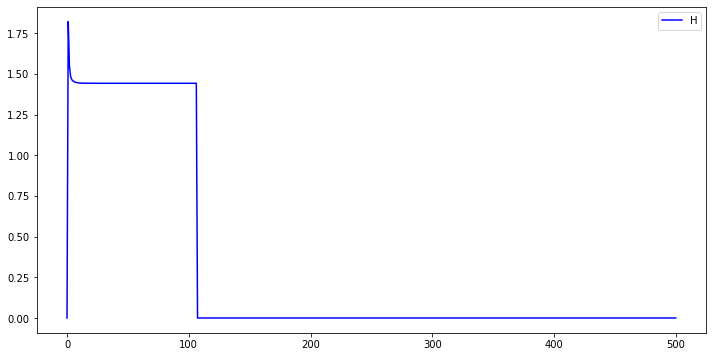

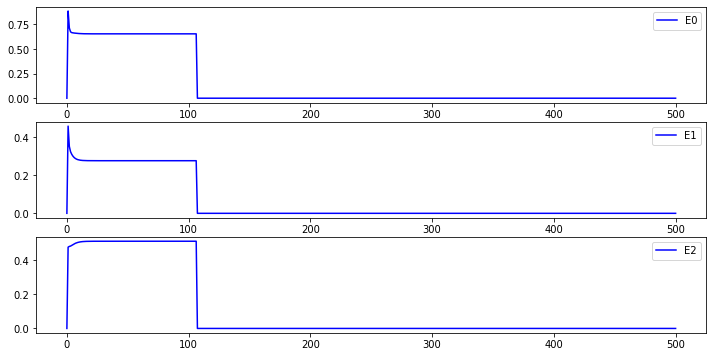

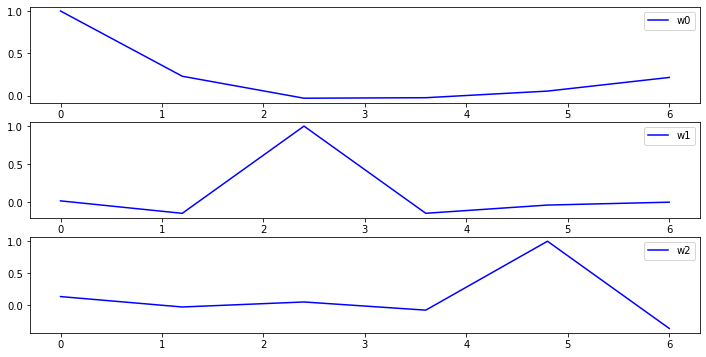

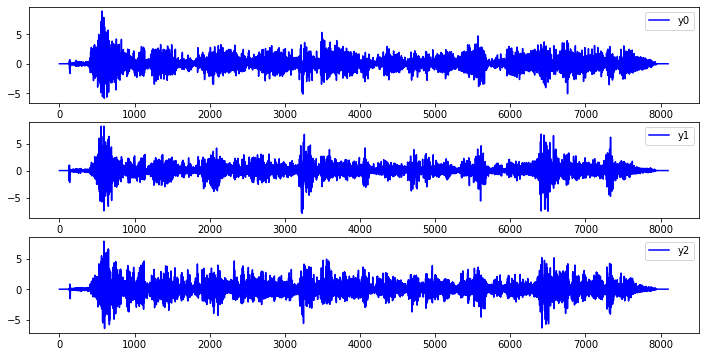

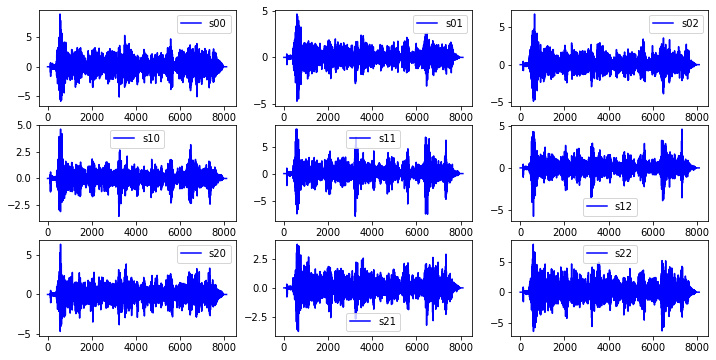

...

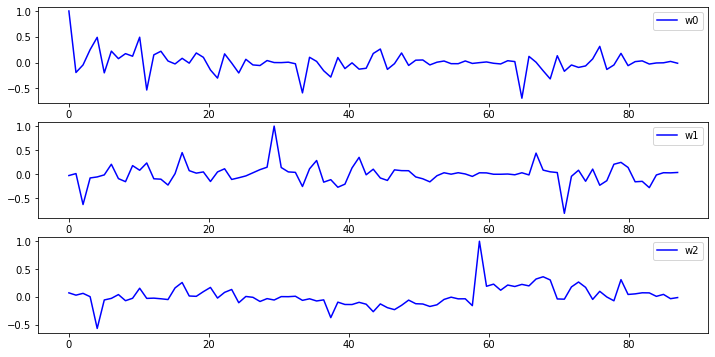

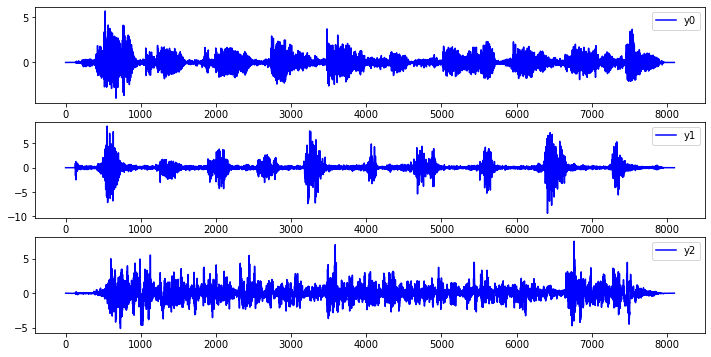

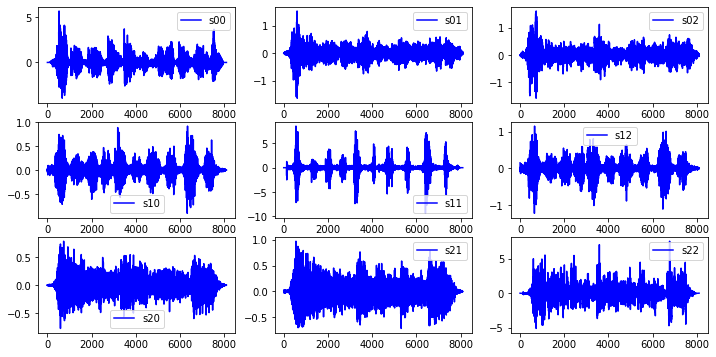

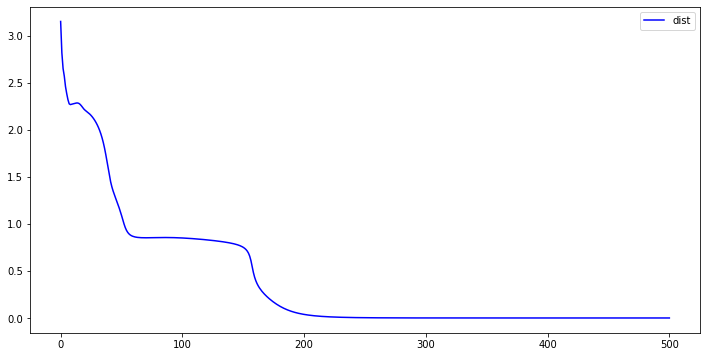

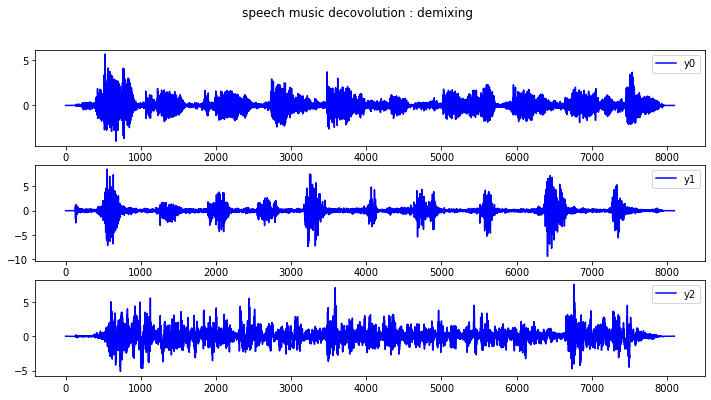

In [117]:
X =X_sim
[N,p] =X.shape
L =50
R=3*L
M=L
lda1=0.00
lda2=0.0
lda3=0.0
lda4=0.000
K=1.0
alpha=1.0

Ls =np.arange(2,30)
kurts =np.zeros((Ls.shape[0],p),dtype=float)
Ws     =np.zeros((Ls.shape[0],p,p))
for i in range(Ls.shape[0]): 
    L =Ls[i]
    R =3*L
    M =L
    print('i = ',i,' L = ',L)
    [a,b]=TimeDelayDecorrelation3(X=X,R=R,M=M,lda1=lda1,lda2=lda2,lda3=lda3,lda4=lda4,K=K,alpha=alpha)
    kurts[i] =a
    print('a shape ',a.shape)
    print('b shape ',b.shape)
    for m in range(p):
        for n in range(p):
            Ws[i,m,n] =np.argmax(np.abs(b[n*M:(n+1)*M,m]))

        

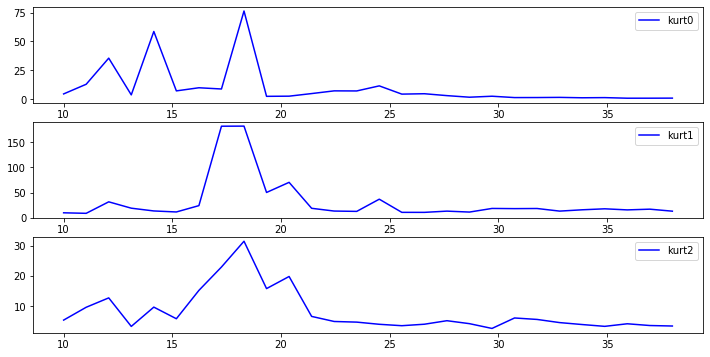

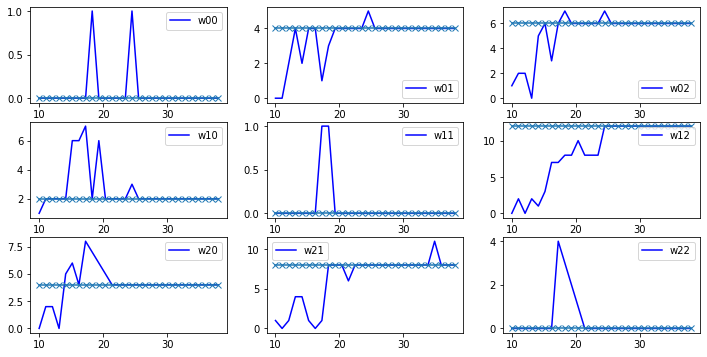

In [118]:
plt.subplots(figsize=(12,6))
for i in range(p):
    plt.subplot(p,1,i+1)
    plt.plot(10+np.linspace(0,Ls.shape[0],Ls.shape[0]),kurts[:,i],'-b',label='kurt'+str(i))
    plt.legend()

plt.subplots(figsize=(12,6))
for i in range(p):
    for j in range(p):
        plt.subplot(p,p,p*i+j+1)
        plt.plot(10+np.linspace(0,Ls.shape[0],Ls.shape[0]),Ws[:,i,j],'-b',label='w'+str(i)+str(j))
        plt.plot(10+np.linspace(0,Ls.shape[0],Ls.shape[0]),np.ones((Ls.shape[0],))*delay[i][j],'-x')
        plt.legend()
#看样子，虽然随着M变化对于延时的估计在变化，但是总体上是围绕在理想的值附近，是什么原因呢。该怎么描述呢。

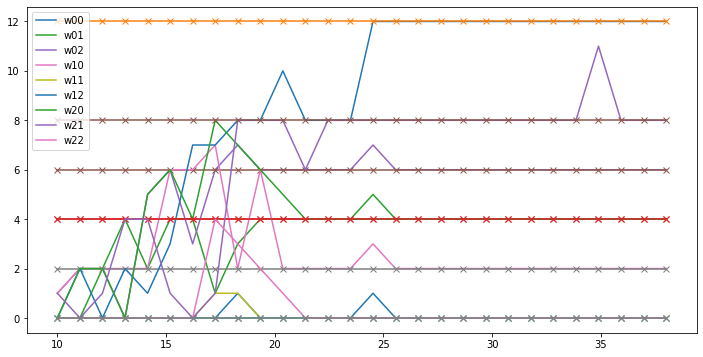

In [119]:
plt.subplots(figsize=(12,6))
for i in range(p):
    for j in range(p):
        plt.plot(10+np.linspace(0,Ls.shape[0],Ls.shape[0]),Ws[:,i,j],'-',label='w'+str(i)+str(j))
        plt.plot(10+np.linspace(0,Ls.shape[0],Ls.shape[0]),np.ones((Ls.shape[0],))*delay[i][j],'-x')
plt.legend()

In [262]:
"""
阵列声波慢度估计，首1位置需要变化。--->这样的话就不再能区分信号？因为首1位置相同。--->按照不相关性质应该不会出现找出相同波形。
效果不好，所以至少在某些数据上效果好点这样才能发文章？-->现在到头来连测试数据都没有，可笑。
总是找到同一个波形。--->即使两个波形之间相关很小。-->应该是相关系数很小才合适，或者限制下w的值得.:相关很小但是相关系数很大。
--->原因是太多的零填充，导致实际数据变的不再重要。
得到的结果十分的wiggly是不是要增加些约束？
结果不是很好，看来是不行的。

很重要的问题错了：应该是非因果滤波器所有的，自己这里照搬前面代码，出错。模型表达能力不够。
模型表达能力不够，是获得权重向量变的振荡的原因吗？
代价函数为什么不降低。
各个通道的对应原始信号的增益，对于结果有没有影响？
根据推倒的公式，必须满足d1<d2<d3,才能保证非因果滤波器能够包含真实模型。
是不是也受到迭代次数的影响。在bss可行是下降到[2.86686234e-14 1.36533754e-14 2.84276209e-14]
经过实验看来不是迭代次数问题，是方法本身代价函数就不会下降很多。是不是因为首1缘故，总是保持有那么点相关性存在。

怎么避免权重向量的振荡？-->代价函数不下降，权重向量反复振荡。

各个延迟之间差别十分的小，所以导致各个观测信号基本上是一样的？
迭代数到10000和迭代数到500差别不大，看来不是迭代不够问题，是方法本身能力或者是测试数据。

这些问题感觉，存在十分简单的EM算法可以迭代出结果--->沿着这个思路又是一篇论文。
"""
def TimeDelayDecorrelation12(X,M=25,R=25,lda1=0.0,lda2=0.0,lda3=0.0,lda4=0.0,K=1.0,alpha=1.0):
    [N,p]=X.shape
    X1=np.zeros((N+2*M,p),dtype=float)
    X1[M:N+M,:]=X.copy()
    X1 =(X1-np.mean(X1,axis=0))/np.std(X1,axis=0)
    XX =np.zeros((N+2*R,p*M),dtype=float)
    W =np.zeros((p*M,p),dtype=float)
    for i in range(N):
        for j in range(p):
            XX[R+i,j*M:(j+1)*M]=X1[i+M:i+2*M,j]
    print('before rank(XX) ',np.linalg.matrix_rank(XX))   #计算出来白化前后矩阵是满列秩的，这和我之前想的不一样啊
    #XX[R:R+N,:]=whiten(XX[R:R+N,:])    #需要白化。
    print('after  rank(XX) ',np.linalg.matrix_rank(XX))

    for i in range(p):
        for j in range(p):
            W[j*M,i]=1.0   
    W_last =np.zeros((p*M,p),dtype=float)
    
    Rs =np.zeros((2*R+1,p*M,p*M),dtype=float)
    for i in range(N):
        for l in range(2*R+1):
            Rs[l,:,:] =Rs[l,:,:] +XX[R+i,:][:,np.newaxis]@XX[R+i+l-R,:][np.newaxis,:]
    Rs =Rs/N
    
    maxiters =500
    k =-1
    tol=1e-14
    eta =0.01
    alpha=0.05
    t0 =maxiters/20
    H =np.zeros((maxiters,),dtype=float)
    E =np.zeros((maxiters,p),dtype=float)
    B=np.zeros((p*M,p*M),dtype=float)
    G=np.zeros((p*M,p*M),dtype=float)
    mask =np.zeros((p,),dtype=bool)
    order =np.arange(p)
    Ws =np.zeros((maxiters,p*M,p),dtype=float)
    
    

    while(np.linalg.norm(W-W_last)>tol):
        if(k==(maxiters-1)):
            break
        else:
            k =k +1
        print('k ',k,' ',np.linalg.norm(W-W_last))
        #print('W \n\r',W)

        W_last =W.copy()

        for i in range(p):

            Q =np.zeros((p*M,p*M),dtype=float)
            for j in range(p):
                if(j!=i):
                    Q =Q +W[:,j][:,np.newaxis]@W[:,j][np.newaxis,:]
            
            G =np.zeros((p*M,p*M),dtype=float)
            for l in range(2*R+1):
                G =G +Rs[l,:,:]@Q@Rs[2*R-l,:,:]
                #print('R[',l-M,'] ',W[:,i][np.newaxis,:]@(Rs[l,:,:]@Q@Rs[2*R-l,:,:])@W[:,i][:,np.newaxis])
            
            #G =G+lda1*D.T@D+lda2*F.T@F+lda3*Z.T@Z
            #print('norm(G-G.T) ',np.linalg.norm(G-G.T))  #是对称矩阵
            
            ww =np.zeros((p*M,1),dtype=float)
            ww[0,0]=1.0
            
            Gn =np.zeros((p*M,p*M),dtype=float)
            index12=0
            index21=0
            index22=0
            
            """
            for m in range(p):
                for n in range(p):
                    if(m==i and n==i):
                        Gn[0:M,0:M] =G[m*M:(m+1)*M,n*M:(n+1)*M]
                    elif(m==i and n!=i):
                        c =index12%(p-1)
                        Gn[0:M,(c+1)*M:(c+2)*M]=G[m*M:(m+1)*M,n*M:(n+1)*M]
                        index12 =index12+1
                    elif(m!=i and n==i):
                        r =index21%(p-1)
                        Gn[(r+1)*M:(r+2)*M,0:M]=G[m*M:(m+1)*M,n*M:(n+1)*M]
                        index21 =index21+1
                    else:
                        r =index22//(p-1)
                        c =index22%(p-1)
                        Gn[(r+1)*M:(r+2)*M,(c+1)*M:(c+2)*M]=G[m*M:(m+1)*M,n*M:(n+1)*M]
                        index22 =index22+1
            """
            Gn =G
            
            G11=Gn[0,0]
            G12=Gn[0,1:p*M]
            G21=Gn[1:p*M,0]
            G22=Gn[1:p*M,1:p*M]
            I =np.eye(p*M-1)
            
            """
            ww_last =np.random.normal(loc=0,scale=1.0,size=(p*M,1))
            ww_last[0,0]=1.0
            tol =1e-5
            eps =1e-16
            eta =0.00005  #学习率设置问题，太大太小，影响收敛
            while(np.linalg.norm(ww-ww_last)>tol):
                print('norm(w-w_last) ',np.linalg.norm(ww-ww_last))
                ww_last[1:p*M,0]=ww[1:p*M,0].copy()
                dww =2*G21+(2*G22@(ww_last[1:p*M]))[:,0]+alpha*(ww_last[1:p*M,0]/(eps+abs(ww_last[1:p*M,0])))
                ww[1:p*M,0] =ww_last[1:p*M,0]-eta*dww
            print('ww ',ww)
            """
                
                
            
            ww[1:p*M,0] =(-1.0*np.linalg.inv(G22+G22.T)@(G21[:,np.newaxis]+G12[np.newaxis,:].T))[:,0]
            
            W[:,i]=ww[:,0].copy() 
            """
            index0 =0
            for j in range(p):
                if(j==i):
                    W[i*M:(i+1)*M,i]=ww[0:M,0]*1.0
                else:
                    W[j*M:(j+1)*M,i]=ww[(index0+1)*M:(index0+2)*M,0]*1.0
                    index0 =index0+1
                
            """      
                        
            
            
          
            
        
            E[k,i] =(W[:,i][np.newaxis,:]@G@W[:,i][:,np.newaxis])[0][0]
            

            
        H[k] =np.sum(E[k,:])
        

        Ws[k,:,:]=W.copy()
        print('H ',H[k])
        print('E ',E[k,:])
        
    E[0,:]=0.0
    H[0]=0
    plt.subplots(figsize=(12,6))
    plt.plot(np.linspace(0,maxiters,maxiters),H,'-b',label='H')
    plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,maxiters,maxiters),E[:,i],'-b',label=('E'+str(i)))
        plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,W.shape[0],W.shape[0]),W[:,i],'-b',label=('w'+str(i)))
        plt.legend()
    
    y =XX[R:N+R]@W
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,y.shape[0],y.shape[0]),y[:,i],'-b',label=('y'+str(i)))
        plt.legend()
        
    
    for i in range(p):
        for j in range(i+1,p):
            print('corr[',i,',',j,'] ',np.sum(y[:,i]*y[:,j])/(np.linalg.norm(y[:,i])*np.linalg.norm(y[:,j])))
        
    #这段代码什么意思，都忘了。
    
    Xy =np.zeros((N+4*R,4*R+1),dtype=float)
    yy =np.zeros((N,p*p),dtype=float)
    for i in range(p):
        Xy =0*Xy
        for j in range(4*R+1):
            Xy[j:N+j,j]=y[:,i]
        beta =np.linalg.pinv(Xy[2*R:N+2*R,:])@X
        yy[:,i*p:(i+1)*p] =Xy[2*R:N+2*R,:]@beta
    
    plt.subplots(figsize=(12,6))
    for i in range(p*p):
        plt.subplot(p,p,i+1)
        plt.plot(np.linspace(0,N,N),yy[:,i],'-b',label=('s'+str(int(i/3))+str(int(i%3))))
        plt.legend()
    
    dist =np.zeros((maxiters,),dtype=float)
    for i in range(maxiters):
        dist[i]=np.linalg.norm(Ws[i]-W)
    
    plt.subplots(figsize=(12,6))
    plt.plot(np.linspace(0,maxiters,maxiters),dist,'-b',label='dist')
    plt.legend()
    

    
        
    
    return W

In [254]:
X =X_sim
[N,p] =X.shape
L =50
R=p*L
M=L
lda1=0.00
lda2=0.0
lda3=0.0
lda4=0.000
K=1.0
alpha=1.0

Ls =np.arange(15,40)
Ws     =np.zeros((Ls.shape[0],p,p))
for i in range(Ls.shape[0]): 
    L =Ls[i]
    M =L+L+1
    R =p*M
    print('i = ',i,' L = ',L)
    b=TimeDelayDecorrelation12(X=X,R=R,M=M,lda1=lda1,lda2=lda2,lda3=lda3,lda4=lda4,K=K,alpha=alpha)
    print('b shape ',b.shape)
    for m in range(p):
        for n in range(p):
            Ws[i,m,n] =np.argmax(np.abs(b[n*M:(n+1)*M,m]))

i =  0  L =  15
before rank(XX)  93
after  rank(XX)  93


KeyboardInterrupt: 

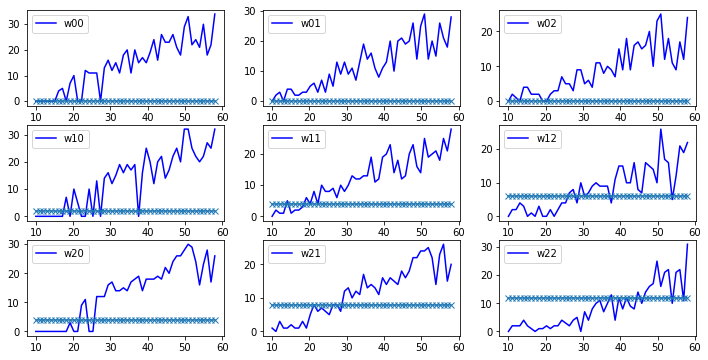

In [138]:
plt.subplots(figsize=(12,6))
for i in range(p):
    for j in range(p):
        plt.subplot(p,p,p*i+j+1)
        plt.plot(10+np.linspace(0,Ls.shape[0],Ls.shape[0]),Ws[:,i,j],'-b',label='w'+str(i)+str(j))
        plt.plot(10+np.linspace(0,Ls.shape[0],Ls.shape[0]),np.ones((Ls.shape[0],))*delay[i][j],'-x')
        plt.legend()
#看样子，虽然随着M变化对于延时的估计在变化，但是总体上是围绕在理想的值附近，是什么原因呢。该怎么描述呢。

In [164]:
#G和G.T差别太大，理论上它们应该相等。现在差别很大。
#结果很不好。
#L>=3*d3
#怎么权重，w11,w12,w13很多相同，就是某个向量的平移。
#什么原因使得代价函数不是减小而是增加？--->权重值极大。
#分析不清楚原因的课题，真心做的恶心，完全摸不着边，很不可靠。---->一个经验教训。
def TimeDelayDecorrelation13(X,M=25,R=25,lda1=0.0,lda2=0.0,lda3=0.0,lda4=0.0,K=1.0,alpha=1.0):
    [N,p]=X.shape
    L=(M-1)//2
    X1=np.zeros((N+2*R+1,p),dtype=float)
    X1[R:N+R,:]=X.copy()
    X1 =(X1-np.mean(X1,axis=0))/np.std(X1,axis=0)
    XX =np.zeros((N+2*R+1,p*M),dtype=float)
    W =np.zeros((p*M,p),dtype=float)
    for i in range(N):
        for j in range(p):
            XX[R+i,j*M:(j+1)*M] =X1[R+i-L:R+i+L+1,j]
            
    print('before rank(XX) ',np.linalg.matrix_rank(XX))   #计算出来白化前后矩阵是满列秩的，这和我之前想的不一样啊
    #XX[R:R+N,:]=whiten(XX[R:R+N,:])    #需要白化。
    print('after  rank(XX) ',np.linalg.matrix_rank(XX))
    for i in range(p):
        for j in range(p):
            W[j*M,i]=1.0
        
    W_last =np.zeros((p*M,p),dtype=float)
    
    Rs =np.zeros((2*R+1,p*M,p*M),dtype=float)
    for i in range(N):
        for l in range(2*R+1):
            Rs[l,:,:] =Rs[l,:,:] +XX[R+i,:][:,np.newaxis]@XX[R+i+l-R,:][np.newaxis,:]
    Rs =Rs/N
    for l in range(2*R+1):
        print('Rs[',l,'] ',np.linalg.norm(Rs[l,:,:]-Rs[l,:,:].T))
    
    maxiters =200
    k =-1
    tol=1e-14
    eta =0.01
    alpha=0.05
    t0 =maxiters/20
    H =np.zeros((maxiters,),dtype=float)
    E =np.zeros((maxiters,p),dtype=float)
    B=np.zeros((p*M,p*M),dtype=float)
    G=np.zeros((p*M,p*M),dtype=float)
    mask =np.zeros((p,),dtype=bool)
    order =np.arange(p)
    Ws =np.zeros((maxiters,p*M,p),dtype=float)
    
    


    while(np.linalg.norm(W-W_last)>tol):
        if(k==(maxiters-1)):
            break
        else:
            k =k +1
        print('k ',k,' ',np.linalg.norm(W-W_last))

        W_last =W.copy()

        for i in range(p):

            Q =np.zeros((p*M,p*M),dtype=float)
            for j in range(p):
                if(j!=i):
                    Q =Q +W[:,j][:,np.newaxis]@W[:,j][np.newaxis,:]
            
            G =np.zeros((p*M,p*M),dtype=float)
            for l in range(2*R+1):
                G =G +Rs[l,:,:]@Q@Rs[2*R-l,:,:]
            
            G =G
            print('norm(G-G.T) ',np.linalg.norm(G-G.T))  #是对称矩阵,在这里反而不再是对称矩阵
            
            ww =np.zeros((p*M,1),dtype=float)
            
            
            
            index =i*M+L
            print('index ',index)
            
            G11 = G[0:index,0:index]
            G12 = G[0:index,index][:,np.newaxis]
            G13 = G[0:index,index+1:p*M]
            G21 = G[index,0:index][np.newaxis,:]
            G22 = G[index,index]
            G23 = G[index,index+1:p*M][np.newaxis,:]
            G31 = G[index+1:p*M,0:index]
            G32 = G[index+1:p*M,index][:,np.newaxis]
            G33 = G[index+1:p*M,index+1:p*M]
            
            Gn =np.zeros((p*M-1,p*M-1),dtype=float)
            b  =np.zeros((p*M-1,1),dtype=float)
            Gn[0:index,0:index] =G11+G11.T
            Gn[0:index,index:(p*M-1)] =G13+G31.T
            Gn[index:(p*M-1),0:index] =G31+G13.T
            Gn[index:(p*M-1),index:(p*M-1)] =G33 +G33.T
            b[0:index] =-1.0*(G12+G21.T)
            b[index:(p*M-1)] =-1.0*(G32+G23.T)
            
            x_sol =np.linalg.inv(Gn)@b
            
            ww[0:index,0] =x_sol[0:index,0].copy()
            ww[index,0]=1.0
            ww[index+1:p*M,0]=x_sol[index:(p*M-1),0].copy()
            W[:,i] =ww[:,0].copy()
            
                    
                        
            
            
          
            
        
            E[k,i] =(W[:,i][np.newaxis,:]@G@W[:,i][:,np.newaxis])[0][0]
            

            
        H[k] =np.sum(E[k,:])
        

        Ws[k,:,:]=W.copy()
        print('H ',H[k])
        print('E ',E[k,:])
        
    E[0,:]=0
    H[0]=0
    plt.subplots(figsize=(12,6))
    plt.plot(np.linspace(0,maxiters,maxiters),H,'-b',label='H')
    plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,maxiters,maxiters),E[:,i],'-b',label=('E'+str(i)))
        plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,W.shape[0],W.shape[0]),W[:,i],'-b',label=('w'+str(i)))
        plt.legend()
    
    y =XX[R:N+R]@W
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,y.shape[0],y.shape[0]),y[:,i],'-b',label=('y'+str(i)))
        plt.legend()
        
    Xy =np.zeros((N+4*R,4*R+1),dtype=float)
    yy =np.zeros((N,p*p),dtype=float)
    for i in range(p):
        Xy =0*Xy
        for j in range(4*R+1):
            Xy[j:N+j,j]=y[:,i]
        beta =np.linalg.pinv(Xy[2*R:N+2*R,:])@y
        yy[:,i*p:(i+1)*p] =Xy[2*R:N+2*R,:]@beta
    
    plt.subplots(figsize=(12,6))
    for i in range(p*p):
        plt.subplot(p,p,i+1)
        plt.plot(np.linspace(0,N,N),yy[:,i],'-b',label=('s'+str(int(i/3))+str(int(i%3))))
        plt.legend()
    
    dist =np.zeros((maxiters,),dtype=float)
    for i in range(maxiters):
        dist[i]=np.linalg.norm(Ws[i]-W)
    
    plt.subplots(figsize=(12,6))
    plt.plot(np.linspace(0,maxiters,maxiters),dist,'-b',label='dist')
    plt.legend()
    

        
    
    return W

before rank(XX)  183
after  rank(XX)  183
k  0   3.0
H  0.0727460420428793
E  [0.0217292  0.04166698 0.00934986]
k  1   14.296672594334625
H  0.03020756312362394
E  [0.01283737 0.01091574 0.00645445]
k  2   3.20959224479446
H  0.021488653279843378
E  [0.00754701 0.00796818 0.00597346]
k  3   1.1398600330122721
H  0.018470070013980815
E  [0.00600814 0.00691647 0.00554545]
k  4   0.8639961225415997
H  0.01682085974016463
E  [0.00533754 0.00624635 0.00523697]
k  5   0.787269715482282
H  0.015621000751605354
E  [0.00489471 0.00573929 0.00498699]
k  6   0.9030031474319862
H  0.014760539459531768
E  [0.00459666 0.00540002 0.00476386]
k  7   0.6864936655041824
H  0.01412986356757433
E  [0.00441967 0.00513349 0.0045767 ]
k  8   0.4733410372443245
H  0.013610950228116946
E  [0.00428481 0.00490842 0.00441772]
k  9   0.3965289090649139
H  0.013162490840336306
E  [0.00416974 0.00471886 0.00427389]
k  10   0.4056894200626186
H  0.012769565630749404
E  [0.00406696 0.00456043 0.00414217]
k  11   0.40

H  0.008715592968974353
E  [0.00268559 0.00312745 0.00290256]
k  93   0.12117573535713737
H  0.00870184367679977
E  [0.00268382 0.00312525 0.00289277]
k  94   0.12369505986422548
H  0.008688000629859633
E  [0.00268214 0.00312301 0.00288285]
k  95   0.12578148661590105
H  0.008674161524775355
E  [0.00268058 0.00312072 0.00287286]
k  96   0.1272350847538618
H  0.008660484131361728
E  [0.00267925 0.00311844 0.0028628 ]
k  97   0.12831972061600733
H  0.008647090552814821
E  [0.00267821 0.00311624 0.00285264]
k  98   0.129827896995816
H  0.00863399566641447
E  [0.00267751 0.00311416 0.00284233]
k  99   0.13252142475130574
H  0.00862111687003345
E  [0.00267716 0.00311219 0.00283177]
k  100   0.13677798143031716
H  0.008608315015385901
E  [0.00267716 0.00311031 0.00282085]
k  101   0.1428034103765098
H  0.008595416248464613
E  [0.00267753 0.00310846 0.00280943]
k  102   0.15088640805908657
H  0.008582209697018566
E  [0.00267828 0.00310659 0.00279734]
k  103   0.16144247865903233
H  0.00856843

H  0.00796481529855932
E  [0.00253304 0.00289046 0.00254132]
k  184   0.07735865858741481
H  0.007952696922704923
E  [0.00252642 0.00288756 0.00253872]
k  185   0.0774445333039417
H  0.007939743220487499
E  [0.00251941 0.00288414 0.00253619]
k  186   0.07686227694203022
H  0.007925995150897928
E  [0.00251205 0.00288011 0.00253383]
k  187   0.07562047163182781
H  0.007911537402314813
E  [0.00250437 0.00287538 0.00253179]
k  188   0.0739013448341439
H  0.007896504077907445
E  [0.00249642 0.00286989 0.0025302 ]
k  189   0.07211158556771582
H  0.007881096050366002
E  [0.0024883  0.00286365 0.00252915]
k  190   0.07081184042112662
H  0.007865618015794443
E  [0.00248016 0.00285679 0.00252867]
k  191   0.07039445443928632
H  0.007850519343121927
E  [0.00247225 0.00284961 0.00252865]
k  192   0.07057524796542472
H  0.007836376969404129
E  [0.0024649  0.00284255 0.00252893]
k  193   0.07022211244102544
H  0.007823752663920993
E  [0.00245846 0.00283602 0.00252927]
k  194   0.06802652510738232
H 

H  0.0075906779221572695
E  [0.00237433 0.00272509 0.00249126]
k  274   0.011854604140332918
H  0.007589820261994635
E  [0.00237355 0.00272479 0.00249148]
k  275   0.011414034858676734
H  0.007589011531704652
E  [0.00237282 0.00272449 0.0024917 ]
k  276   0.011027804448440658
H  0.007588246189102452
E  [0.00237215 0.00272418 0.00249192]
k  277   0.010690065203884387
H  0.007587519476605669
E  [0.00237151 0.00272386 0.00249215]
k  278   0.01039551282336674
H  0.0075868272871533
E  [0.00237091 0.00272353 0.00249239]
k  279   0.01013934442433054
H  0.007586166057267984
E  [0.00237035 0.0027232  0.00249262]
k  280   0.009917227074683097
H  0.007585532676244357
E  [0.00236982 0.00272286 0.00249286]
k  281   0.009725260101513426
H  0.007584924412322996
E  [0.00236931 0.00272252 0.0024931 ]
k  282   0.009559950582387873
H  0.007584338853646259
E  [0.00236883 0.00272217 0.00249334]
k  283   0.009418181500099654
H  0.00758377385788256
E  [0.00236838 0.00272182 0.00249357]
k  284   0.00929718723

H  0.007526603573372424
E  [0.00235747 0.00268004 0.00248909]
k  364   0.019865717191256346
H  0.0075255723359599035
E  [0.00235715 0.00267962 0.0024888 ]
k  365   0.01974153341815045
H  0.0075245463889352295
E  [0.00235681 0.00267922 0.00248852]
k  366   0.01963119651776032
H  0.007523523194755344
E  [0.00235645 0.00267883 0.00248824]
k  367   0.01953881349482593
H  0.007522499957949842
E  [0.00235607 0.00267846 0.00248797]
k  368   0.019468290697463902
H  0.007521473615188047
E  [0.00235567 0.00267809 0.00248771]
k  369   0.019423397578316667
H  0.007520440815429439
E  [0.00235526 0.00267774 0.00248744]
k  370   0.019407847414028227
H  0.007519397885421169
E  [0.00235483 0.0026774  0.00248716]
k  371   0.019425398174392535
H  0.007518340781126214
E  [0.00235439 0.00267707 0.00248688]
k  372   0.019479971115345697
H  0.00751726502217081
E  [0.00235393 0.00267674 0.00248659]
k  373   0.01957578952390462
H  0.007516165612018786
E  [0.00235345 0.00267643 0.00248629]
k  374   0.0197175277

H  0.00727412227638014
E  [0.00228469 0.00260168 0.00238775]
k  454   0.05420744307758939
H  0.007270271177172114
E  [0.00228449 0.00259969 0.0023861 ]
k  455   0.05363258479969882
H  0.007266456143292133
E  [0.00228431 0.0025977  0.00238444]
k  456   0.05303088712409609
H  0.007262680990571365
E  [0.00228417 0.00259572 0.00238279]
k  457   0.05239185515198907
H  0.007258949922288087
E  [0.00228406 0.00259375 0.00238115]
k  458   0.05170526556677436
H  0.0072552674455389175
E  [0.00228397 0.00259179 0.00237951]
k  459   0.05096189642353185
H  0.007251638258631012
E  [0.00228389 0.00258985 0.00237789]
k  460   0.05015426159393323
H  0.0072480671174254725
E  [0.00228383 0.00258795 0.00237629]
k  461   0.049277280001454
H  0.007244558686969056
E  [0.00228378 0.00258607 0.00237471]
k  462   0.048328808628921166
H  0.007241117391127263
E  [0.00228372 0.00258423 0.00237316]
k  463   0.04730996665991394
H  0.007237747272355863
E  [0.00228367 0.00258244 0.00237164]
k  464   0.04622520101661483

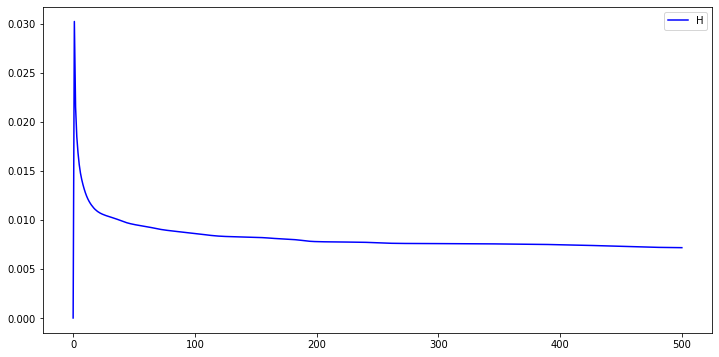

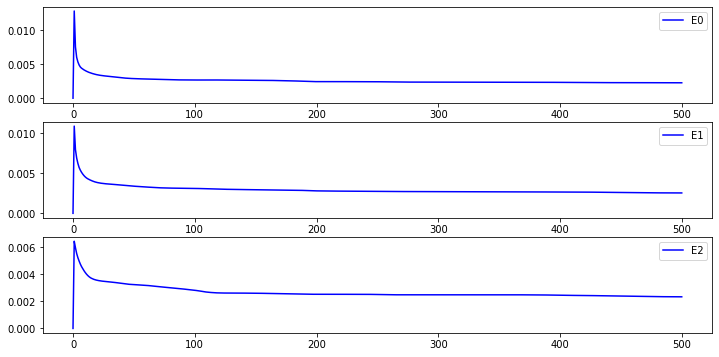

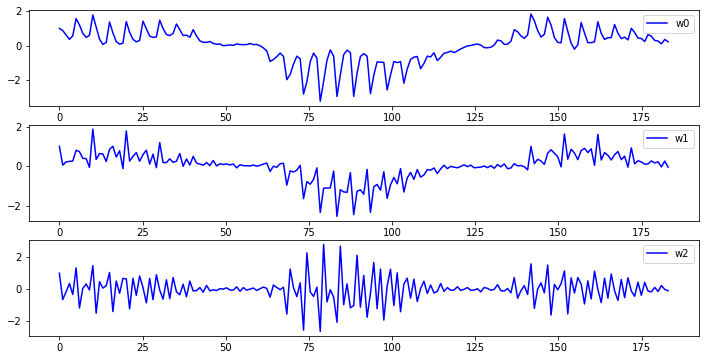

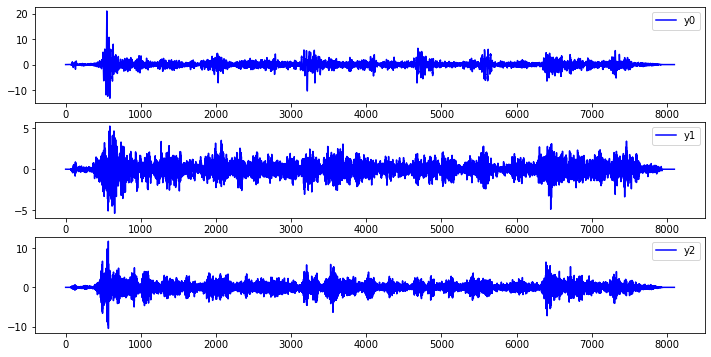

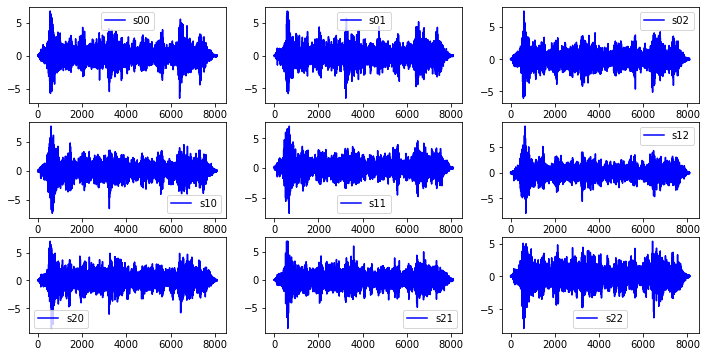

...

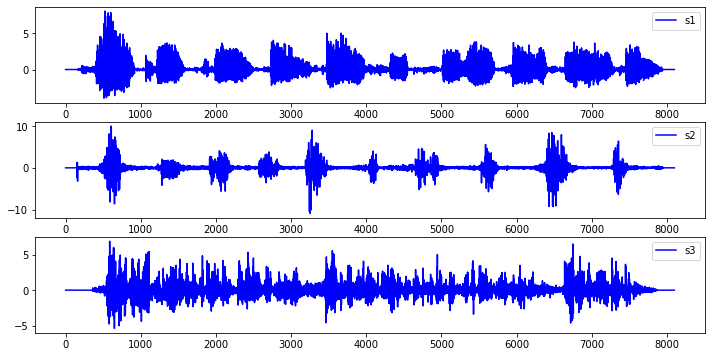

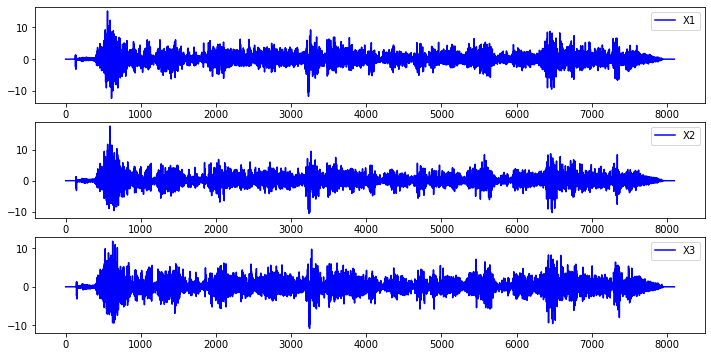

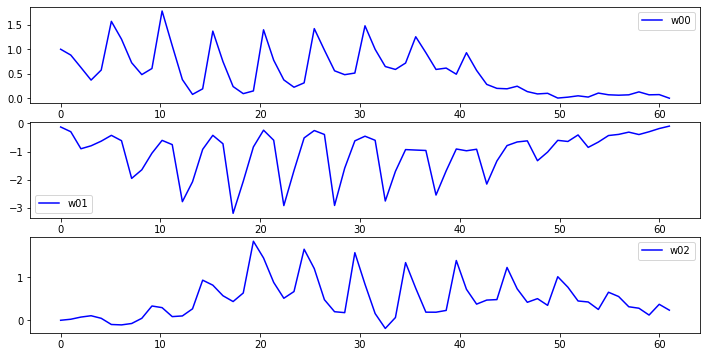

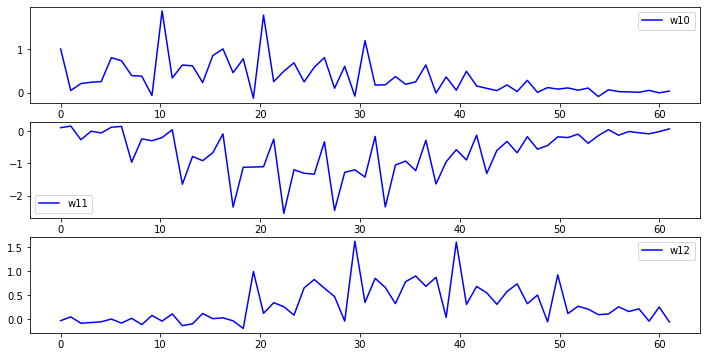

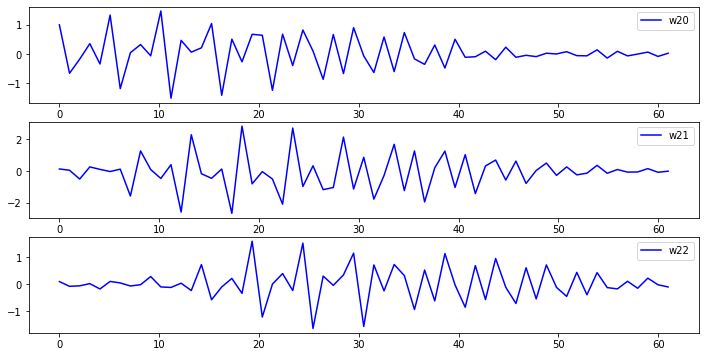

In [274]:
X =X_sim
L =30
M=L+L+1
R =3*M
lda1=0.00
lda2=0.0
lda3=0.0
lda4=0.000
K=1.0
alpha=0.000
W=TimeDelayDecorrelation12(X=X,R=R,M=M,lda1=lda1,lda2=lda2,lda3=lda3,lda4=lda4,K=K,alpha=alpha)
print('W ',W)
print('shape(X) ',X.shape)
plt.subplots(figsize=(12,6))
plt.subplot(3,1,1)
plt.plot(np.linspace(0,x11.shape[0],x11.shape[0]),x11,'-b',label='s1')
plt.legend()
plt.subplot(3,1,2)
plt.plot(np.linspace(0,x22.shape[0],x22.shape[0]),x22,'-b',label='s2')
plt.legend()
plt.subplot(3,1,3)
plt.plot(np.linspace(0,x33.shape[0],x33.shape[0]),x33,'-b',label='s3')
plt.legend()
plt.subplots(figsize=(12,6))
plt.subplot(3,1,1)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,0],'-b',label='X1')
plt.legend()
plt.subplot(3,1,2)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,1],'-b',label='X2')
plt.legend()
plt.subplot(3,1,3)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,2],'-b',label='X3')
plt.legend()
for i in range(X.shape[1]):
    plt.subplots(figsize=(12,6))
    for j in range(X.shape[1]):
        plt.subplot(X.shape[1],1,j+1)
        plt.plot(np.linspace(0,M,M),W[j*M:(j+1)*M,i],'-b',label='w'+str(i)+str(j))
        plt.legend()


In [275]:
max_index =np.zeros((X.shape[1],X.shape[1]*M))
print('max_index shape ',max_index.shape)
for i in range(X.shape[1]):
    for j in range(X.shape[1]):
        max_index[i,j*M+delay[i][j]]=0.8
        print('w',i,j,' max index : ',np.argmax(abs(W[j*M:(j+1)*M,i])))

max_index shape  (3, 183)
w 0 0  max index :  10
w 0 1  max index :  17
w 0 2  max index :  19
w 1 0  max index :  10
w 1 1  max index :  22
w 1 2  max index :  29
w 2 0  max index :  11
w 2 1  max index :  18
w 2 2  max index :  25


In [203]:
#迭代500次
max_index shape  (3, 123)
w 0 0  max index :  0
w 0 1  max index :  12
w 0 2  max index :  17
w 1 0  max index :  9
w 1 1  max index :  13
w 1 2  max index :  17
w 2 0  max index :  0
w 2 1  max index :  9
w 2 2  max index :  15

SyntaxError: invalid syntax (<ipython-input-203-14631c441ea7>, line 2)

In [279]:
#方法不行。
def TimeDelayDecorrelation14(X,M=25,R=25,lda1=0.0,lda2=0.0,lda3=0.0,lda4=0.0,K=1.0,alpha=1.0):
    [N,p]=X.shape
    X1=np.zeros((N+2*M,p),dtype=float)
    X1[M:N+M,:]=X.copy()
    X1 =(X1-np.mean(X1,axis=0))/np.std(X1,axis=0)
    XX =np.zeros((N+2*R,p*M),dtype=float)
    W =np.zeros((p*M,p),dtype=float)
    for i in range(N):
        for j in range(p):
            XX[R+i,j*M:(j+1)*M]=X1[i+1:i+M+1,j]
    print('before rank(XX) ',np.linalg.matrix_rank(XX))   #计算出来白化前后矩阵是满列秩的，这和我之前想的不一样啊
    XX[R:R+N,:]=whiten(XX[R:R+N,:])    #需要白化。
    print('after  rank(XX) ',np.linalg.matrix_rank(XX))

    for i in range(p):
        for j in range(p):
            W[j*M,i]=1.0   
    W_last =np.zeros((p*M,p),dtype=float)
    
    Rs =np.zeros((2*R+1,p*M,p*M),dtype=float)
    for i in range(N):
        for l in range(2*R+1):
            Rs[l,:,:] =Rs[l,:,:] +XX[R+i,:][:,np.newaxis]@XX[R+i+l-R,:][np.newaxis,:]
    Rs =Rs/N
    
    maxiters =500
    k =-1
    tol=1e-14
    eta =0.01
    alpha=0.05
    t0 =maxiters/20
    H =np.zeros((maxiters,),dtype=float)
    E =np.zeros((maxiters,p),dtype=float)
    B=np.zeros((p*M,p*M),dtype=float)
    G=np.zeros((p*M,p*M),dtype=float)
    mask =np.zeros((p,),dtype=bool)
    order =np.arange(p)
    Ws =np.zeros((maxiters,p*M,p),dtype=float)
    
    

    while(np.linalg.norm(W-W_last)>tol):
        if(k==(maxiters-1)):
            break
        else:
            k =k +1
        print('k ',k,' ',np.linalg.norm(W-W_last))
        #print('W \n\r',W)

        W_last =W.copy()

        for i in range(p):

            Q =np.zeros((p*M,p*M),dtype=float)
            for j in range(p):
                if(j!=i):
                    Q =Q +W[:,j][:,np.newaxis]@W[:,j][np.newaxis,:]
            
            G =np.zeros((p*M,p*M),dtype=float)
            for l in range(2*R+1):
                G =G +Rs[l,:,:]@Q@Rs[2*R-l,:,:]
                #print('R[',l-M,'] ',W[:,i][np.newaxis,:]@(Rs[l,:,:]@Q@Rs[2*R-l,:,:])@W[:,i][:,np.newaxis])
            
            #G =G+lda1*D.T@D+lda2*F.T@F+lda3*Z.T@Z
            #print('norm(G-G.T) ',np.linalg.norm(G-G.T))  #是对称矩阵
            
            ww =np.zeros((p*M,1),dtype=float)
            
            
            Gn =np.zeros((p*M,p*M),dtype=float)
            index12=0
            index21=0
            index22=0
            
            """
            for m in range(p):
                for n in range(p):
                    if(m==i and n==i):
                        Gn[0:M,0:M] =G[m*M:(m+1)*M,n*M:(n+1)*M]
                    elif(m==i and n!=i):
                        c =index12%(p-1)
                        Gn[0:M,(c+1)*M:(c+2)*M]=G[m*M:(m+1)*M,n*M:(n+1)*M]
                        index12 =index12+1
                    elif(m!=i and n==i):
                        r =index21%(p-1)
                        Gn[(r+1)*M:(r+2)*M,0:M]=G[m*M:(m+1)*M,n*M:(n+1)*M]
                        index21 =index21+1
                    else:
                        r =index22//(p-1)
                        c =index22%(p-1)
                        Gn[(r+1)*M:(r+2)*M,(c+1)*M:(c+2)*M]=G[m*M:(m+1)*M,n*M:(n+1)*M]
                        index22 =index22+1
            """
            Gn =G
            
            G11=Gn[0:p*M-1,0:p*M-1]
            G12=Gn[0:p*M-1,p*M-1]
            G21=Gn[p*M-1,0:p*M-1]
            G22=Gn[p*M-1,p*M-1]
            I =np.eye(p*M-1)
            
            """
            ww_last =np.random.normal(loc=0,scale=1.0,size=(p*M,1))
            ww_last[0,0]=1.0
            tol =1e-5
            eps =1e-16
            eta =0.00005  #学习率设置问题，太大太小，影响收敛
            while(np.linalg.norm(ww-ww_last)>tol):
                print('norm(w-w_last) ',np.linalg.norm(ww-ww_last))
                ww_last[1:p*M,0]=ww[1:p*M,0].copy()
                dww =2*G21+(2*G22@(ww_last[1:p*M]))[:,0]+alpha*(ww_last[1:p*M,0]/(eps+abs(ww_last[1:p*M,0])))
                ww[1:p*M,0] =ww_last[1:p*M,0]-eta*dww
            print('ww ',ww)
            """
                
                
            ww[p*M-1,0]=1.0
            ww[0:p*M-1,0] =(-1.0*np.linalg.inv(G11+G11.T)@(G12[:,np.newaxis]+G21[np.newaxis,:].T))[:,0]
            
            W[:,i]=ww[:,0].copy() 
            """
            index0 =0
            for j in range(p):
                if(j==i):
                    W[i*M:(i+1)*M,i]=ww[0:M,0]*1.0
                else:
                    W[j*M:(j+1)*M,i]=ww[(index0+1)*M:(index0+2)*M,0]*1.0
                    index0 =index0+1
                
            """      
                        
            
            
          
            
        
            E[k,i] =(W[:,i][np.newaxis,:]@G@W[:,i][:,np.newaxis])[0][0]
            

            
        H[k] =np.sum(E[k,:])
        

        Ws[k,:,:]=W.copy()
        print('H ',H[k])
        print('E ',E[k,:])
        
    E[0,:]=0.0
    H[0]=0
    plt.subplots(figsize=(12,6))
    plt.plot(np.linspace(0,maxiters,maxiters),H,'-b',label='H')
    plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,maxiters,maxiters),E[:,i],'-b',label=('E'+str(i)))
        plt.legend()
    
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,W.shape[0],W.shape[0]),W[:,i],'-b',label=('w'+str(i)))
        plt.legend()
    
    y =XX[R:N+R]@W
    plt.subplots(figsize=(12,6))
    for i in range(p):
        plt.subplot(p,1,i+1)
        plt.plot(np.linspace(0,y.shape[0],y.shape[0]),y[:,i],'-b',label=('y'+str(i)))
        plt.legend()
        
    
    for i in range(p):
        for j in range(i+1,p):
            print('corr[',i,',',j,'] ',np.sum(y[:,i]*y[:,j])/(np.linalg.norm(y[:,i])*np.linalg.norm(y[:,j])))
        
    #这段代码什么意思，都忘了。
    
    Xy =np.zeros((N+4*R,4*R+1),dtype=float)
    yy =np.zeros((N,p*p),dtype=float)
    for i in range(p):
        Xy =0*Xy
        for j in range(4*R+1):
            Xy[j:N+j,j]=y[:,i]
        beta =np.linalg.pinv(Xy[2*R:N+2*R,:])@X
        yy[:,i*p:(i+1)*p] =Xy[2*R:N+2*R,:]@beta
    
    plt.subplots(figsize=(12,6))
    for i in range(p*p):
        plt.subplot(p,p,i+1)
        plt.plot(np.linspace(0,N,N),yy[:,i],'-b',label=('s'+str(int(i/3))+str(int(i%3))))
        plt.legend()
    
    dist =np.zeros((maxiters,),dtype=float)
    for i in range(maxiters):
        dist[i]=np.linalg.norm(Ws[i]-W)
    
    plt.subplots(figsize=(12,6))
    plt.plot(np.linspace(0,maxiters,maxiters),dist,'-b',label='dist')
    plt.legend()
    

    
        
    
    return W

before rank(XX)  183
after  rank(XX)  183
k  0   3.0
H  5.72495380996288
E  [0.14761848 1.78091482 3.7964205 ]
k  1   4.4493623477881075
H  3.4127525832732735
E  [1.22816985 1.21904828 0.96553446]
k  2   2.4924114050009423
H  1.139688549451232
E  [0.4485054  0.37695479 0.31422835]
k  3   1.915979165765179
H  0.35636337663555473
E  [0.15521567 0.08236623 0.11878147]
k  4   1.4395796866378652
H  0.18702459962894707
E  [0.08140191 0.03010929 0.0755134 ]
k  5   0.9186529902859024
H  0.13431385241661112
E  [0.06033041 0.01751966 0.05646379]
k  6   1.0178383184154143
H  0.0903359640821982
E  [0.04607875 0.01222657 0.03203064]
k  7   2.9545372587651446
H  0.03535111716616507
E  [0.02222945 0.0058078  0.00731387]
k  8   5.500807922734974
H  0.005531744963146833
E  [0.00402077 0.00080383 0.00070715]
k  9   5.336824550024095
H  0.0005295170984500547
E  [3.49626089e-04 7.87562142e-05 1.01134795e-04]
k  10   2.6117338381614417
H  8.006538576780072e-05
E  [5.28274738e-05 1.33500224e-05 1.38878895e-

H  2.643476677684178e-05
E  [2.83421598e-07 2.46110463e-05 1.54029886e-06]
k  83   46.65594381661488
H  1.1035133765959654e-05
E  [8.64453165e-06 1.92502310e-06 4.65579021e-07]
k  84   45.11475765093361
H  6.898625886881438e-06
E  [1.55306030e-06 5.04188859e-06 3.03676996e-07]
k  85   23.42907583416705
H  6.9504223302390106e-06
E  [1.67602667e-06 4.84755729e-06 4.26838367e-07]
k  86   25.15952795202859
H  7.002440702649502e-06
E  [3.31491274e-06 3.33914735e-06 3.48380607e-07]
k  87   23.136504089303738
H  6.23622374117515e-06
E  [1.70438533e-06 3.95949250e-06 5.72345917e-07]
k  88   34.67686859430133
H  3.9835771020090535e-06
E  [2.22910883e-06 1.48359272e-06 2.70875560e-07]
k  89   12.624839839428997
H  8.353009173136886e-06
E  [8.15226032e-07 6.93383071e-06 6.03952428e-07]
k  90   37.589697180772816
H  5.115667317459091e-06
E  [4.07969228e-06 7.85867823e-07 2.50107216e-07]
k  91   25.00321996052756
H  1.3208070934974169e-05
E  [5.49440839e-07 1.20269692e-05 6.31660906e-07]
k  92   23

H  6.797306790647968e-06
E  [3.18521938e-06 3.18190413e-06 4.30183280e-07]
k  163   25.6306023141704
H  2.4761419093160158e-05
E  [5.93311959e-07 2.25146675e-05 1.65343966e-06]
k  164   43.99663412630936
H  1.6372750330416182e-05
E  [1.53689481e-05 7.45850725e-07 2.57951485e-07]
k  165   49.93822076247283
H  6.3415641166321985e-06
E  [5.02066280e-07 5.07284734e-06 7.66650492e-07]
k  166   18.226373921702148
H  4.445435051493644e-06
E  [3.39712520e-06 7.51853733e-07 2.96456121e-07]
k  167   12.903695773665923
H  1.2140923121280267e-05
E  [5.40640340e-07 1.09230015e-05 6.77281319e-07]
k  168   26.227679801879415
H  6.81219552930341e-06
E  [5.98185897e-06 6.07146003e-07 2.23190559e-07]
k  169   22.62949670173517
H  1.4604813489704389e-05
E  [4.43532037e-07 1.36840899e-05 4.77191583e-07]
k  170   23.174199872141717
H  9.972987719620305e-06
E  [9.18989471e-06 6.09807967e-07 1.73285047e-07]
k  171   20.701355760782192
H  6.942963674775992e-05
E  [3.95249012e-07 6.41555063e-05 4.87888145e-06]

H  3.5483438672667024e-05
E  [4.98623944e-06 2.88775369e-05 1.61966237e-06]
k  243   42.397084892817226
H  1.2968630629208259e-05
E  [1.24801856e-05 3.38075607e-07 1.50369454e-07]
k  244   34.48618391193918
H  3.8979930653246545e-06
E  [2.29709931e-07 3.34247631e-06 3.25806821e-07]
k  245   26.310484311808796
H  1.106906863128381e-05
E  [1.73958449e-06 8.74818095e-06 5.81303184e-07]
k  246   29.22936610416191
H  1.5290851834287736e-05
E  [5.22347142e-06 9.40675834e-06 6.60622073e-07]
k  247   32.898772331364
H  1.0691222672631847e-05
E  [6.47656777e-06 3.82156017e-06 3.93094733e-07]
k  248   36.86873836184857
H  2.679752115395328e-05
E  [2.42772375e-06 2.12692403e-05 3.10055715e-06]
k  249   73.2254648704975
H  5.0580174333797066e-05
E  [1.42701679e-05 2.80526846e-05 8.25732187e-06]
k  250   157.26947026912669
H  0.00010174840498895993
E  [1.23689930e-05 5.78595152e-05 3.15198968e-05]
k  251   196.99148767696227
H  5.406037113409471e-05
E  [3.26840563e-05 2.04211955e-05 9.55119335e-07]

H  8.076779693285777e-06
E  [1.30650740e-06 6.15555708e-06 6.14715212e-07]
k  323   27.044165202224946
H  1.045398656800271e-05
E  [2.35038422e-06 7.48759083e-06 6.16011517e-07]
k  324   18.361068762036016
H  8.713669358726784e-06
E  [5.39477977e-06 2.97081258e-06 3.48077012e-07]
k  325   25.045277112341385
H  5.680081614033934e-06
E  [2.20875522e-06 3.09618349e-06 3.75142906e-07]
k  326   29.411808618191323
H  4.4889040537649534e-06
E  [1.77231329e-06 2.38345917e-06 3.33131595e-07]
k  327   29.908180463993155
H  3.5956406418388018e-06
E  [1.54861325e-06 1.76979224e-06 2.77235153e-07]
k  328   10.825028030821858
H  2.435305771811721e-06
E  [1.34671154e-06 9.18633867e-07 1.69960363e-07]
k  329   14.286742618568246
H  4.539294216521656e-06
E  [5.79365504e-07 3.49884280e-06 4.61085912e-07]
k  330   20.30973089778772
H  4.050467158195723e-06
E  [2.16210956e-06 1.70660174e-06 1.81755858e-07]
k  331   22.176304506551656
H  4.0103728647515567e-05
E  [6.43040096e-07 3.68619906e-05 2.59869790e-

H  5.326792825873388e-06
E  [3.19781763e-06 1.88491199e-06 2.44063207e-07]
k  403   11.328238430524479
H  3.1771221733209674e-06
E  [1.14143918e-06 1.84003917e-06 1.95643821e-07]
k  404   9.780176232389742
H  1.417600742921596e-05
E  [1.41149058e-06 1.10979184e-05 1.66659844e-06]
k  405   8.29395248228161
H  8.069277328152954e-06
E  [7.11572263e-06 7.27590582e-07 2.25964112e-07]
k  406   7.121807677121284
H  4.8938385768962325e-05
E  [3.97790094e-07 4.66689583e-05 1.87163737e-06]
k  407   48.74431981096301
H  2.5805104603429296e-05
E  [2.02292933e-05 5.16922670e-06 4.06584588e-07]
k  408   38.9198640403454
H  4.144226921704991e-06
E  [3.23704539e-06 6.75903162e-07 2.31278367e-07]
k  409   12.97882754356074
H  2.406172584008165e-05
E  [3.73514759e-07 2.25128073e-05 1.17540381e-06]
k  410   22.14777689837548
H  7.633206556943712e-06
E  [6.21069516e-06 1.07741552e-06 3.45095886e-07]
k  411   15.839549833291947
H  2.5490588079070732e-06
E  [8.84896759e-07 1.46344028e-06 2.00721766e-07]
k  

H  4.016398525064896e-06
E  [1.80338306e-06 1.89685273e-06 3.16162740e-07]
k  483   12.30964992990174
H  4.9281750864605624e-06
E  [1.27703991e-06 3.11025117e-06 5.40884003e-07]
k  484   28.174890563155664
H  1.5358391601206683e-05
E  [1.43718870e-06 1.26738480e-05 1.24735487e-06]
k  485   51.092549406003414
H  7.78378057358351e-06
E  [6.58175481e-06 9.74536627e-07 2.27489137e-07]
k  486   27.93985503917094
H  4.3989196598677986e-05
E  [5.18431316e-07 4.05629640e-05 2.90780125e-06]
k  487   41.76678352024582
H  2.6169635720216452e-05
E  [2.50830987e-05 4.76952625e-07 6.09584414e-07]
k  488   28.08163392543447
H  2.565918110773162e-05
E  [4.51500658e-07 2.47132954e-05 4.94385041e-07]
k  489   15.627249979865201
H  8.682788503685475e-06
E  [8.28537923e-06 2.07517754e-07 1.89891519e-07]
k  490   9.282811776140472
H  5.5121451103521646e-05
E  [1.19621746e-07 5.17720926e-05 3.22973679e-06]
k  491   28.57000372283879
H  1.7054156721219e-05
E  [1.58075273e-05 7.17838277e-07 5.28791107e-07]
k 

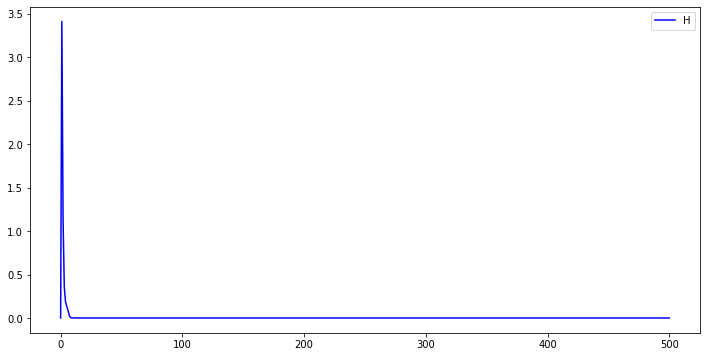

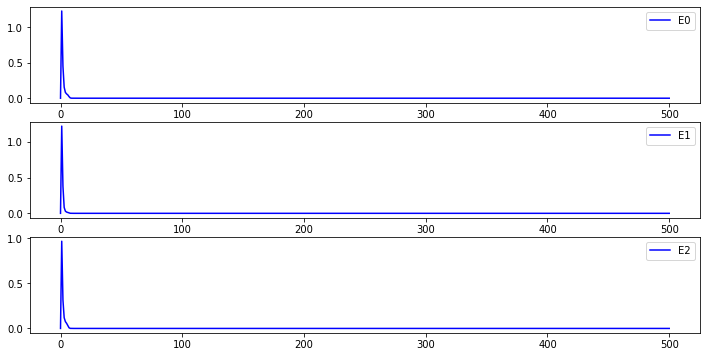

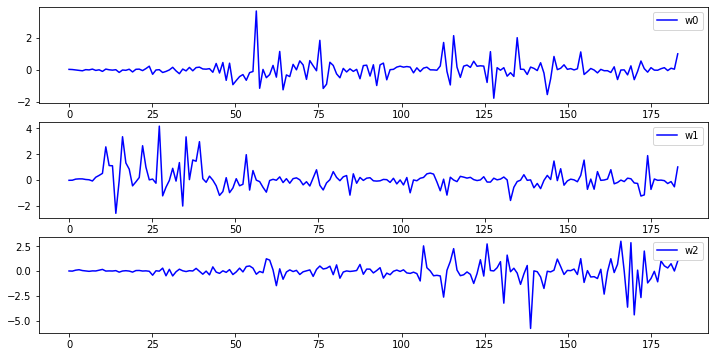

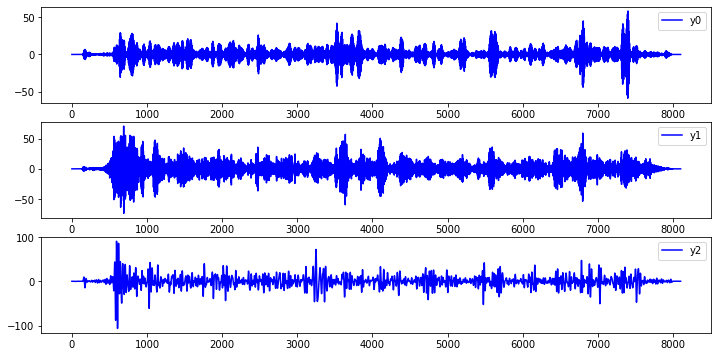

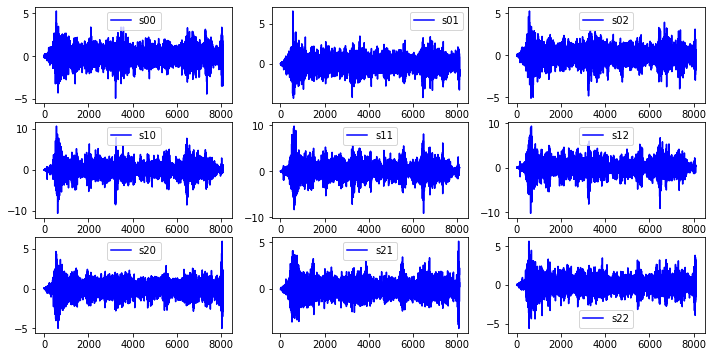

...

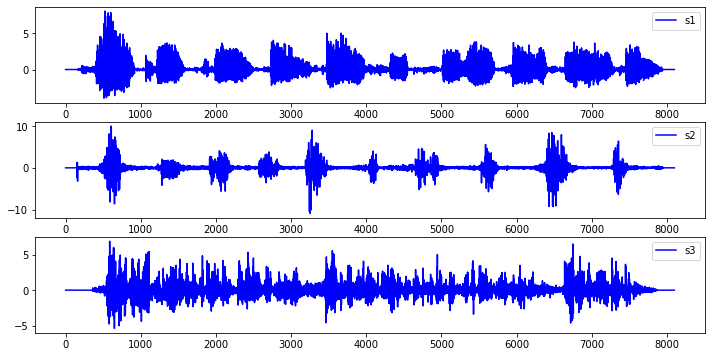

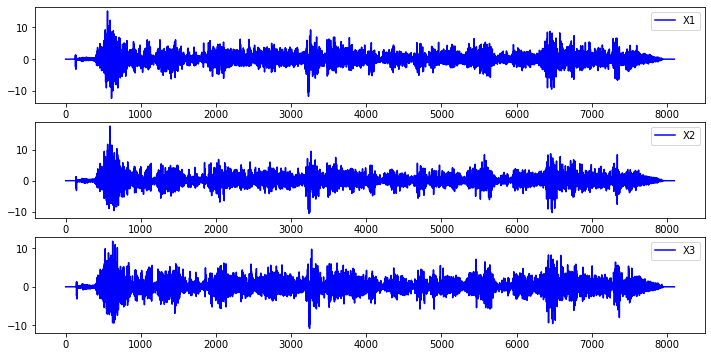

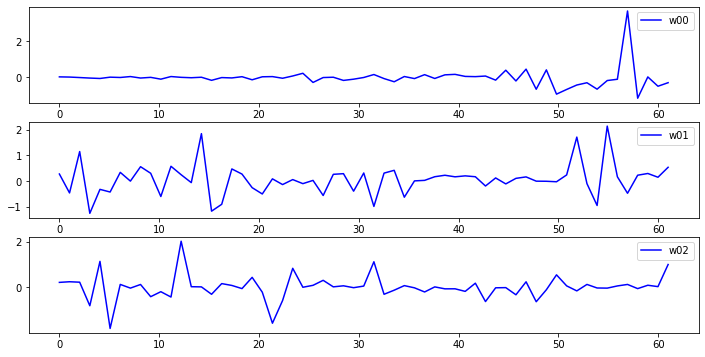

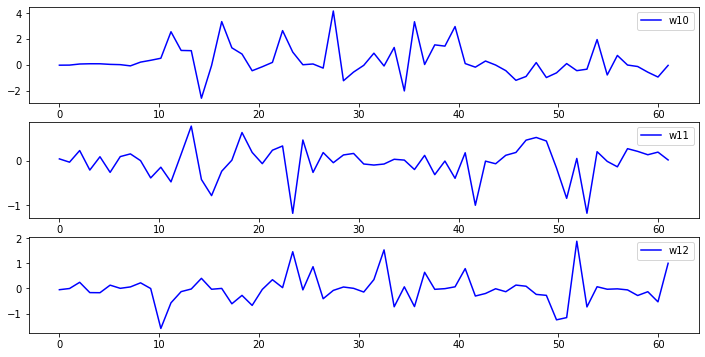

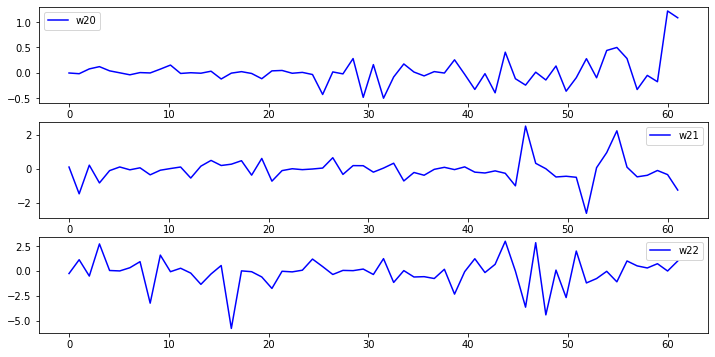

In [280]:
X =X_sim
L =30
M=L+L+1
R =3*M
lda1=0.00
lda2=0.0
lda3=0.0
lda4=0.000
K=1.0
alpha=0.000
W=TimeDelayDecorrelation14(X=X,R=R,M=M,lda1=lda1,lda2=lda2,lda3=lda3,lda4=lda4,K=K,alpha=alpha)
print('W ',W)
print('shape(X) ',X.shape)
plt.subplots(figsize=(12,6))
plt.subplot(3,1,1)
plt.plot(np.linspace(0,x11.shape[0],x11.shape[0]),x11,'-b',label='s1')
plt.legend()
plt.subplot(3,1,2)
plt.plot(np.linspace(0,x22.shape[0],x22.shape[0]),x22,'-b',label='s2')
plt.legend()
plt.subplot(3,1,3)
plt.plot(np.linspace(0,x33.shape[0],x33.shape[0]),x33,'-b',label='s3')
plt.legend()
plt.subplots(figsize=(12,6))
plt.subplot(3,1,1)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,0],'-b',label='X1')
plt.legend()
plt.subplot(3,1,2)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,1],'-b',label='X2')
plt.legend()
plt.subplot(3,1,3)
plt.plot(np.linspace(0,X.shape[0],X.shape[0]),X[:,2],'-b',label='X3')
plt.legend()
for i in range(X.shape[1]):
    plt.subplots(figsize=(12,6))
    for j in range(X.shape[1]):
        plt.subplot(X.shape[1],1,j+1)
        plt.plot(np.linspace(0,M,M),W[j*M:(j+1)*M,i],'-b',label='w'+str(i)+str(j))
        plt.legend()

In [281]:
max_index =np.zeros((X.shape[1],X.shape[1]*M))
print('max_index shape ',max_index.shape)
for i in range(X.shape[1]):
    for j in range(X.shape[1]):
        max_index[i,j*M+delay[i][j]]=0.8
        print('w',i,j,' max index : ',np.argmax(abs(W[j*M:(j+1)*M,i])))

max_index shape  (3, 183)
w 0 0  max index :  56
w 0 1  max index :  54
w 0 2  max index :  12
w 1 0  max index :  27
w 1 1  max index :  23
w 1 2  max index :  51
w 2 0  max index :  59
w 2 1  max index :  51
w 2 2  max index :  16
